In [409]:
import pandas
from pandas import read_excel, date_range, DatetimeIndex, DataFrame, to_numeric, concat, to_datetime
from pandas.plotting import lag_plot, autocorrelation_plot
from pandas.tseries.offsets import DateOffset

import numpy
from numpy import logical_not

import statistics
import dateutil.relativedelta
from dateutil.relativedelta import relativedelta

import fbprophet
from fbprophet import Prophet

import calendar
from calendar import monthrange

from datetime import datetime, timedelta
from matplotlib import pyplot

from sklearn.metrics import mean_absolute_error, mean_squared_error

from math import sqrt

In [410]:
# cambiamos el valor de estos 4 parametros para que nos muestre dataframes sin truncarlos
pandas.set_option('display.max_rows', 12)
# pandas.set_option('display.max_rows', None)
pandas.set_option('display.max_columns', None)
pandas.set_option('display.width', None)
pandas.set_option('display.max_colwidth', None)

In [411]:
# Load data using read_excel
transacciones_df = read_excel('20210513 mmelero (249236).xlsx', sheet_name='Hoja1')
transacciones_df

,Fecha transacción,Importe,ID Categoría,Nombre categoría,Nivel categoría,iD categoría padre,Nombre categoría padre,Proveedor,Marca,Sector,Financiero,Transferencia,Unnamed: 12,Unnamed: 13,ID,BALANCE,BALANCE_DATE
0,2020-07-24,-1.20,84.0,parking_84,2.0,5.0,vehiculos_5,NaN,NaN,NaN,False,False,NaN,NaN,249236.0,1478.98,2020-07-26
1,2020-07-23,-4.50,117.0,regalos_celebraciones_117,2.0,8.0,gastos_personales_8,NaN,NaN,NaN,False,False,NaN,NaN,NaN,NaN,NaT
2,2020-07-23,-13.53,70.0,supermercados_70,2.0,4.0,alimentacion_4,SPAR,SPAR,Supermercados,False,False,NaN,NaN,NaN,NaN,NaT
3,2020-07-22,-51.40,222.0,adsl_222,3.0,521.0,Comunicaciones y TV,Jazz Telecom,Jazztel,Compañías telecomunicaciones,False,False,NaN,NaN,NaN,NaN,NaT
4,2020-07-22,-11.00,70.0,supermercados_70,2.0,4.0,alimentacion_4,Mercadona,Mercadona,Supermercados,False,False,NaN,NaN,NaN,NaN,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482,2016-09-05,1533.02,18.0,retribucion_liquida_18,3.0,576.0,Nómina,NaN,NaN,NaN,False,False,NaN,NaN,NaN,NaN,NaT
1483,2016-09-05,-617.47,126.0,liquidacion_tarjeta_126,3.0,478.0,tarjetas_credito_478,NaN,NaN,NaN,True,True,NaN,NaN,NaN,NaN,NaT
1484,2016-09-05,-138.08,125.0,cuotas_125,3.0,127.0,otros_pasivos_127,NaN,NaN,NaN,True,False,NaN,NaN,NaN,NaN,NaT
1485,2016-09-01,-32.22,90.0,seguro_salud_90,2.0,6.0,salud_6,Sanitas S.A. de Seguros,Sanitas,Seguros de salud,True,False,NaN,NaN,NaN,NaN,NaT


In [412]:
# nos quedamos con categoría desde 'Fecha transacción' hasta 'Nombre Categoría'
transacciones_df=transacciones_df.iloc[:, 0:4]
transacciones_df

,Fecha transacción,Importe,ID Categoría,Nombre categoría
0,2020-07-24,-1.20,84.0,parking_84
1,2020-07-23,-4.50,117.0,regalos_celebraciones_117
2,2020-07-23,-13.53,70.0,supermercados_70
3,2020-07-22,-51.40,222.0,adsl_222
4,2020-07-22,-11.00,70.0,supermercados_70
...,...,...,...,...
1482,2016-09-05,1533.02,18.0,retribucion_liquida_18
1483,2016-09-05,-617.47,126.0,liquidacion_tarjeta_126
1484,2016-09-05,-138.08,125.0,cuotas_125
1485,2016-09-01,-32.22,90.0,seguro_salud_90


In [413]:
# nos quedamos con las transacciones de la categoría 'seguro_vehiculo_78'
transacciones_78_df = transacciones_df[transacciones_df['ID Categoría'] == 78.0]
del transacciones_df
transacciones_78_df

,Fecha transacción,Importe,ID Categoría,Nombre categoría
174,2019-10-11,-126.10,78.0,seguro_vehiculo_78
301,2019-04-10,-400.00,78.0,seguro_vehiculo_78
505,2018-10-11,-126.13,78.0,seguro_vehiculo_78
968,2017-10-11,-124.74,78.0,seguro_vehiculo_78
1455,2016-10-13,-123.10,78.0,seguro_vehiculo_78


In [414]:
# quitamos las columnas de 'ID Categoría' y 'Nombre Categoría' que ya no nos aportan nada
transacciones_78_df = transacciones_78_df.drop(columns=['ID Categoría', 'Nombre categoría'], inplace=False)
transacciones_78_df

,Fecha transacción,Importe
174,2019-10-11,-126.10
301,2019-04-10,-400.00
505,2018-10-11,-126.13
968,2017-10-11,-124.74
1455,2016-10-13,-123.10


In [415]:
# renombramos columnas
transacciones_78_df = transacciones_78_df.rename(columns={'Fecha transacción': 'FECHA', 'Importe': 'IMPORTE'},
                                                   inplace=False)
transacciones_78_df

,FECHA,IMPORTE
174,2019-10-11,-126.10
301,2019-04-10,-400.00
505,2018-10-11,-126.13
968,2017-10-11,-124.74
1455,2016-10-13,-123.10


In [416]:
# ordenamos las fechas por orden ascendente
transacciones_78_df = transacciones_78_df.sort_values(by=['FECHA'], ascending=True, inplace=False, ignore_index=True)
transacciones_78_df

,FECHA,IMPORTE
0,2016-10-13,-123.10
1,2017-10-11,-124.74
2,2018-10-11,-126.13
3,2019-04-10,-400.00
4,2019-10-11,-126.10


In [417]:
# vamos a agrupar los valores y sumarlos por fecha para agrupar cargos distintos realizados el mismo dia
transacciones_78_df = transacciones_78_df.groupby(['FECHA']).sum()
transacciones_78_df

,IMPORTE
FECHA,
2016-10-13,-123.10
2017-10-11,-124.74
2018-10-11,-126.13
2019-04-10,-400.00
2019-10-11,-126.10


In [418]:
"""
Hay un pago anual en octubre de 125 eur que debe ser el seguro de una moto.
Luego hay un pago en abril de 2019 de 400 eur que debe ser el seguro de un coche.
"""

'\nHay un pago anual en octubre de 125 eur que debe ser el seguro de una moto.\nLuego hay un pago en abril de 2019 de 400 eur que debe ser el seguro de un coche.\n'

In [419]:
# para que los datos sean más fáciles de interpretar vamos a hacerlos todos positivos multiplicándolos por '-1'
transacciones_78_df['IMPORTE'] = -transacciones_78_df['IMPORTE']
transacciones_78_df

,IMPORTE
FECHA,
2016-10-13,123.10
2017-10-11,124.74
2018-10-11,126.13
2019-04-10,400.00
2019-10-11,126.10


In [420]:
# vamos a rellenar las missing dates con el ultimo valor válido y comprobar si esa serie temporal es modelable y
# predecible

In [421]:
transacciones_78_importe_df = transacciones_78_df.copy()
transacciones_78_importe_df

,IMPORTE
FECHA,
2016-10-13,123.10
2017-10-11,124.74
2018-10-11,126.13
2019-04-10,400.00
2019-10-11,126.10


In [422]:
transacciones_78_importe_df['FECHA'] = transacciones_78_importe_df.index
transacciones_78_importe_df

,IMPORTE,FECHA
FECHA,,
2016-10-13,123.10,2016-10-13
2017-10-11,124.74,2017-10-11
2018-10-11,126.13,2018-10-11
2019-04-10,400.00,2019-04-10
2019-10-11,126.10,2019-10-11


In [423]:
idx = date_range(start=transacciones_78_importe_df.FECHA.min(), end=transacciones_78_importe_df.FECHA.max())
idx

DatetimeIndex(['2016-10-13', '2016-10-14', '2016-10-15', '2016-10-16',
               '2016-10-17', '2016-10-18', '2016-10-19', '2016-10-20',
               '2016-10-21', '2016-10-22',
               ...
               '2019-10-02', '2019-10-03', '2019-10-04', '2019-10-05',
               '2019-10-06', '2019-10-07', '2019-10-08', '2019-10-09',
               '2019-10-10', '2019-10-11'],
              dtype='datetime64[ns]', length=1094, freq='D')

In [424]:
transacciones_78_importe_df.index = DatetimeIndex(transacciones_78_importe_df.index)
transacciones_78_importe_df

,IMPORTE,FECHA
FECHA,,
2016-10-13,123.10,2016-10-13
2017-10-11,124.74,2017-10-11
2018-10-11,126.13,2018-10-11
2019-04-10,400.00,2019-04-10
2019-10-11,126.10,2019-10-11


In [425]:
transacciones_78_importe_df = transacciones_78_importe_df.reindex(idx, fill_value='NaN')
transacciones_78_importe_df

,IMPORTE,FECHA
2016-10-13,123.1,2016-10-13
2016-10-14,NaN,NaT
2016-10-15,NaN,NaT
2016-10-16,NaN,NaT
2016-10-17,NaN,NaT
...,...,...
2019-10-07,NaN,NaT
2019-10-08,NaN,NaT
2019-10-09,NaN,NaT
2019-10-10,NaN,NaT


In [426]:
transacciones_78_importe_df.drop(columns='FECHA', inplace=True)
transacciones_78_importe_df

,IMPORTE
2016-10-13,123.1
2016-10-14,NaN
2016-10-15,NaN
2016-10-16,NaN
2016-10-17,NaN
...,...
2019-10-07,NaN
2019-10-08,NaN
2019-10-09,NaN
2019-10-10,NaN


In [427]:
transacciones_78_importe_ser = transacciones_78_importe_df.T.squeeze()
transacciones_78_importe_ser

2016-10-13    123.1
2016-10-14      NaN
2016-10-15      NaN
2016-10-16      NaN
2016-10-17      NaN
              ...  
2019-10-07      NaN
2019-10-08      NaN
2019-10-09      NaN
2019-10-10      NaN
2019-10-11    126.1
Freq: D, Name: IMPORTE, Length: 1094, dtype: object

In [428]:
transacciones_78_importe_ser = to_numeric(transacciones_78_importe_ser, errors='coerce')
transacciones_78_importe_ser

2016-10-13    123.1
2016-10-14      NaN
2016-10-15      NaN
2016-10-16      NaN
2016-10-17      NaN
              ...  
2019-10-07      NaN
2019-10-08      NaN
2019-10-09      NaN
2019-10-10      NaN
2019-10-11    126.1
Freq: D, Name: IMPORTE, Length: 1094, dtype: float64

In [429]:
transacciones_78_importe_df = DataFrame(transacciones_78_importe_ser)
del transacciones_78_importe_ser
transacciones_78_importe_df

,IMPORTE
2016-10-13,123.1
2016-10-14,NaN
2016-10-15,NaN
2016-10-16,NaN
2016-10-17,NaN
...,...
2019-10-07,NaN
2019-10-08,NaN
2019-10-09,NaN
2019-10-10,NaN


In [430]:
# esta linea no ira en producción
transacciones_78_importe_df.dtypes

IMPORTE    float64
dtype: object

In [431]:
# rellenamos los NaN con el ultimo valor numérico anterior
transacciones_78_importe_df['IMPORTE'].fillna(method='ffill', inplace=True)
transacciones_78_importe_df

,IMPORTE
2016-10-13,123.1
2016-10-14,123.1
2016-10-15,123.1
2016-10-16,123.1
2016-10-17,123.1
...,...
2019-10-07,400.0
2019-10-08,400.0
2019-10-09,400.0
2019-10-10,400.0


In [229]:
# antes de hacer una prediccion con prophet vamos a comprobar si este serie 'transacciones_78_importe_df' es modelizable

In [230]:
# Time Series Data Visualization with Python
# https://machinelearningmastery.com/time-series-data-visualization-with-python/

In [231]:
# 1. Time Series Line Plot

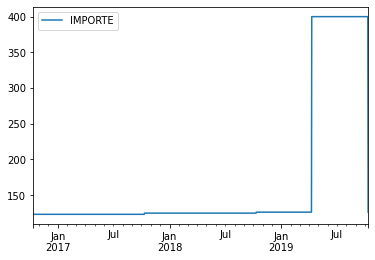

In [232]:
transacciones_78_importe_df.plot()
pyplot.show()

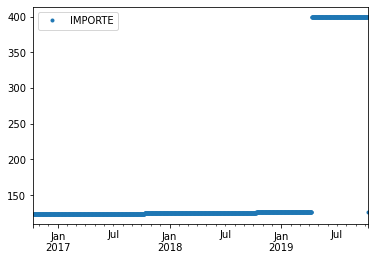

In [233]:
transacciones_78_importe_df.plot(style='.')
pyplot.show()

In [234]:
"""
deberia ser una serie facil de modelizar salvo por el valor de 400 eur en 2019-04-10
"""

'\ndeberia ser una serie facil de modelizar salvo por el valor de 400 eur en 2019-04-10\n'

In [235]:
# 2. Time Series Histogram and Density Plots

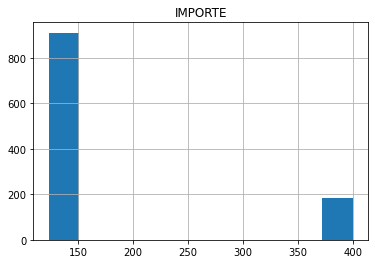

In [236]:
transacciones_78_importe_df.hist()
pyplot.show()

In [237]:
"""
El historgrama nos muestra que casi todas las observaciones estan en torno a 125 eur salvo las del outlier al final que quiza
pueda complicar la predicción:
min = 123.1 eur
q1 = 123.1 eur
q2 = 124.74 eur
q3 = 126.13 eur

El pago de 400 eur en 2019-04-10 tira de la medida hacia arriba e incrementa mucho la desviacion tipica:
mean = 170.72 eur
std = 103.15 eur
max = 400.00 eur
"""

'\nEl historgrama nos muestra que casi todas las observaciones estan en torno a 125 eur salvo las del outlier al final que quiza\npueda complicar la predicción:\nmin = 123.1 eur\nq1 = 123.1 eur\nq2 = 124.74 eur\nq3 = 126.13 eur\n\nEl pago de 400 eur en 2019-04-10 tira de la medida hacia arriba e incrementa mucho la desviacion tipica:\nmean = 170.72 eur\nstd = 103.15 eur\nmax = 400.00 eur\n'

In [238]:
transacciones_78_importe_df.describe()

,IMPORTE
count,1094.000000
mean,170.723062
std,103.150078
min,123.100000
25%,123.100000
50%,124.740000
75%,126.130000
max,400.000000


In [239]:
# calculamos la moda
stat_mode = statistics.mode(transacciones_78_importe_df['IMPORTE'])
stat_mode

124.74

In [240]:
"""
La moda coincide con q2 = 124.74 eur porque en esta distribución tengo 1 año = 365 observaciones
"""

'\nLa moda coincide con q2 = 124.74 eur porque en esta distribución tengo 1 año = 365 observaciones\n'

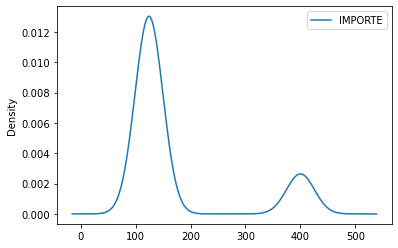

In [241]:
transacciones_78_importe_df.plot(kind='kde')
pyplot.show()

In [242]:
"""
El diagrama de densidad nos confirma las conclusiones del histograma
"""

'\nEl diagrama de densidad nos confirma las conclusiones del histograma\n'

In [243]:
# 3. Time Series Box and Whisker Plots by Interval

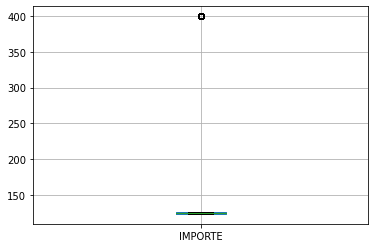

In [244]:
transacciones_78_importe_df.boxplot()
pyplot.show()

In [245]:
"""
El boxplot trata a las observaciones de 400 eur como outliers y el resto de observaciones vemos qye estan superpuestas en torno
a los 125 eur; superponiendose q1, q2, q3 y los whiskers
"""

'\nEl boxplot trata a las observaciones de 400 eur como outliers y el resto de observaciones vemos qye estan superpuestas en torno\na los 125 eur; superponiendose q1, q2, q3 y los whiskers\n'

In [246]:
# 4. Time Series Heat Maps

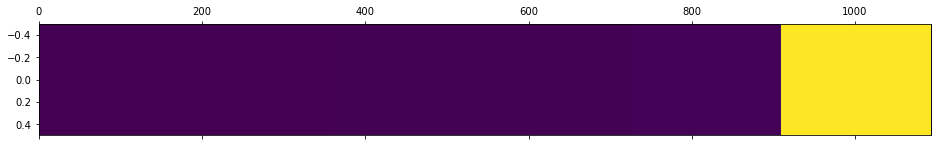

In [247]:
pyplot.matshow(transacciones_78_importe_df.T, interpolation=None, aspect='auto')
pyplot.show()

In [248]:
"""
El mapa de color solo distingue 2 colores:
- Morado 125 eur hasta 2019-04-10;
- Amarillo 400 eur desde 2019-04-10.
"""

'\nEl mapa de color solo distingue 2 colores:\n- Morado 125 eur hasta 2019-04-10;\n- Amarillo 400 eur desde 2019-04-10.\n'

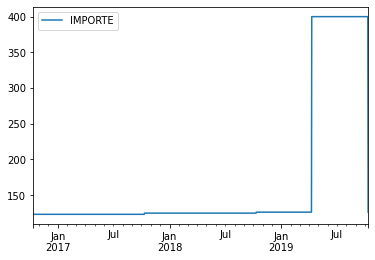

In [249]:
transacciones_78_importe_df.plot()
pyplot.show()

In [250]:
# 5. Time Series Lag Scatter Plots

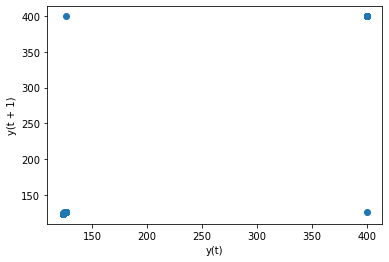

In [251]:
lag_plot(transacciones_78_importe_df)
pyplot.show()

In [252]:
"""
Como esta distribucion solo toma valores en 125 eur y 400 eur los scatter plots no dan información visible sobre la correlacion
entre y(t+1) e y(t) pero eso no quiere decir que esta serie no sea modelizable.
"""

'\nComo esta distribucion solo toma valores en 125 eur y 400 eur los scatter plots no dan información visible sobre la correlacion\nentre y(t+1) e y(t) pero eso no quiere decir que esta serie no sea modelizable.\n'

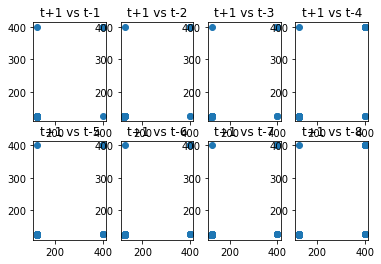

In [253]:
values = DataFrame(transacciones_78_importe_df.values)
lags = 8
columns = [values]
for i in range(1,(lags + 1)):
	columns.append(values.shift(i))
dataframe = concat(columns, axis=1)
columns = ['t+1']
for i in range(1,(lags + 1)):
	columns.append('t-' + str(i))
dataframe.columns = columns
pyplot.figure(1)
for i in range(1,(lags + 1)):
	ax = pyplot.subplot(240 + i)
	ax.set_title('t+1 vs t-' + str(i))
	pyplot.scatter(x=dataframe['t+1'].values, y=dataframe['t-'+str(i)].values)
pyplot.show()

In [254]:
"""
Repetimos la misma conclusion entre la correlacion de y(t+1) con y(t-1) para sus 8 lags anteriores
"""

'\nRepetimos la misma conclusion entre la correlacion de y(t+1) con y(t-1) para sus 8 lags anteriores\n'

t+1 vs t-1


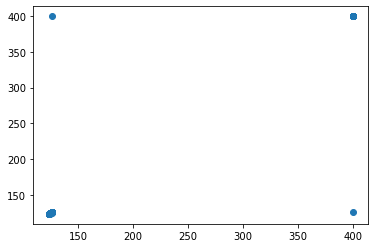

t+1 vs t-2


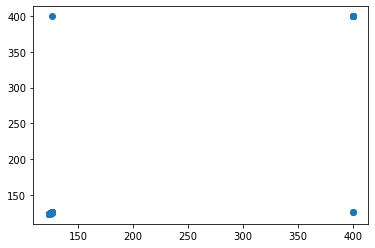

t+1 vs t-3


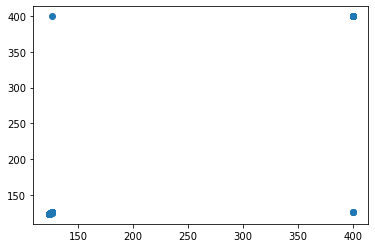

t+1 vs t-4


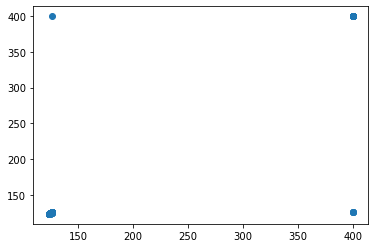

t+1 vs t-5


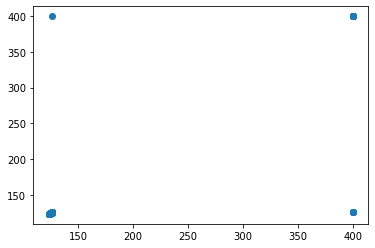

t+1 vs t-6


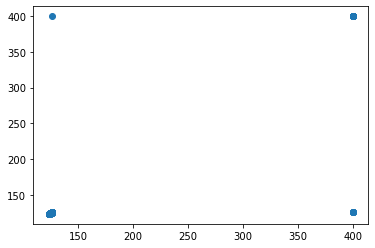

t+1 vs t-7


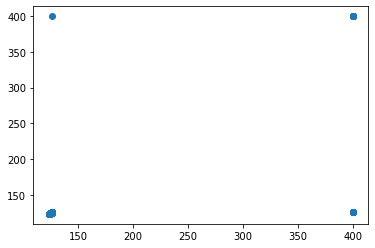

t+1 vs t-8


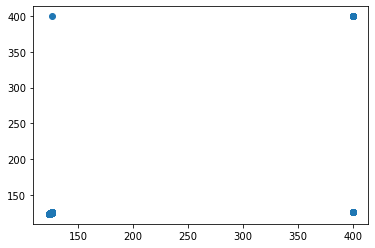

t+1 vs t-9


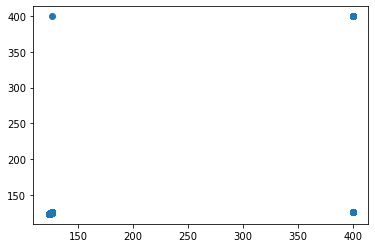

t+1 vs t-10


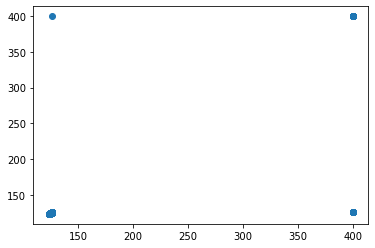

t+1 vs t-11


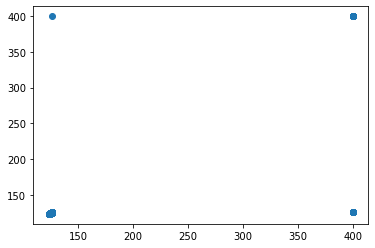

t+1 vs t-12


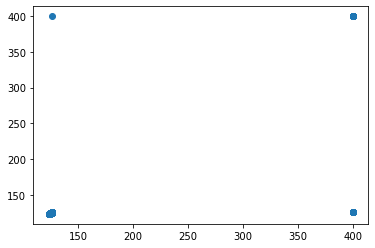

t+1 vs t-13


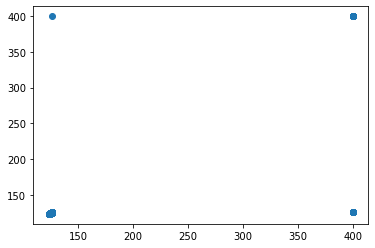

t+1 vs t-14


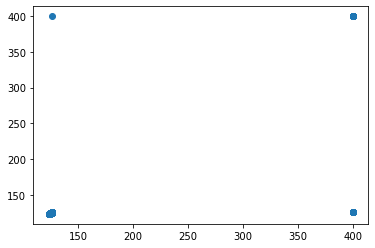

t+1 vs t-15


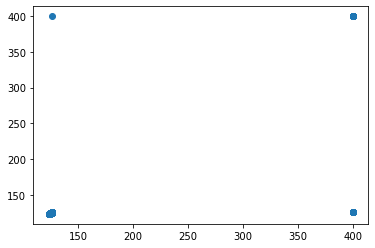

t+1 vs t-16


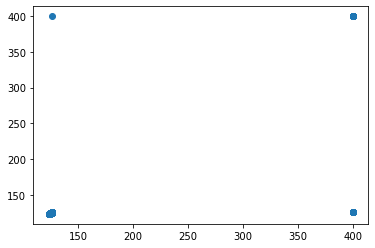

t+1 vs t-17


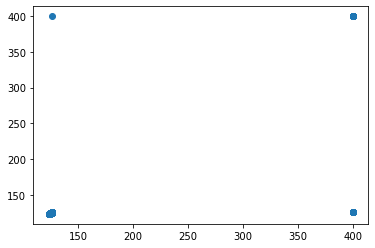

t+1 vs t-18


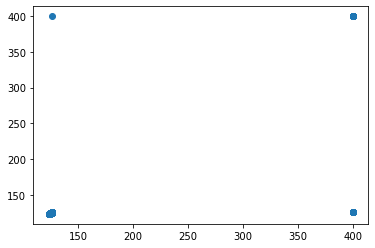

t+1 vs t-19


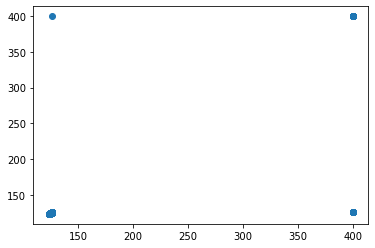

t+1 vs t-20


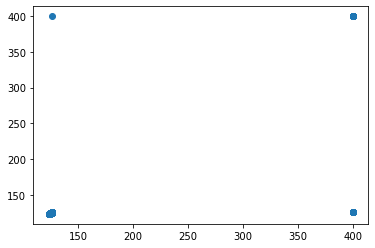

t+1 vs t-21


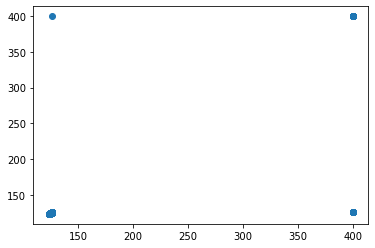

t+1 vs t-22


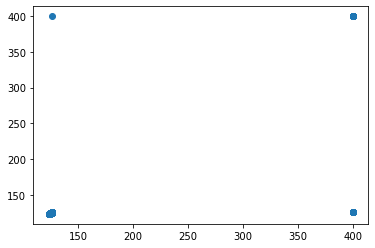

t+1 vs t-23


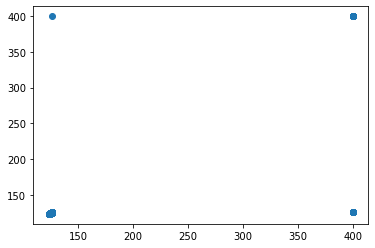

t+1 vs t-24


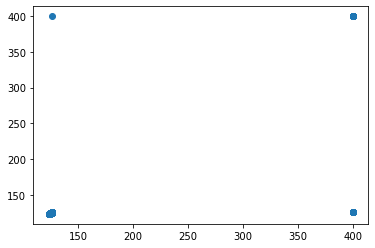

t+1 vs t-25


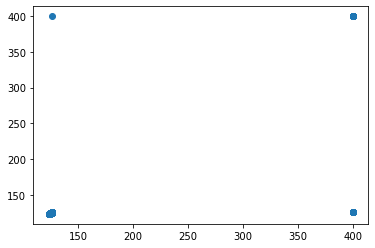

t+1 vs t-26


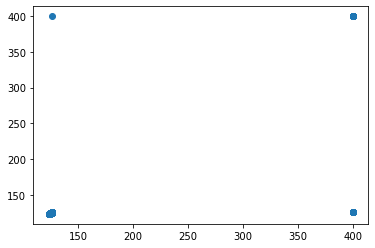

t+1 vs t-27


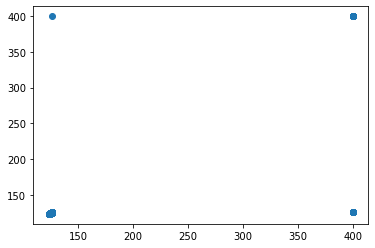

t+1 vs t-28


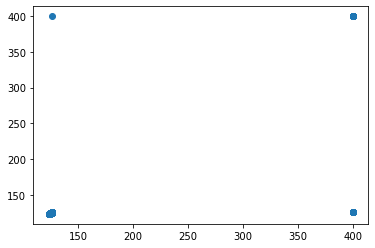

t+1 vs t-29


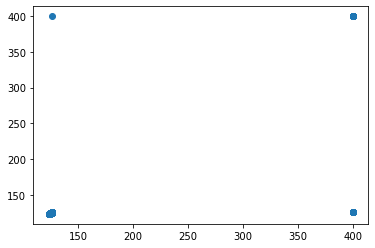

t+1 vs t-30


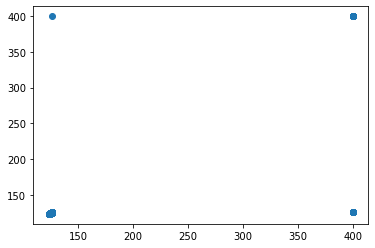

t+1 vs t-31


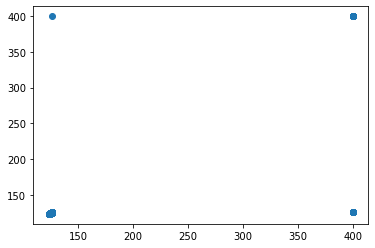

t+1 vs t-32


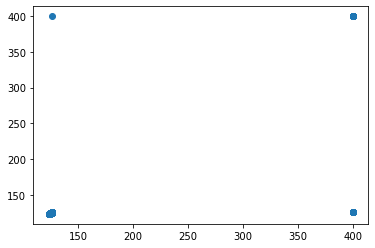

t+1 vs t-33


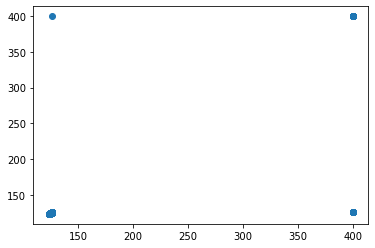

t+1 vs t-34


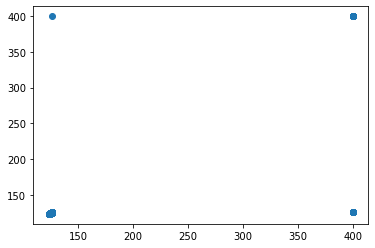

t+1 vs t-35


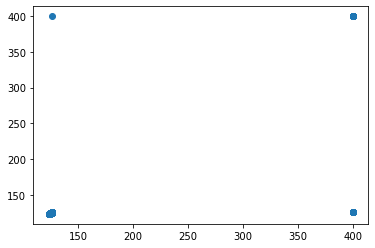

t+1 vs t-36


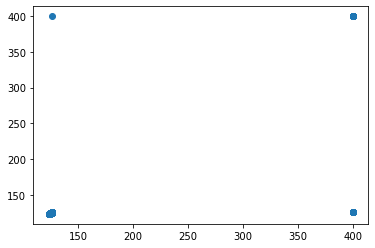

t+1 vs t-37


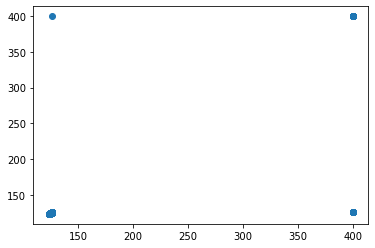

t+1 vs t-38


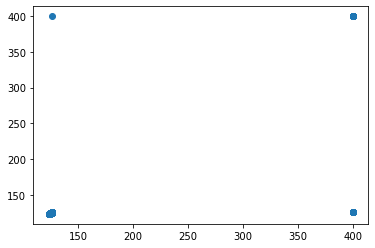

t+1 vs t-39


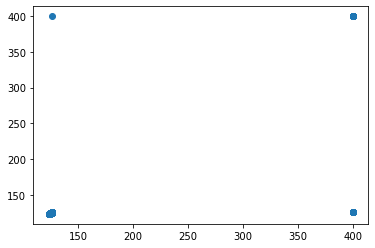

t+1 vs t-40


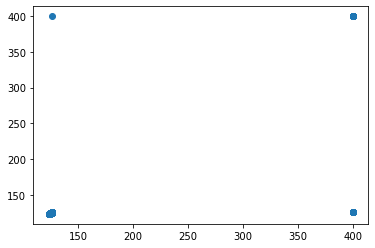

t+1 vs t-41


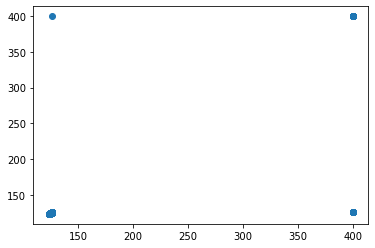

t+1 vs t-42


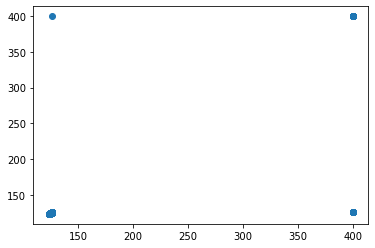

t+1 vs t-43


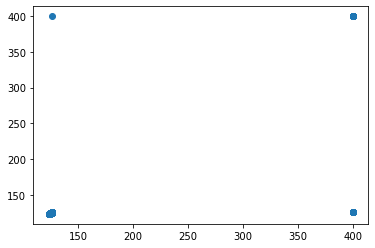

t+1 vs t-44


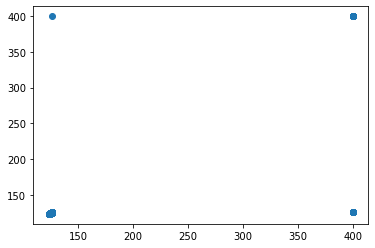

t+1 vs t-45


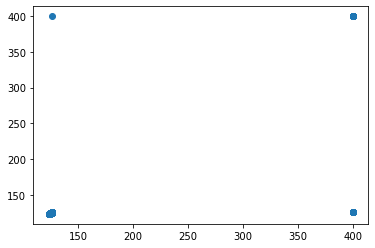

t+1 vs t-46


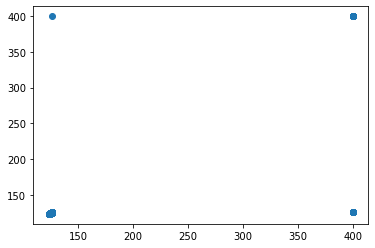

t+1 vs t-47


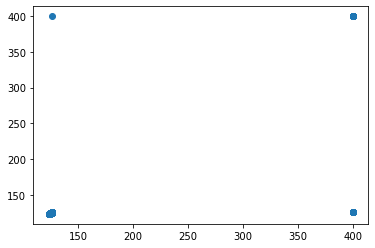

t+1 vs t-48


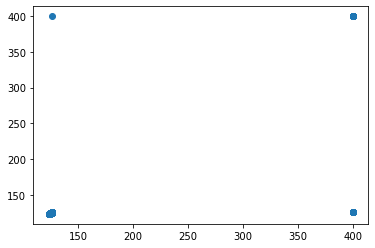

t+1 vs t-49


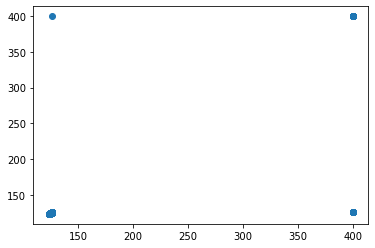

t+1 vs t-50


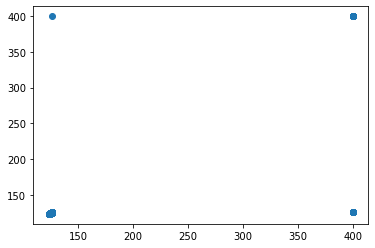

t+1 vs t-51


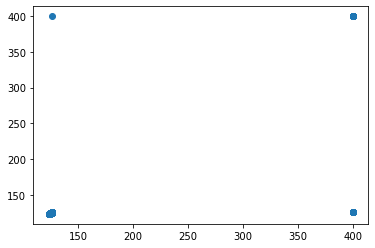

t+1 vs t-52


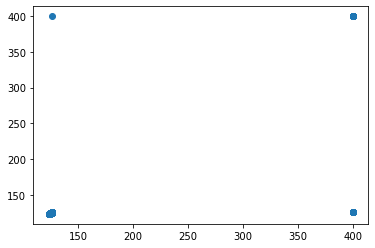

t+1 vs t-53


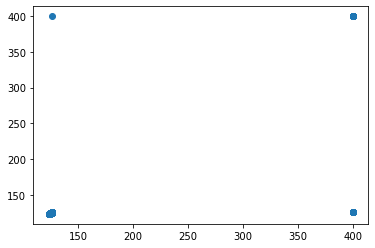

t+1 vs t-54


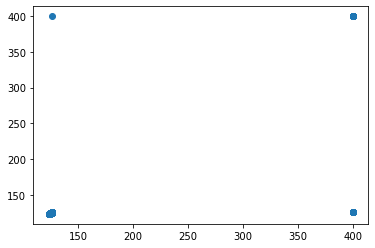

t+1 vs t-55


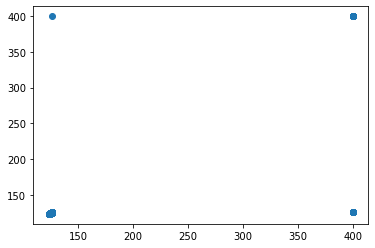

t+1 vs t-56


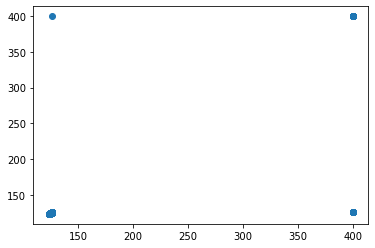

t+1 vs t-57


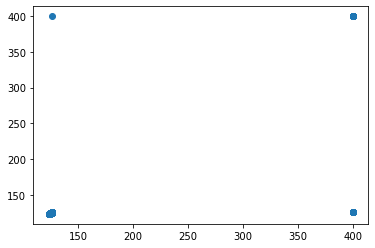

t+1 vs t-58


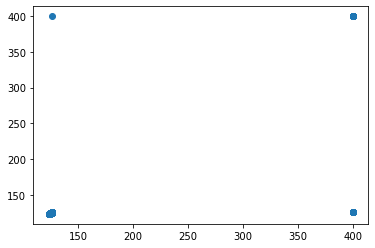

t+1 vs t-59


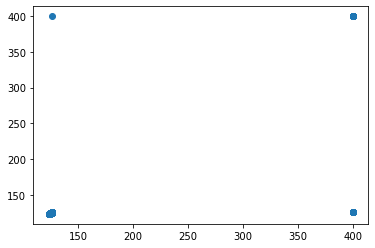

t+1 vs t-60


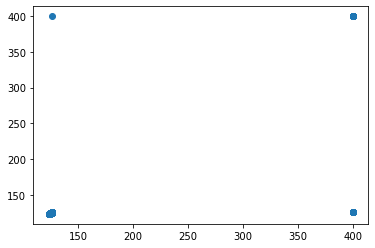

t+1 vs t-61


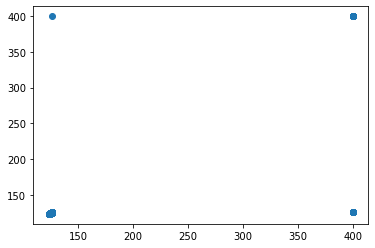

t+1 vs t-62


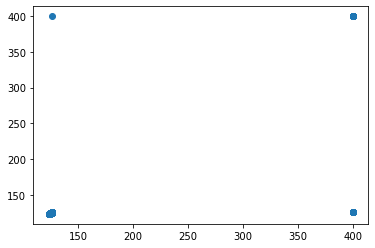

t+1 vs t-63


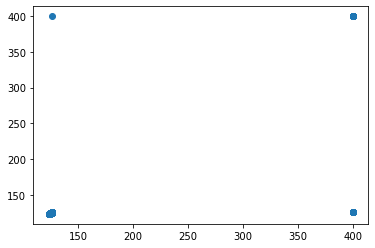

t+1 vs t-64


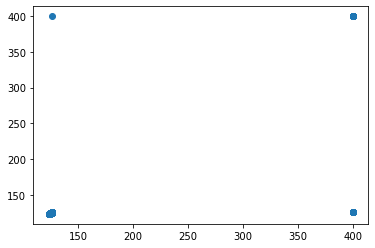

t+1 vs t-65


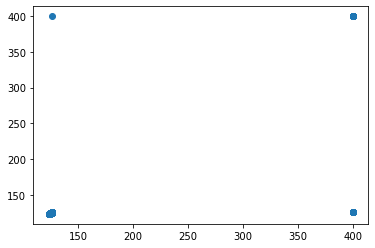

t+1 vs t-66


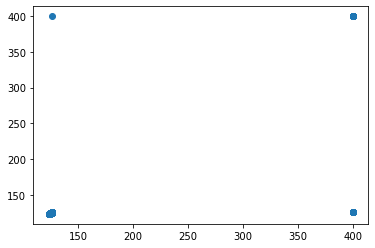

t+1 vs t-67


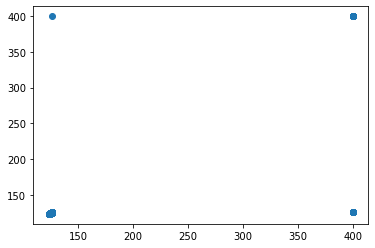

t+1 vs t-68


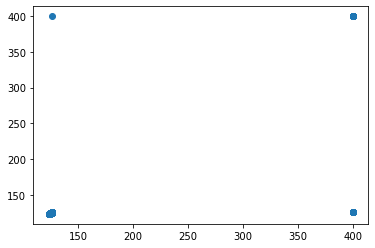

t+1 vs t-69


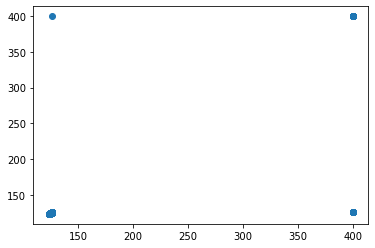

t+1 vs t-70


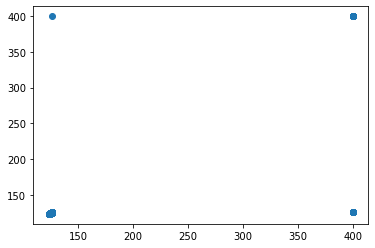

t+1 vs t-71


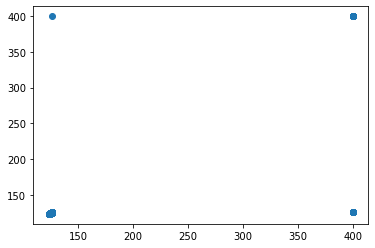

t+1 vs t-72


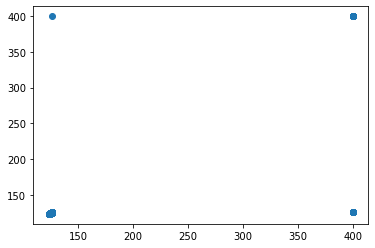

t+1 vs t-73


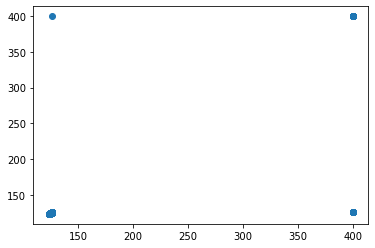

t+1 vs t-74


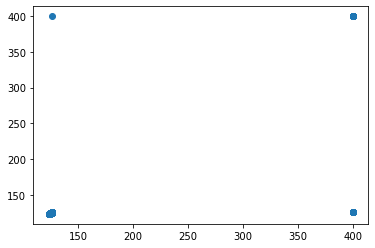

t+1 vs t-75


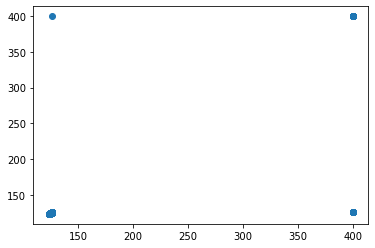

t+1 vs t-76


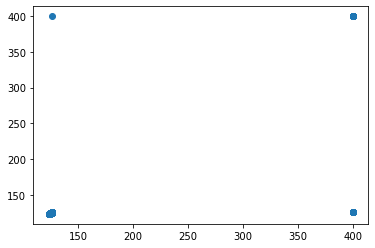

t+1 vs t-77


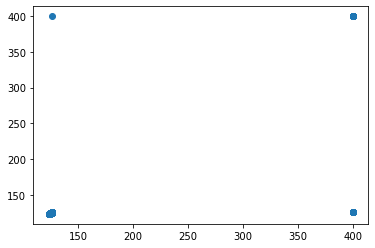

t+1 vs t-78


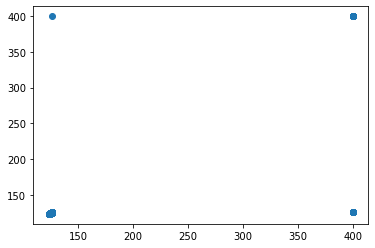

t+1 vs t-79


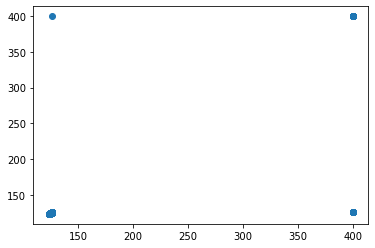

t+1 vs t-80


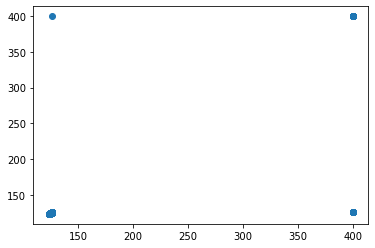

t+1 vs t-81


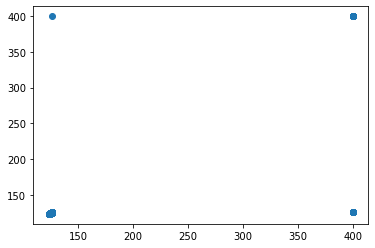

t+1 vs t-82


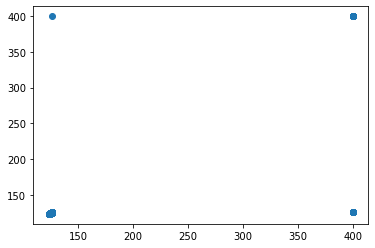

t+1 vs t-83


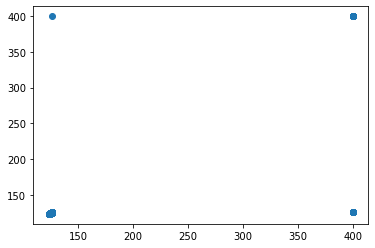

t+1 vs t-84


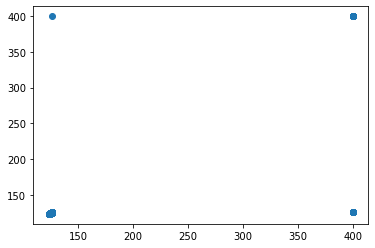

t+1 vs t-85


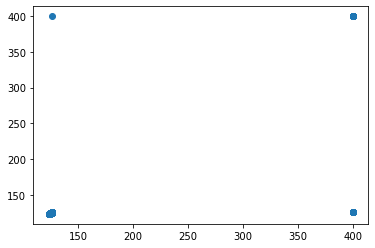

t+1 vs t-86


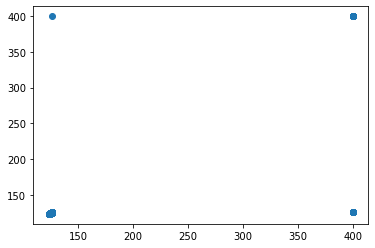

t+1 vs t-87


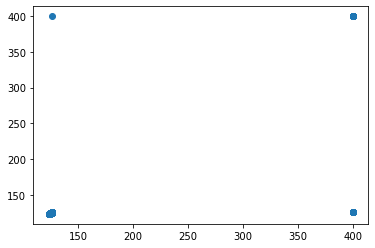

t+1 vs t-88


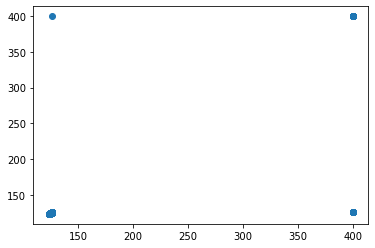

t+1 vs t-89


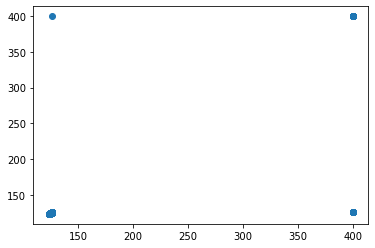

t+1 vs t-90


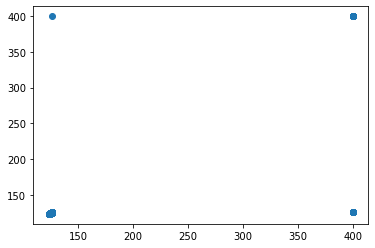

t+1 vs t-91


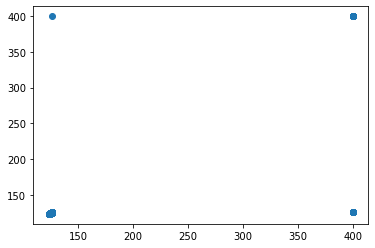

t+1 vs t-92


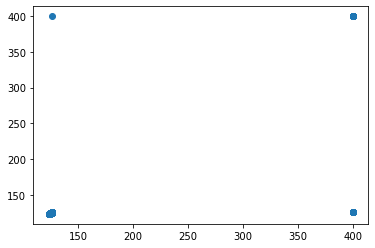

t+1 vs t-93


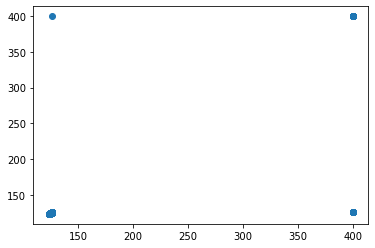

t+1 vs t-94


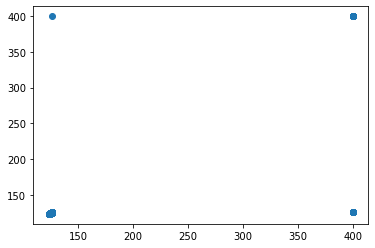

t+1 vs t-95


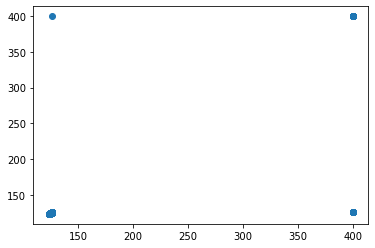

t+1 vs t-96


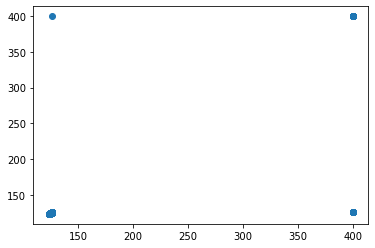

t+1 vs t-97


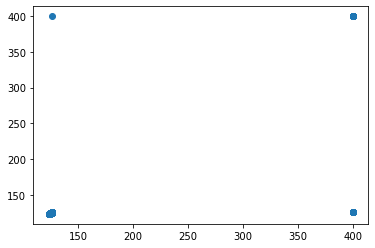

t+1 vs t-98


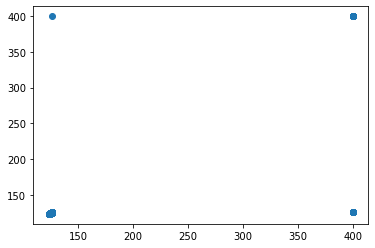

t+1 vs t-99


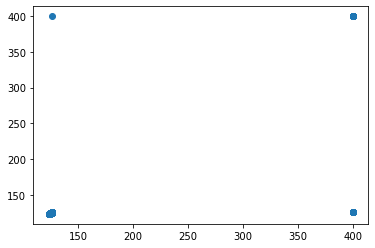

t+1 vs t-100


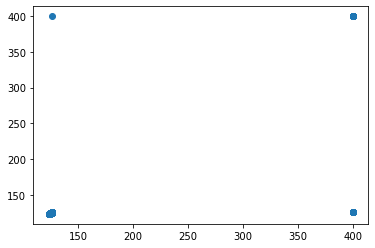

t+1 vs t-101


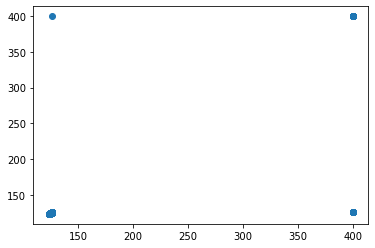

t+1 vs t-102


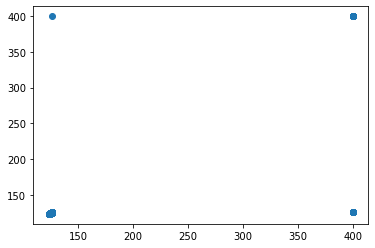

t+1 vs t-103


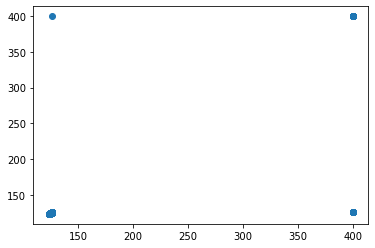

t+1 vs t-104


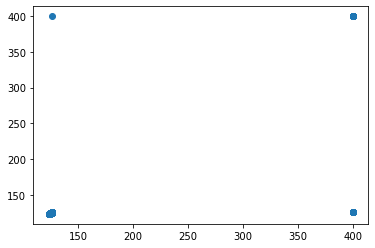

t+1 vs t-105


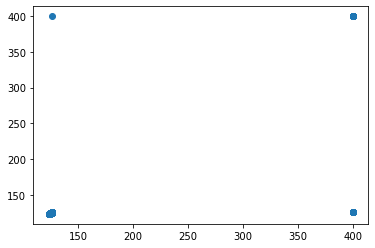

t+1 vs t-106


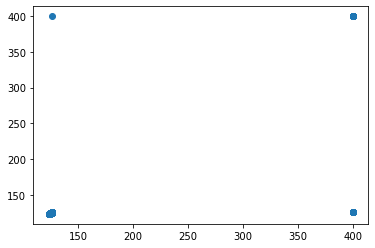

t+1 vs t-107


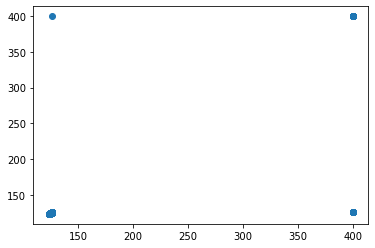

t+1 vs t-108


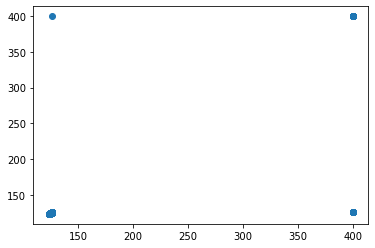

t+1 vs t-109


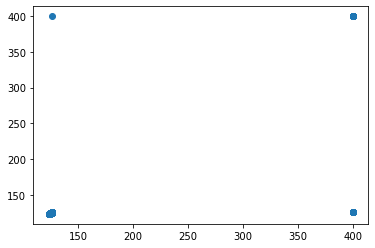

t+1 vs t-110


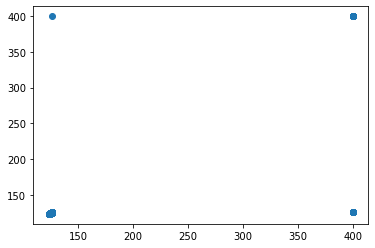

t+1 vs t-111


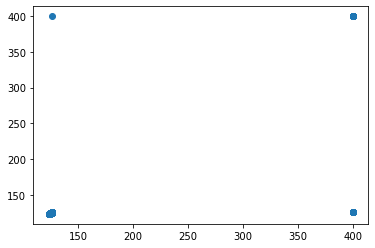

t+1 vs t-112


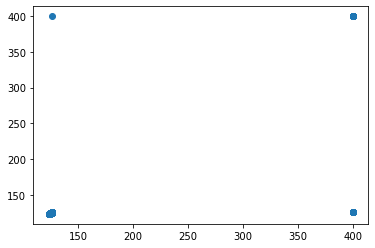

t+1 vs t-113


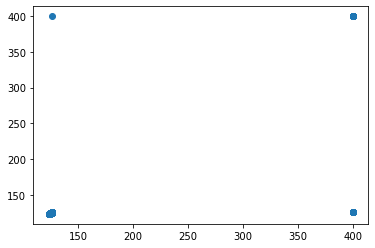

t+1 vs t-114


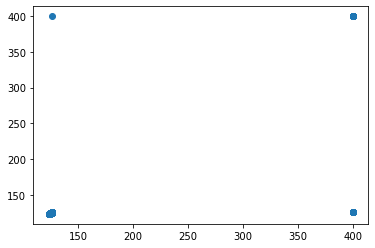

t+1 vs t-115


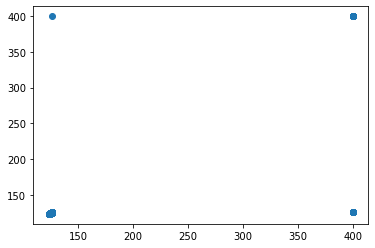

t+1 vs t-116


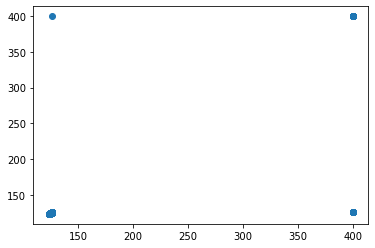

t+1 vs t-117


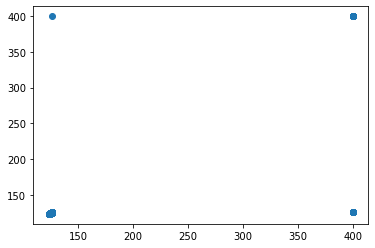

t+1 vs t-118


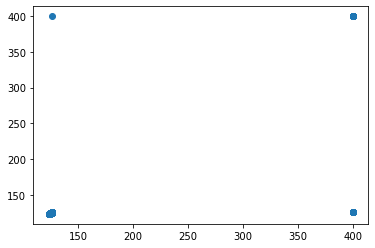

t+1 vs t-119


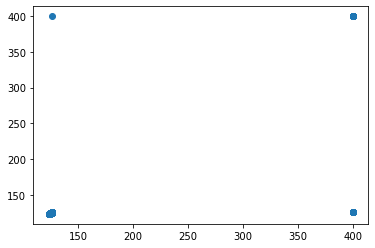

t+1 vs t-120


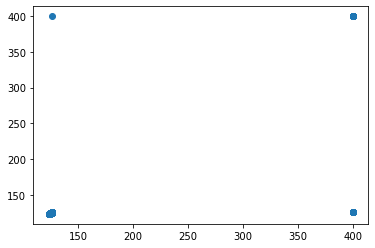

t+1 vs t-121


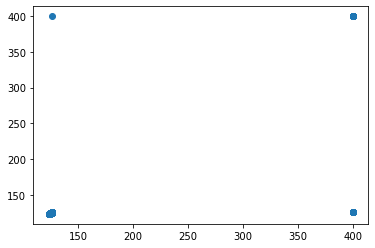

t+1 vs t-122


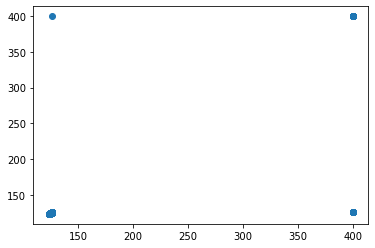

t+1 vs t-123


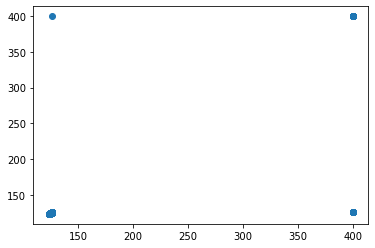

t+1 vs t-124


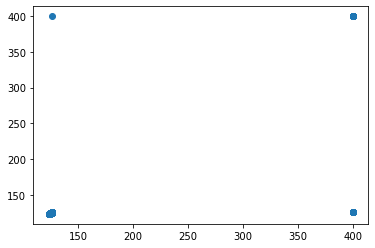

t+1 vs t-125


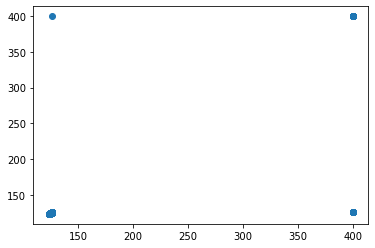

t+1 vs t-126


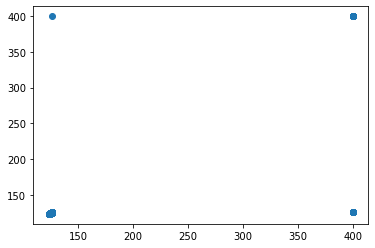

t+1 vs t-127


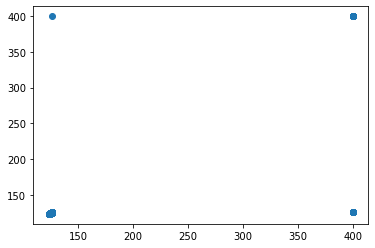

t+1 vs t-128


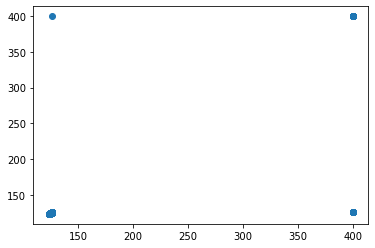

t+1 vs t-129


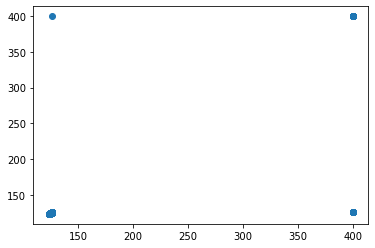

t+1 vs t-130


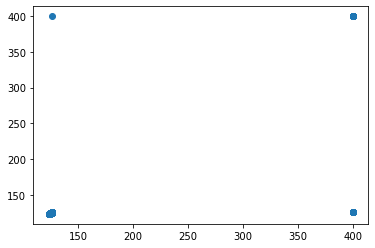

t+1 vs t-131


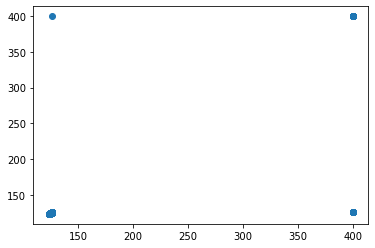

t+1 vs t-132


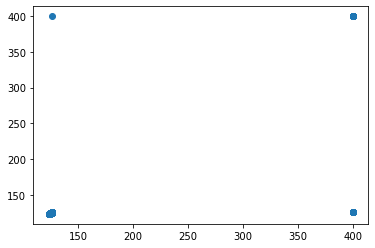

t+1 vs t-133


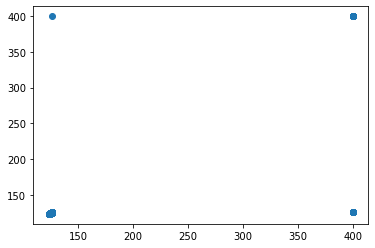

t+1 vs t-134


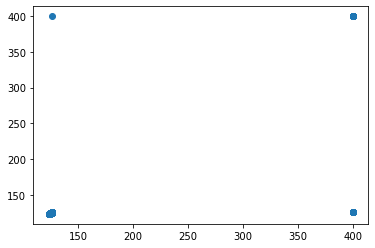

t+1 vs t-135


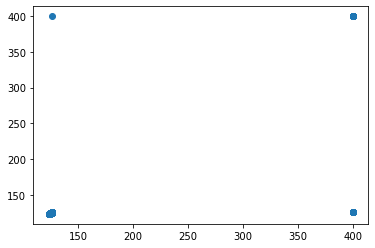

t+1 vs t-136


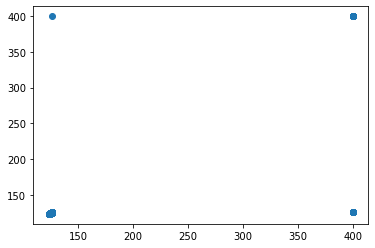

t+1 vs t-137


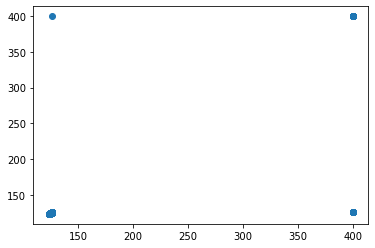

t+1 vs t-138


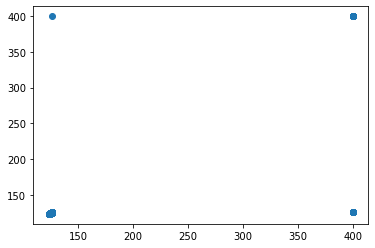

t+1 vs t-139


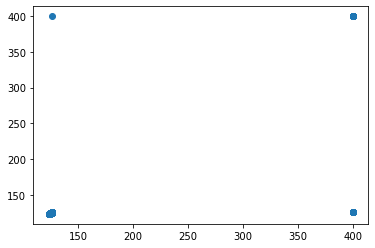

t+1 vs t-140


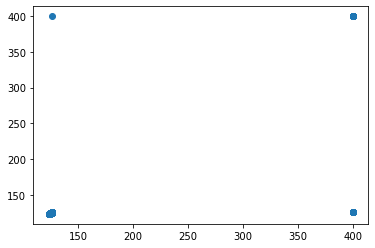

t+1 vs t-141


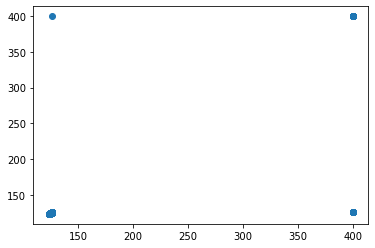

t+1 vs t-142


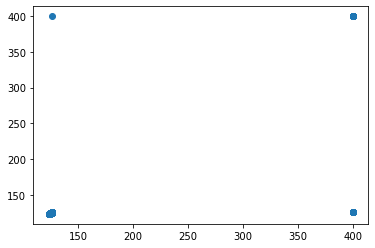

t+1 vs t-143


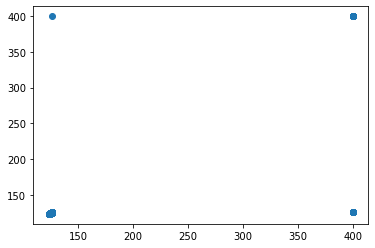

t+1 vs t-144


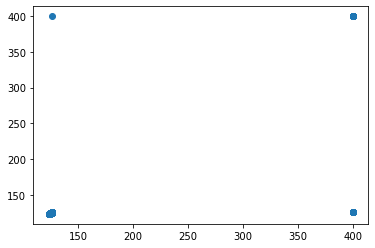

t+1 vs t-145


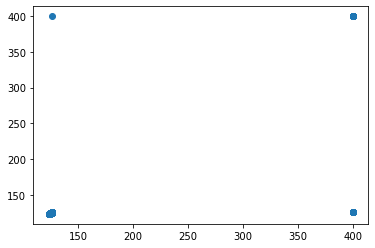

t+1 vs t-146


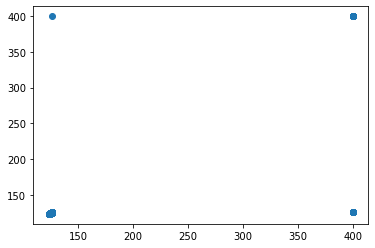

t+1 vs t-147


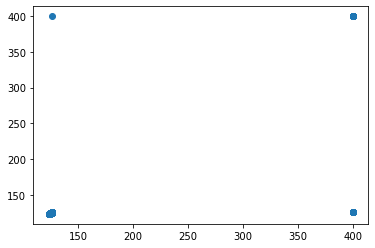

t+1 vs t-148


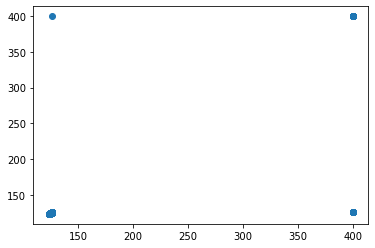

t+1 vs t-149


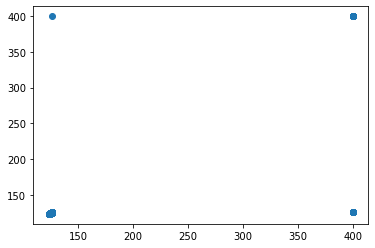

t+1 vs t-150


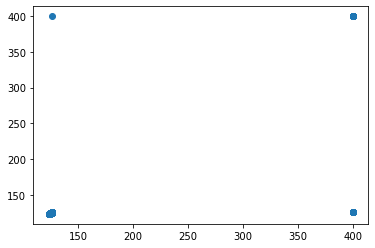

t+1 vs t-151


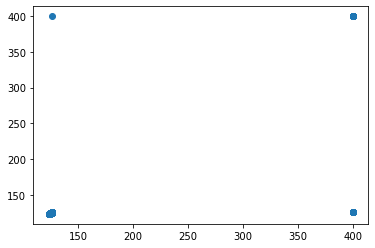

t+1 vs t-152


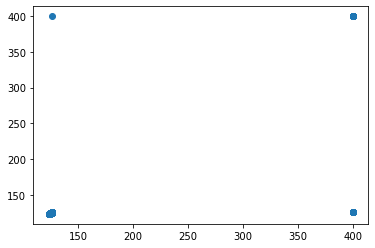

t+1 vs t-153


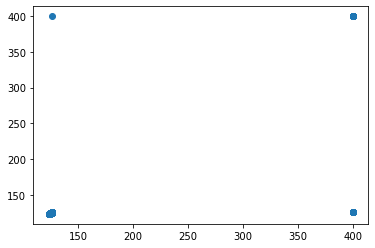

t+1 vs t-154


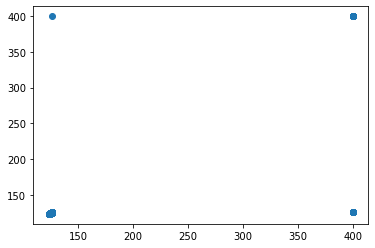

t+1 vs t-155


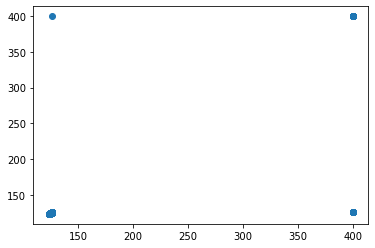

t+1 vs t-156


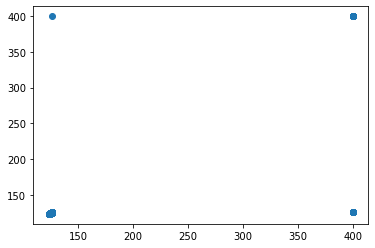

t+1 vs t-157


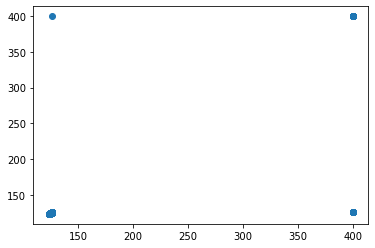

t+1 vs t-158


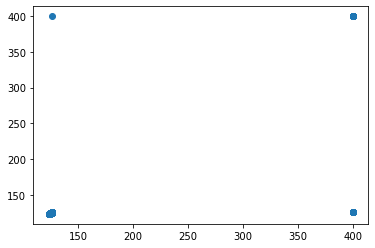

t+1 vs t-159


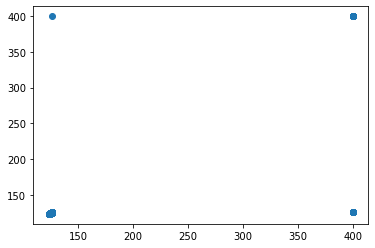

t+1 vs t-160


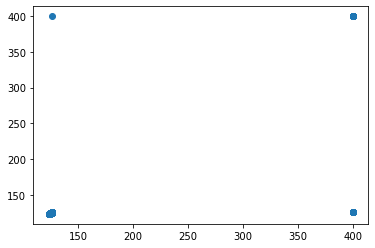

t+1 vs t-161


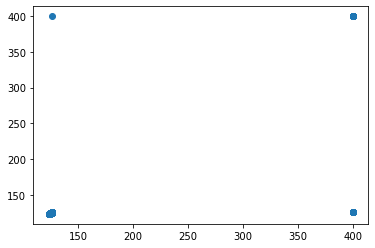

t+1 vs t-162


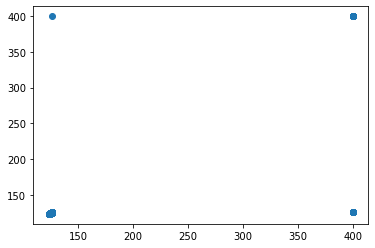

t+1 vs t-163


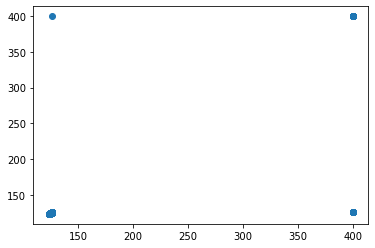

t+1 vs t-164


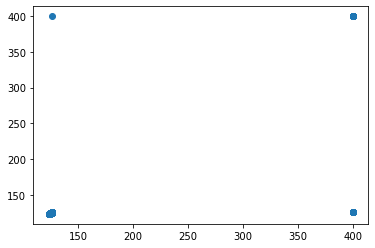

t+1 vs t-165


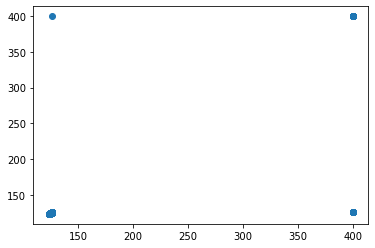

t+1 vs t-166


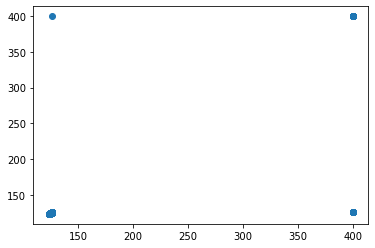

t+1 vs t-167


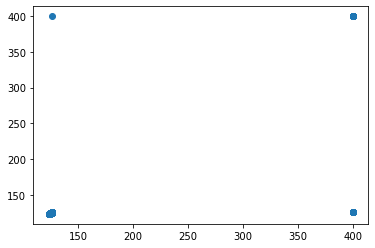

t+1 vs t-168


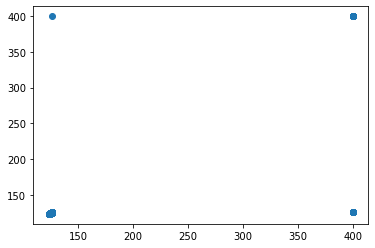

t+1 vs t-169


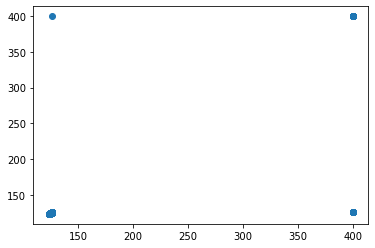

t+1 vs t-170


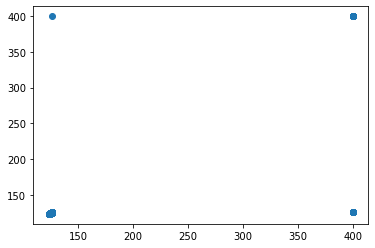

t+1 vs t-171


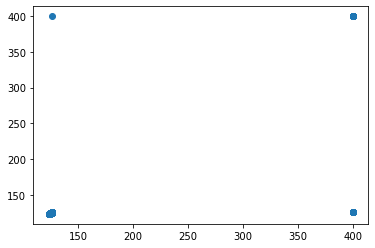

t+1 vs t-172


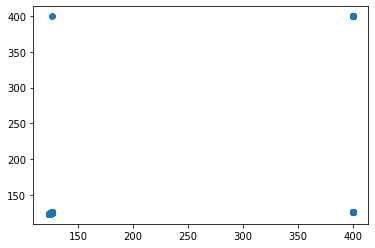

t+1 vs t-173


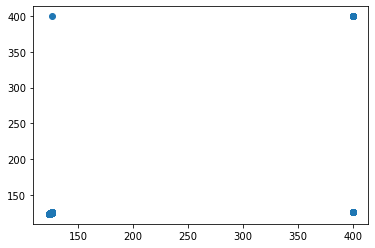

t+1 vs t-174


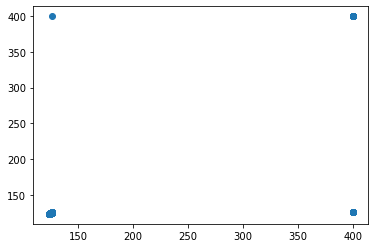

t+1 vs t-175


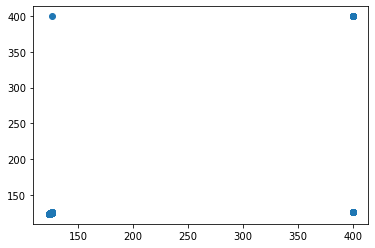

t+1 vs t-176


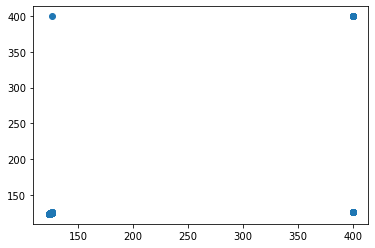

t+1 vs t-177


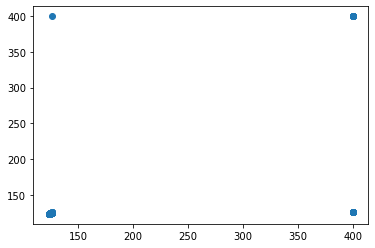

t+1 vs t-178


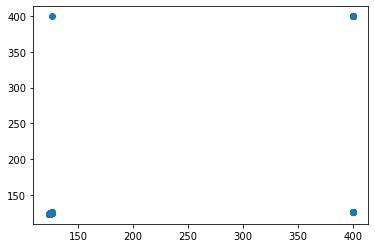

t+1 vs t-179


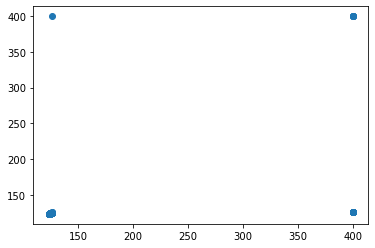

t+1 vs t-180


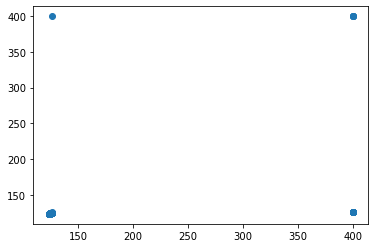

t+1 vs t-181


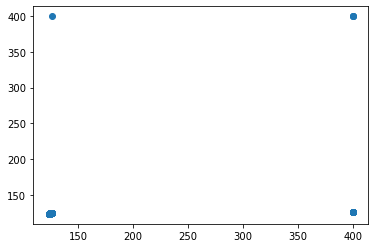

t+1 vs t-182


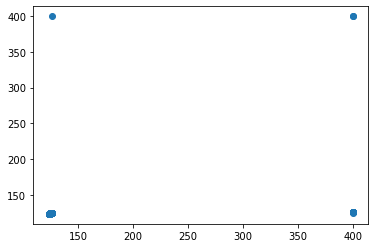

t+1 vs t-183


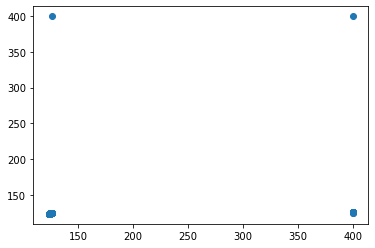

t+1 vs t-184


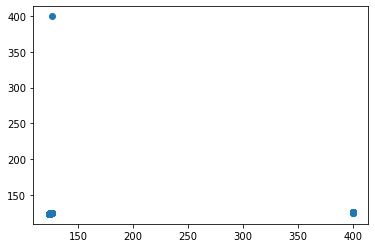

t+1 vs t-185


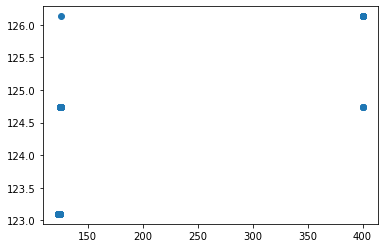

t+1 vs t-186


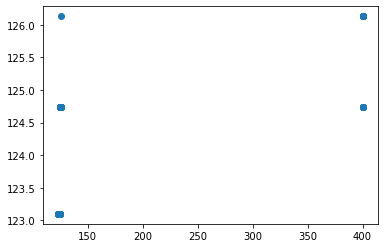

t+1 vs t-187


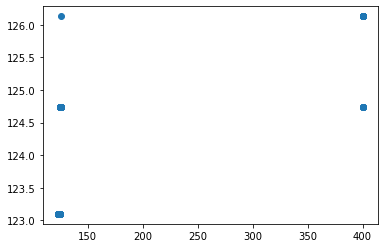

t+1 vs t-188


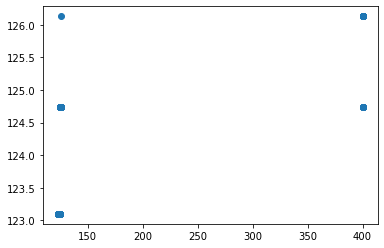

t+1 vs t-189


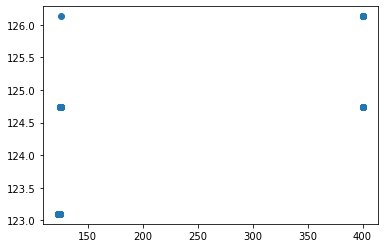

t+1 vs t-190


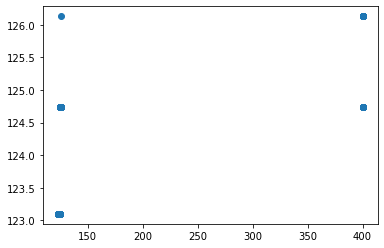

t+1 vs t-191


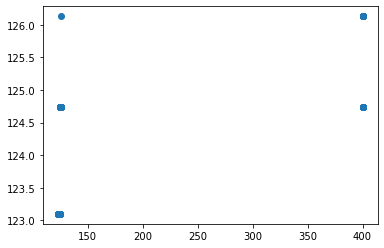

t+1 vs t-192


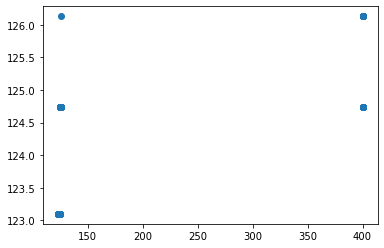

t+1 vs t-193


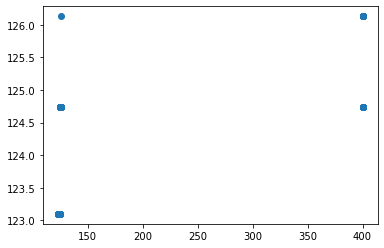

t+1 vs t-194


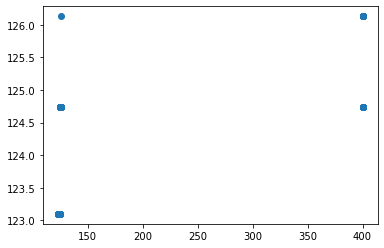

t+1 vs t-195


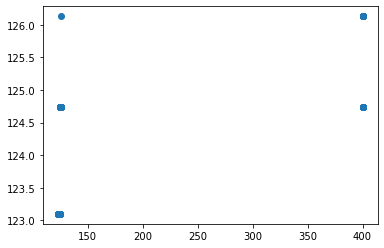

t+1 vs t-196


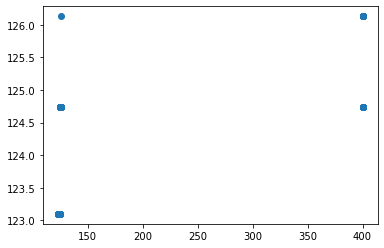

t+1 vs t-197


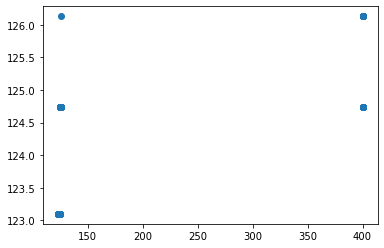

t+1 vs t-198


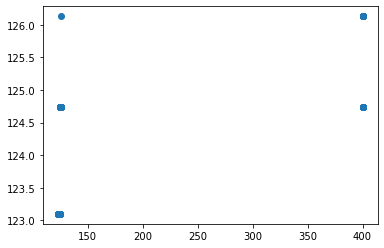

t+1 vs t-199


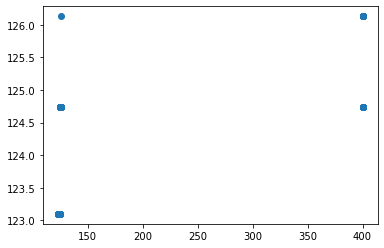

t+1 vs t-200


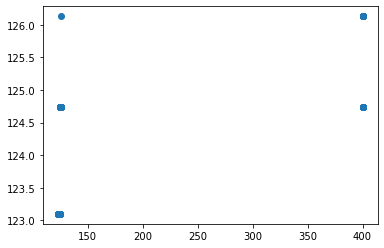

t+1 vs t-201


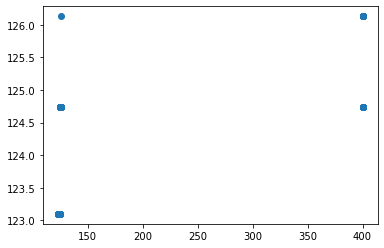

t+1 vs t-202


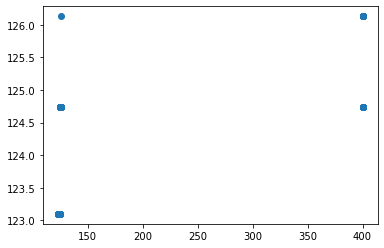

t+1 vs t-203


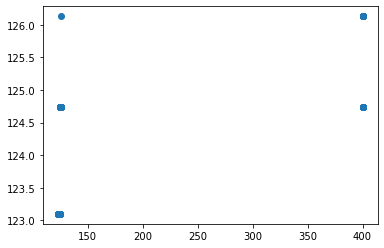

t+1 vs t-204


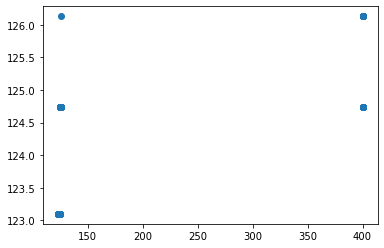

t+1 vs t-205


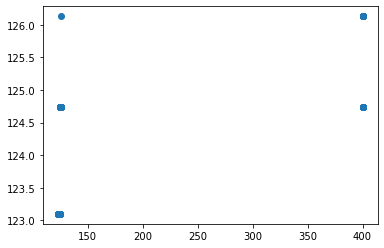

t+1 vs t-206


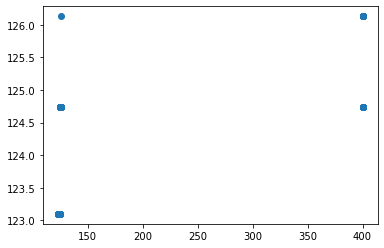

t+1 vs t-207


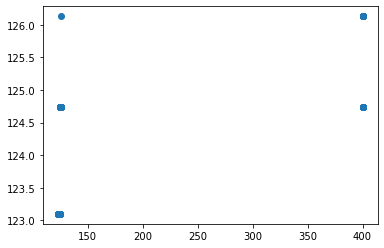

t+1 vs t-208


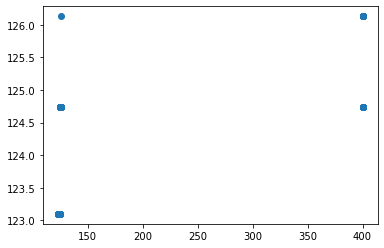

t+1 vs t-209


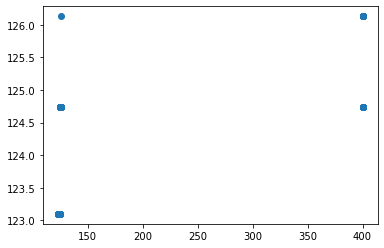

t+1 vs t-210


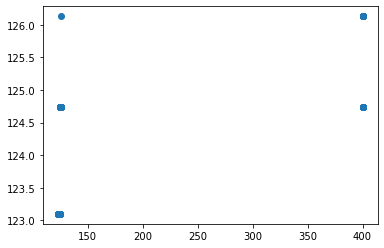

t+1 vs t-211


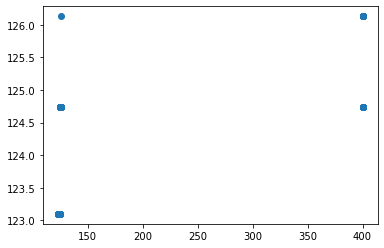

t+1 vs t-212


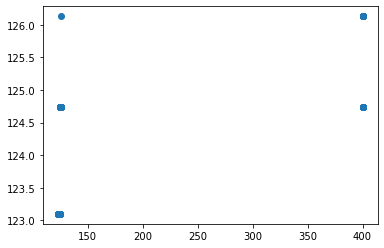

t+1 vs t-213


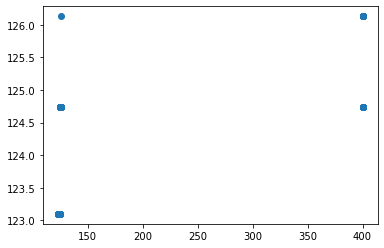

t+1 vs t-214


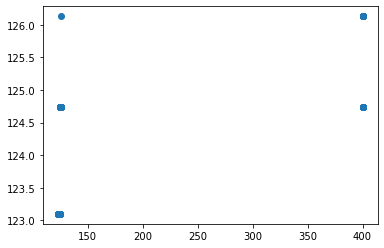

t+1 vs t-215


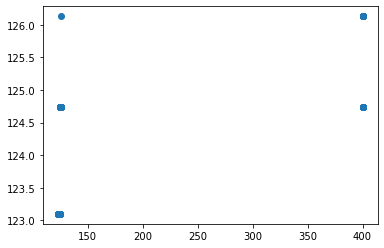

t+1 vs t-216


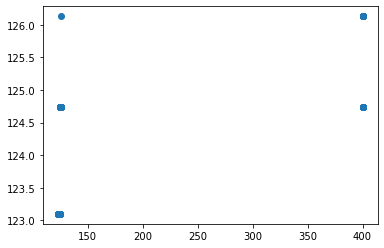

t+1 vs t-217


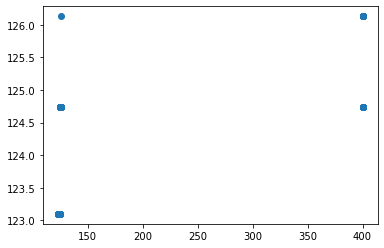

t+1 vs t-218


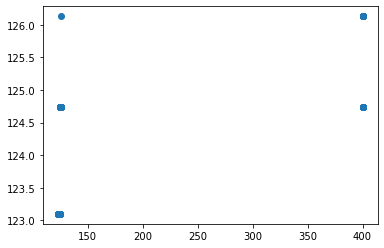

t+1 vs t-219


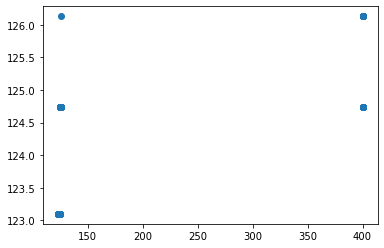

t+1 vs t-220


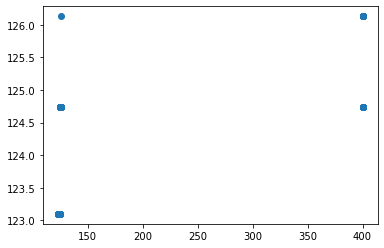

t+1 vs t-221


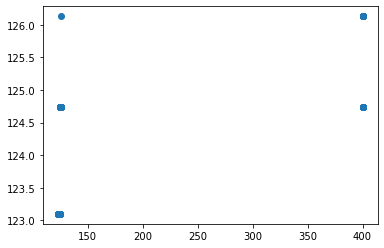

t+1 vs t-222


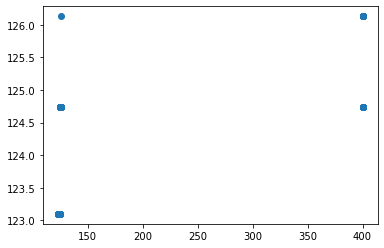

t+1 vs t-223


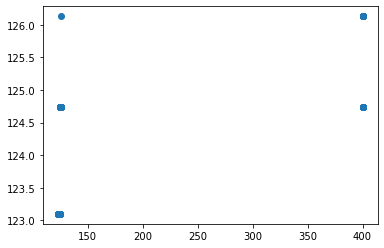

t+1 vs t-224


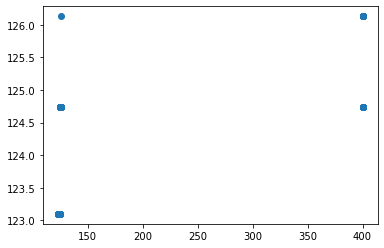

t+1 vs t-225


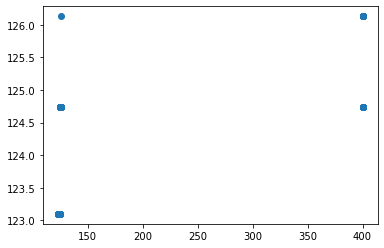

t+1 vs t-226


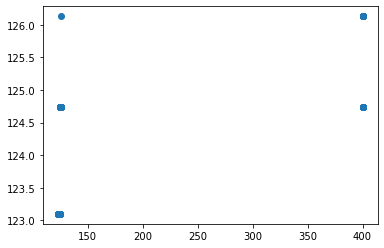

t+1 vs t-227


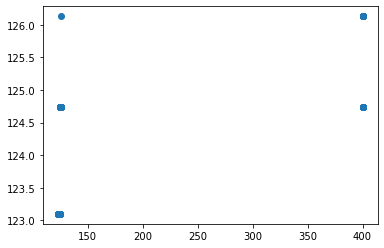

t+1 vs t-228


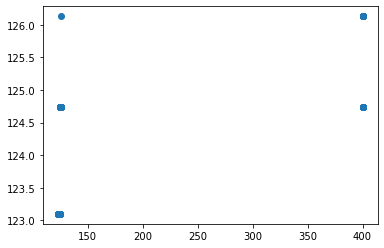

t+1 vs t-229


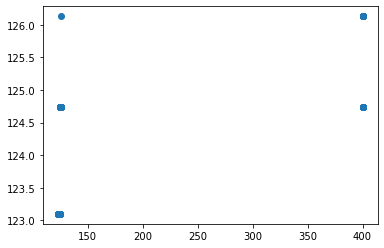

t+1 vs t-230


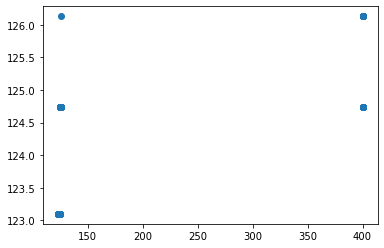

t+1 vs t-231


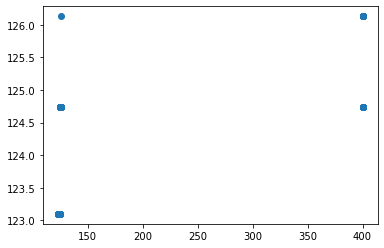

t+1 vs t-232


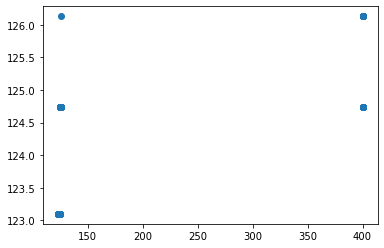

t+1 vs t-233


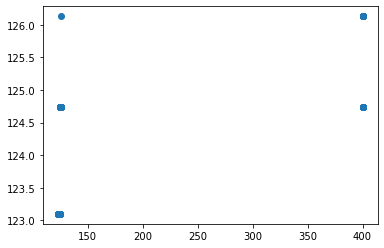

t+1 vs t-234


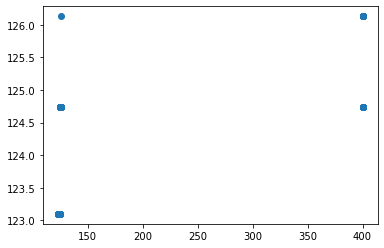

t+1 vs t-235


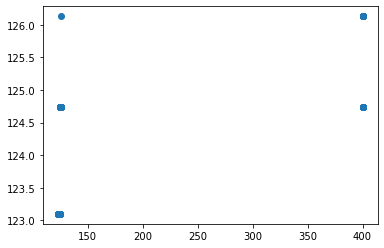

t+1 vs t-236


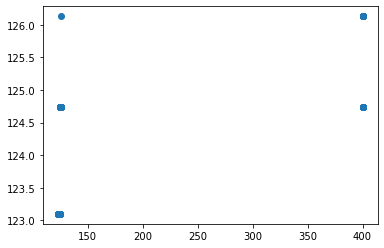

t+1 vs t-237


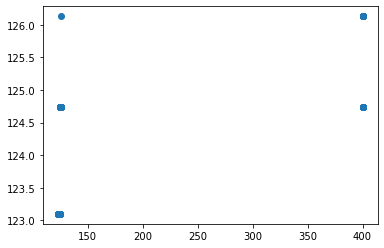

t+1 vs t-238


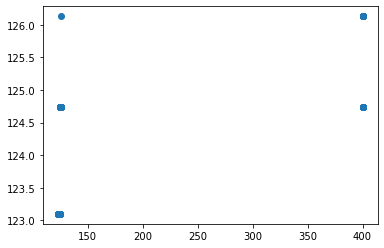

t+1 vs t-239


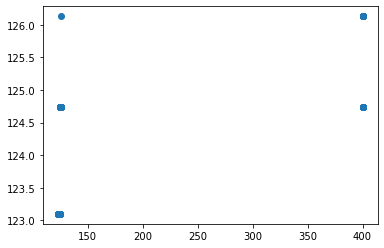

t+1 vs t-240


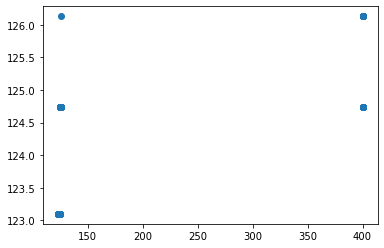

t+1 vs t-241


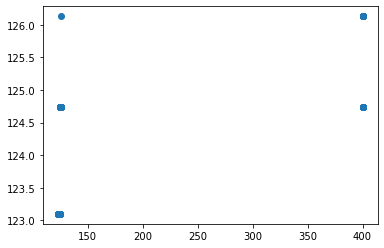

t+1 vs t-242


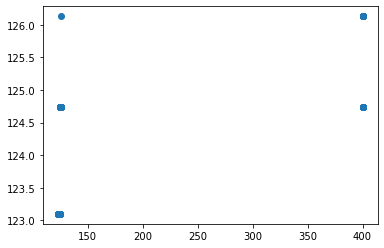

t+1 vs t-243


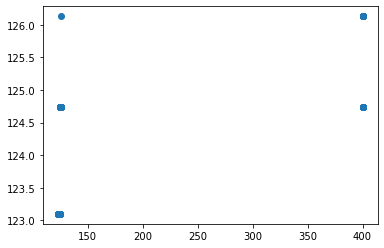

t+1 vs t-244


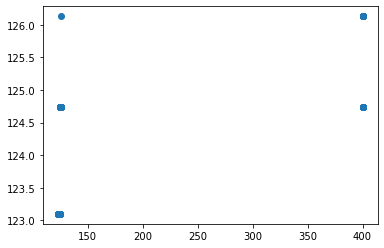

t+1 vs t-245


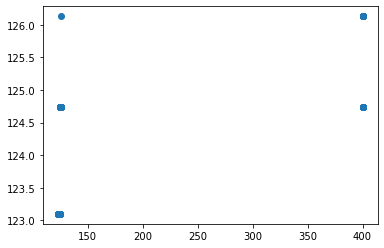

t+1 vs t-246


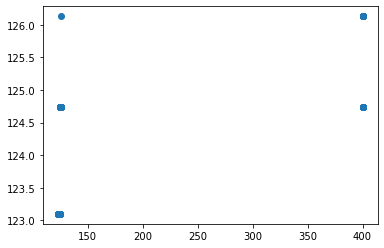

t+1 vs t-247


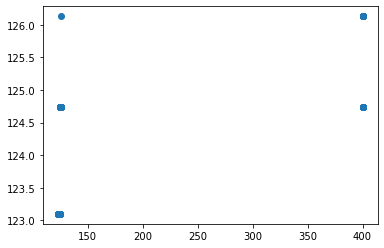

t+1 vs t-248


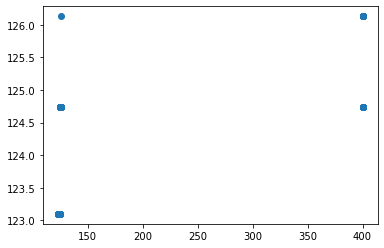

t+1 vs t-249


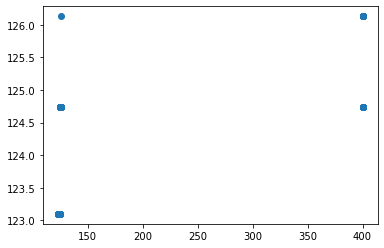

t+1 vs t-250


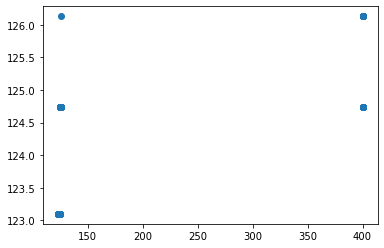

t+1 vs t-251


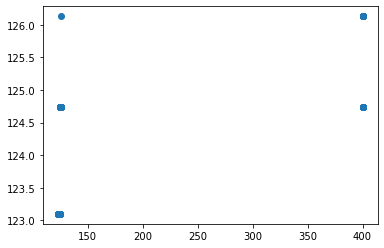

t+1 vs t-252


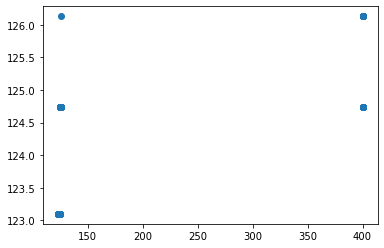

t+1 vs t-253


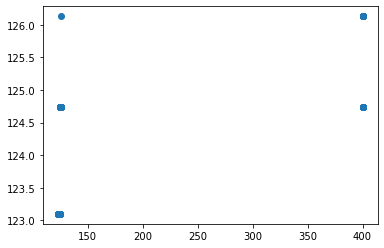

t+1 vs t-254


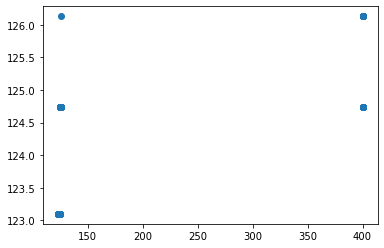

t+1 vs t-255


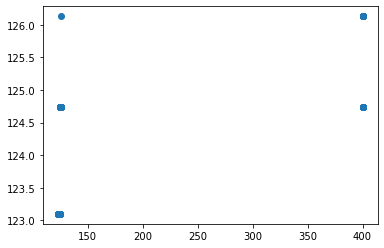

t+1 vs t-256


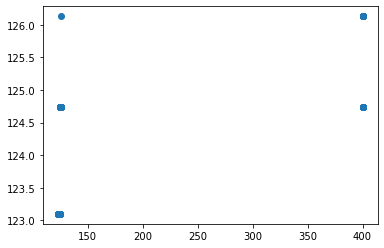

t+1 vs t-257


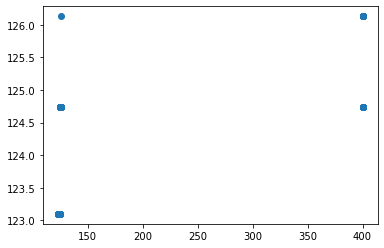

t+1 vs t-258


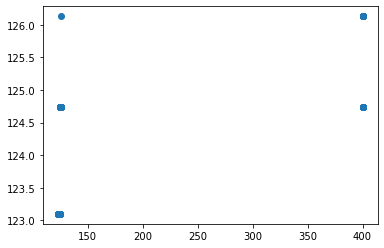

t+1 vs t-259


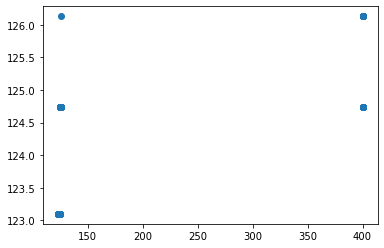

t+1 vs t-260


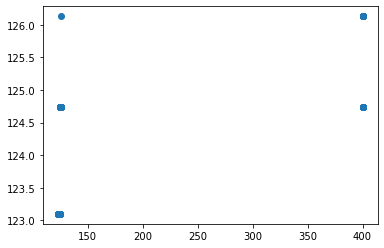

t+1 vs t-261


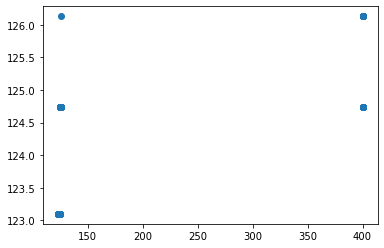

t+1 vs t-262


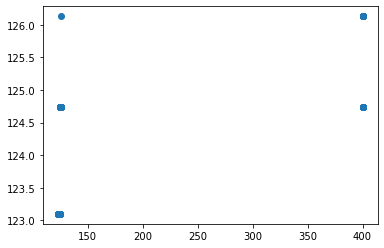

t+1 vs t-263


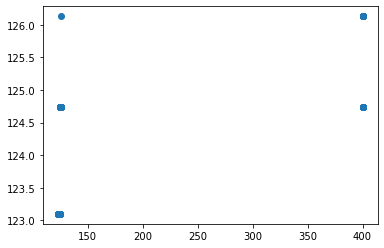

t+1 vs t-264


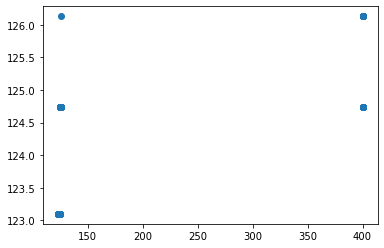

t+1 vs t-265


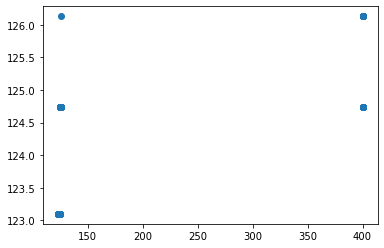

t+1 vs t-266


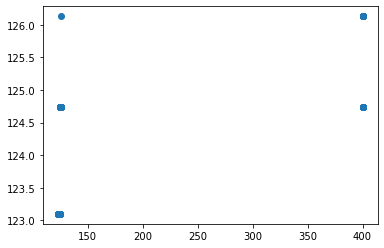

t+1 vs t-267


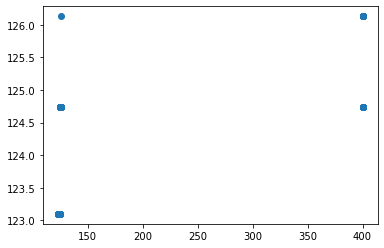

t+1 vs t-268


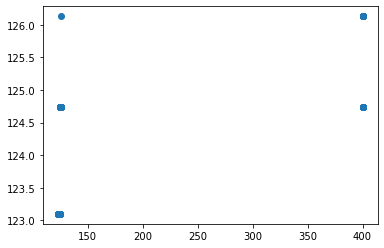

t+1 vs t-269


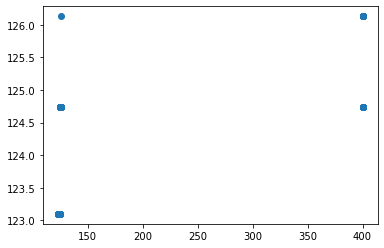

t+1 vs t-270


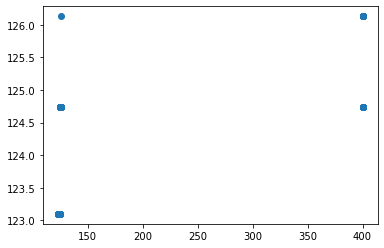

t+1 vs t-271


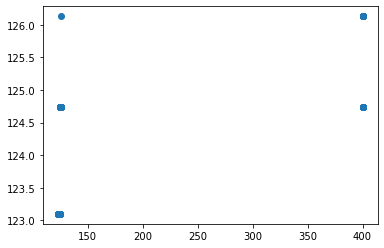

t+1 vs t-272


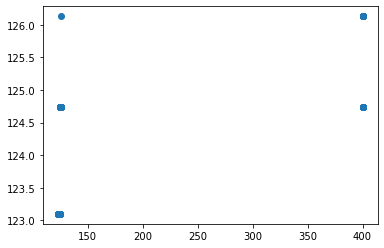

t+1 vs t-273


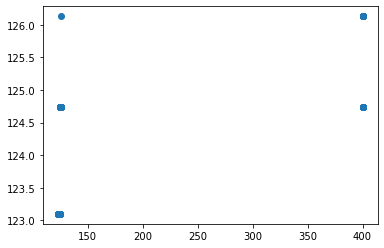

t+1 vs t-274


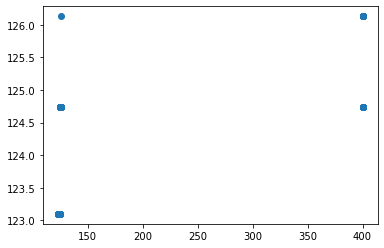

t+1 vs t-275


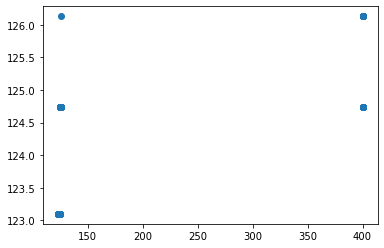

t+1 vs t-276


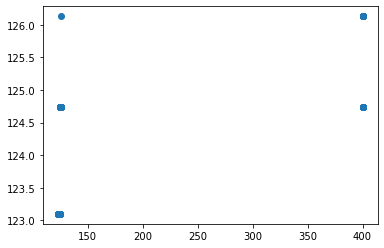

t+1 vs t-277


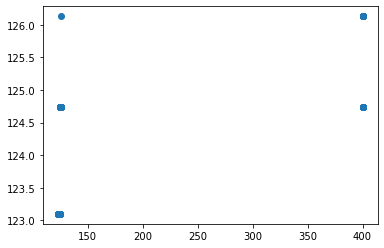

t+1 vs t-278


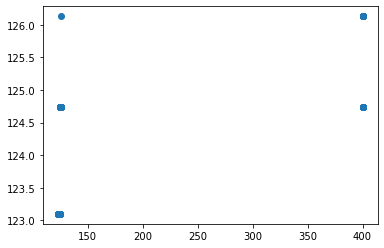

t+1 vs t-279


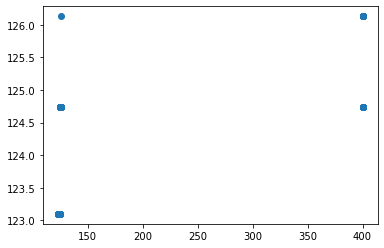

t+1 vs t-280


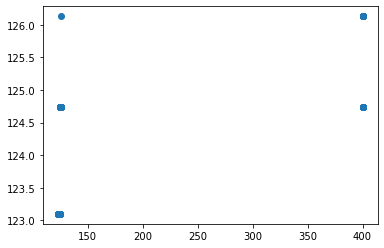

t+1 vs t-281


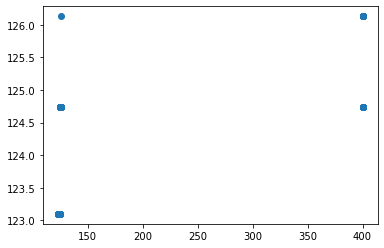

t+1 vs t-282


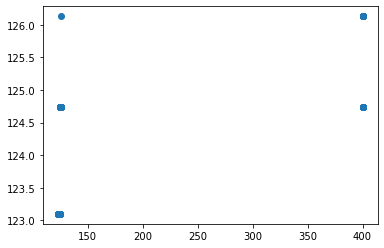

t+1 vs t-283


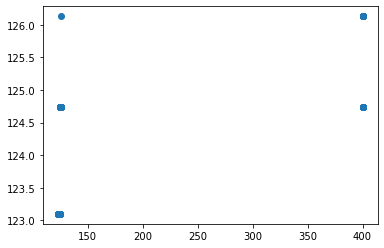

t+1 vs t-284


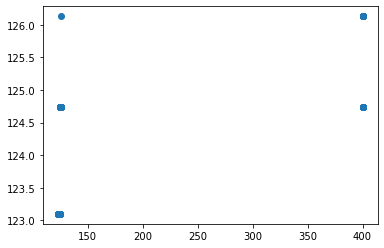

t+1 vs t-285


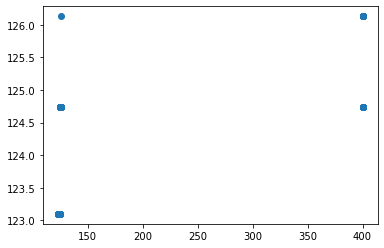

t+1 vs t-286


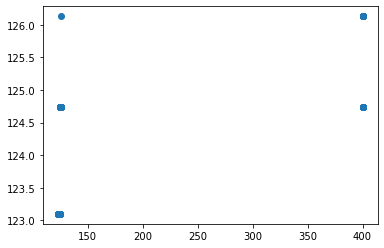

t+1 vs t-287


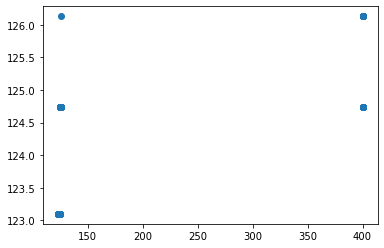

t+1 vs t-288


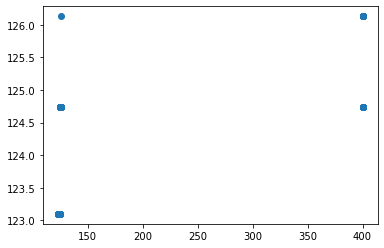

t+1 vs t-289


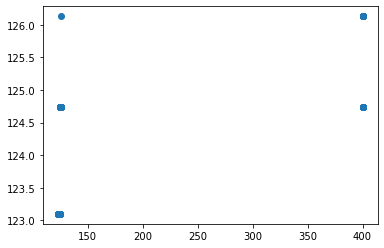

t+1 vs t-290


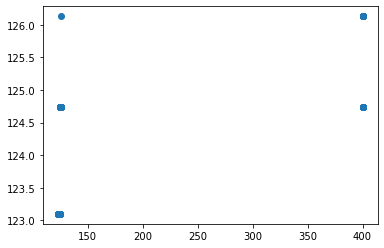

t+1 vs t-291


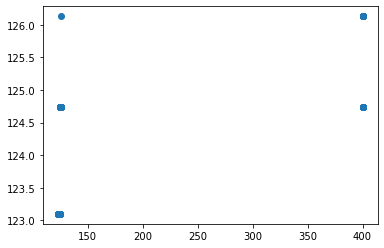

t+1 vs t-292


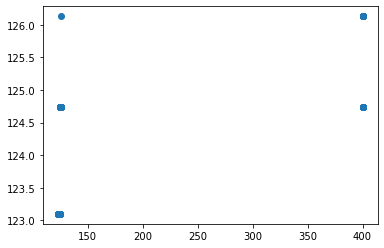

t+1 vs t-293


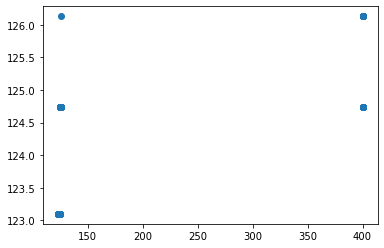

t+1 vs t-294


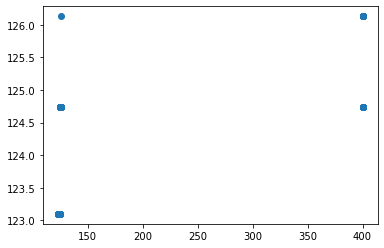

t+1 vs t-295


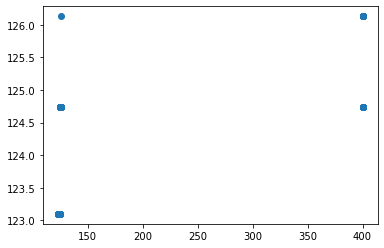

t+1 vs t-296


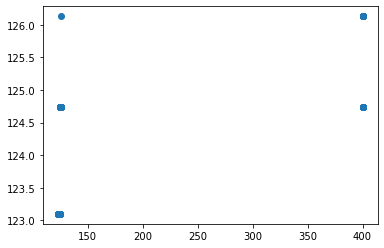

t+1 vs t-297


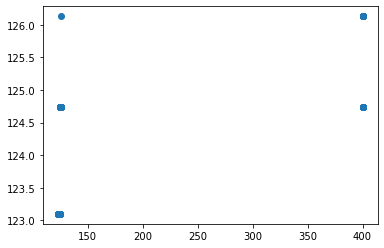

t+1 vs t-298


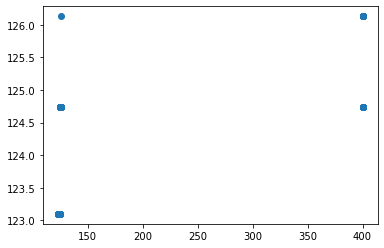

t+1 vs t-299


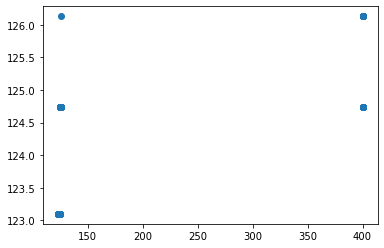

t+1 vs t-300


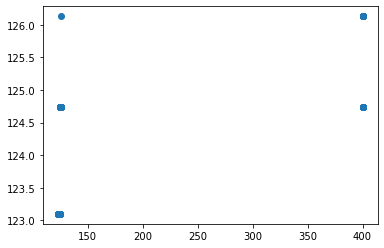

t+1 vs t-301


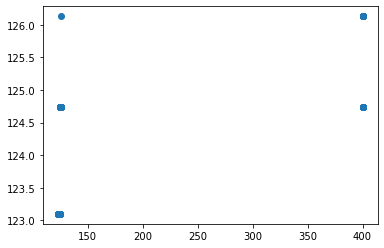

t+1 vs t-302


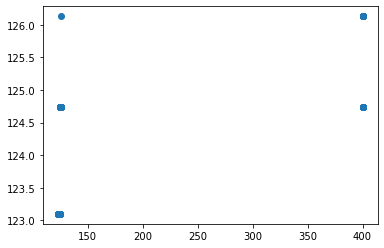

t+1 vs t-303


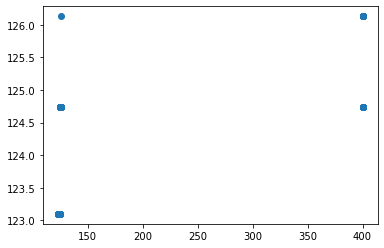

t+1 vs t-304


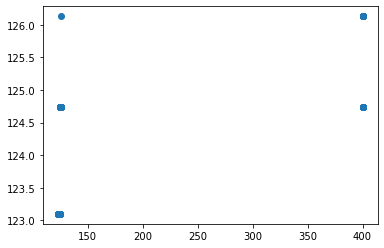

t+1 vs t-305


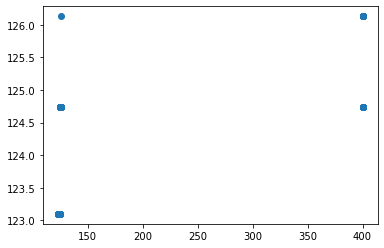

t+1 vs t-306


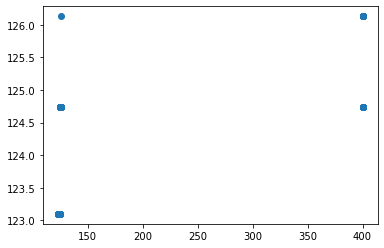

t+1 vs t-307


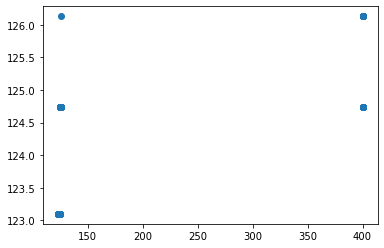

t+1 vs t-308


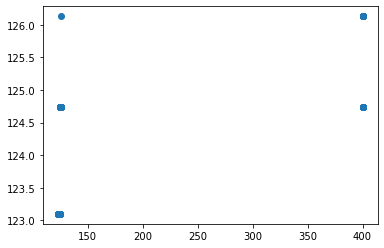

t+1 vs t-309


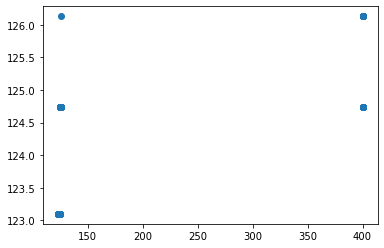

t+1 vs t-310


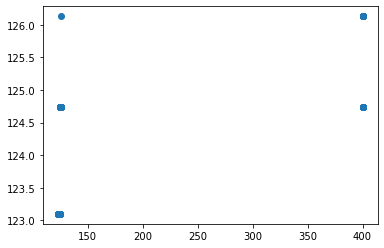

t+1 vs t-311


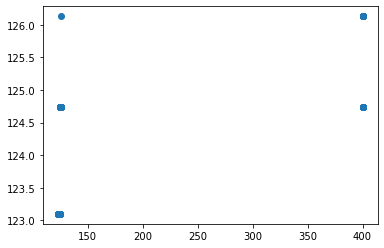

t+1 vs t-312


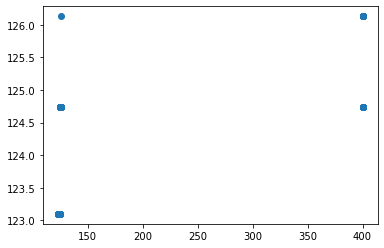

t+1 vs t-313


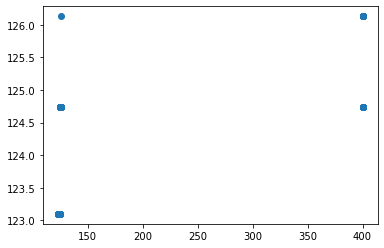

t+1 vs t-314


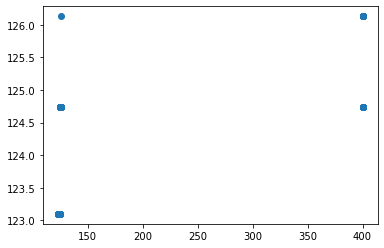

t+1 vs t-315


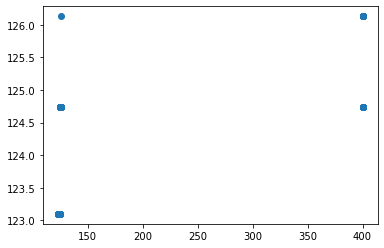

t+1 vs t-316


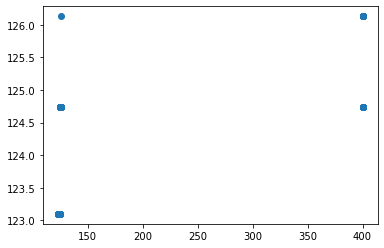

t+1 vs t-317


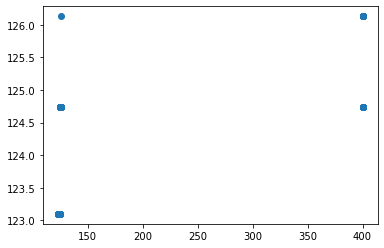

t+1 vs t-318


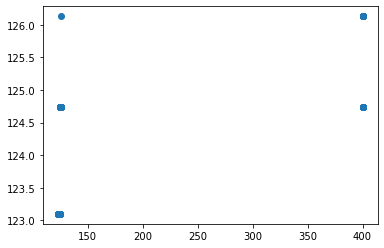

t+1 vs t-319


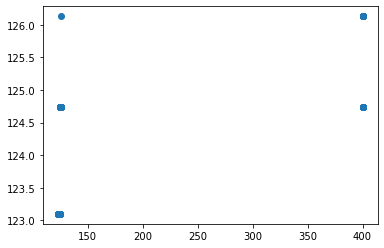

t+1 vs t-320


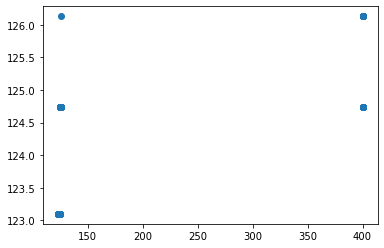

t+1 vs t-321


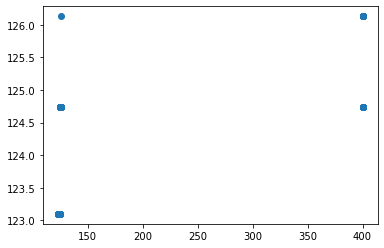

t+1 vs t-322


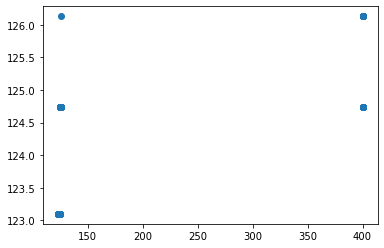

t+1 vs t-323


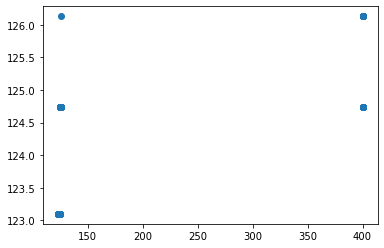

t+1 vs t-324


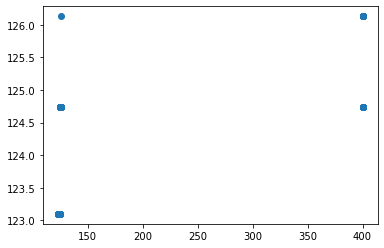

t+1 vs t-325


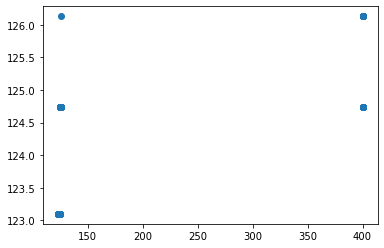

t+1 vs t-326


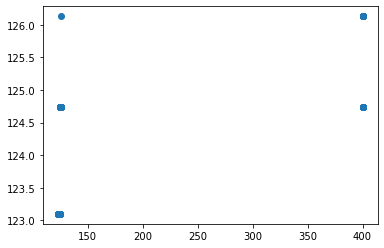

t+1 vs t-327


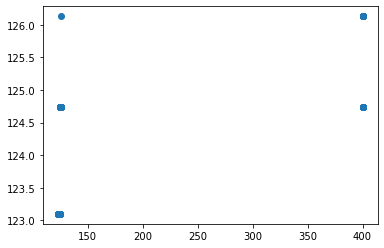

t+1 vs t-328


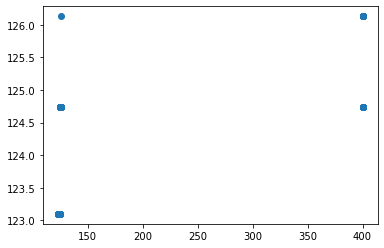

t+1 vs t-329


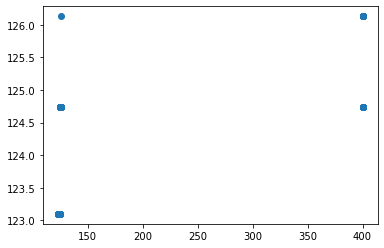

t+1 vs t-330


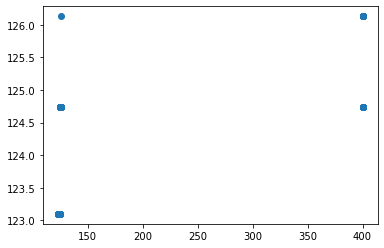

t+1 vs t-331


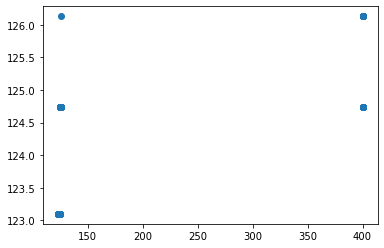

t+1 vs t-332


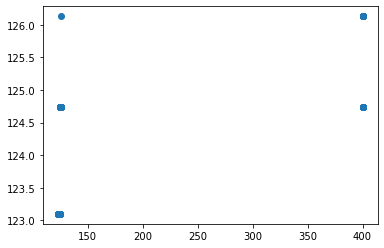

t+1 vs t-333


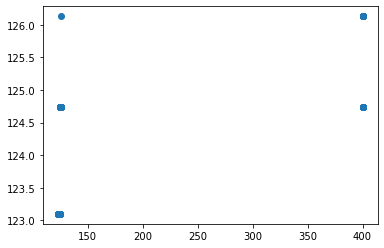

t+1 vs t-334


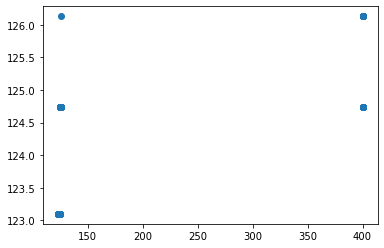

t+1 vs t-335


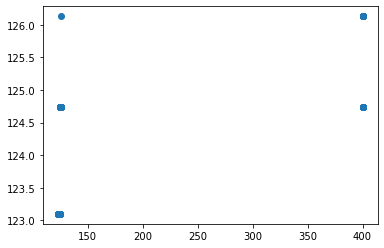

t+1 vs t-336


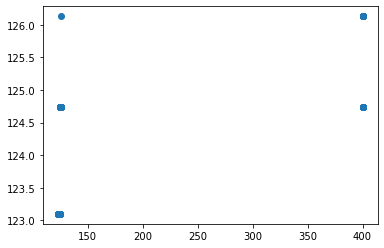

t+1 vs t-337


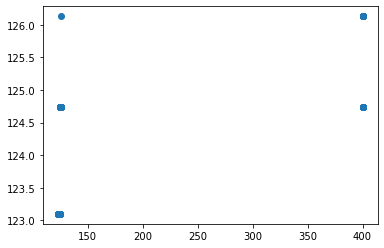

t+1 vs t-338


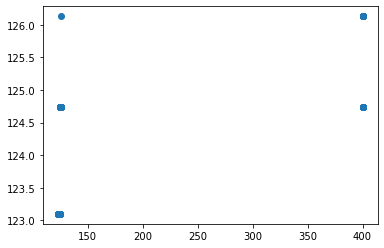

t+1 vs t-339


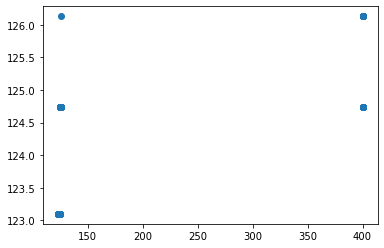

t+1 vs t-340


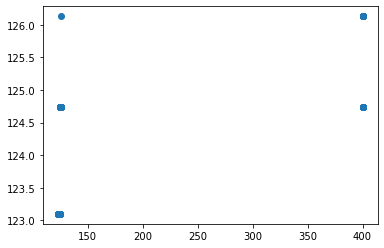

t+1 vs t-341


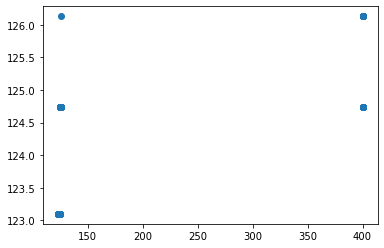

t+1 vs t-342


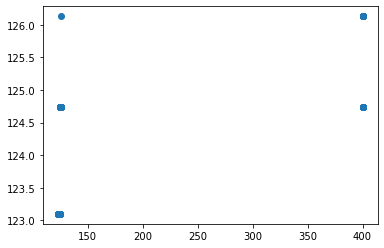

t+1 vs t-343


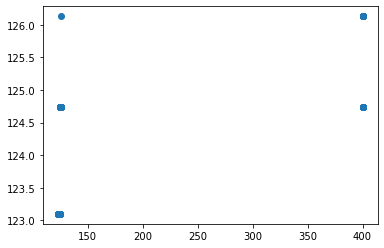

t+1 vs t-344


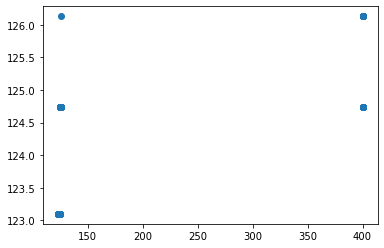

t+1 vs t-345


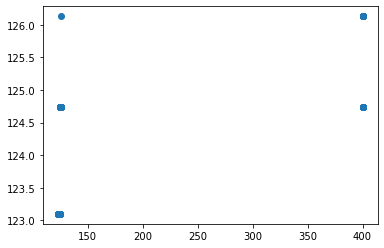

t+1 vs t-346


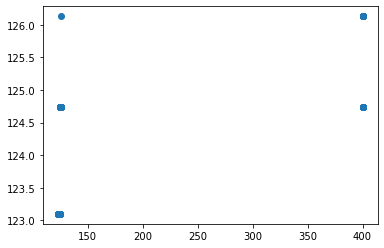

t+1 vs t-347


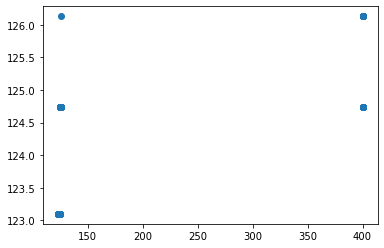

t+1 vs t-348


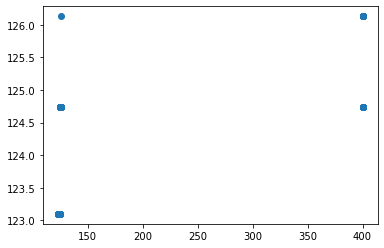

t+1 vs t-349


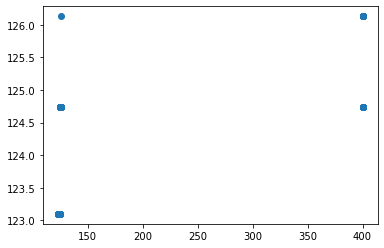

t+1 vs t-350


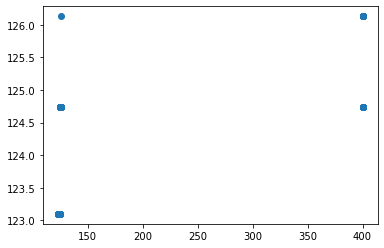

t+1 vs t-351


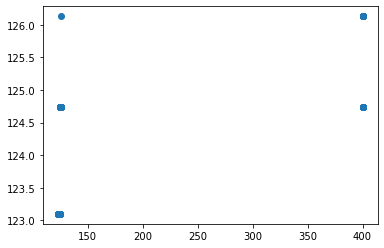

t+1 vs t-352


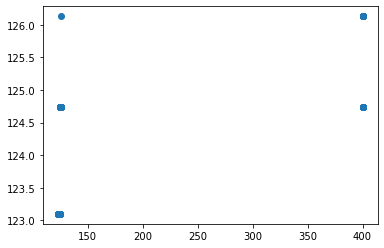

t+1 vs t-353


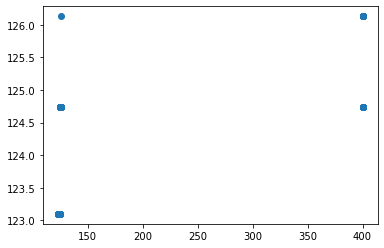

t+1 vs t-354


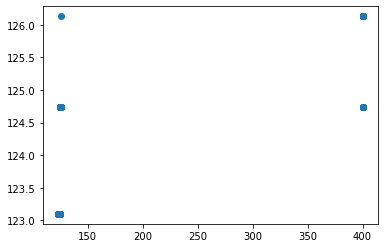

t+1 vs t-355


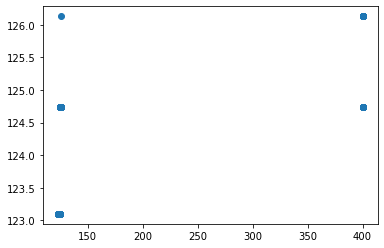

t+1 vs t-356


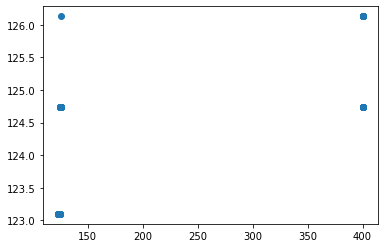

t+1 vs t-357


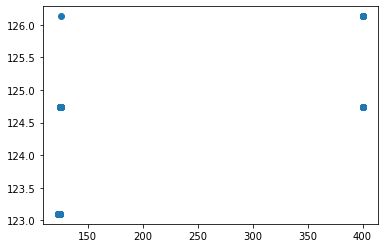

t+1 vs t-358


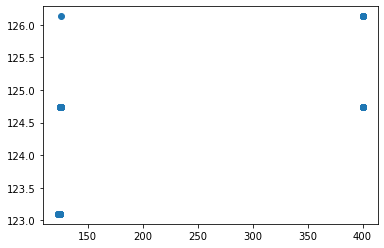

t+1 vs t-359


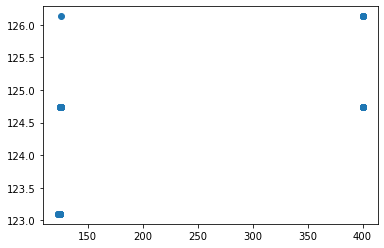

t+1 vs t-360


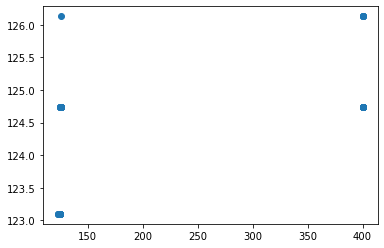

t+1 vs t-361


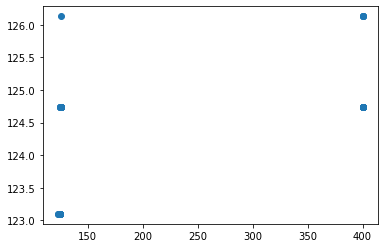

t+1 vs t-362


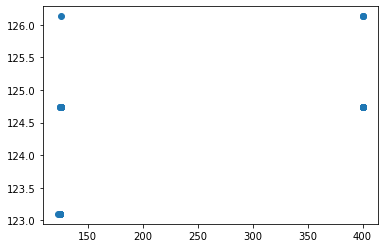

t+1 vs t-363


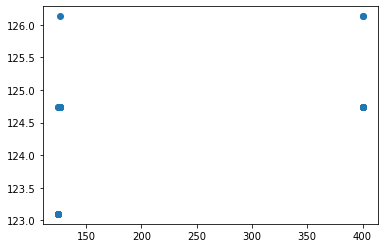

t+1 vs t-364


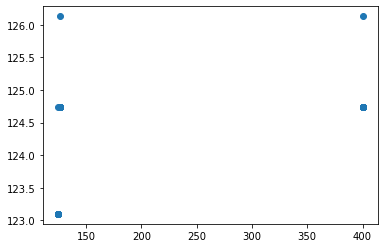

t+1 vs t-365


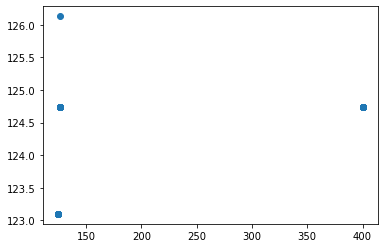

t+1 vs t-366


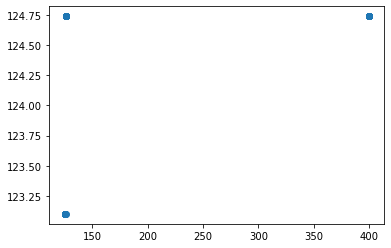

t+1 vs t-367


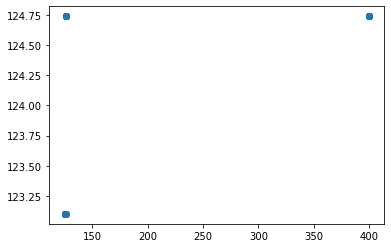

t+1 vs t-368


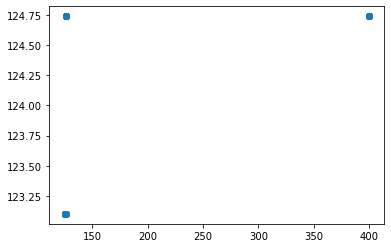

t+1 vs t-369


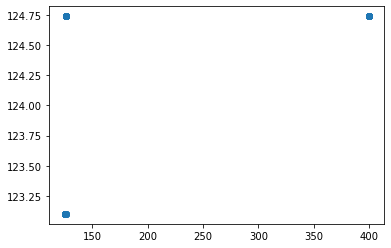

t+1 vs t-370


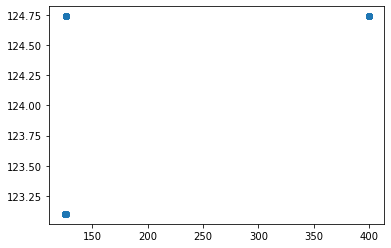

t+1 vs t-371


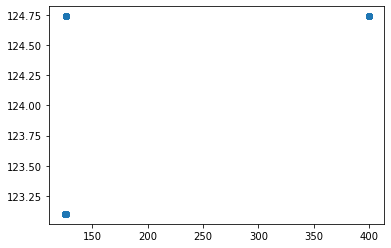

t+1 vs t-372


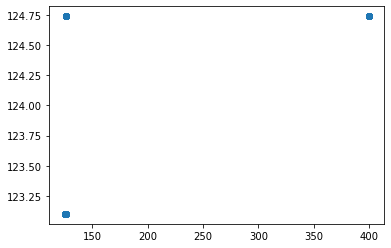

t+1 vs t-373


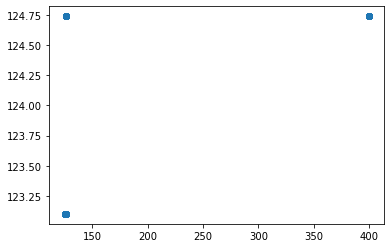

t+1 vs t-374


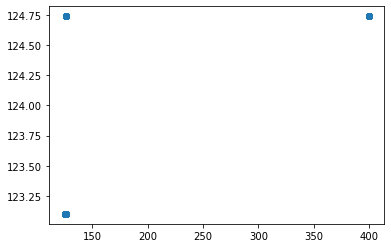

t+1 vs t-375


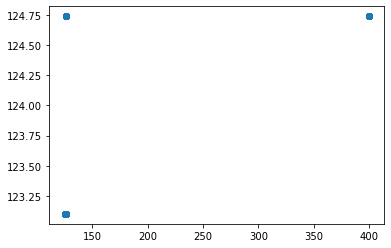

t+1 vs t-376


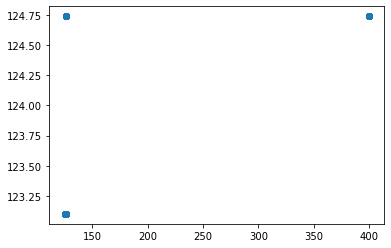

t+1 vs t-377


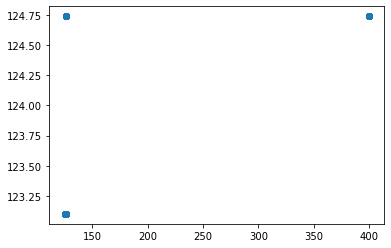

t+1 vs t-378


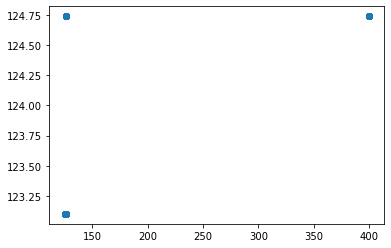

t+1 vs t-379


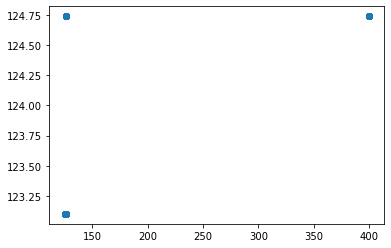

t+1 vs t-380


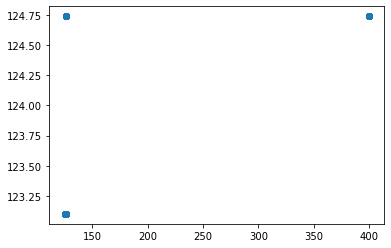

t+1 vs t-381


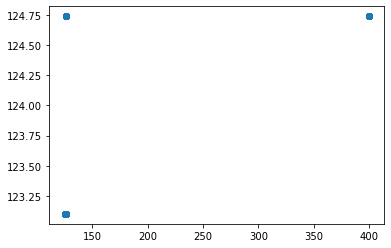

t+1 vs t-382


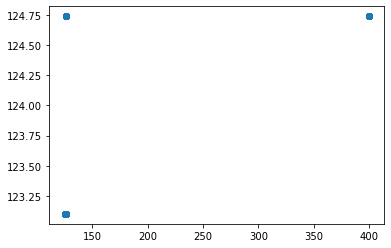

t+1 vs t-383


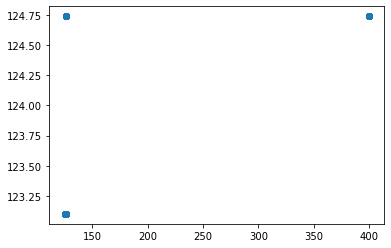

t+1 vs t-384


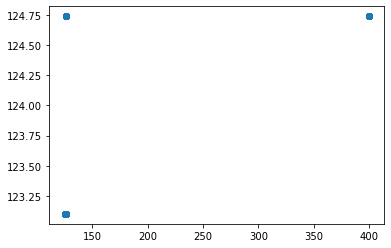

t+1 vs t-385


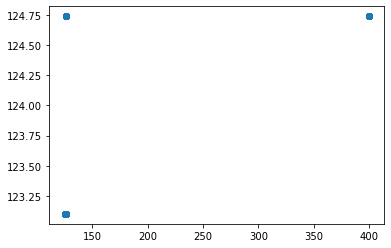

t+1 vs t-386


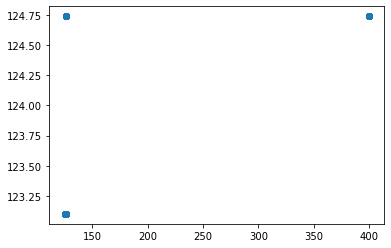

t+1 vs t-387


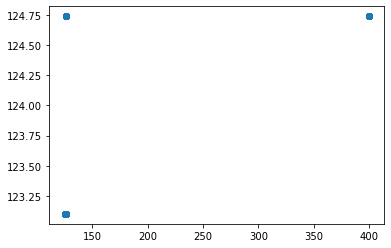

t+1 vs t-388


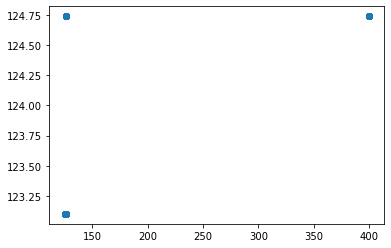

t+1 vs t-389


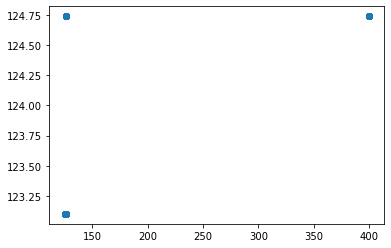

t+1 vs t-390


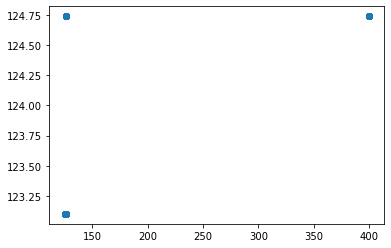

t+1 vs t-391


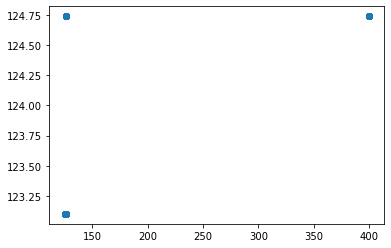

t+1 vs t-392


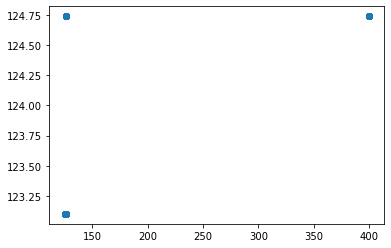

t+1 vs t-393


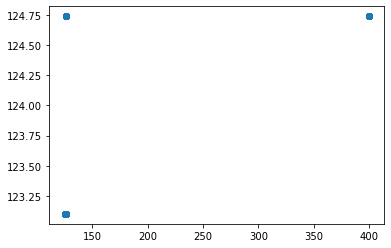

t+1 vs t-394


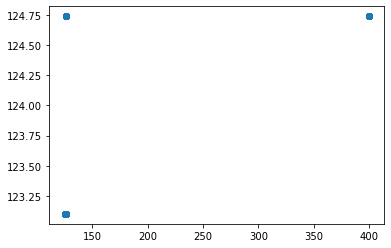

t+1 vs t-395


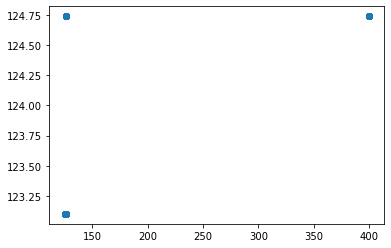

t+1 vs t-396


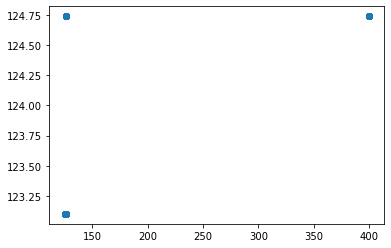

t+1 vs t-397


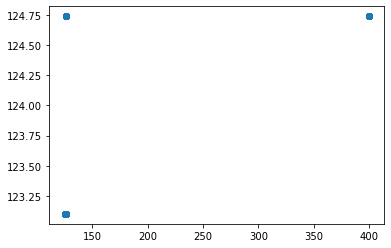

t+1 vs t-398


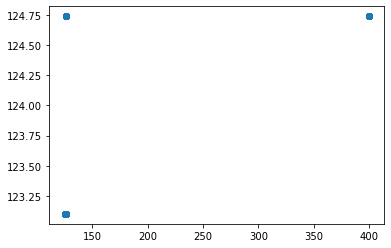

t+1 vs t-399


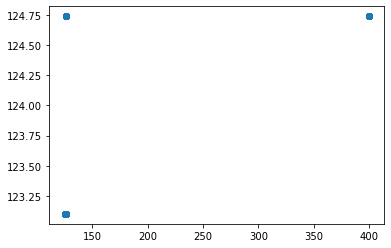

t+1 vs t-400


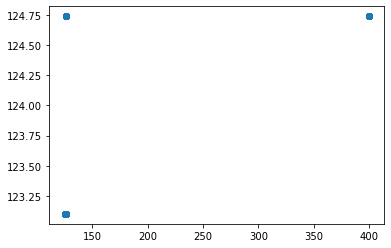

t+1 vs t-401


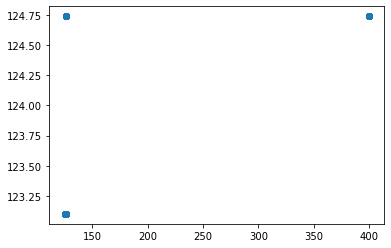

t+1 vs t-402


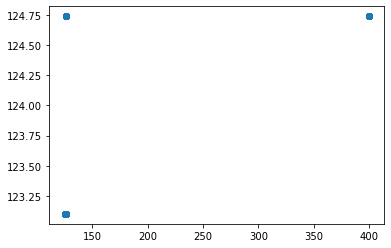

t+1 vs t-403


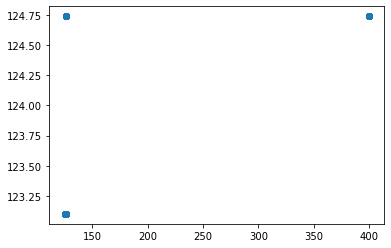

t+1 vs t-404


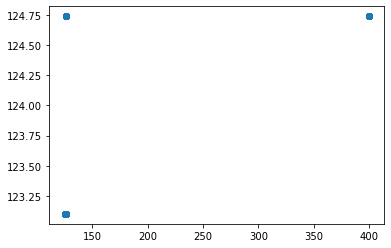

t+1 vs t-405


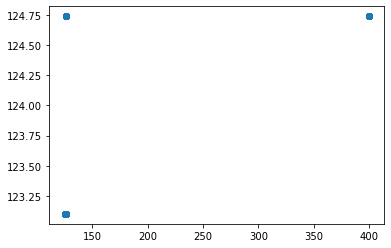

t+1 vs t-406


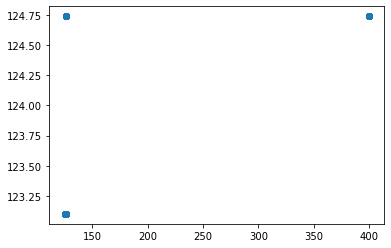

t+1 vs t-407


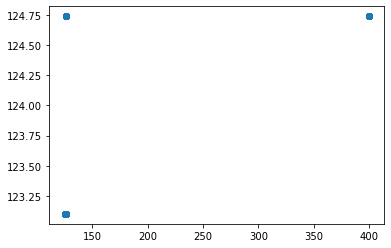

t+1 vs t-408


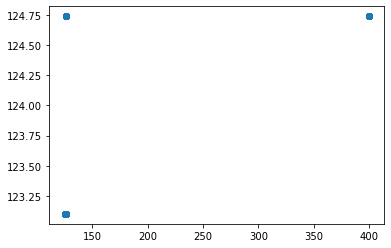

t+1 vs t-409


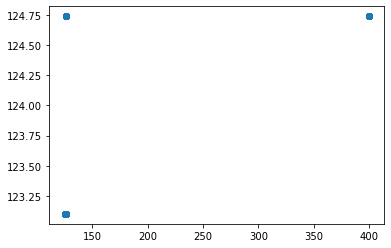

t+1 vs t-410


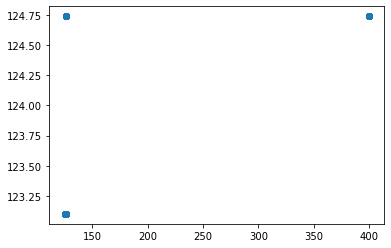

t+1 vs t-411


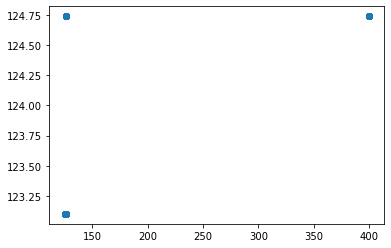

t+1 vs t-412


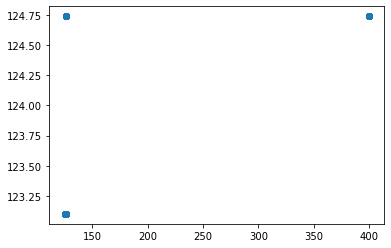

t+1 vs t-413


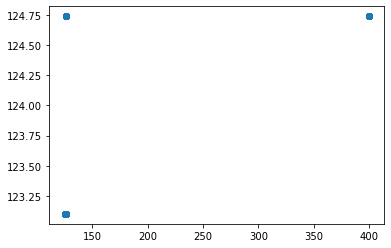

t+1 vs t-414


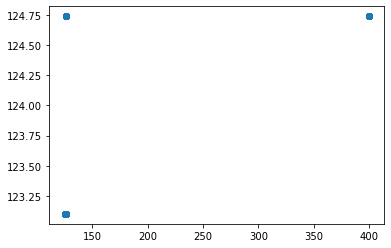

t+1 vs t-415


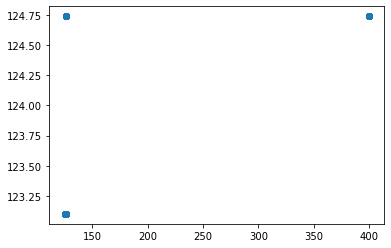

t+1 vs t-416


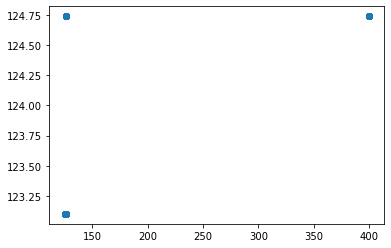

t+1 vs t-417


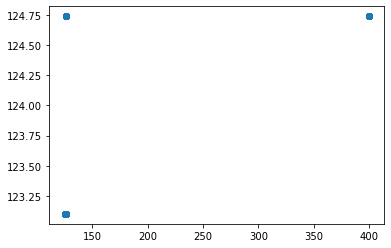

t+1 vs t-418


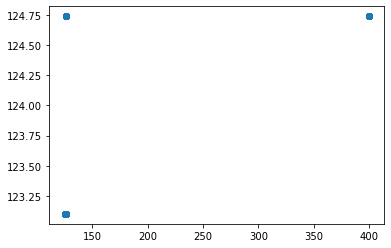

t+1 vs t-419


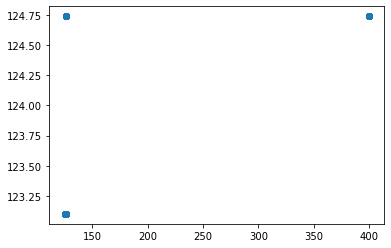

t+1 vs t-420


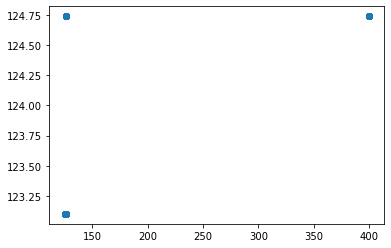

t+1 vs t-421


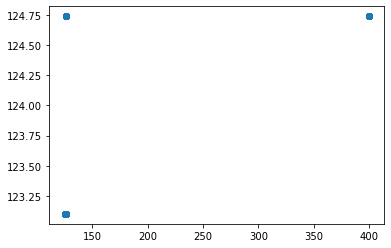

t+1 vs t-422


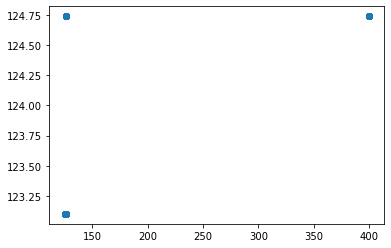

t+1 vs t-423


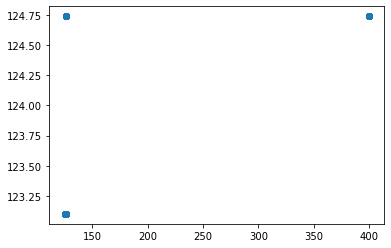

t+1 vs t-424


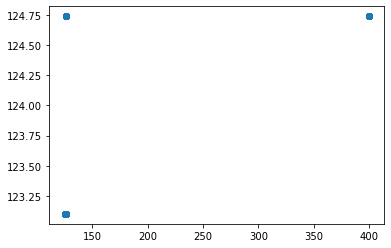

t+1 vs t-425


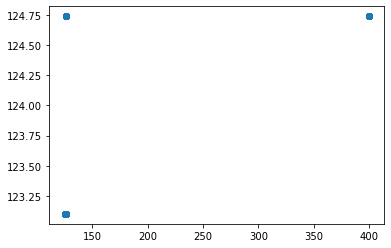

t+1 vs t-426


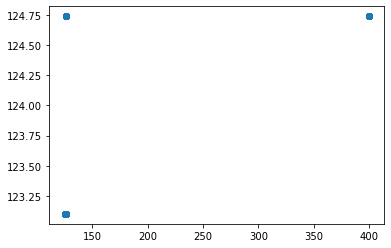

t+1 vs t-427


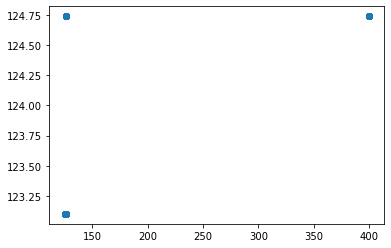

t+1 vs t-428


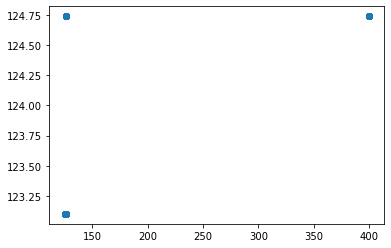

t+1 vs t-429


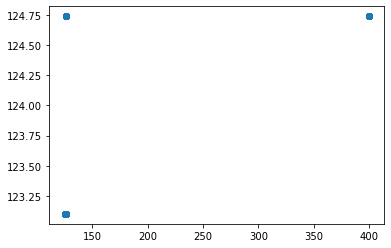

t+1 vs t-430


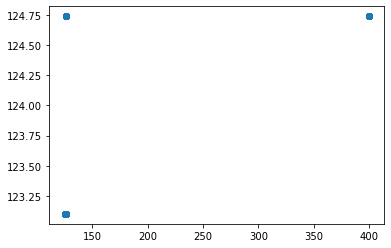

t+1 vs t-431


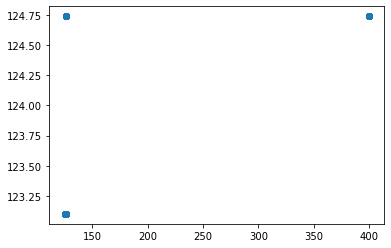

t+1 vs t-432


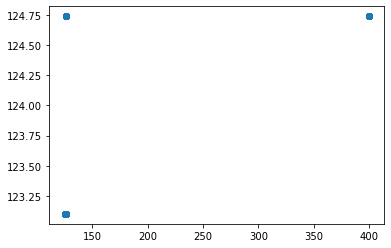

t+1 vs t-433


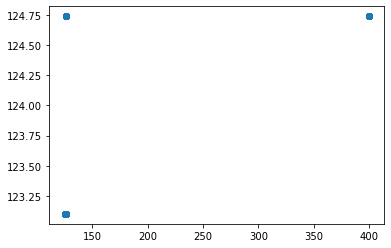

t+1 vs t-434


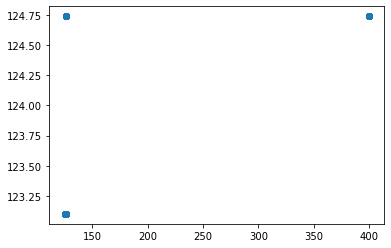

t+1 vs t-435


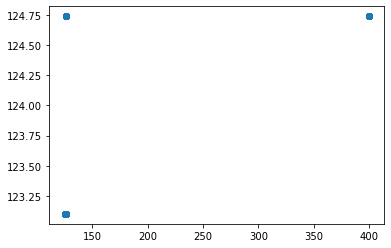

t+1 vs t-436


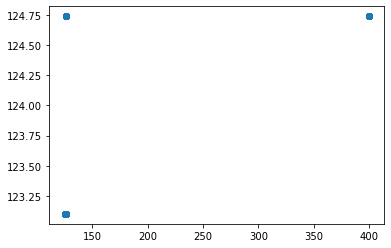

t+1 vs t-437


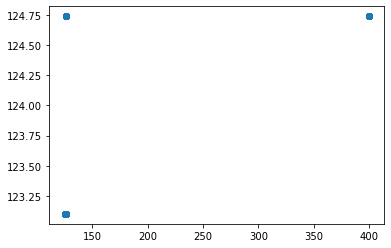

t+1 vs t-438


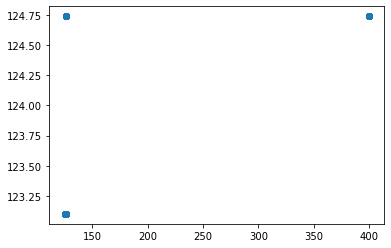

t+1 vs t-439


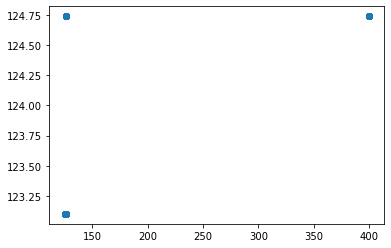

t+1 vs t-440


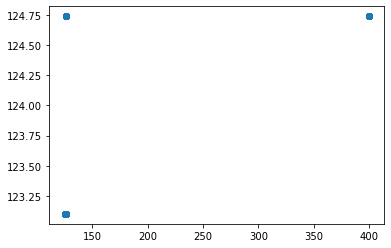

t+1 vs t-441


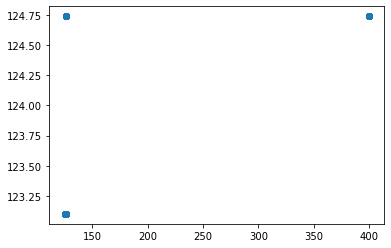

t+1 vs t-442


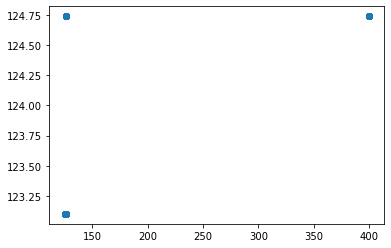

t+1 vs t-443


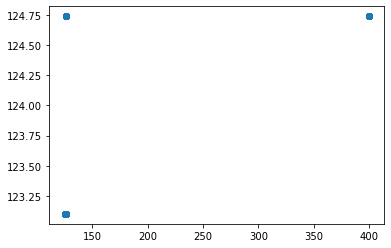

t+1 vs t-444


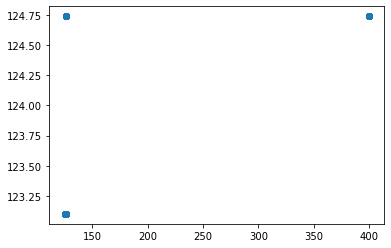

t+1 vs t-445


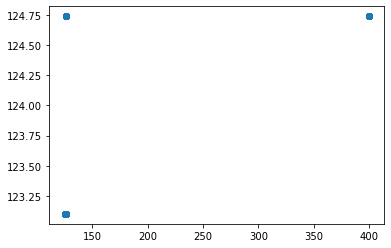

t+1 vs t-446


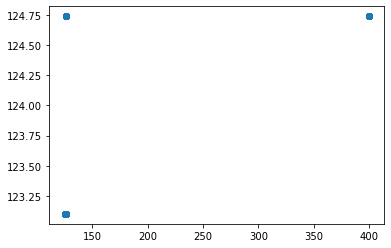

t+1 vs t-447


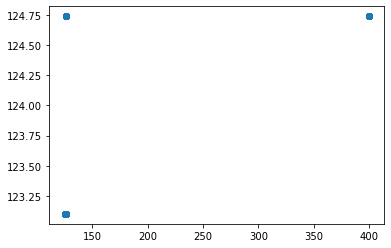

t+1 vs t-448


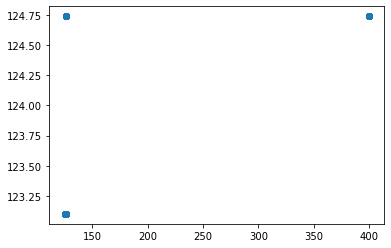

t+1 vs t-449


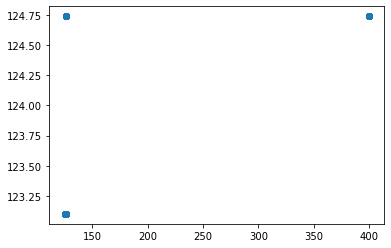

t+1 vs t-450


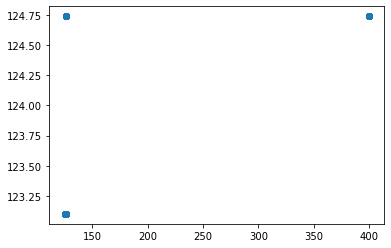

t+1 vs t-451


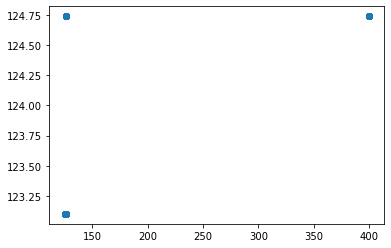

t+1 vs t-452


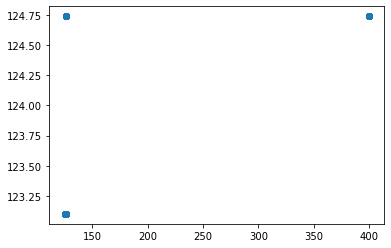

t+1 vs t-453


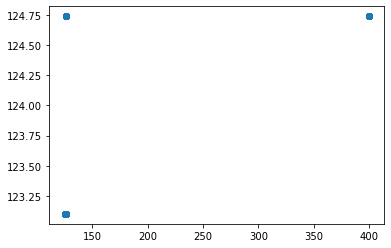

t+1 vs t-454


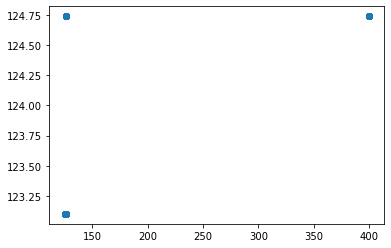

t+1 vs t-455


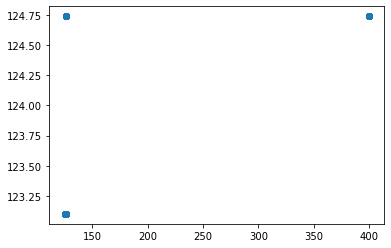

t+1 vs t-456


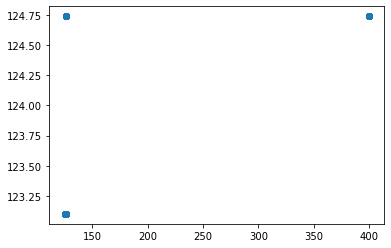

t+1 vs t-457


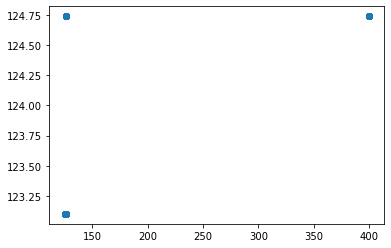

t+1 vs t-458


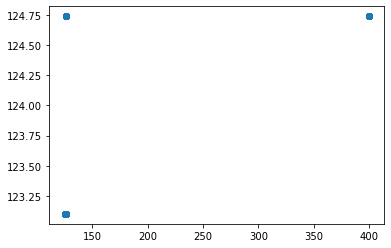

t+1 vs t-459


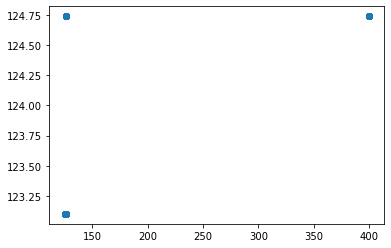

t+1 vs t-460


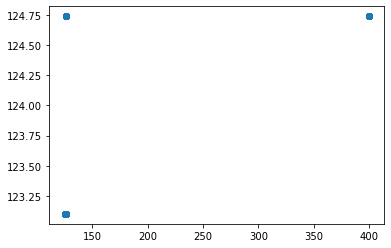

t+1 vs t-461


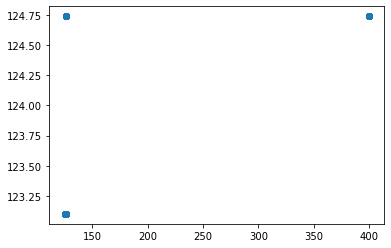

t+1 vs t-462


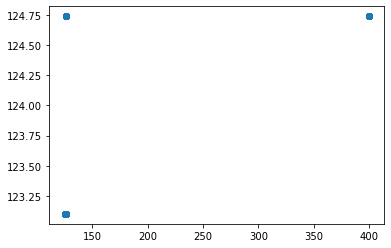

t+1 vs t-463


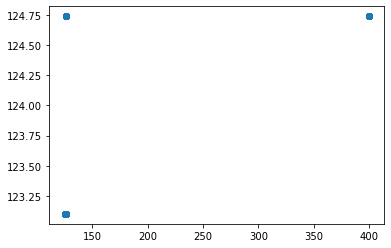

t+1 vs t-464


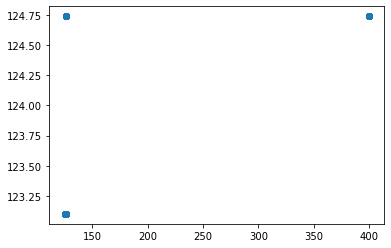

t+1 vs t-465


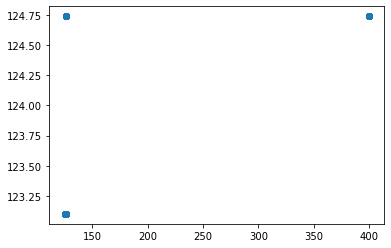

t+1 vs t-466


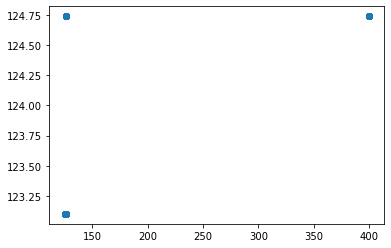

t+1 vs t-467


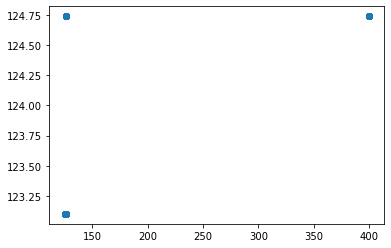

t+1 vs t-468


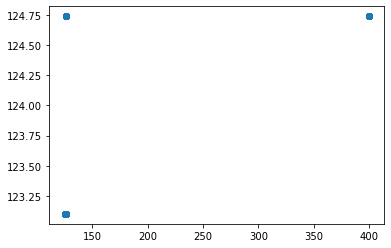

t+1 vs t-469


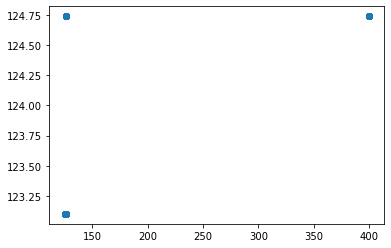

t+1 vs t-470


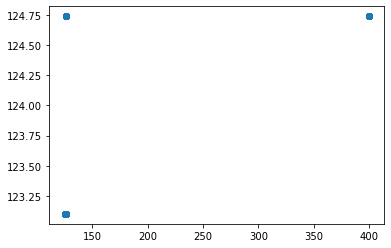

t+1 vs t-471


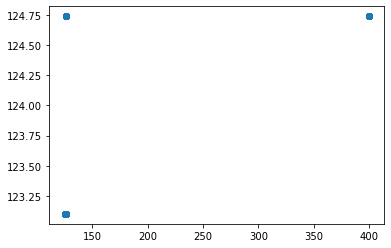

t+1 vs t-472


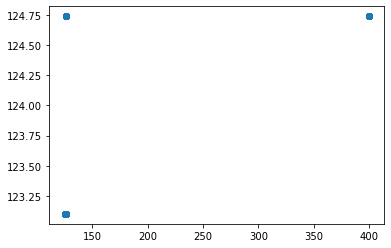

t+1 vs t-473


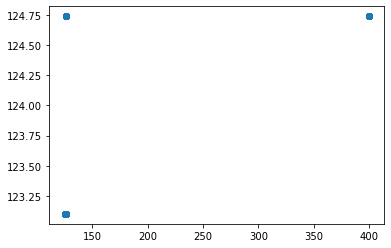

t+1 vs t-474


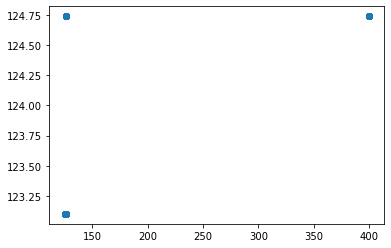

t+1 vs t-475


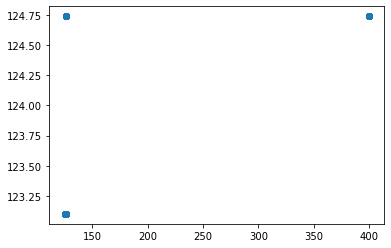

t+1 vs t-476


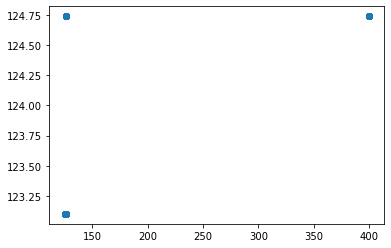

t+1 vs t-477


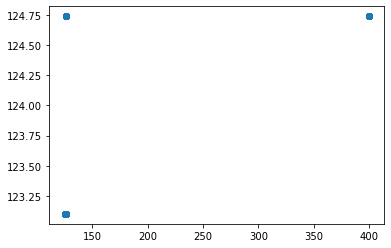

t+1 vs t-478


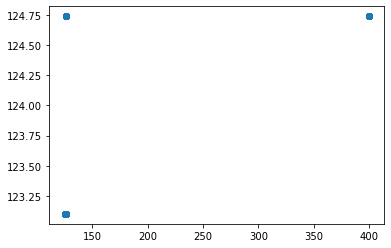

t+1 vs t-479


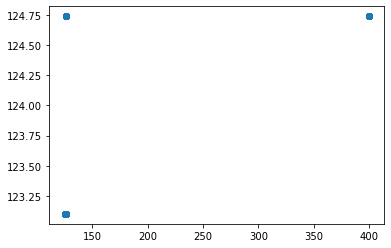

t+1 vs t-480


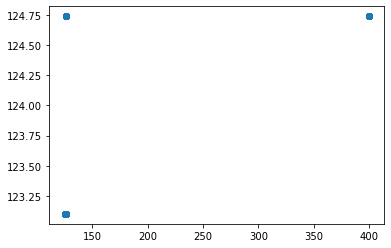

t+1 vs t-481


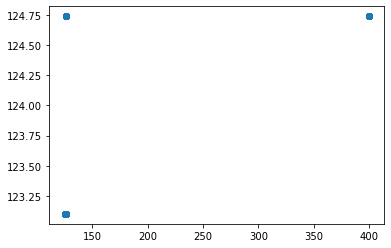

t+1 vs t-482


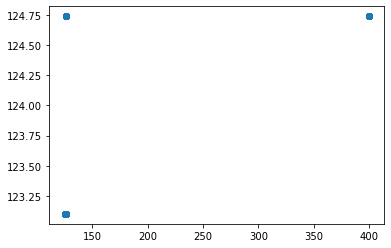

t+1 vs t-483


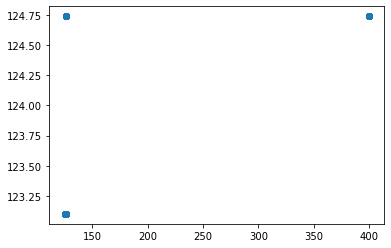

t+1 vs t-484


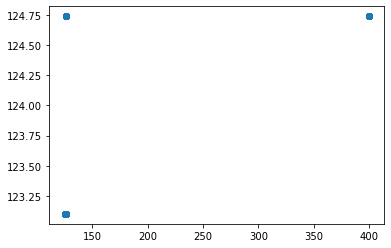

t+1 vs t-485


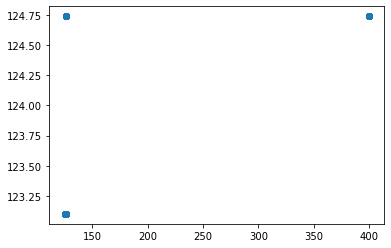

t+1 vs t-486


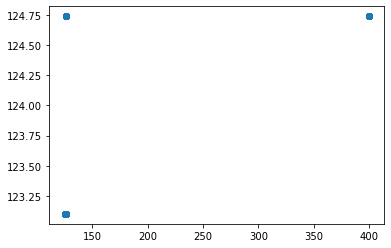

t+1 vs t-487


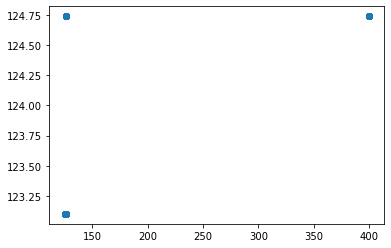

t+1 vs t-488


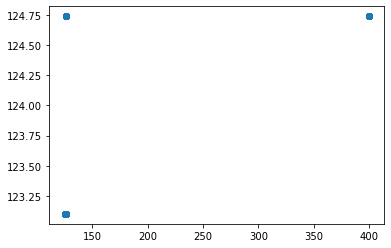

t+1 vs t-489


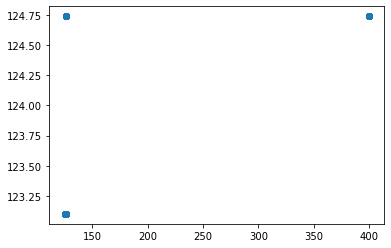

t+1 vs t-490


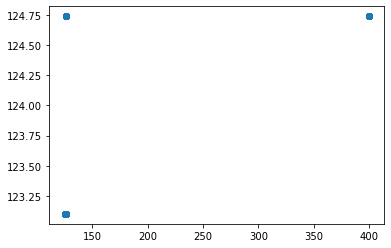

t+1 vs t-491


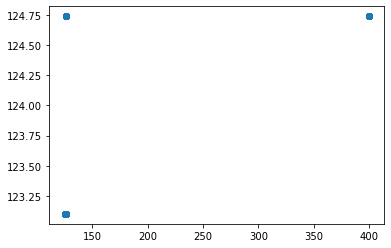

t+1 vs t-492


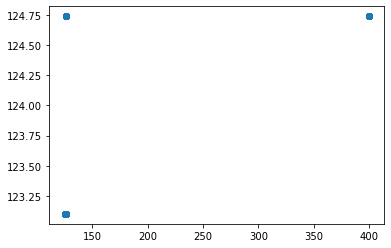

t+1 vs t-493


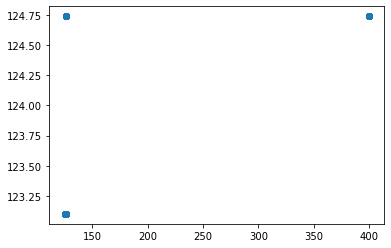

t+1 vs t-494


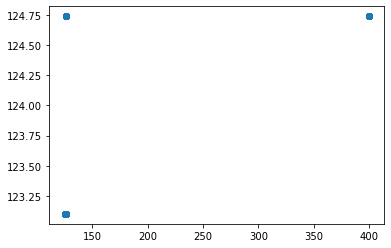

t+1 vs t-495


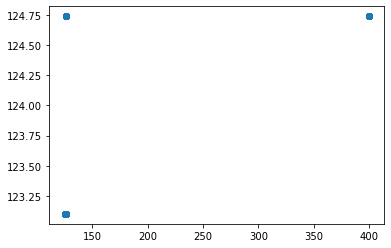

t+1 vs t-496


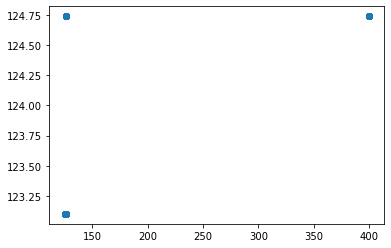

t+1 vs t-497


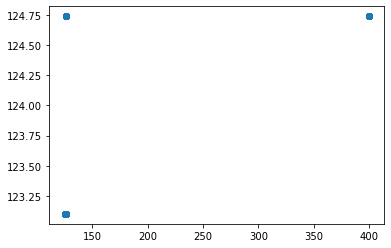

t+1 vs t-498


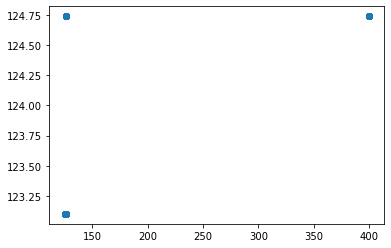

t+1 vs t-499


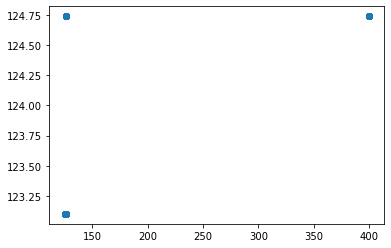

t+1 vs t-500


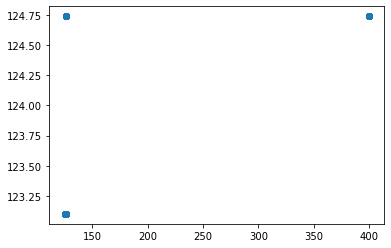

t+1 vs t-501


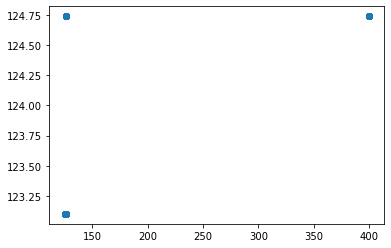

t+1 vs t-502


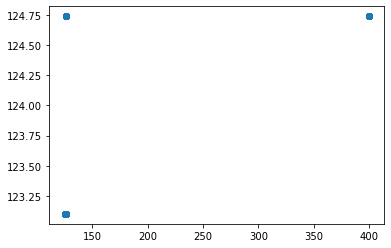

t+1 vs t-503


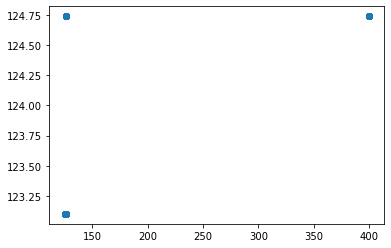

t+1 vs t-504


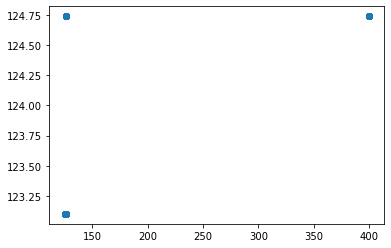

t+1 vs t-505


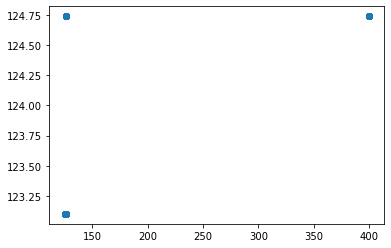

t+1 vs t-506


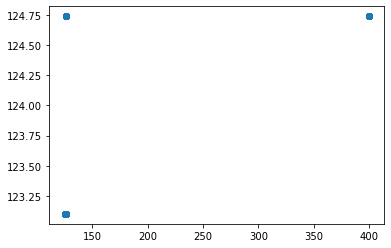

t+1 vs t-507


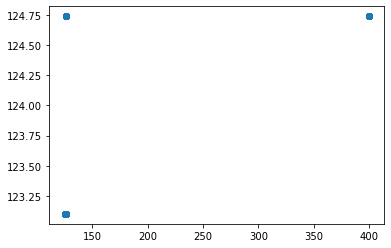

t+1 vs t-508


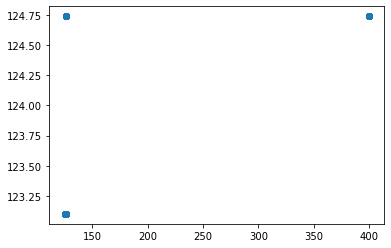

t+1 vs t-509


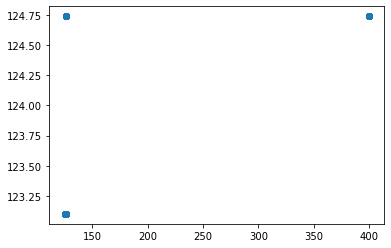

t+1 vs t-510


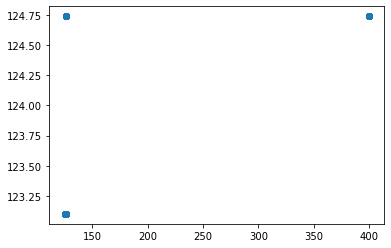

t+1 vs t-511


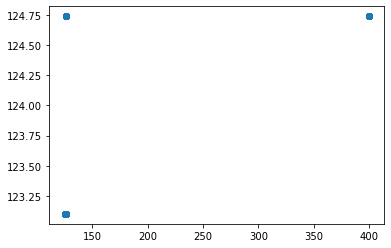

t+1 vs t-512


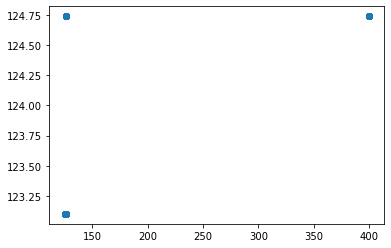

t+1 vs t-513


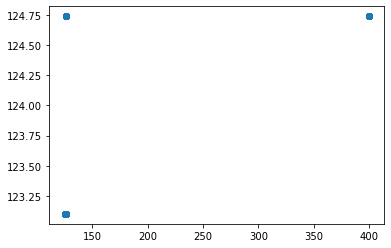

t+1 vs t-514


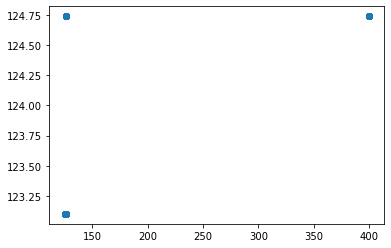

t+1 vs t-515


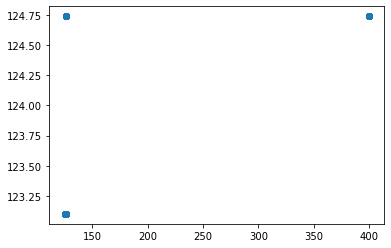

t+1 vs t-516


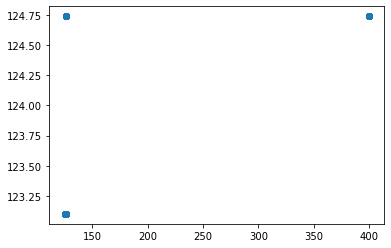

t+1 vs t-517


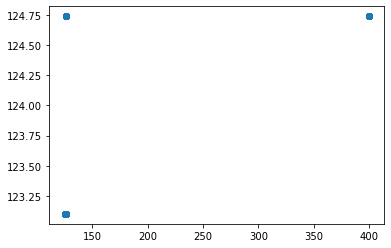

t+1 vs t-518


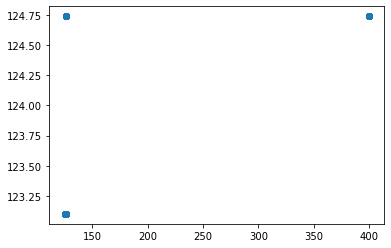

t+1 vs t-519


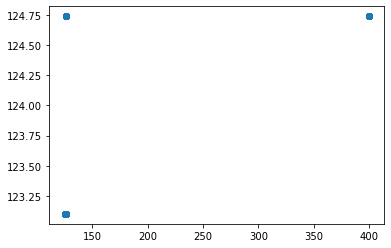

t+1 vs t-520


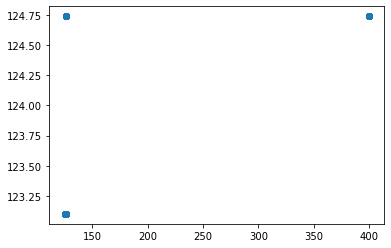

t+1 vs t-521


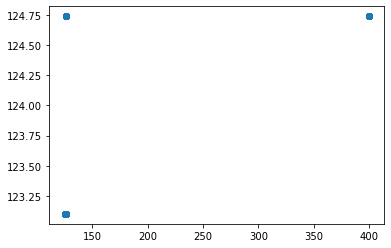

t+1 vs t-522


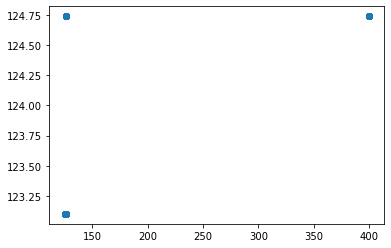

t+1 vs t-523


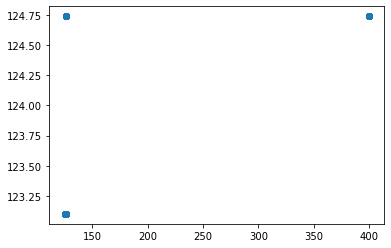

t+1 vs t-524


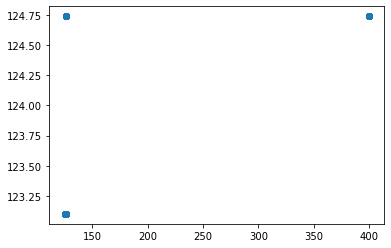

t+1 vs t-525


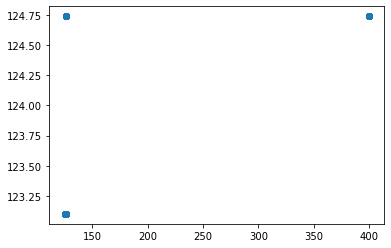

t+1 vs t-526


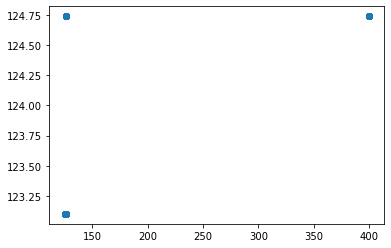

t+1 vs t-527


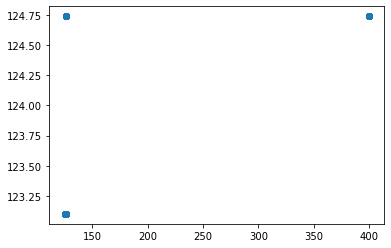

t+1 vs t-528


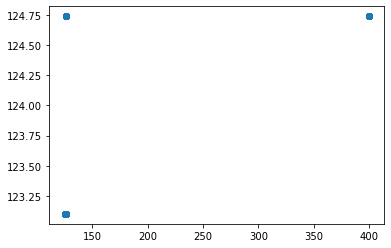

t+1 vs t-529


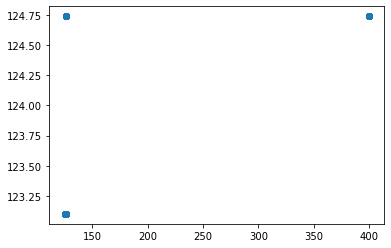

t+1 vs t-530


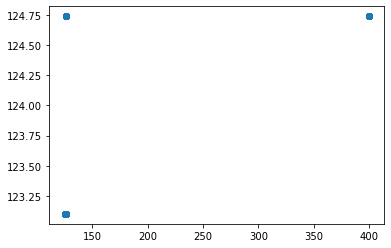

t+1 vs t-531


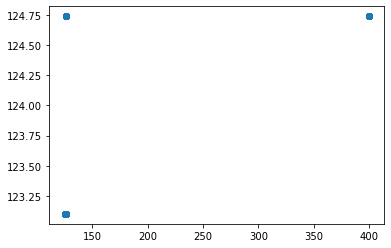

t+1 vs t-532


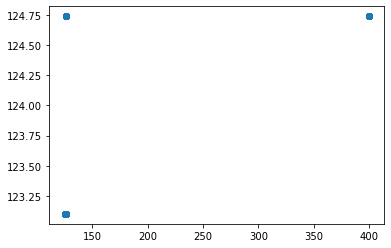

t+1 vs t-533


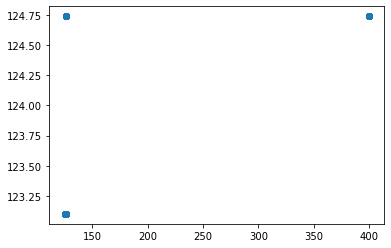

t+1 vs t-534


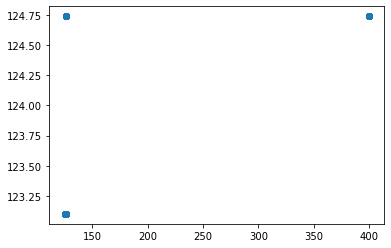

t+1 vs t-535


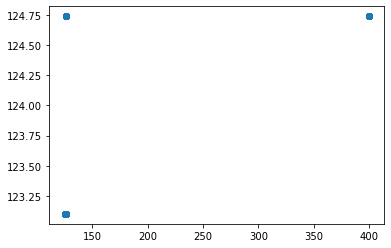

t+1 vs t-536


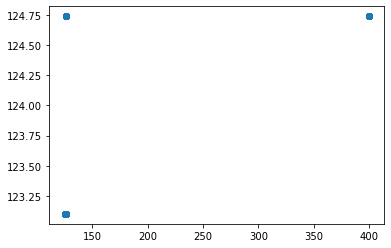

t+1 vs t-537


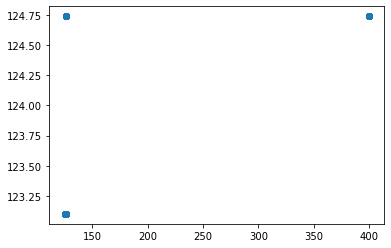

t+1 vs t-538


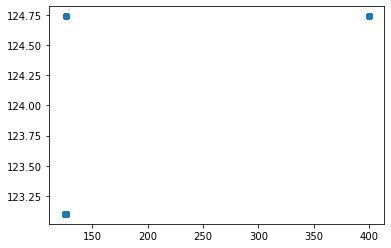

t+1 vs t-539


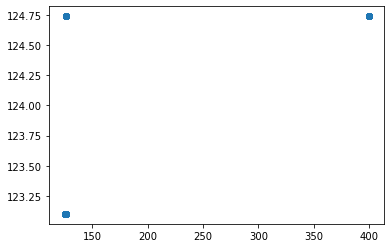

t+1 vs t-540


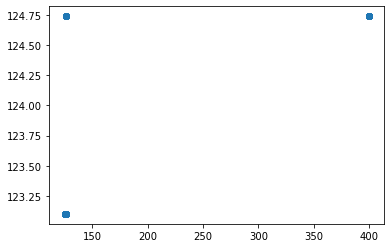

t+1 vs t-541


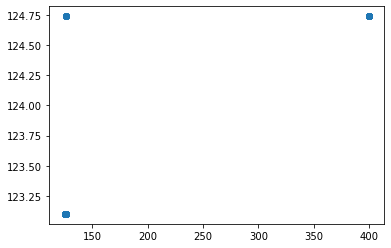

t+1 vs t-542


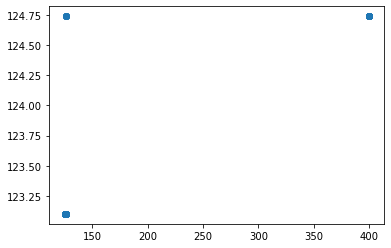

t+1 vs t-543


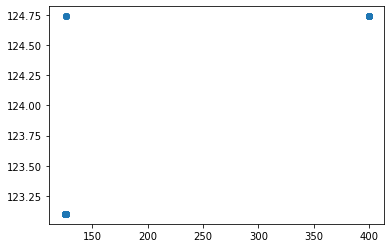

t+1 vs t-544


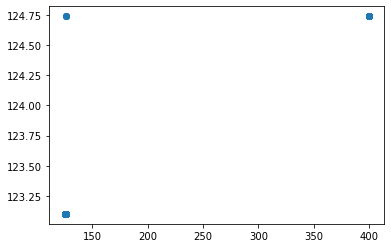

t+1 vs t-545


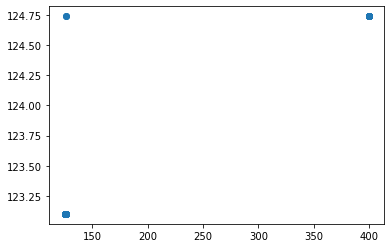

t+1 vs t-546


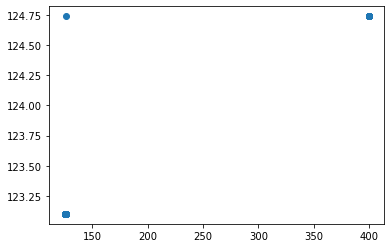

t+1 vs t-547


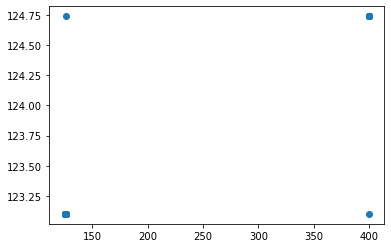

t+1 vs t-548


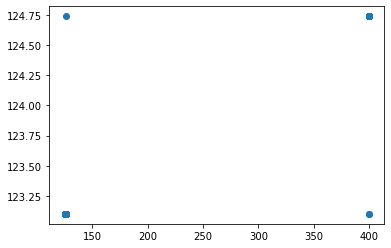

t+1 vs t-549


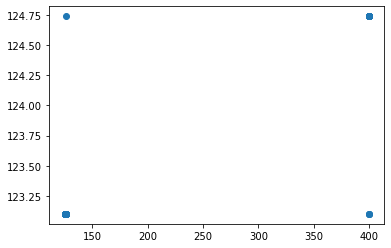

t+1 vs t-550


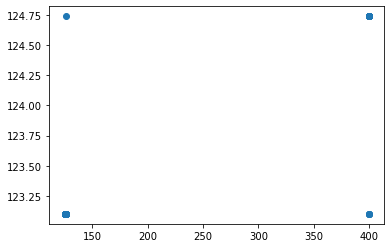

t+1 vs t-551


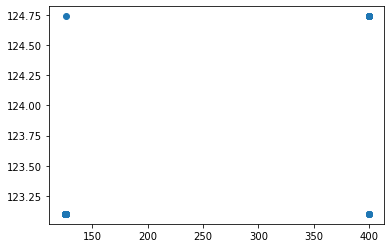

t+1 vs t-552


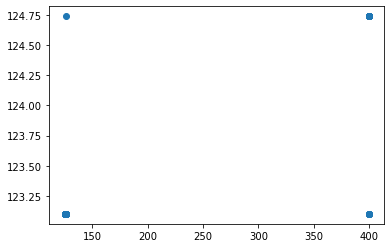

t+1 vs t-553


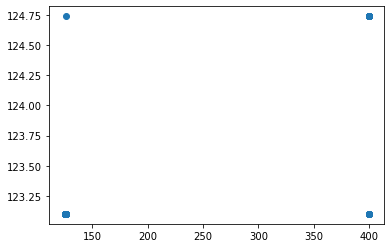

t+1 vs t-554


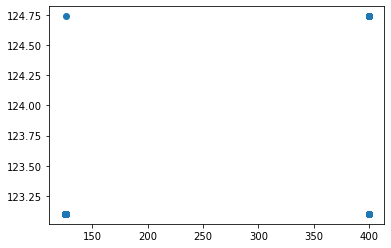

t+1 vs t-555


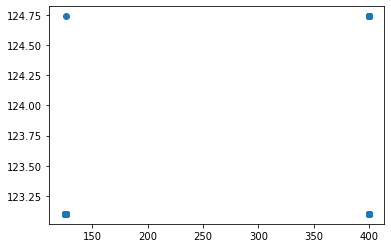

t+1 vs t-556


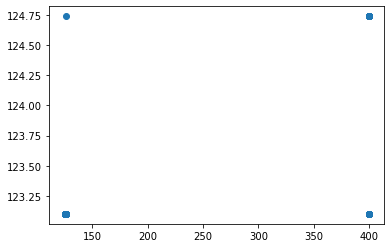

t+1 vs t-557


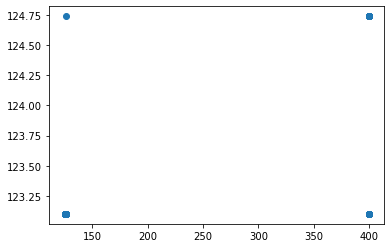

t+1 vs t-558


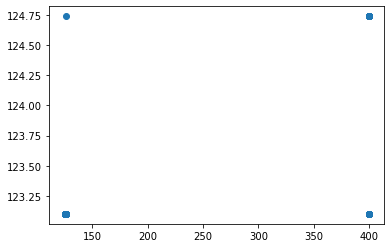

t+1 vs t-559


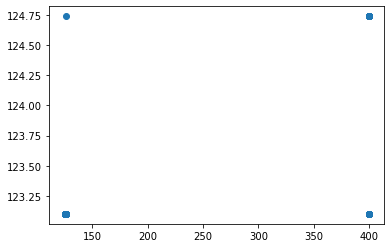

t+1 vs t-560


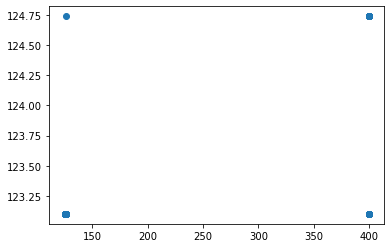

t+1 vs t-561


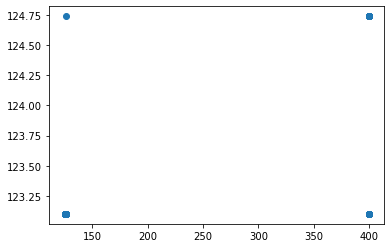

t+1 vs t-562


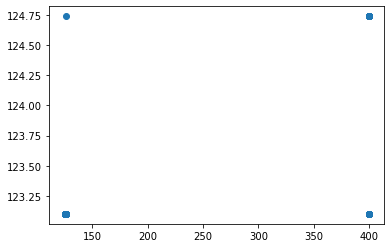

t+1 vs t-563


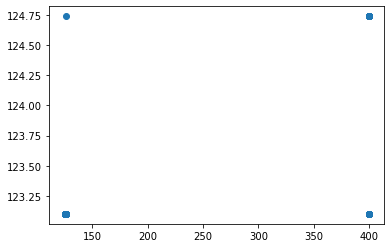

t+1 vs t-564


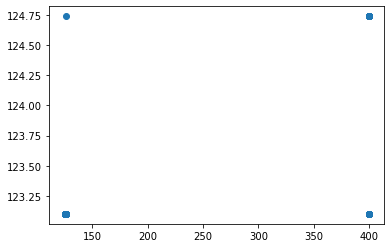

t+1 vs t-565


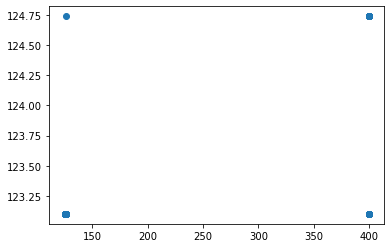

t+1 vs t-566


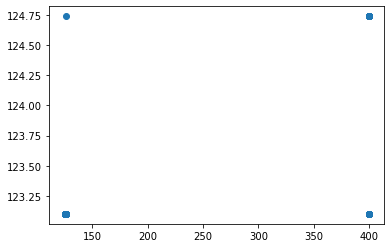

t+1 vs t-567


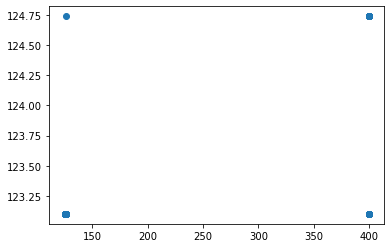

t+1 vs t-568


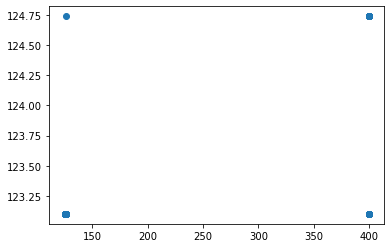

t+1 vs t-569


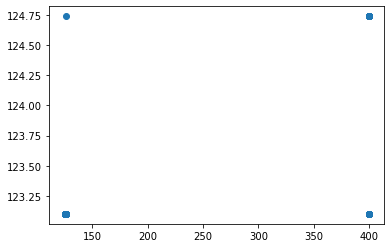

t+1 vs t-570


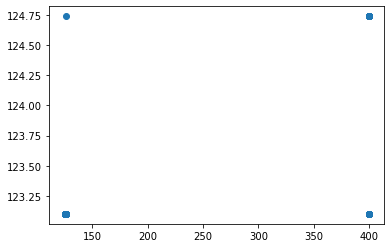

t+1 vs t-571


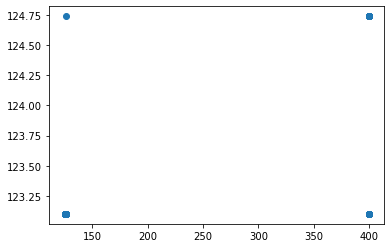

t+1 vs t-572


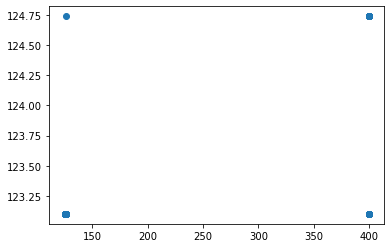

t+1 vs t-573


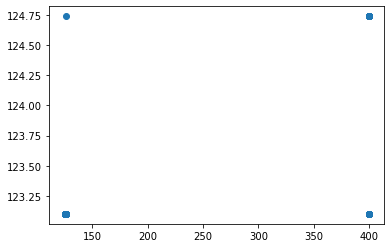

t+1 vs t-574


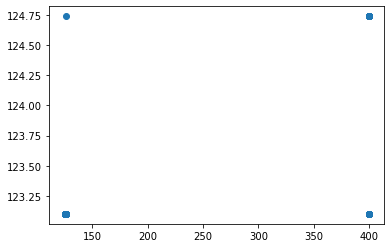

t+1 vs t-575


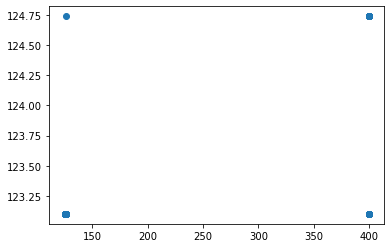

t+1 vs t-576


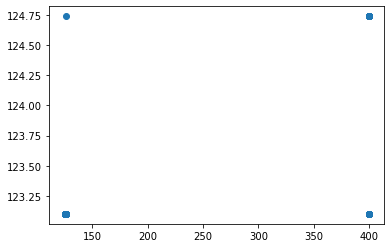

t+1 vs t-577


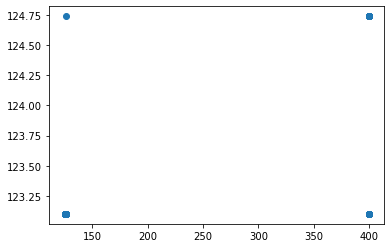

t+1 vs t-578


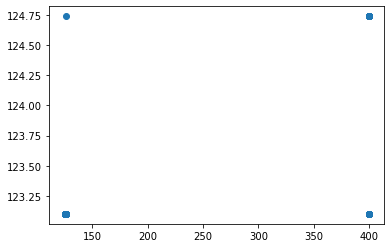

t+1 vs t-579


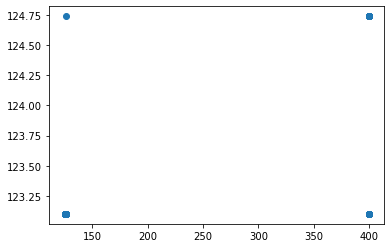

t+1 vs t-580


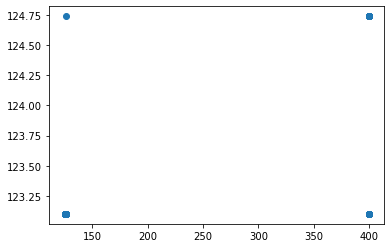

t+1 vs t-581


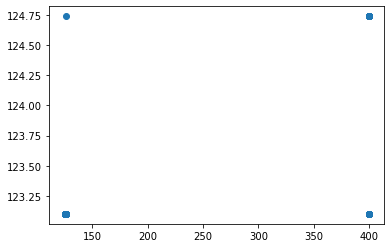

t+1 vs t-582


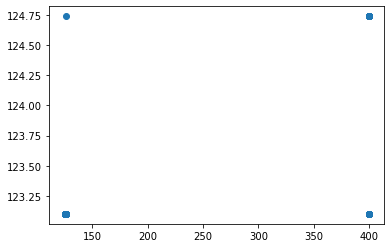

t+1 vs t-583


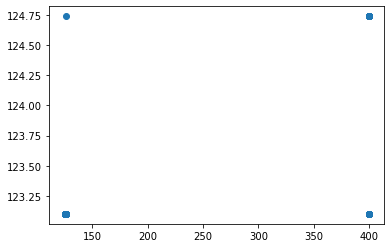

t+1 vs t-584


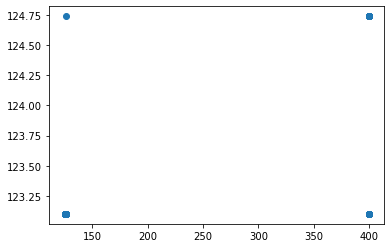

t+1 vs t-585


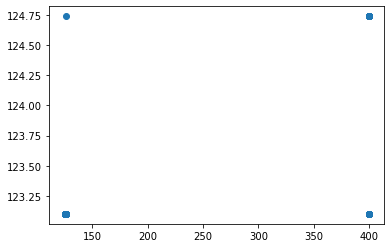

t+1 vs t-586


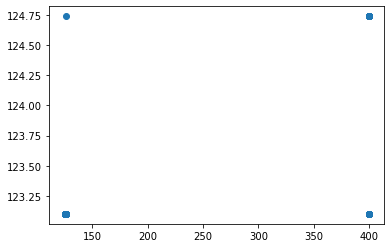

t+1 vs t-587


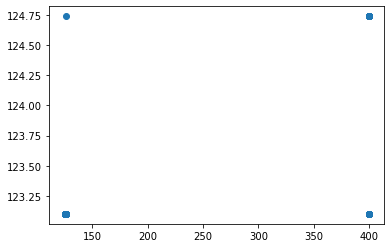

t+1 vs t-588


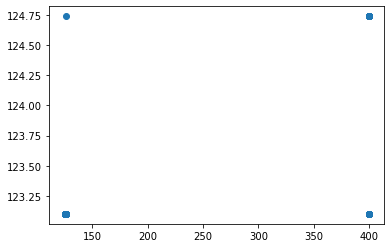

t+1 vs t-589


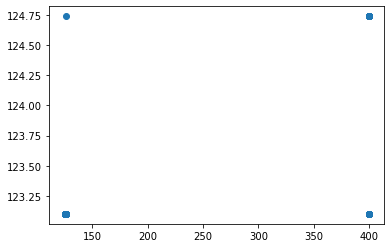

t+1 vs t-590


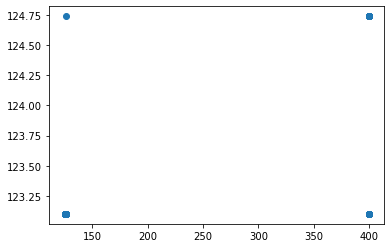

t+1 vs t-591


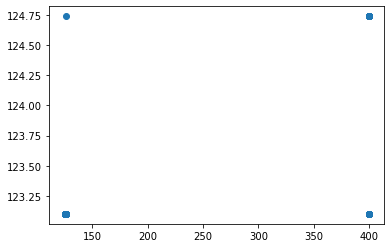

t+1 vs t-592


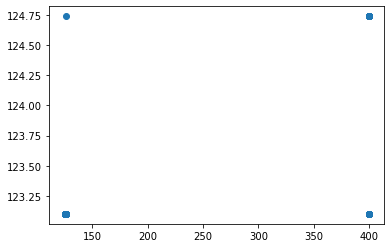

t+1 vs t-593


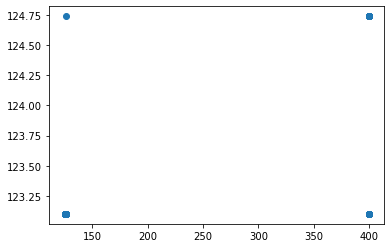

t+1 vs t-594


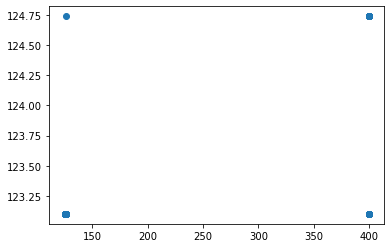

t+1 vs t-595


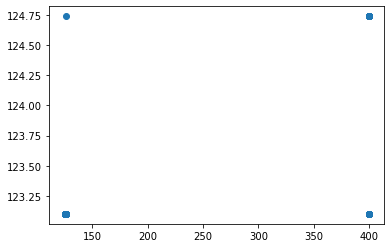

t+1 vs t-596


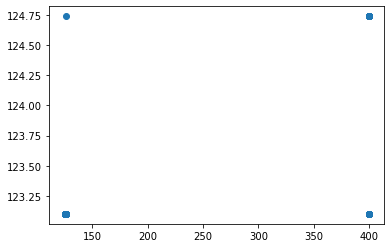

t+1 vs t-597


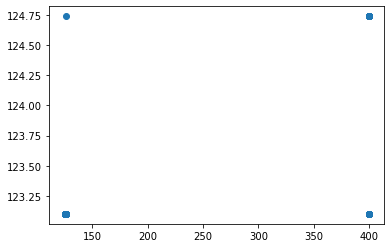

t+1 vs t-598


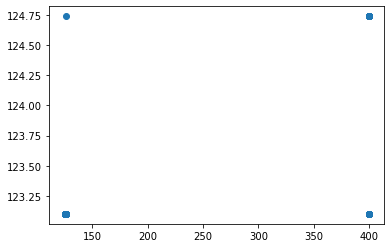

t+1 vs t-599


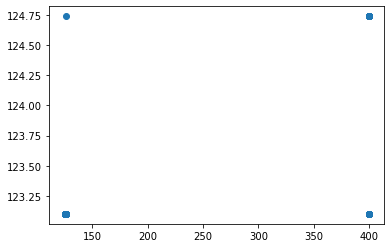

t+1 vs t-600


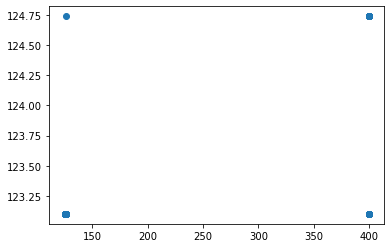

t+1 vs t-601


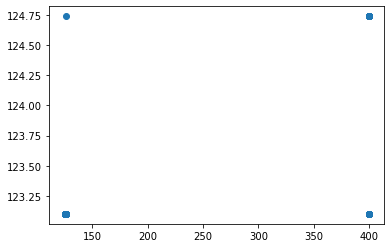

t+1 vs t-602


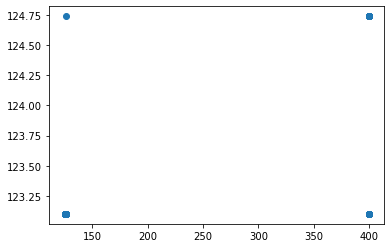

t+1 vs t-603


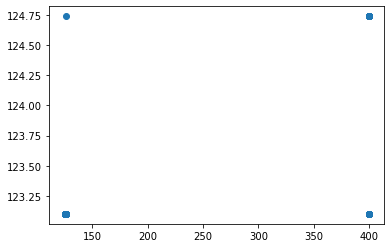

t+1 vs t-604


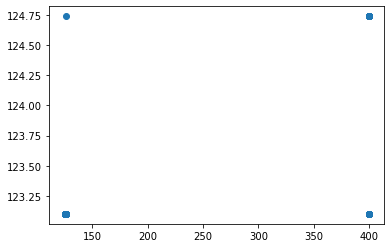

t+1 vs t-605


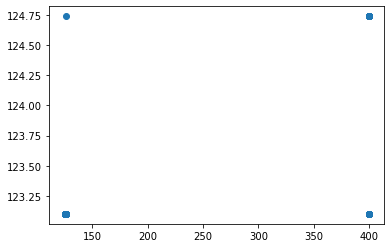

t+1 vs t-606


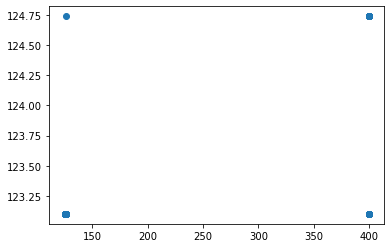

t+1 vs t-607


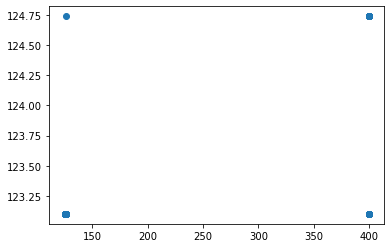

t+1 vs t-608


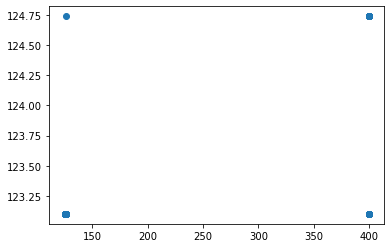

t+1 vs t-609


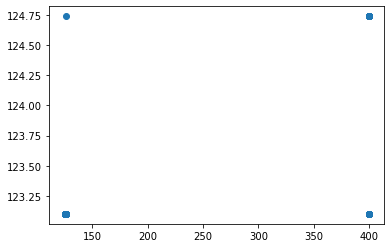

t+1 vs t-610


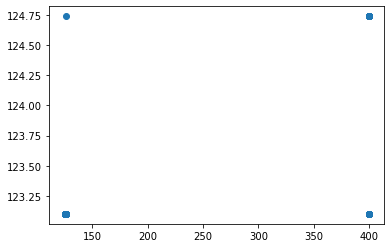

t+1 vs t-611


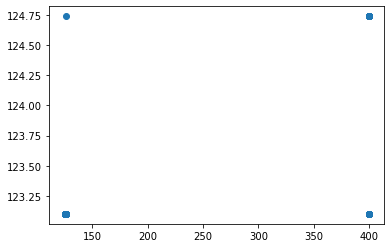

t+1 vs t-612


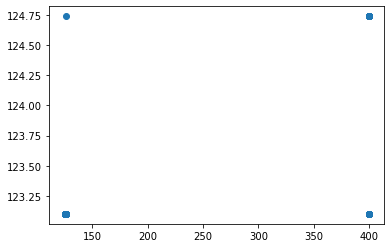

t+1 vs t-613


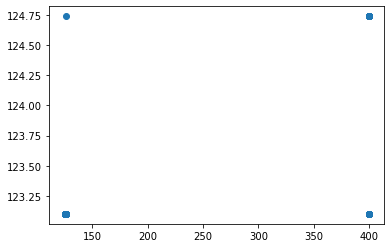

t+1 vs t-614


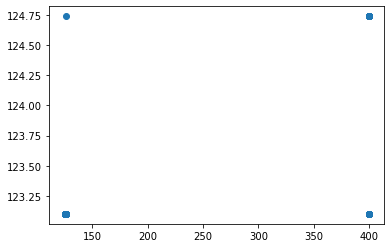

t+1 vs t-615


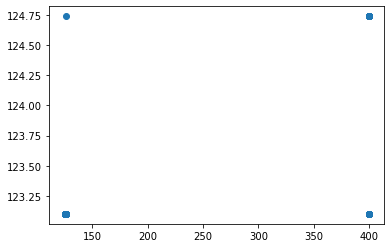

t+1 vs t-616


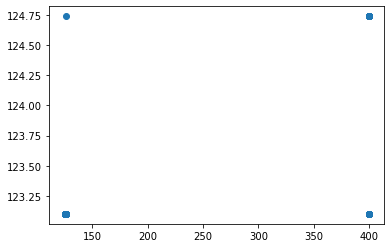

t+1 vs t-617


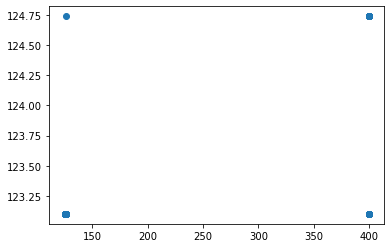

t+1 vs t-618


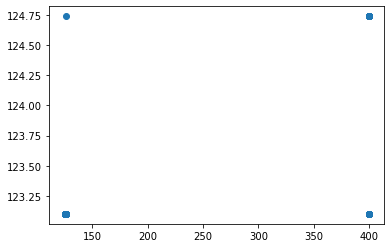

t+1 vs t-619


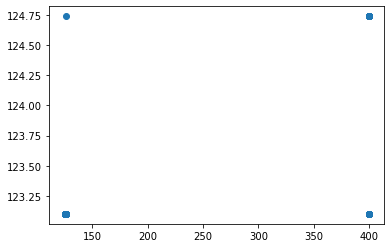

t+1 vs t-620


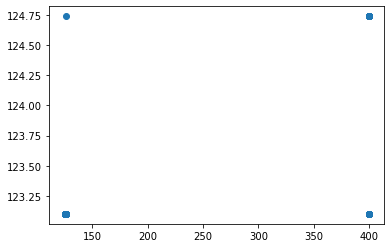

t+1 vs t-621


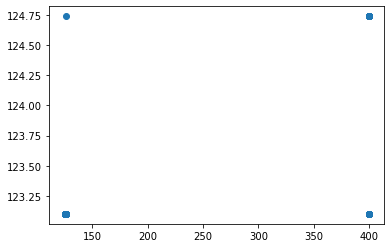

t+1 vs t-622


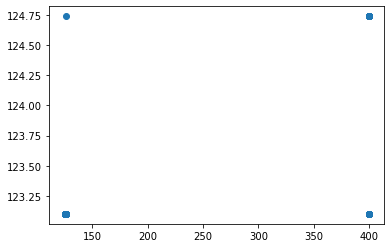

t+1 vs t-623


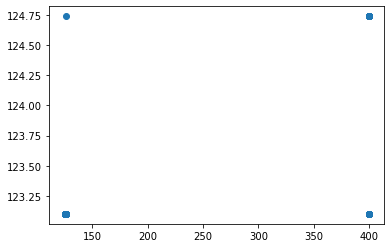

t+1 vs t-624


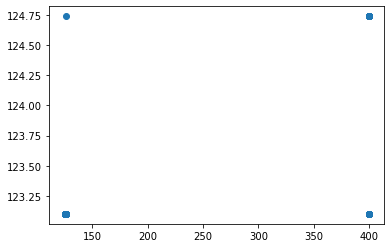

t+1 vs t-625


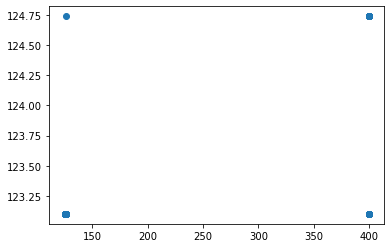

t+1 vs t-626


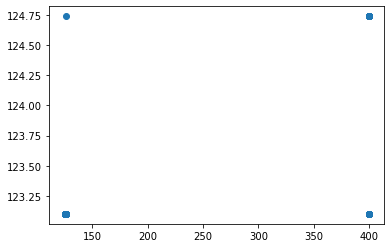

t+1 vs t-627


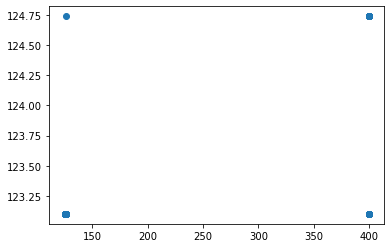

t+1 vs t-628


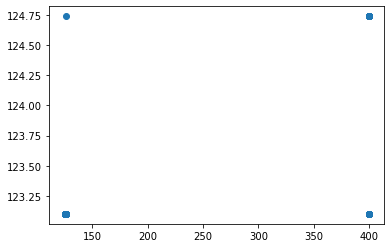

t+1 vs t-629


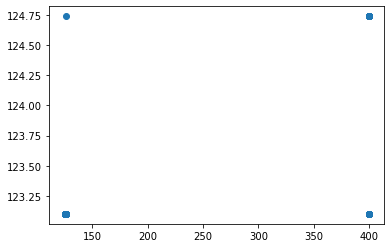

t+1 vs t-630


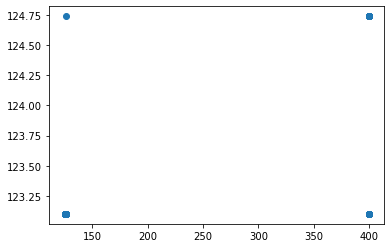

t+1 vs t-631


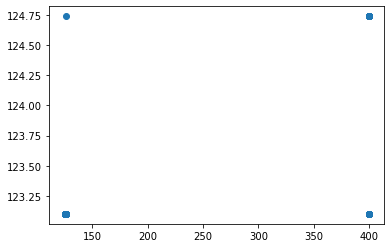

t+1 vs t-632


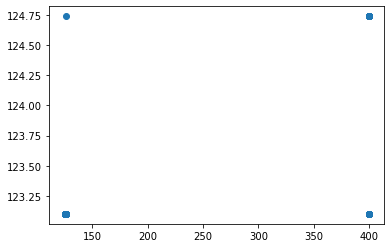

t+1 vs t-633


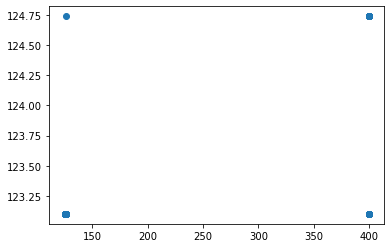

t+1 vs t-634


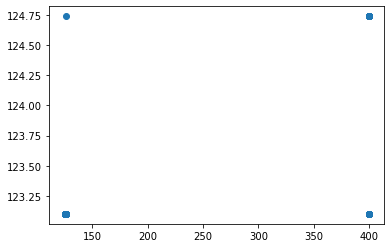

t+1 vs t-635


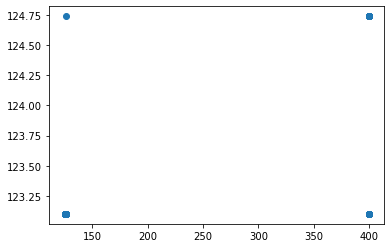

t+1 vs t-636


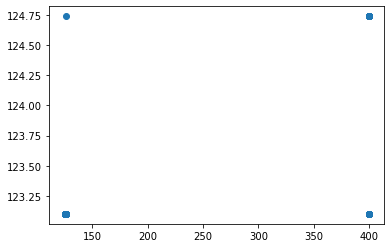

t+1 vs t-637


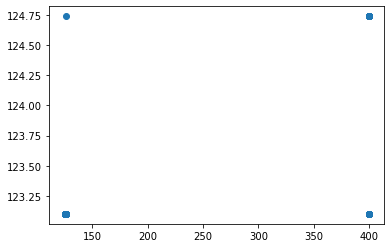

t+1 vs t-638


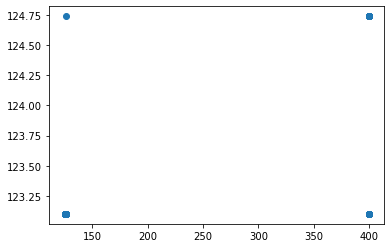

t+1 vs t-639


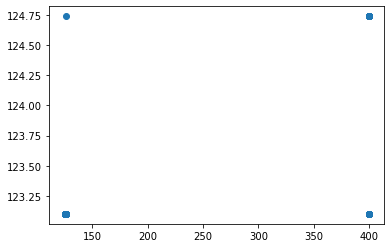

t+1 vs t-640


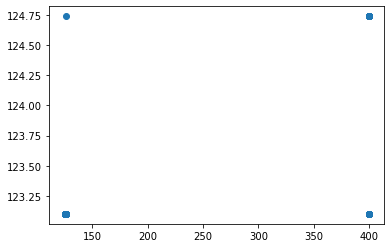

t+1 vs t-641


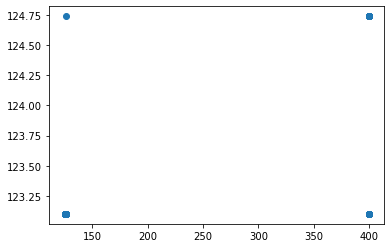

t+1 vs t-642


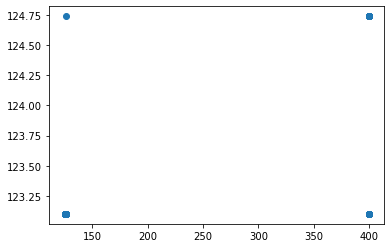

t+1 vs t-643


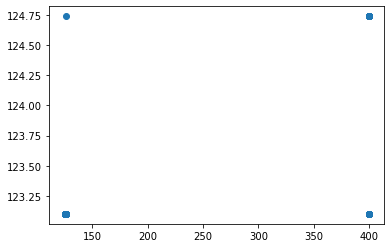

t+1 vs t-644


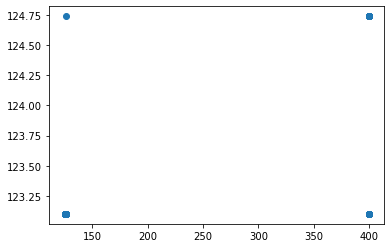

t+1 vs t-645


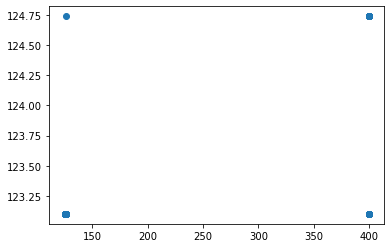

t+1 vs t-646


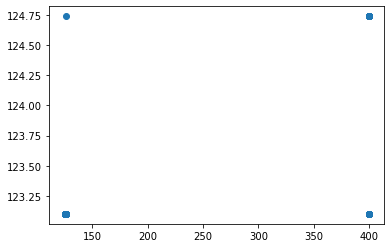

t+1 vs t-647


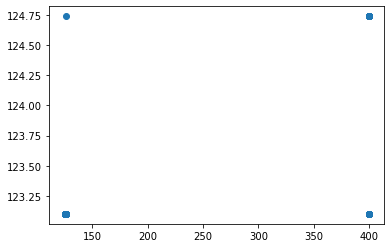

t+1 vs t-648


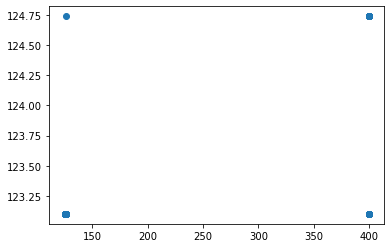

t+1 vs t-649


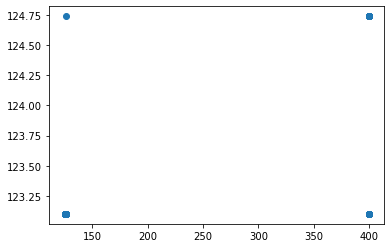

t+1 vs t-650


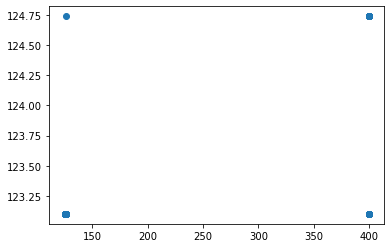

t+1 vs t-651


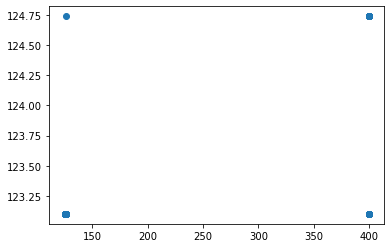

t+1 vs t-652


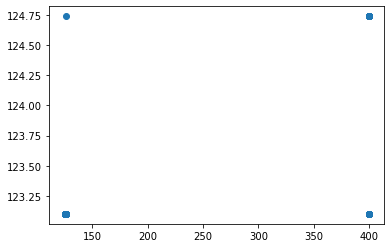

t+1 vs t-653


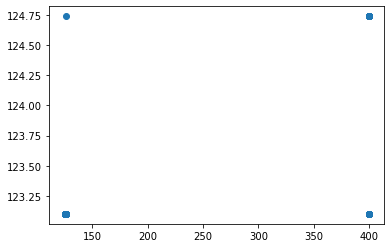

t+1 vs t-654


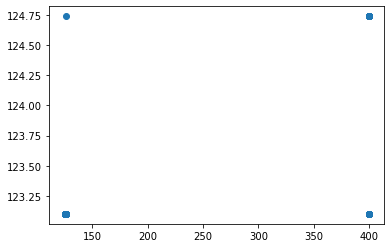

t+1 vs t-655


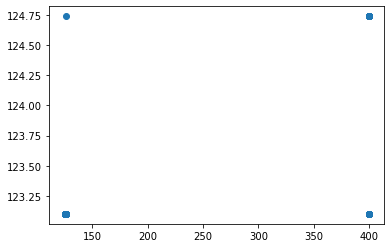

t+1 vs t-656


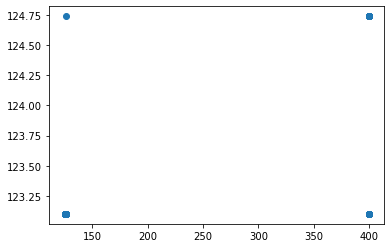

t+1 vs t-657


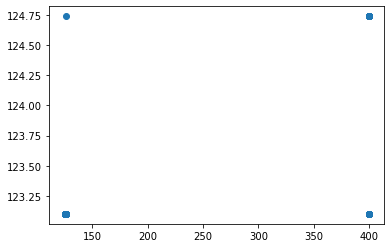

t+1 vs t-658


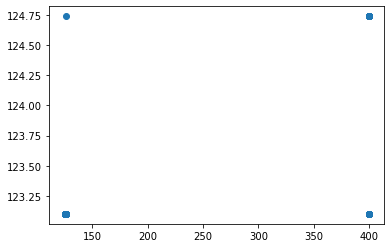

t+1 vs t-659


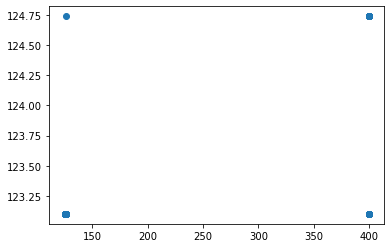

t+1 vs t-660


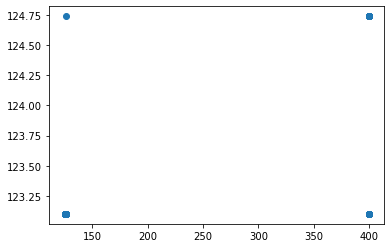

t+1 vs t-661


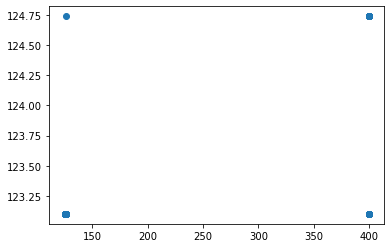

t+1 vs t-662


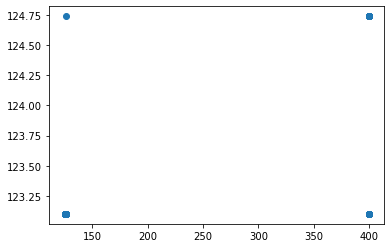

t+1 vs t-663


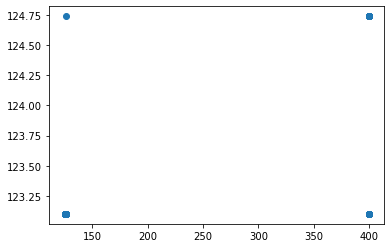

t+1 vs t-664


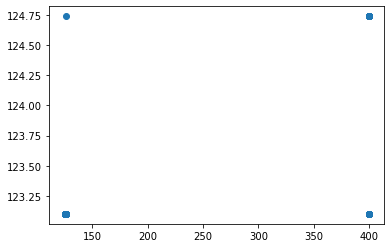

t+1 vs t-665


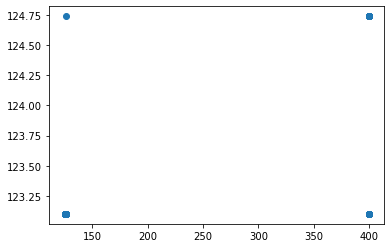

t+1 vs t-666


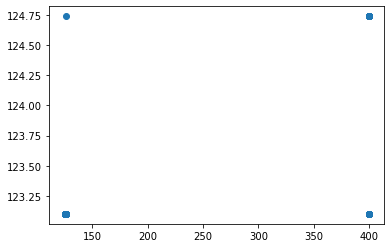

t+1 vs t-667


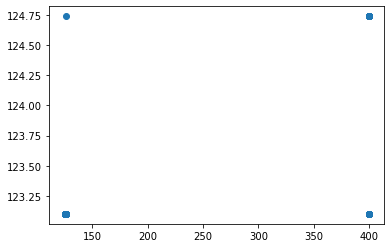

t+1 vs t-668


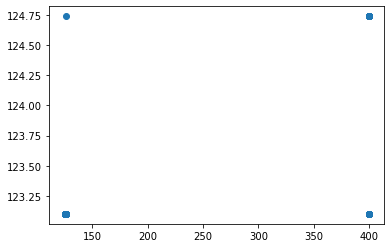

t+1 vs t-669


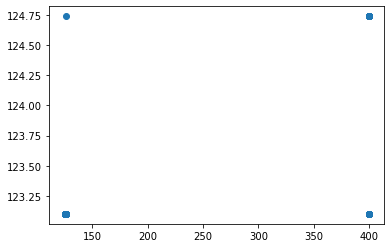

t+1 vs t-670


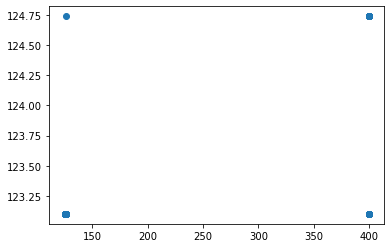

t+1 vs t-671


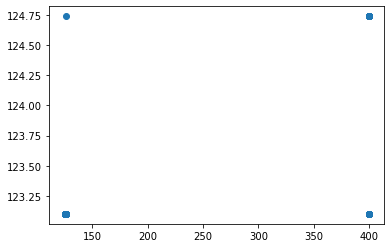

t+1 vs t-672


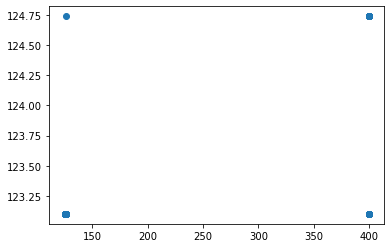

t+1 vs t-673


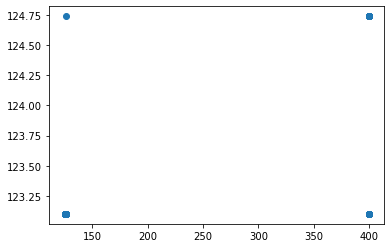

t+1 vs t-674


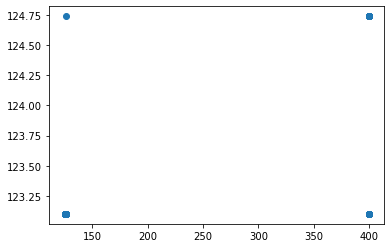

t+1 vs t-675


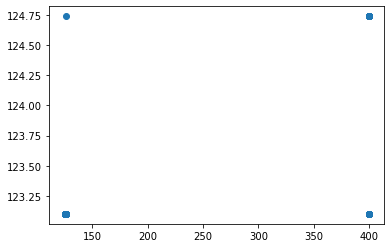

t+1 vs t-676


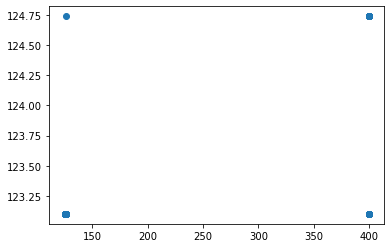

t+1 vs t-677


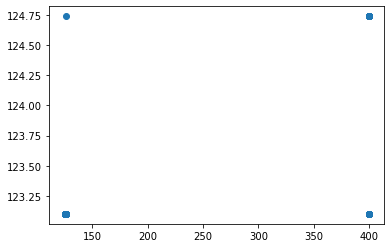

t+1 vs t-678


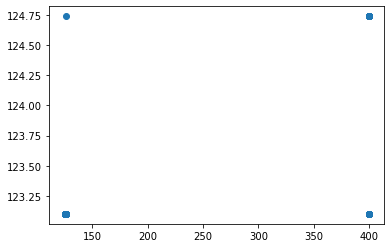

t+1 vs t-679


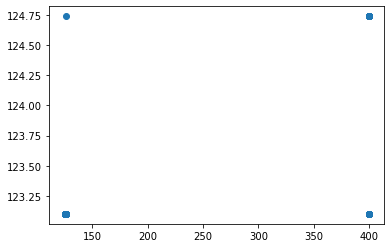

t+1 vs t-680


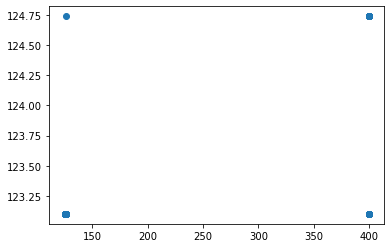

t+1 vs t-681


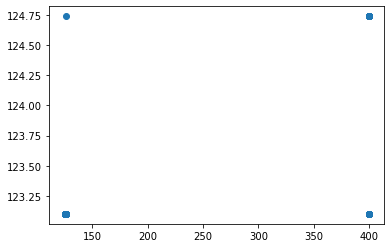

t+1 vs t-682


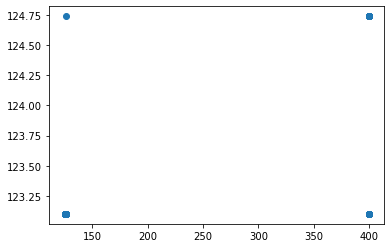

t+1 vs t-683


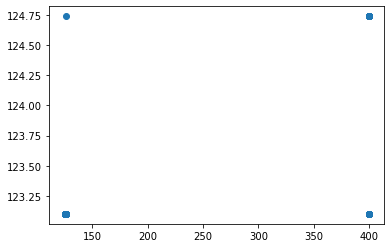

t+1 vs t-684


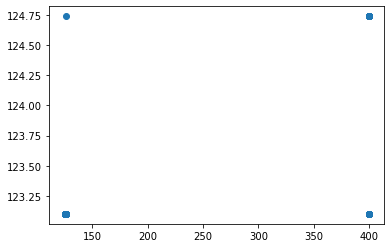

t+1 vs t-685


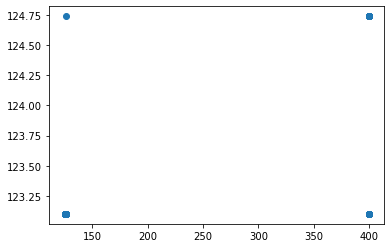

t+1 vs t-686


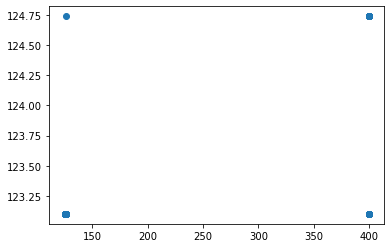

t+1 vs t-687


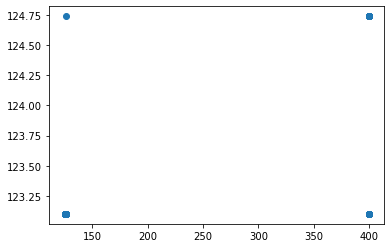

t+1 vs t-688


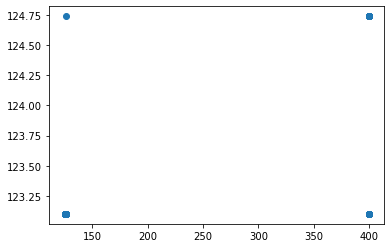

t+1 vs t-689


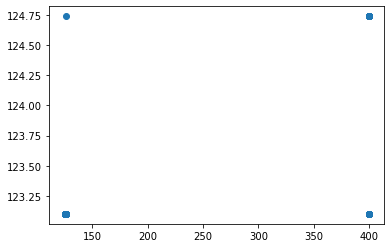

t+1 vs t-690


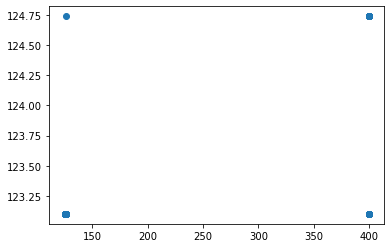

t+1 vs t-691


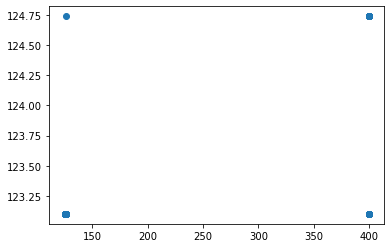

t+1 vs t-692


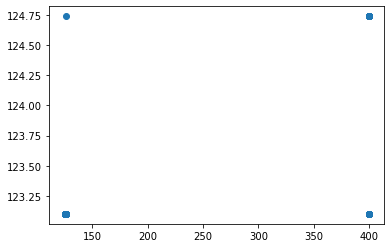

t+1 vs t-693


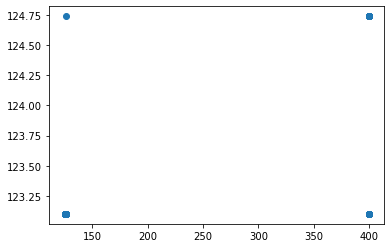

t+1 vs t-694


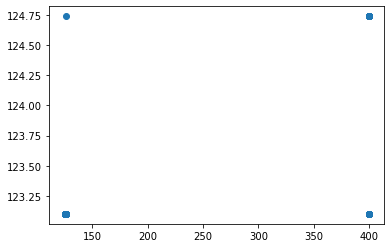

t+1 vs t-695


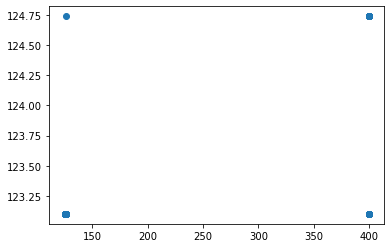

t+1 vs t-696


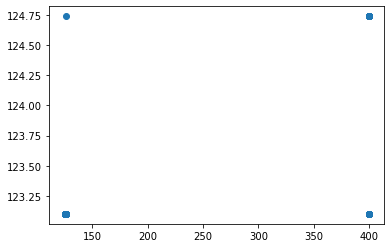

t+1 vs t-697


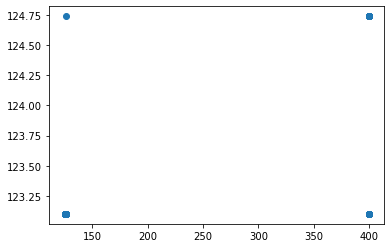

t+1 vs t-698


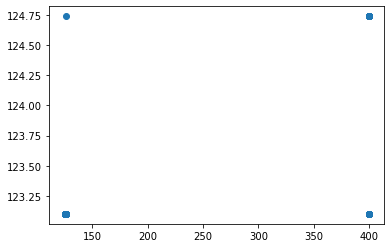

t+1 vs t-699


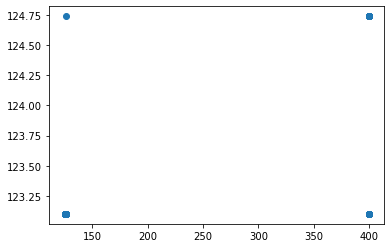

t+1 vs t-700


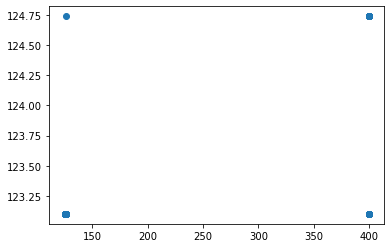

t+1 vs t-701


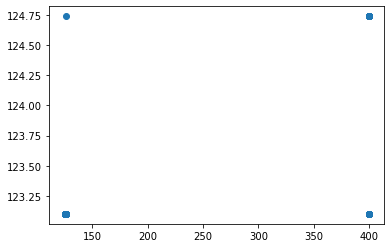

t+1 vs t-702


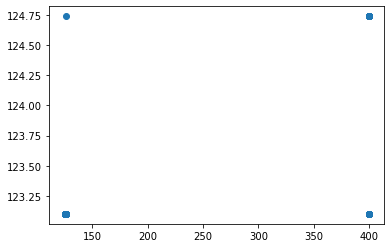

t+1 vs t-703


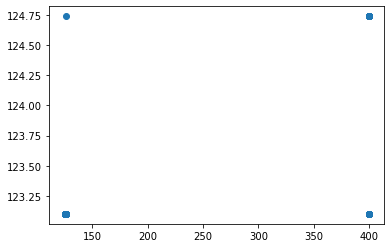

t+1 vs t-704


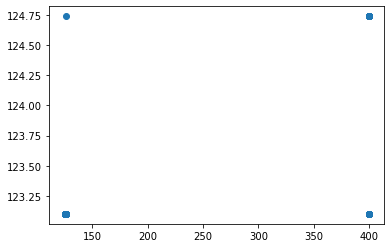

t+1 vs t-705


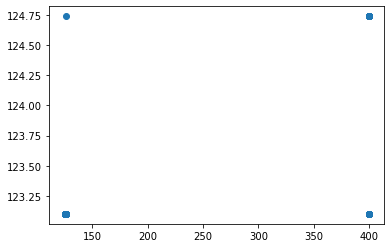

t+1 vs t-706


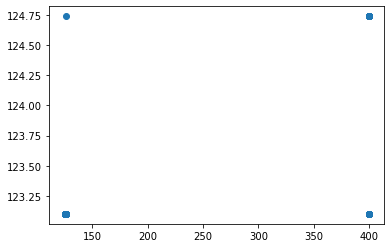

t+1 vs t-707


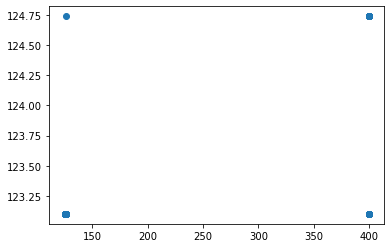

t+1 vs t-708


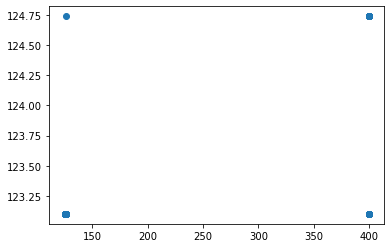

t+1 vs t-709


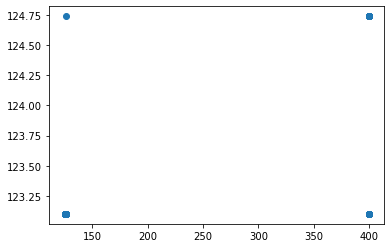

t+1 vs t-710


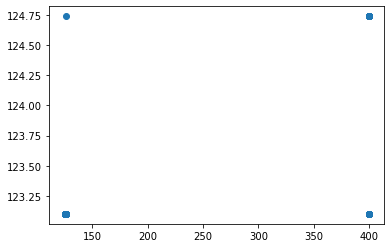

t+1 vs t-711


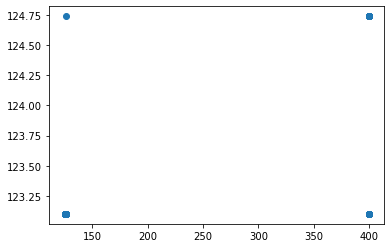

t+1 vs t-712


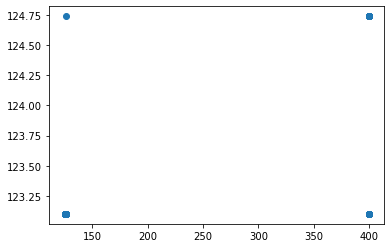

t+1 vs t-713


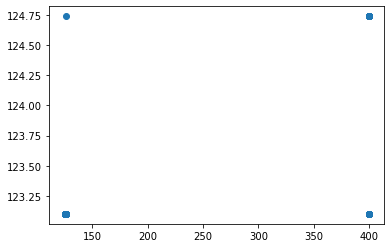

t+1 vs t-714


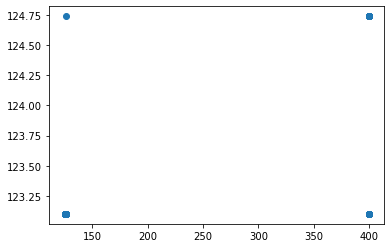

t+1 vs t-715


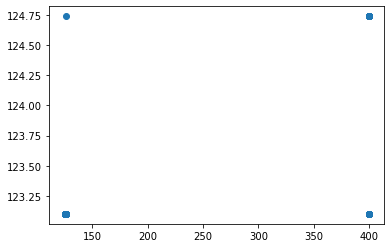

t+1 vs t-716


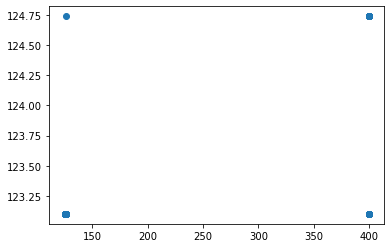

t+1 vs t-717


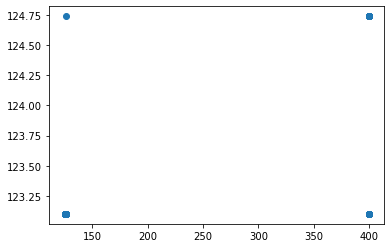

t+1 vs t-718


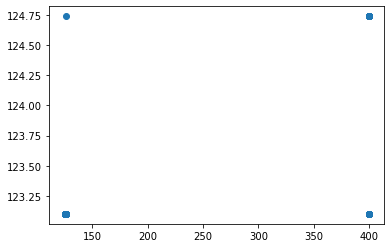

t+1 vs t-719


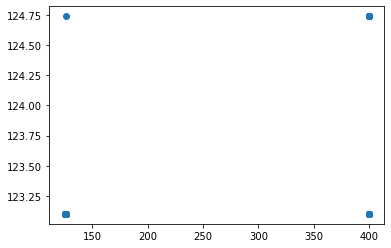

t+1 vs t-720


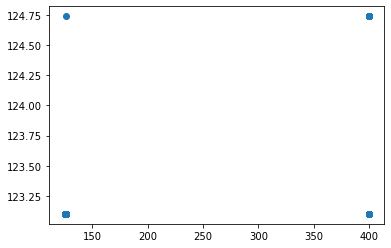

t+1 vs t-721


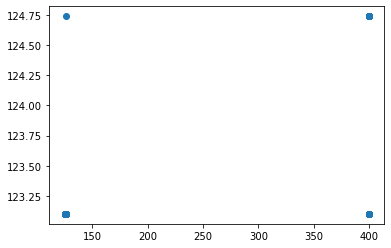

t+1 vs t-722


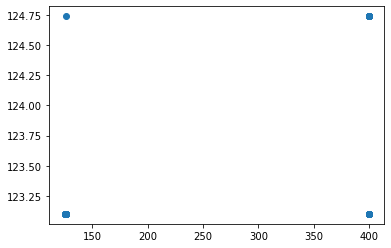

t+1 vs t-723


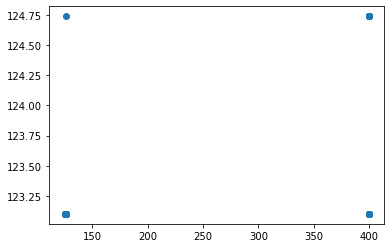

t+1 vs t-724


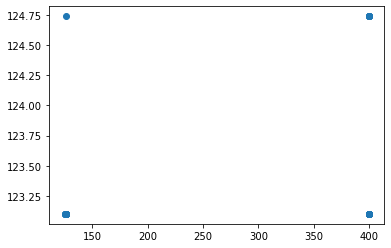

t+1 vs t-725


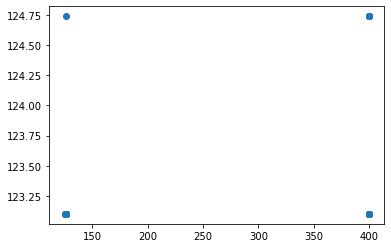

t+1 vs t-726


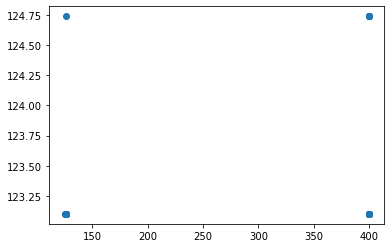

t+1 vs t-727


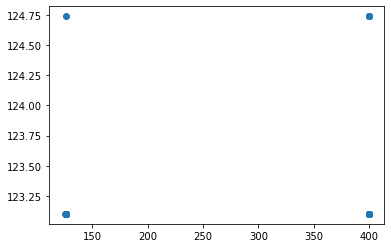

t+1 vs t-728


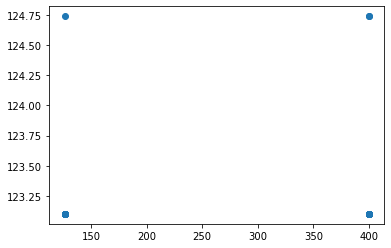

t+1 vs t-729


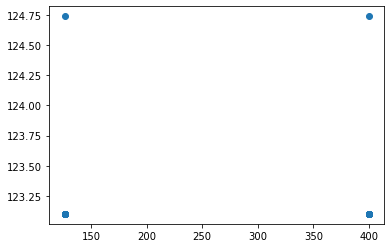

t+1 vs t-730


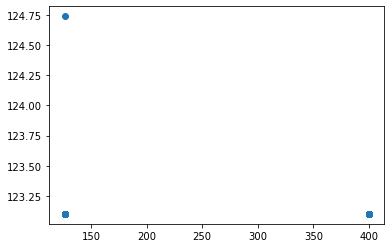

t+1 vs t-731


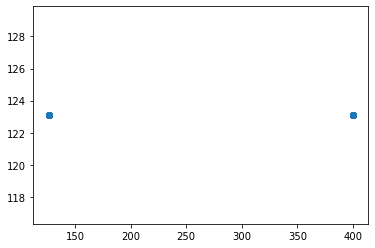

t+1 vs t-732


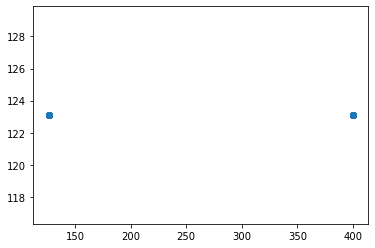

t+1 vs t-733


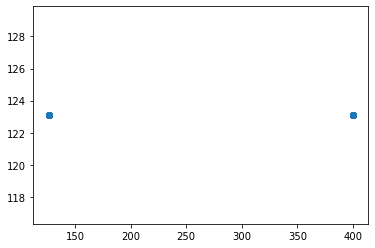

t+1 vs t-734


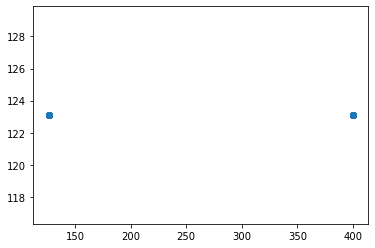

t+1 vs t-735


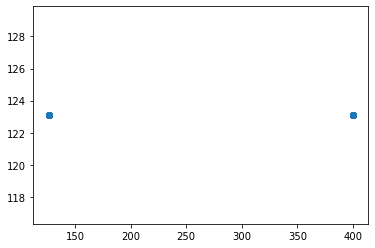

t+1 vs t-736


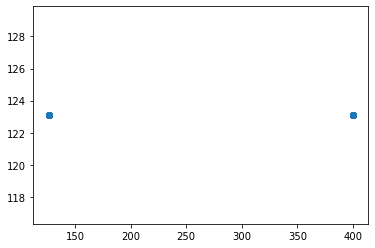

t+1 vs t-737


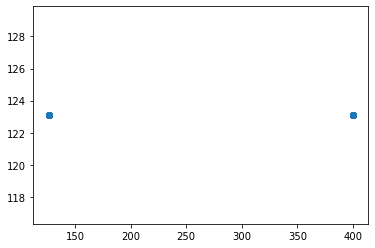

t+1 vs t-738


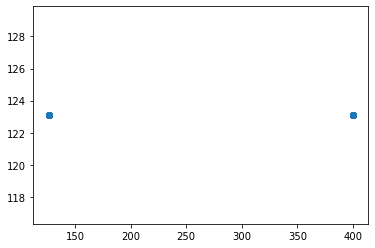

t+1 vs t-739


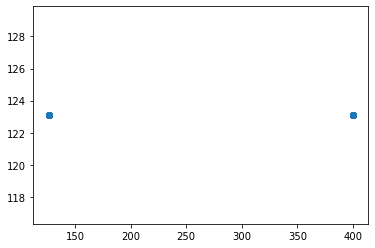

t+1 vs t-740


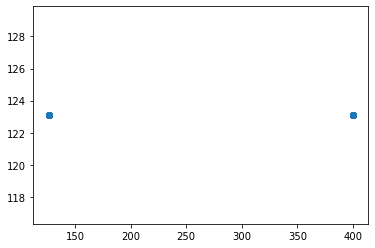

t+1 vs t-741


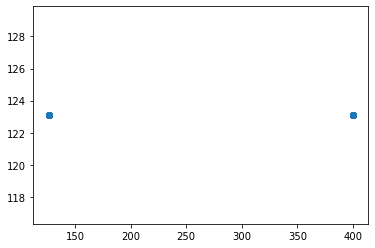

t+1 vs t-742


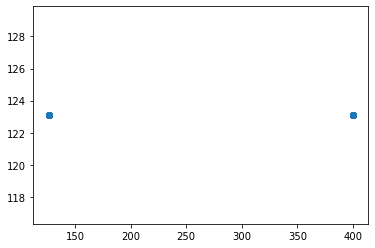

t+1 vs t-743


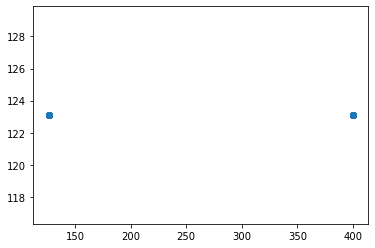

t+1 vs t-744


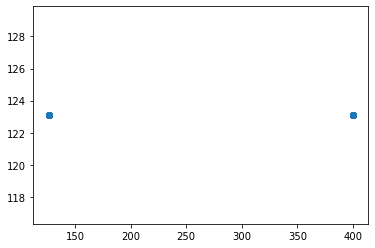

t+1 vs t-745


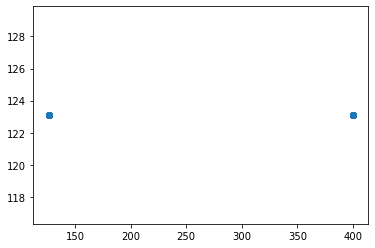

t+1 vs t-746


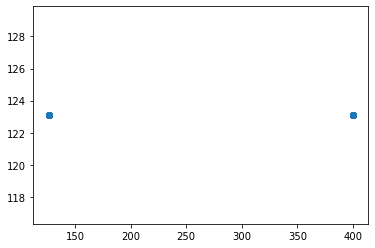

t+1 vs t-747


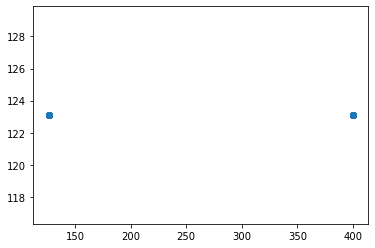

t+1 vs t-748


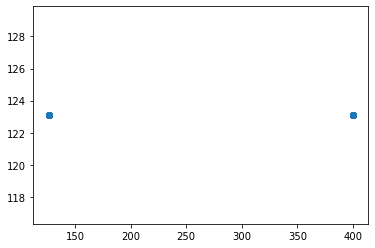

t+1 vs t-749


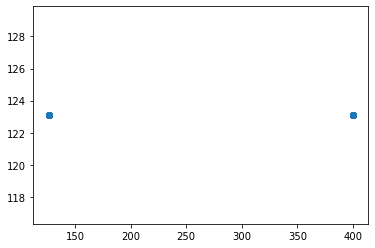

t+1 vs t-750


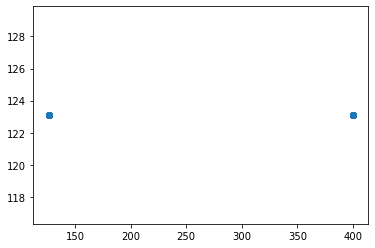

t+1 vs t-751


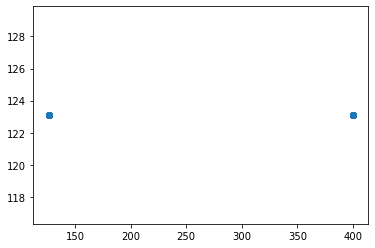

t+1 vs t-752


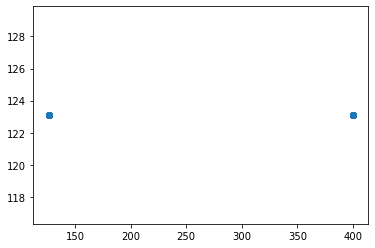

t+1 vs t-753


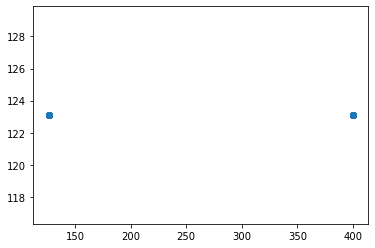

t+1 vs t-754


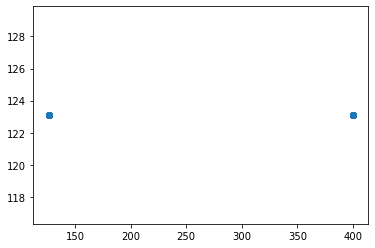

t+1 vs t-755


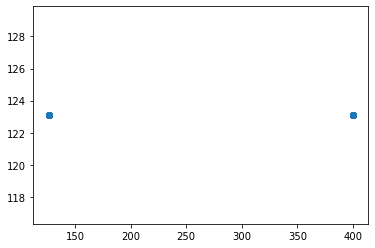

t+1 vs t-756


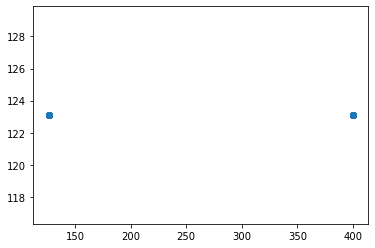

t+1 vs t-757


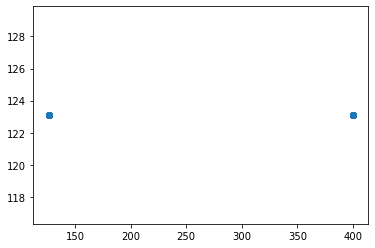

t+1 vs t-758


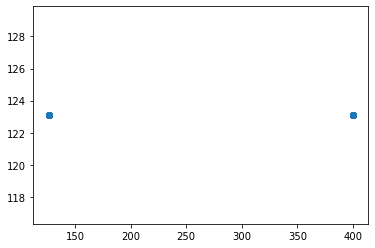

t+1 vs t-759


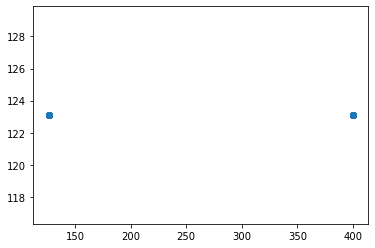

t+1 vs t-760


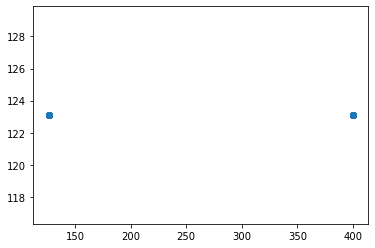

t+1 vs t-761


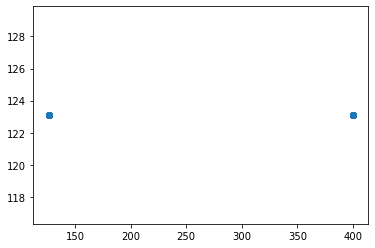

t+1 vs t-762


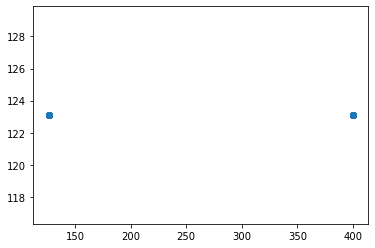

t+1 vs t-763


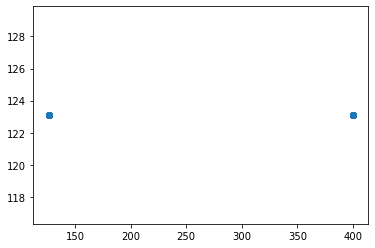

t+1 vs t-764


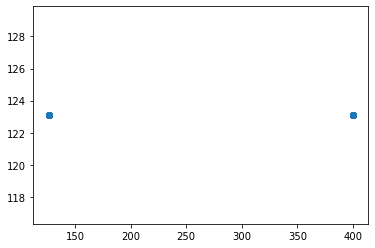

t+1 vs t-765


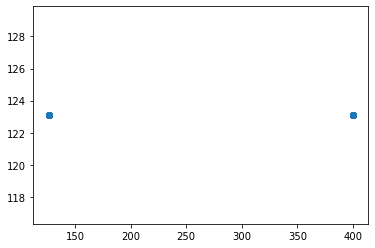

t+1 vs t-766


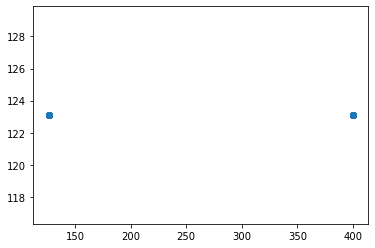

t+1 vs t-767


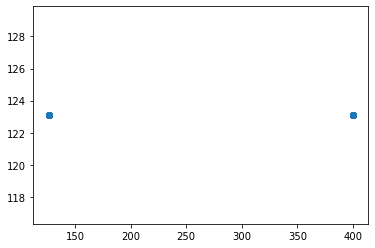

t+1 vs t-768


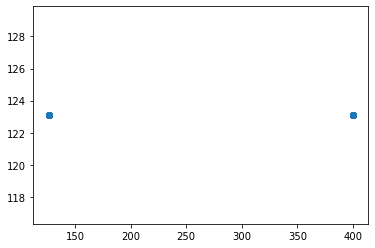

t+1 vs t-769


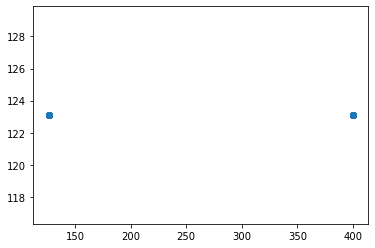

t+1 vs t-770


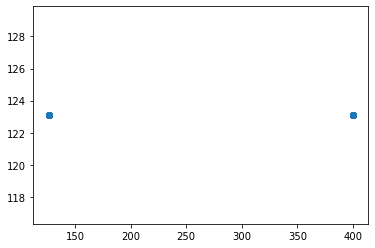

t+1 vs t-771


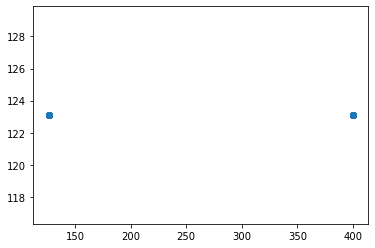

t+1 vs t-772


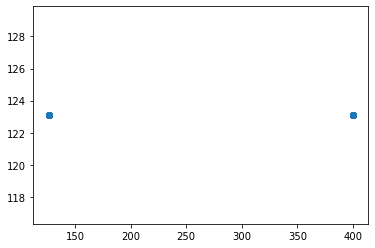

t+1 vs t-773


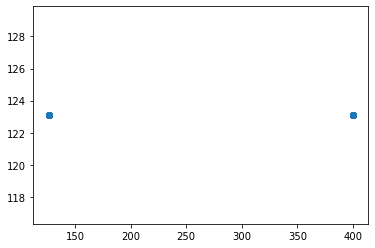

t+1 vs t-774


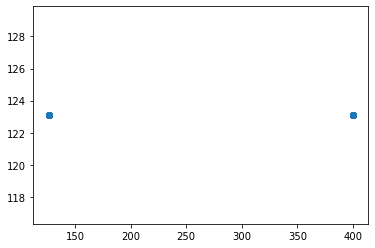

t+1 vs t-775


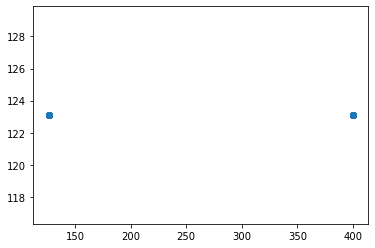

t+1 vs t-776


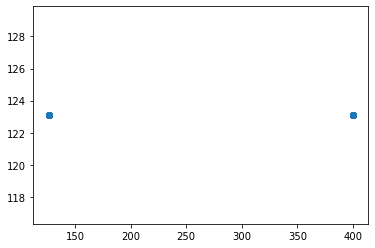

t+1 vs t-777


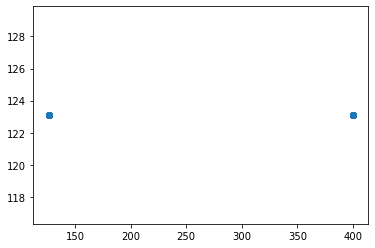

t+1 vs t-778


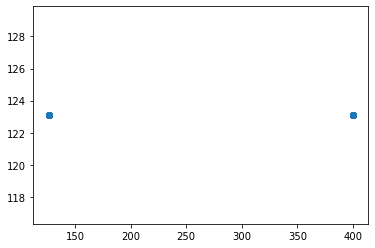

t+1 vs t-779


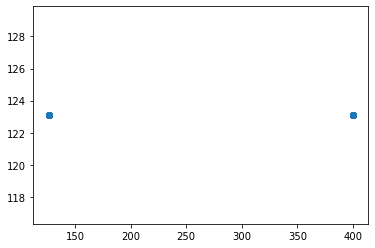

t+1 vs t-780


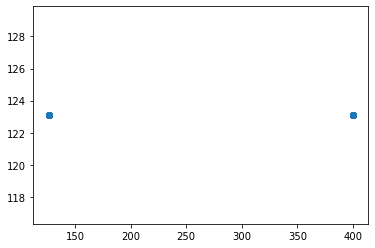

t+1 vs t-781


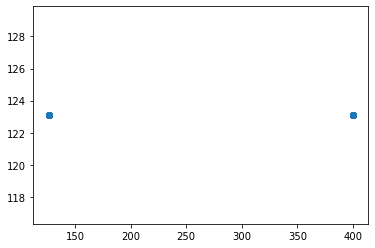

t+1 vs t-782


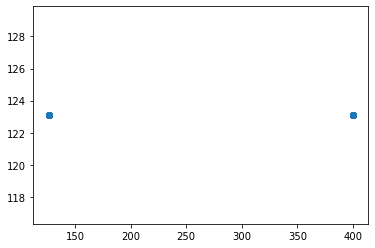

t+1 vs t-783


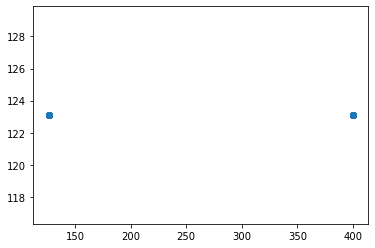

t+1 vs t-784


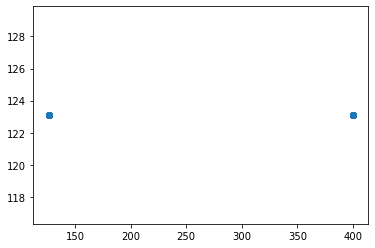

t+1 vs t-785


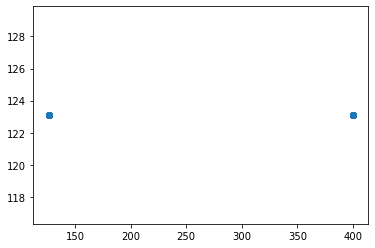

t+1 vs t-786


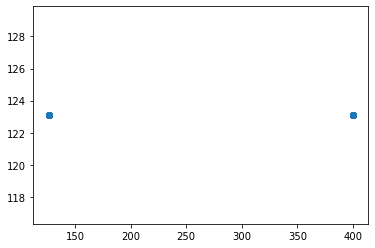

t+1 vs t-787


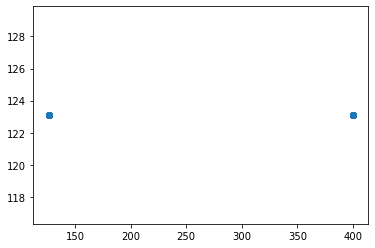

t+1 vs t-788


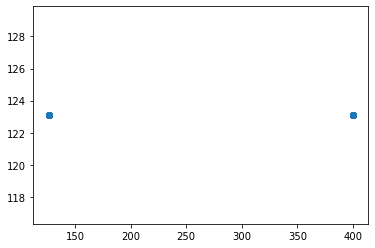

t+1 vs t-789


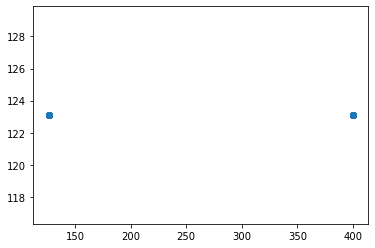

t+1 vs t-790


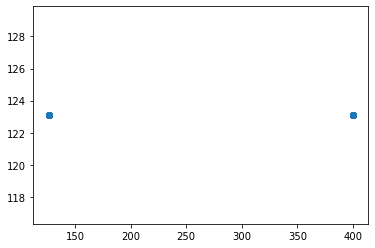

t+1 vs t-791


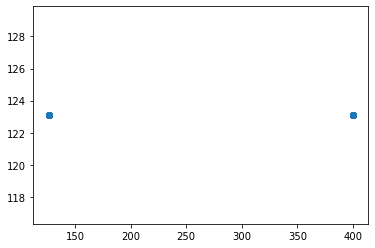

t+1 vs t-792


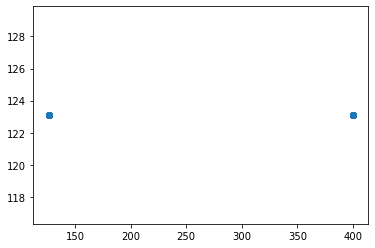

t+1 vs t-793


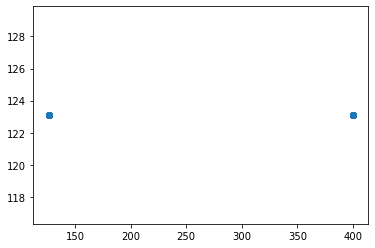

t+1 vs t-794


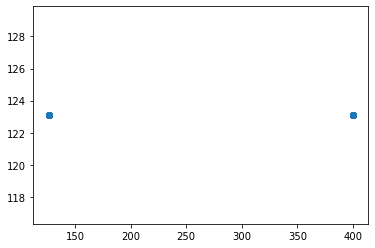

t+1 vs t-795


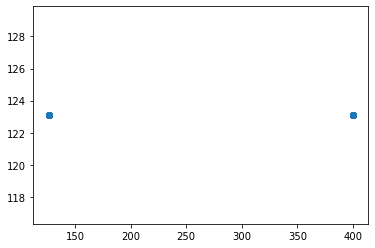

t+1 vs t-796


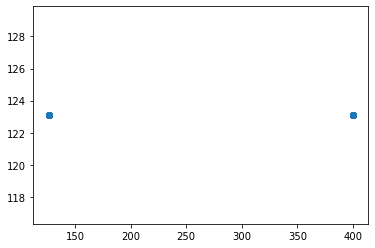

t+1 vs t-797


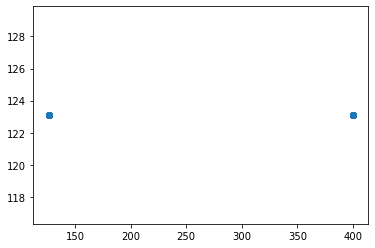

t+1 vs t-798


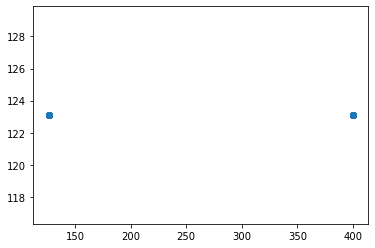

t+1 vs t-799


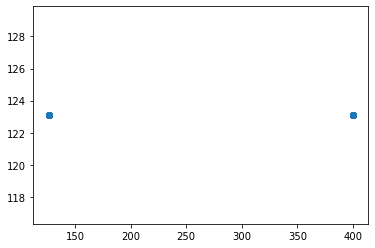

t+1 vs t-800


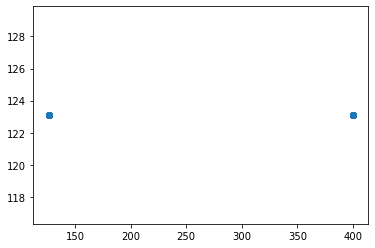

t+1 vs t-801


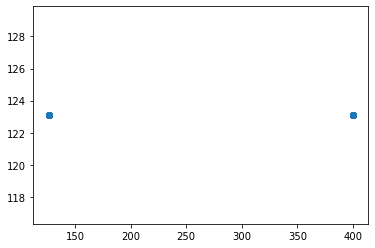

t+1 vs t-802


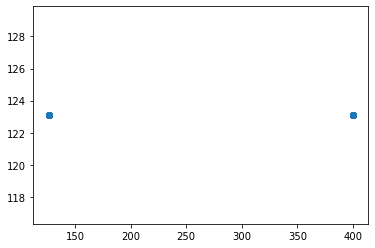

t+1 vs t-803


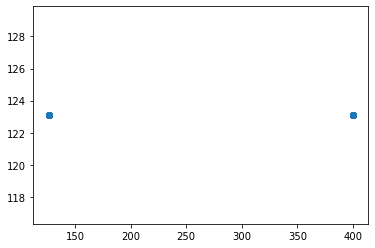

t+1 vs t-804


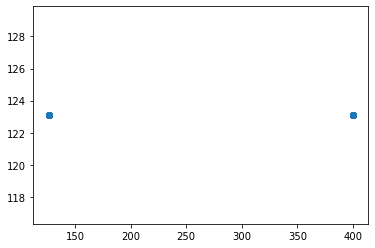

t+1 vs t-805


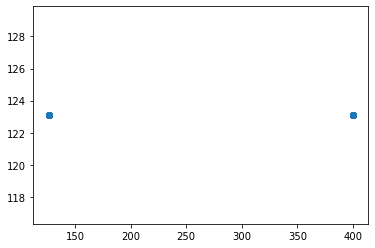

t+1 vs t-806


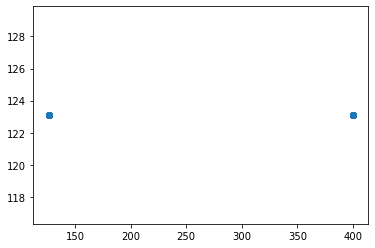

t+1 vs t-807


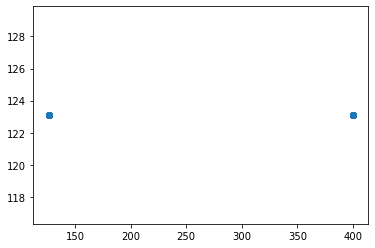

t+1 vs t-808


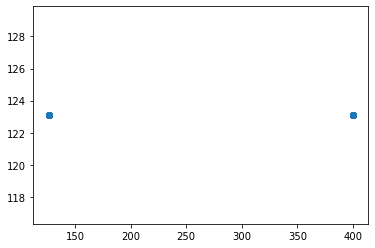

t+1 vs t-809


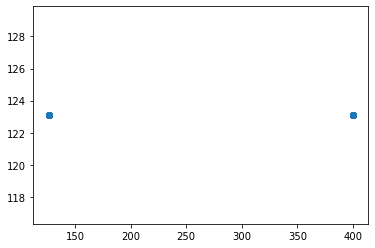

t+1 vs t-810


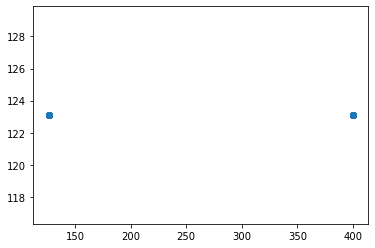

t+1 vs t-811


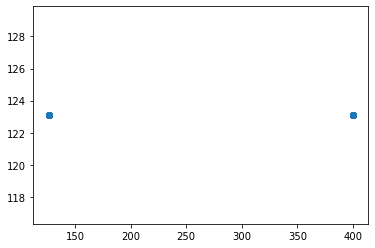

t+1 vs t-812


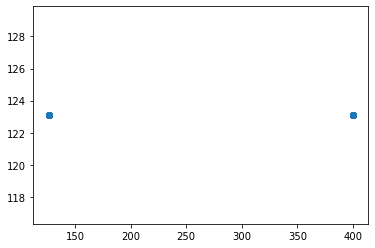

t+1 vs t-813


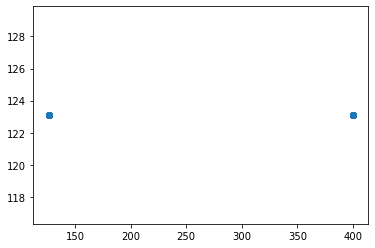

t+1 vs t-814


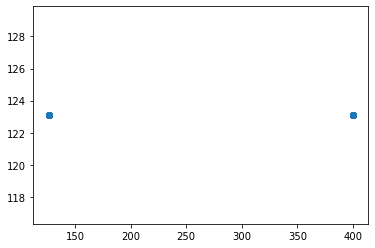

t+1 vs t-815


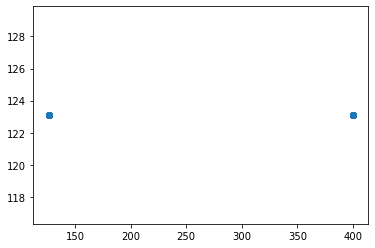

t+1 vs t-816


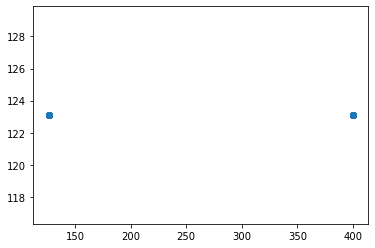

t+1 vs t-817


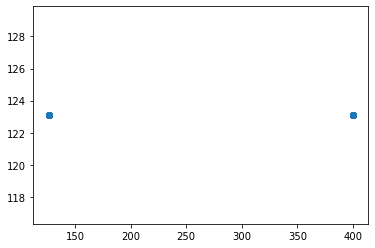

t+1 vs t-818


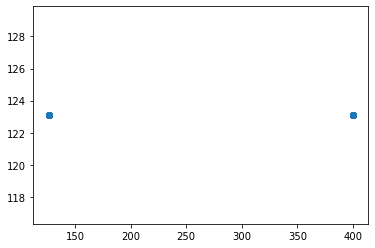

t+1 vs t-819


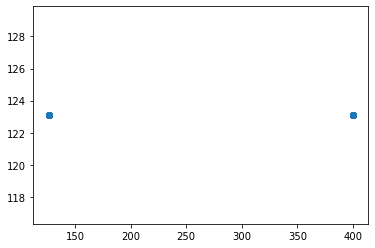

t+1 vs t-820


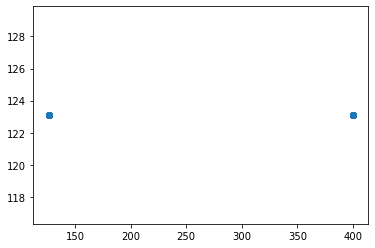

t+1 vs t-821


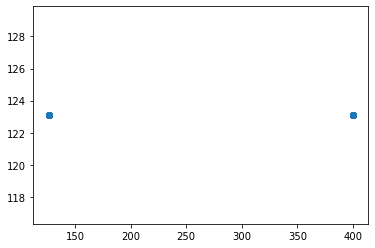

t+1 vs t-822


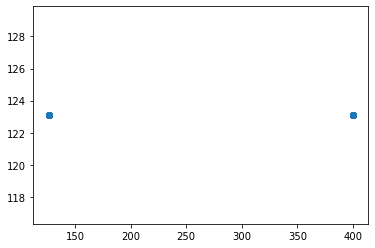

t+1 vs t-823


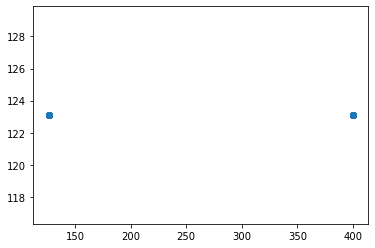

t+1 vs t-824


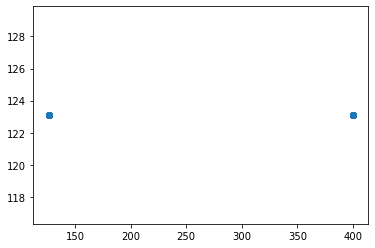

t+1 vs t-825


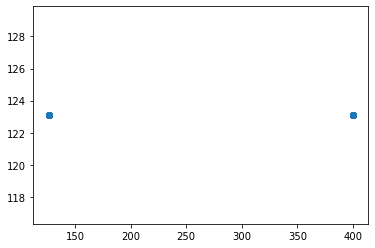

t+1 vs t-826


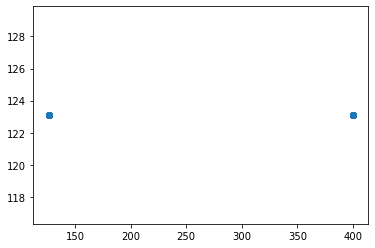

t+1 vs t-827


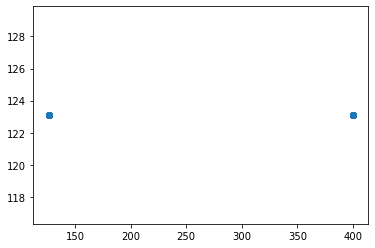

t+1 vs t-828


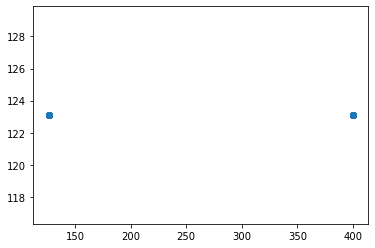

t+1 vs t-829


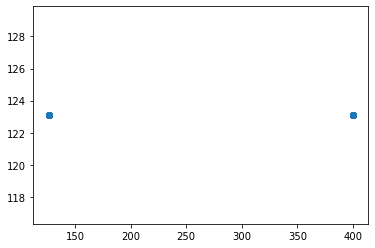

t+1 vs t-830


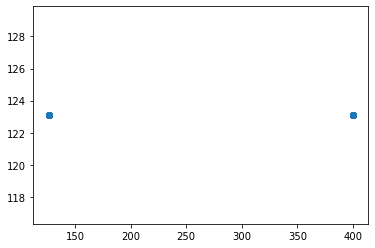

t+1 vs t-831


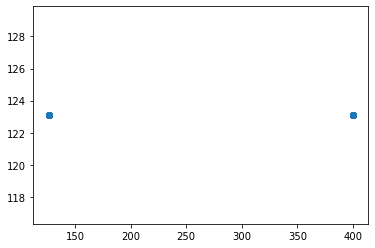

t+1 vs t-832


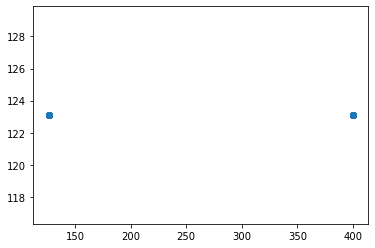

t+1 vs t-833


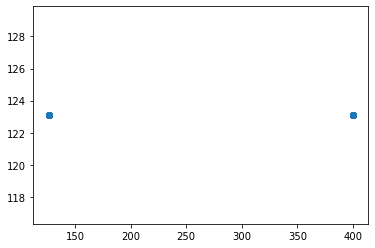

t+1 vs t-834


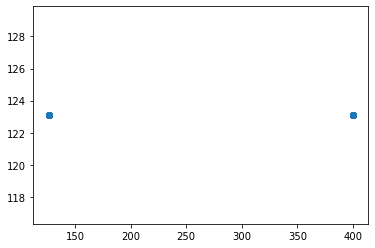

t+1 vs t-835


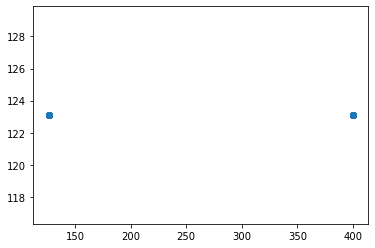

t+1 vs t-836


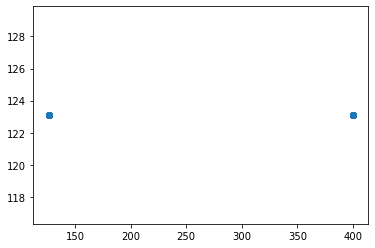

t+1 vs t-837


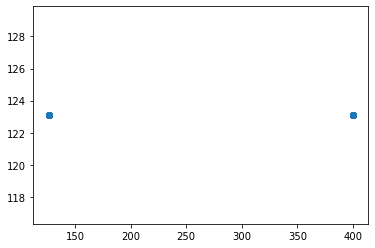

t+1 vs t-838


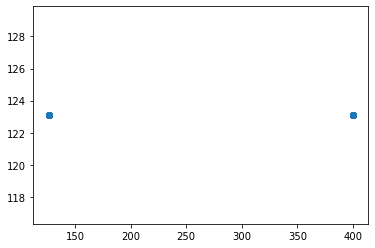

t+1 vs t-839


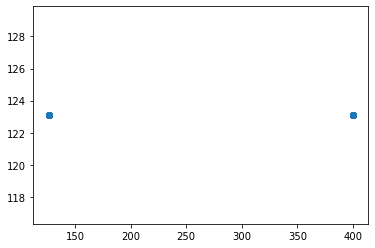

t+1 vs t-840


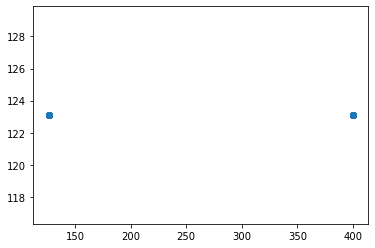

t+1 vs t-841


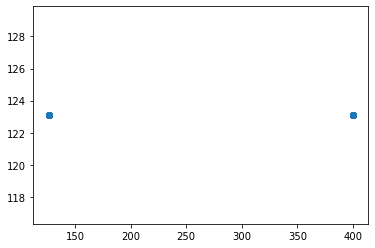

t+1 vs t-842


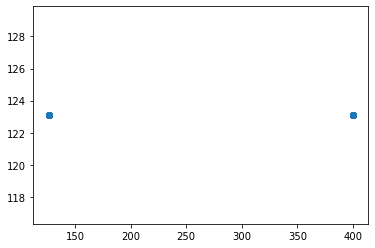

t+1 vs t-843


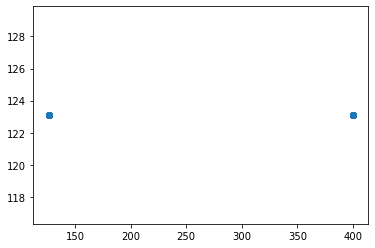

t+1 vs t-844


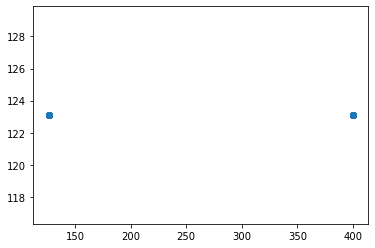

t+1 vs t-845


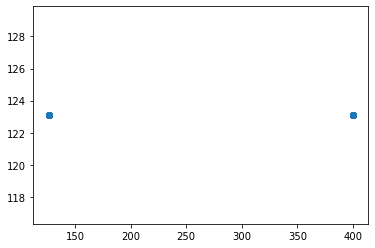

t+1 vs t-846


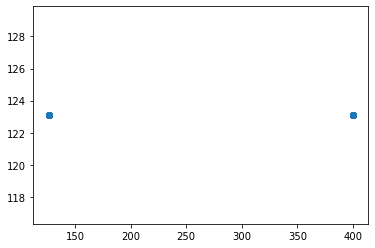

t+1 vs t-847


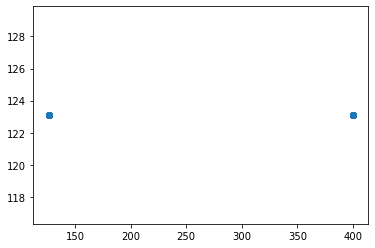

t+1 vs t-848


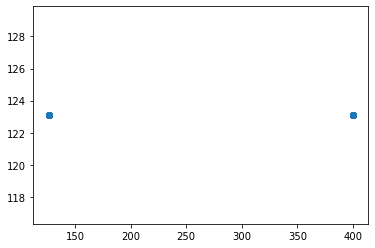

t+1 vs t-849


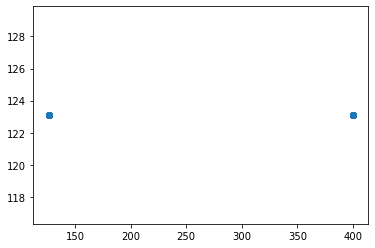

t+1 vs t-850


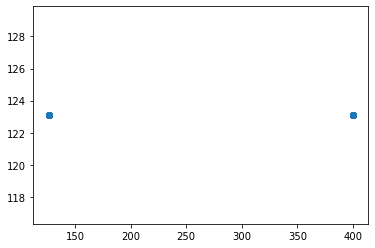

t+1 vs t-851


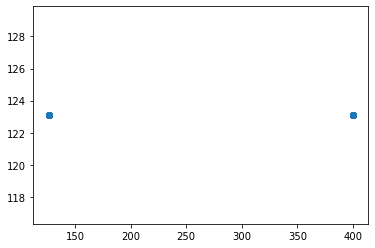

t+1 vs t-852


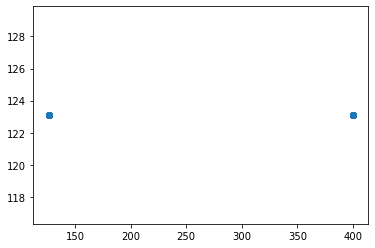

t+1 vs t-853


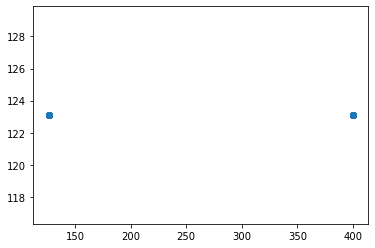

t+1 vs t-854


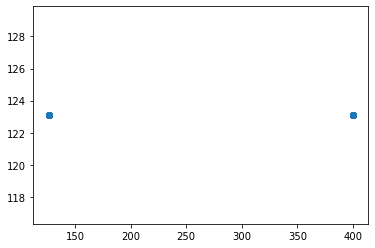

t+1 vs t-855


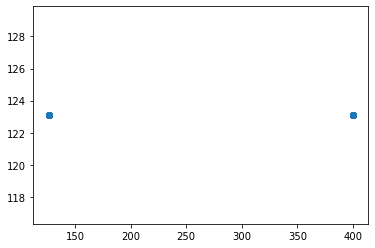

t+1 vs t-856


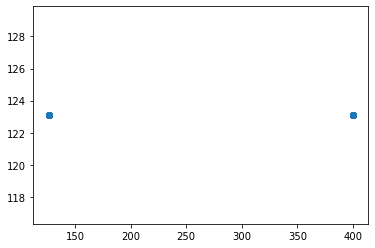

t+1 vs t-857


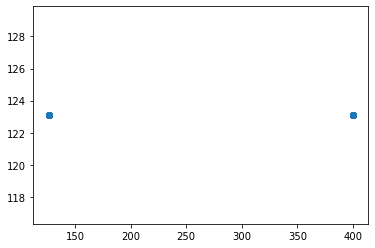

t+1 vs t-858


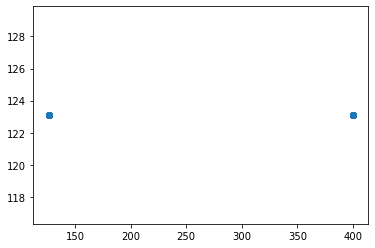

t+1 vs t-859


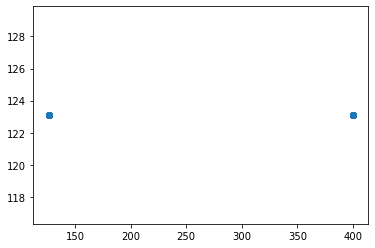

t+1 vs t-860


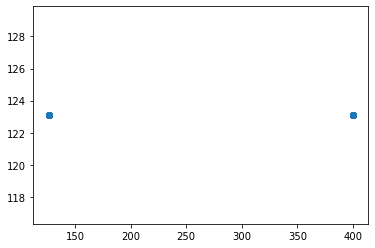

t+1 vs t-861


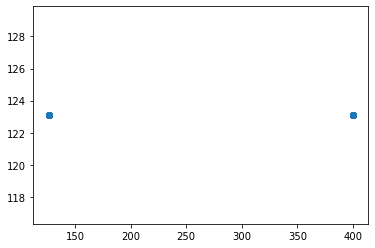

t+1 vs t-862


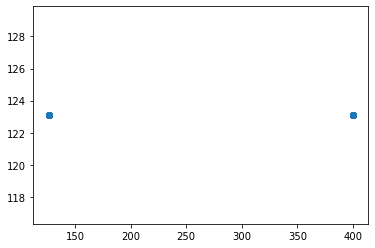

t+1 vs t-863


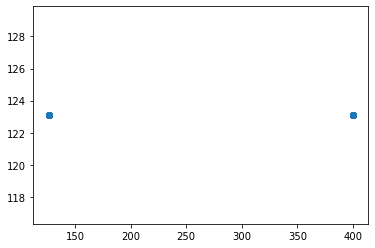

t+1 vs t-864


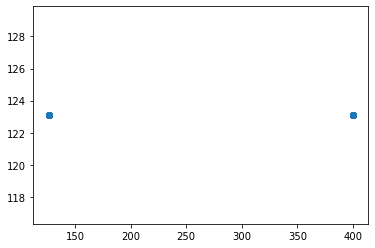

t+1 vs t-865


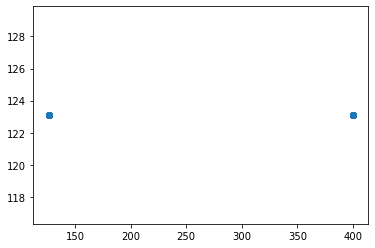

t+1 vs t-866


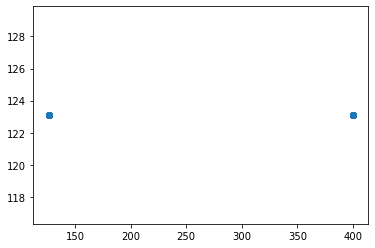

t+1 vs t-867


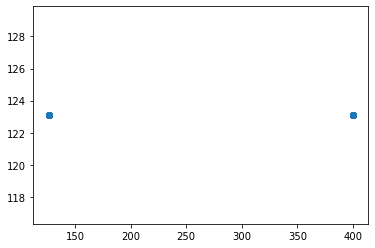

t+1 vs t-868


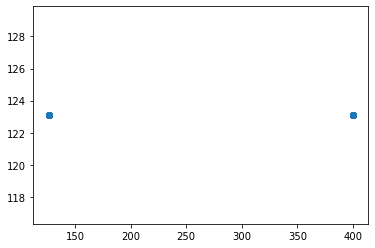

t+1 vs t-869


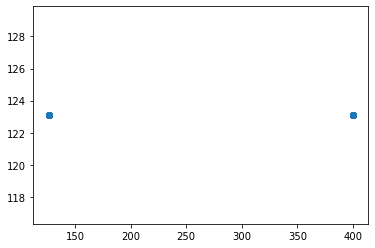

t+1 vs t-870


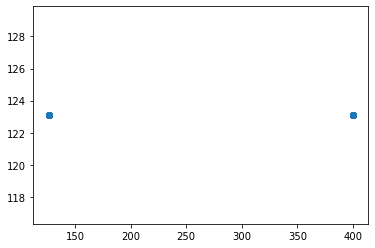

t+1 vs t-871


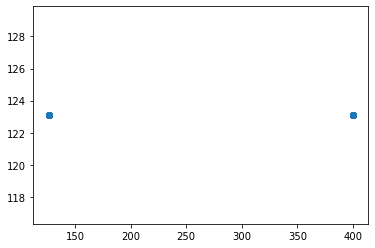

t+1 vs t-872


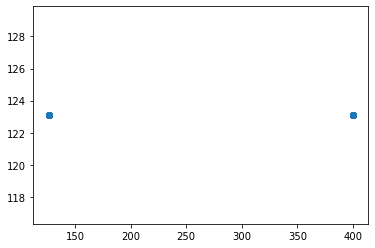

t+1 vs t-873


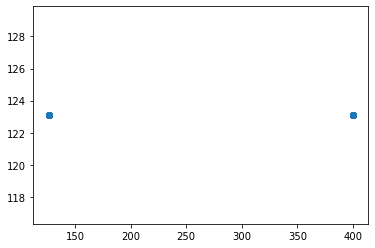

t+1 vs t-874


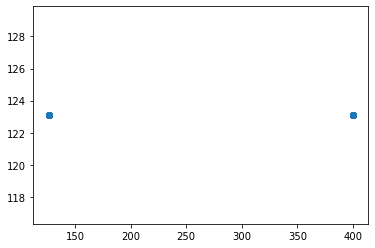

t+1 vs t-875


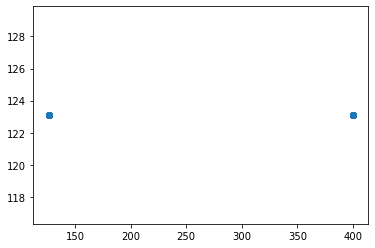

t+1 vs t-876


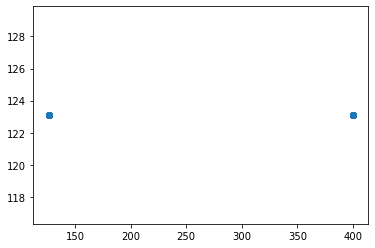

t+1 vs t-877


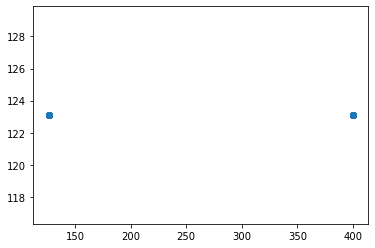

t+1 vs t-878


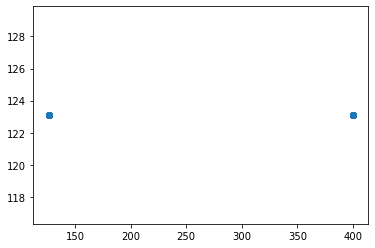

t+1 vs t-879


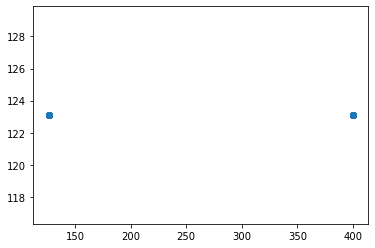

t+1 vs t-880


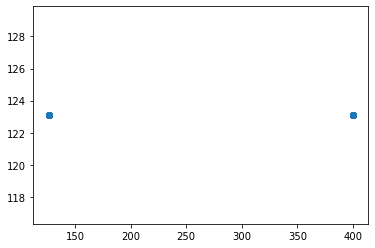

t+1 vs t-881


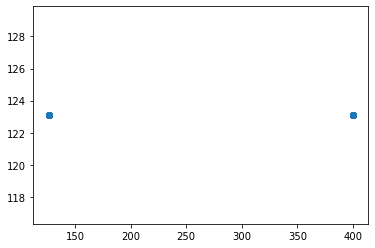

t+1 vs t-882


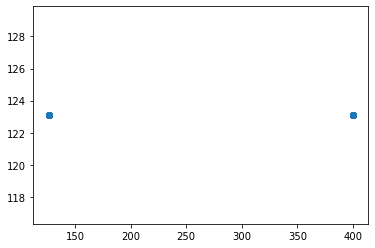

t+1 vs t-883


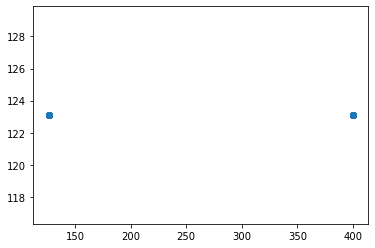

t+1 vs t-884


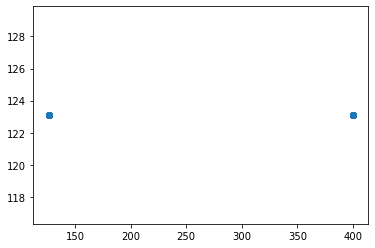

t+1 vs t-885


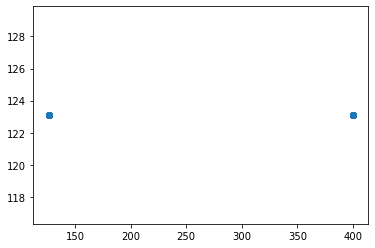

t+1 vs t-886


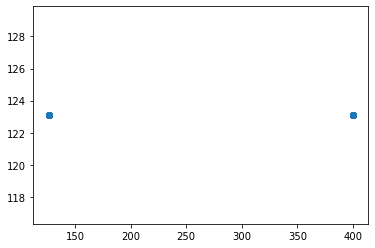

t+1 vs t-887


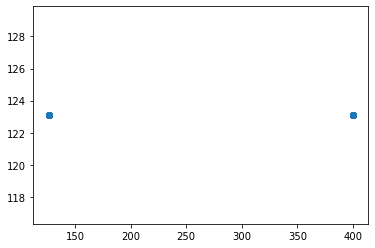

t+1 vs t-888


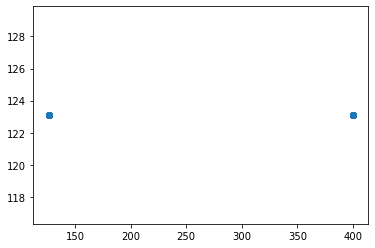

t+1 vs t-889


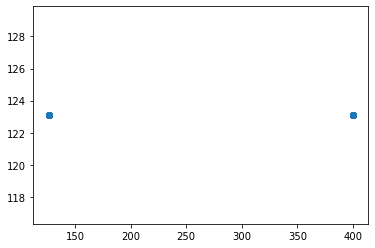

t+1 vs t-890


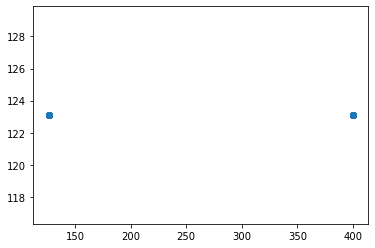

t+1 vs t-891


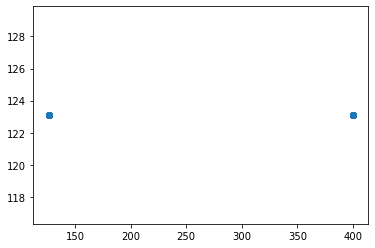

t+1 vs t-892


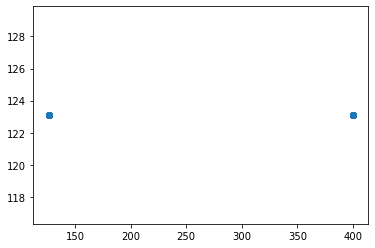

t+1 vs t-893


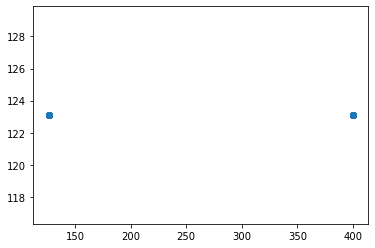

t+1 vs t-894


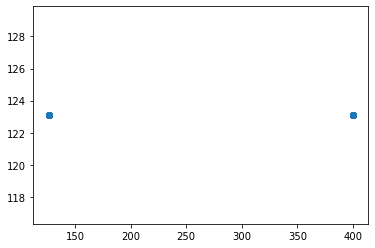

t+1 vs t-895


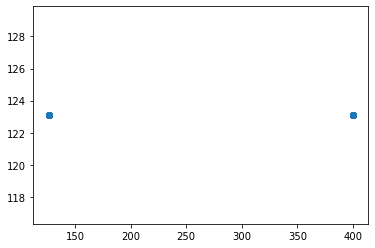

t+1 vs t-896


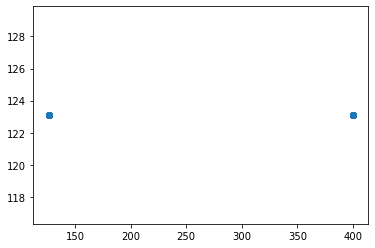

t+1 vs t-897


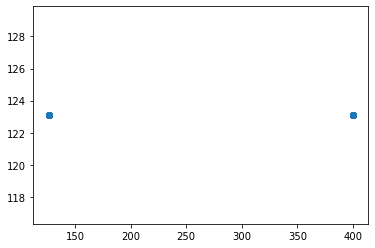

t+1 vs t-898


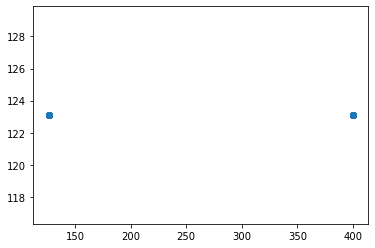

t+1 vs t-899


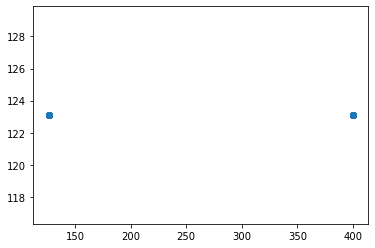

t+1 vs t-900


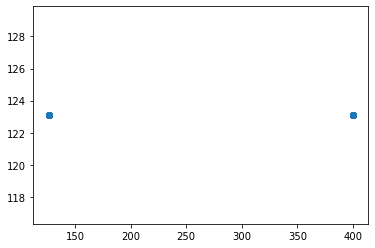

t+1 vs t-901


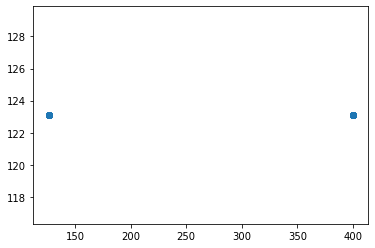

t+1 vs t-902


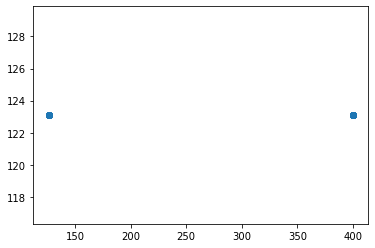

t+1 vs t-903


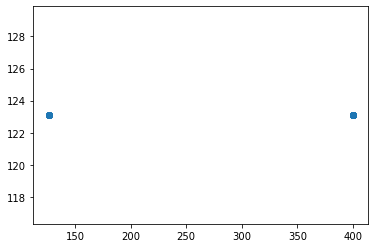

t+1 vs t-904


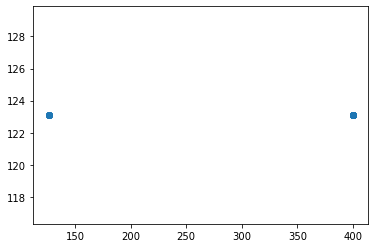

t+1 vs t-905


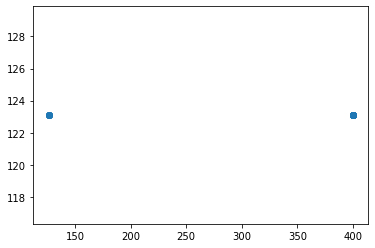

t+1 vs t-906


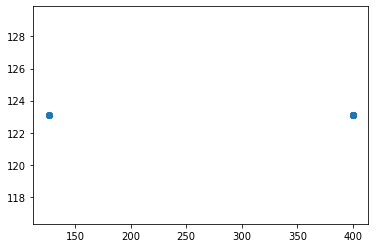

t+1 vs t-907


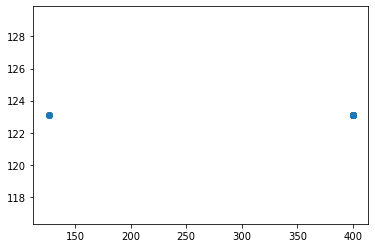

t+1 vs t-908


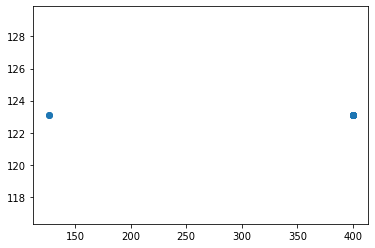

t+1 vs t-909


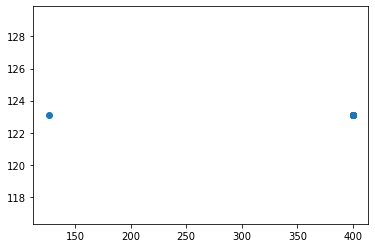

t+1 vs t-910


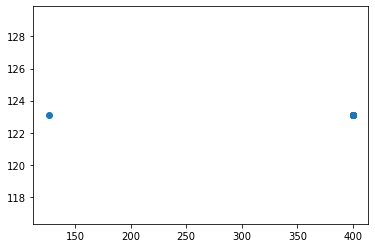

t+1 vs t-911


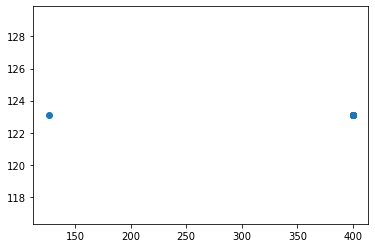

t+1 vs t-912


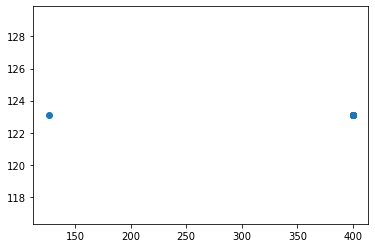

t+1 vs t-913


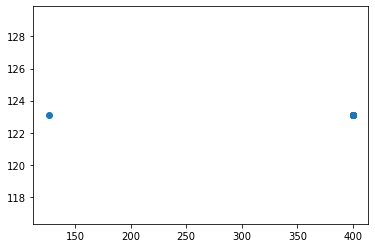

t+1 vs t-914


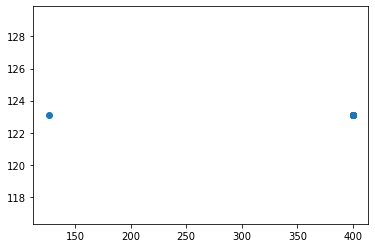

t+1 vs t-915


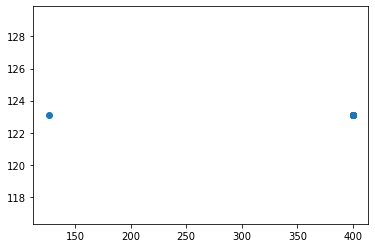

t+1 vs t-916


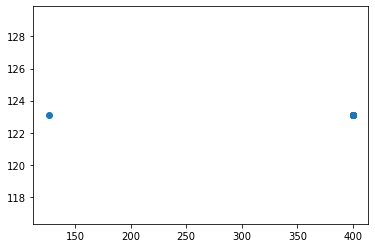

t+1 vs t-917


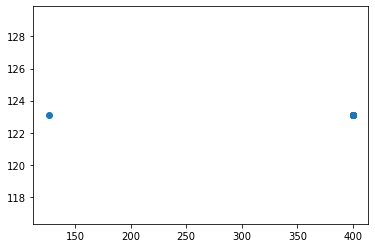

t+1 vs t-918


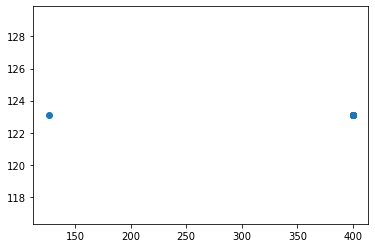

t+1 vs t-919


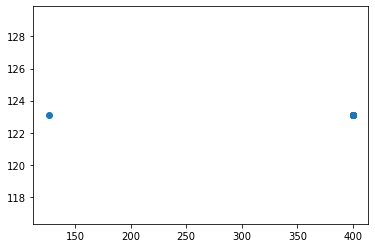

t+1 vs t-920


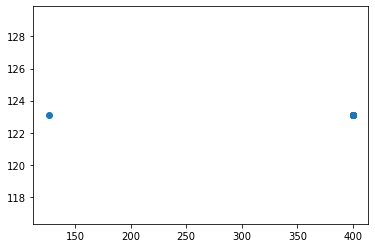

t+1 vs t-921


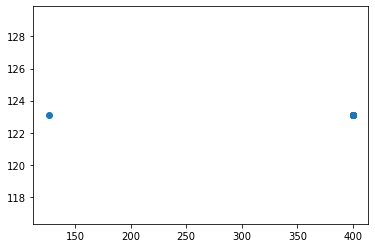

t+1 vs t-922


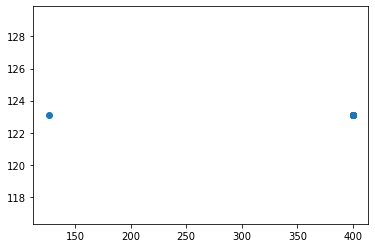

t+1 vs t-923


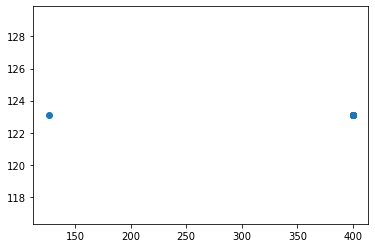

t+1 vs t-924


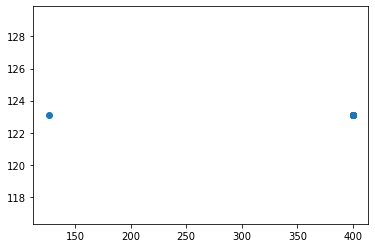

t+1 vs t-925


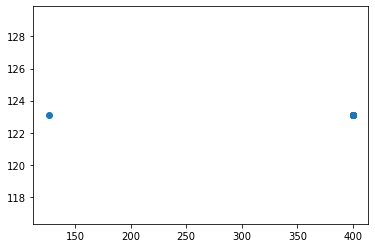

t+1 vs t-926


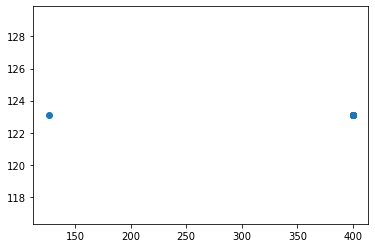

t+1 vs t-927


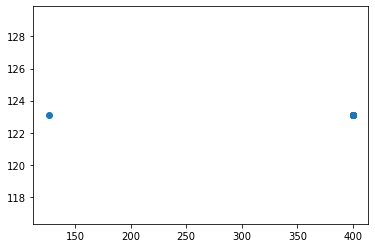

t+1 vs t-928


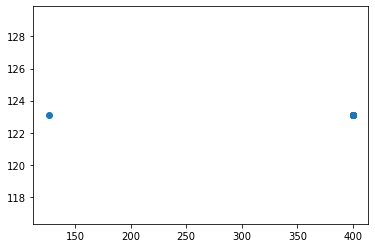

t+1 vs t-929


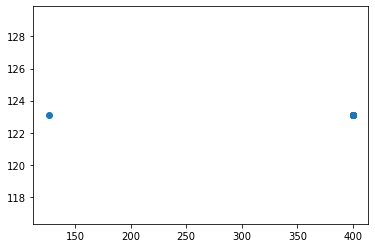

t+1 vs t-930


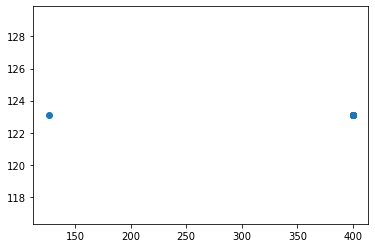

t+1 vs t-931


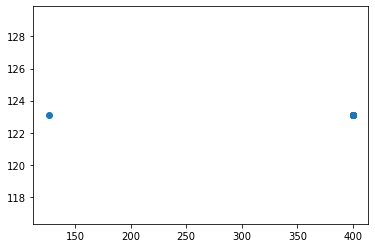

t+1 vs t-932


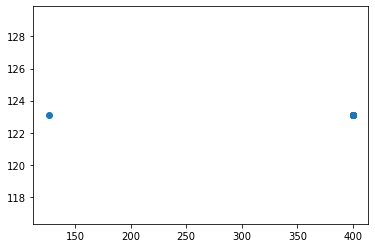

t+1 vs t-933


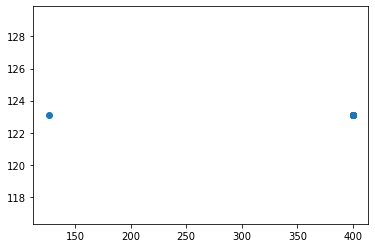

t+1 vs t-934


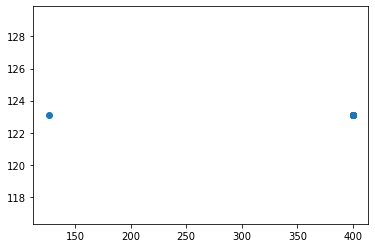

t+1 vs t-935


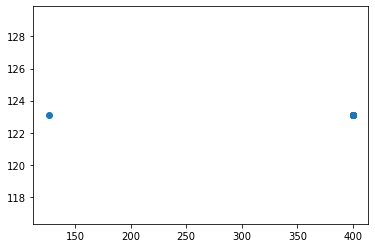

t+1 vs t-936


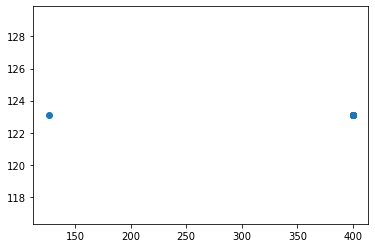

t+1 vs t-937


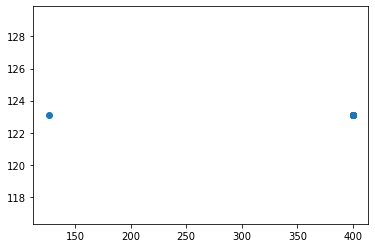

t+1 vs t-938


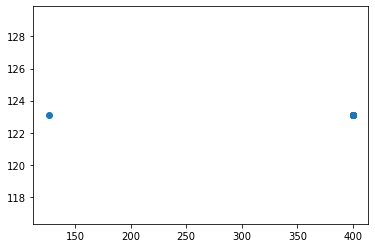

t+1 vs t-939


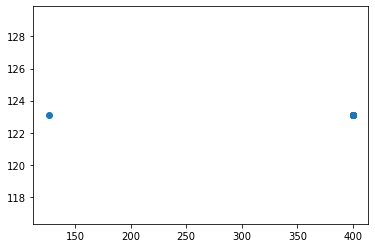

t+1 vs t-940


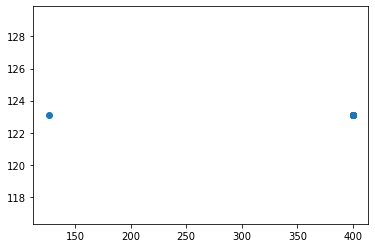

t+1 vs t-941


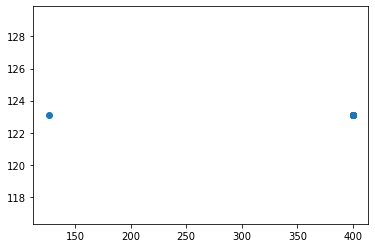

t+1 vs t-942


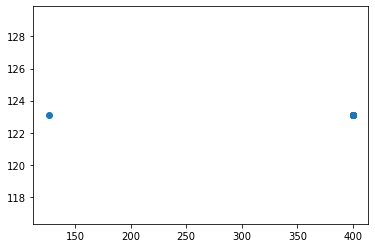

t+1 vs t-943


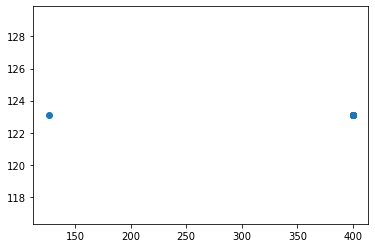

t+1 vs t-944


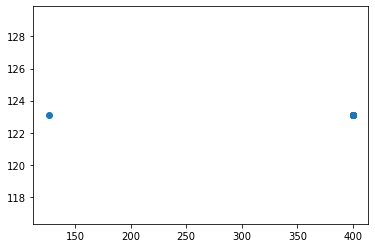

t+1 vs t-945


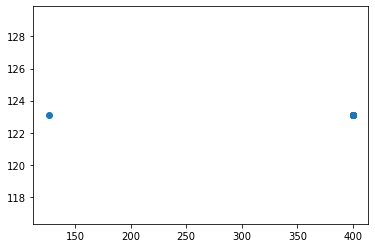

t+1 vs t-946


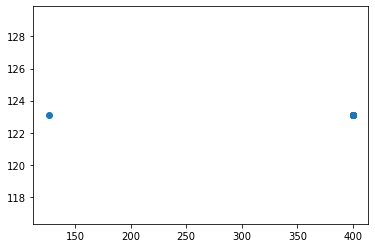

t+1 vs t-947


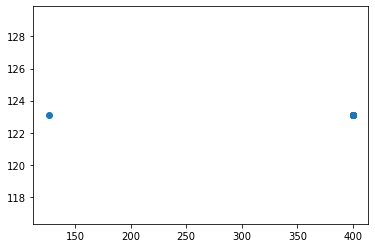

t+1 vs t-948


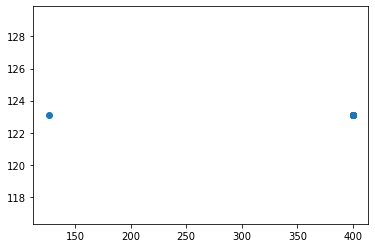

t+1 vs t-949


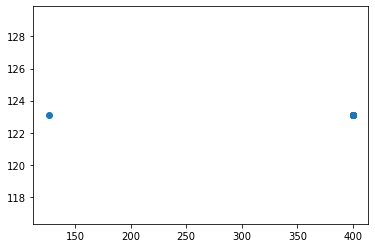

t+1 vs t-950


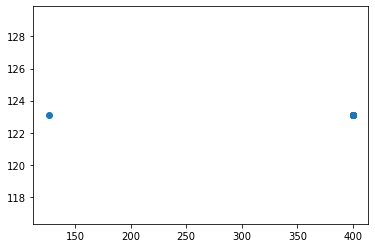

t+1 vs t-951


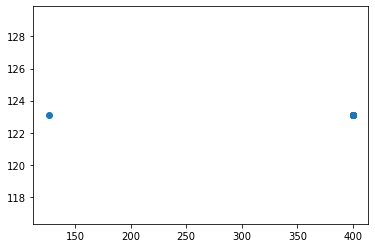

t+1 vs t-952


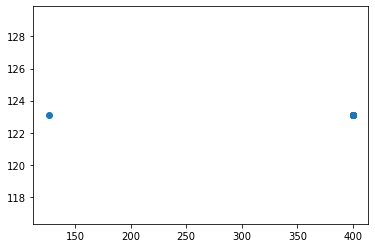

t+1 vs t-953


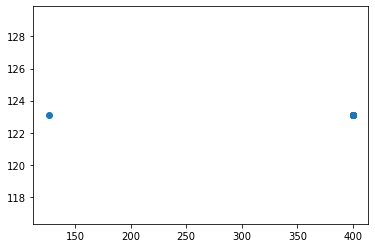

t+1 vs t-954


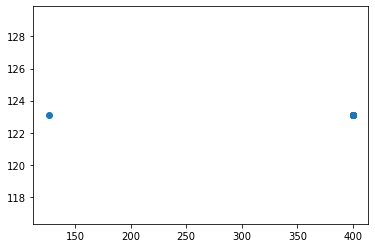

t+1 vs t-955


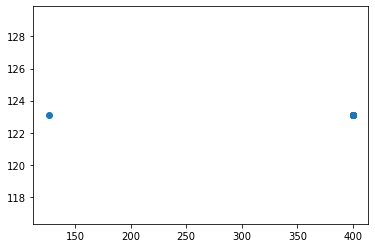

t+1 vs t-956


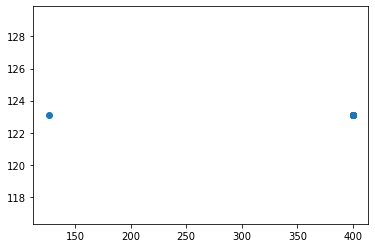

t+1 vs t-957


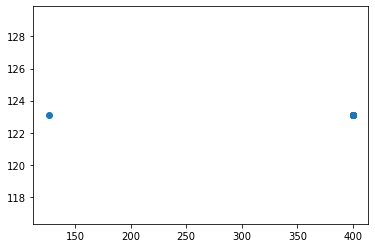

t+1 vs t-958


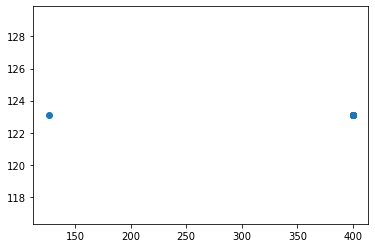

t+1 vs t-959


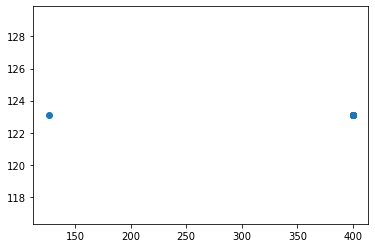

t+1 vs t-960


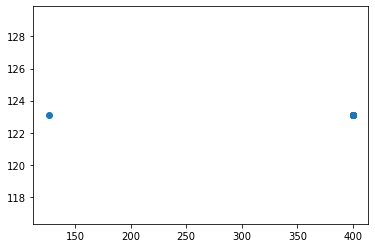

t+1 vs t-961


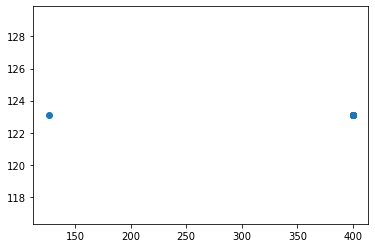

t+1 vs t-962


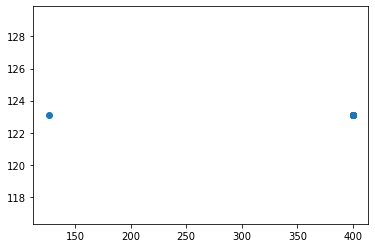

t+1 vs t-963


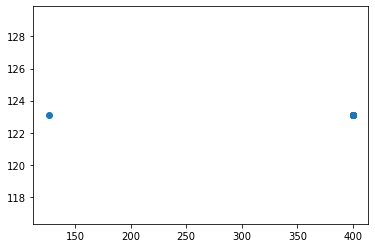

t+1 vs t-964


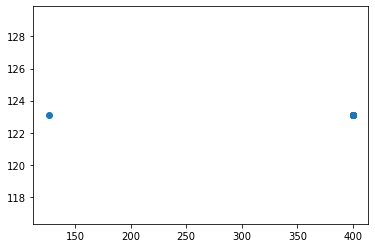

t+1 vs t-965


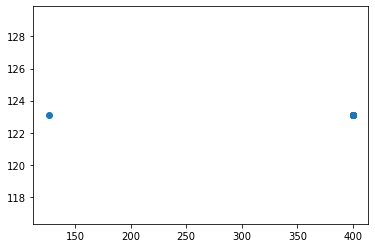

t+1 vs t-966


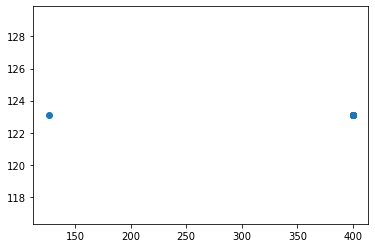

t+1 vs t-967


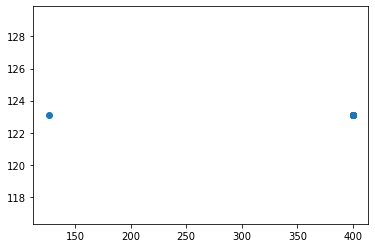

t+1 vs t-968


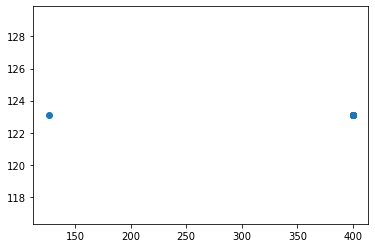

t+1 vs t-969


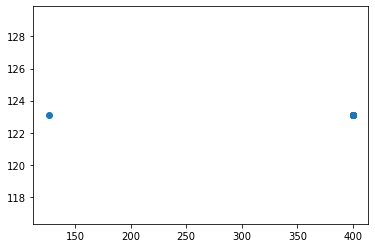

t+1 vs t-970


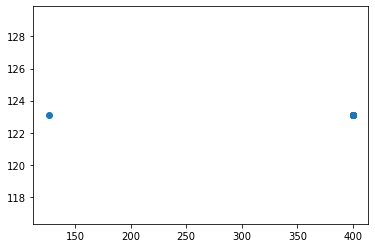

t+1 vs t-971


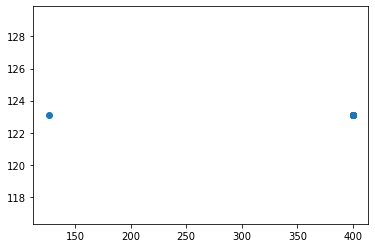

t+1 vs t-972


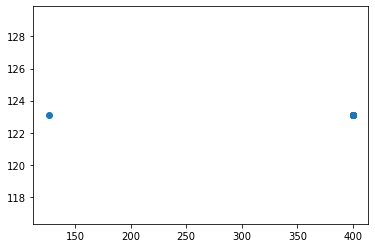

t+1 vs t-973


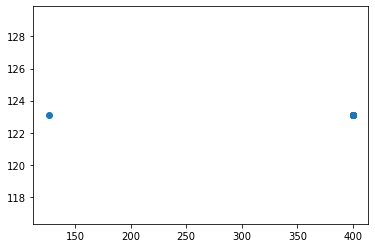

t+1 vs t-974


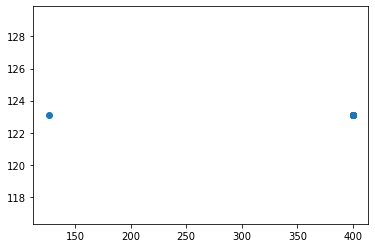

t+1 vs t-975


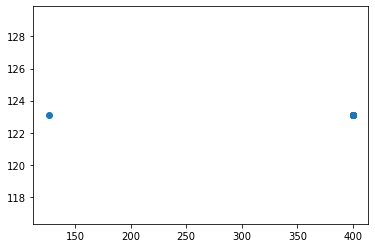

t+1 vs t-976


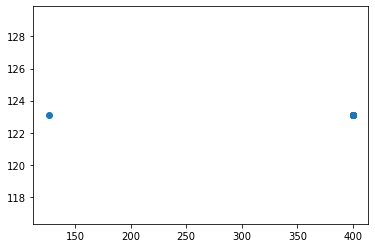

t+1 vs t-977


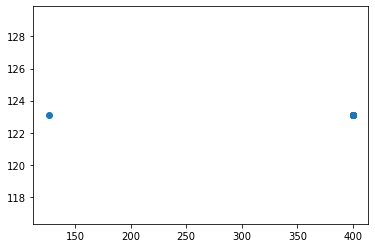

t+1 vs t-978


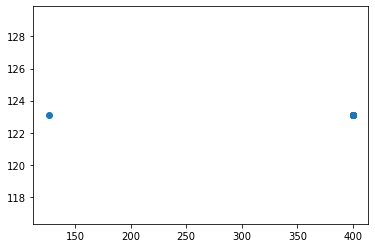

t+1 vs t-979


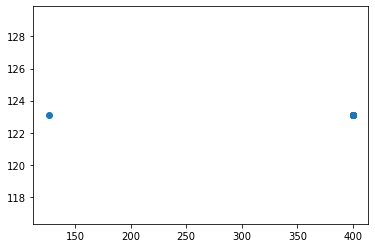

t+1 vs t-980


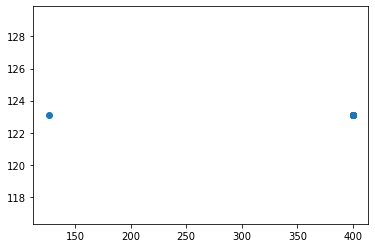

t+1 vs t-981


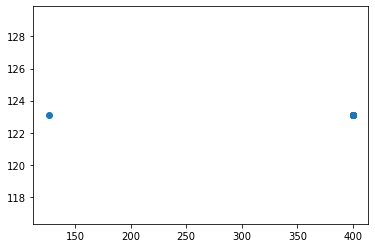

t+1 vs t-982


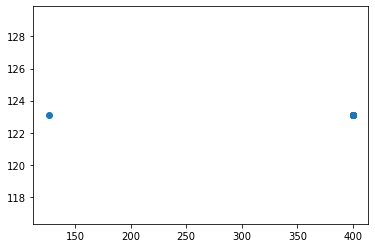

t+1 vs t-983


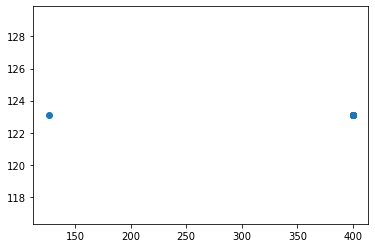

t+1 vs t-984


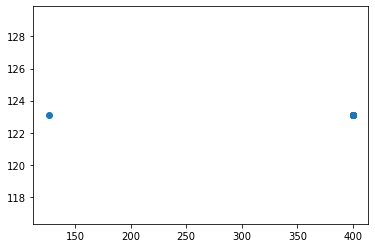

t+1 vs t-985


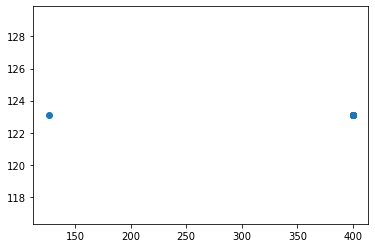

t+1 vs t-986


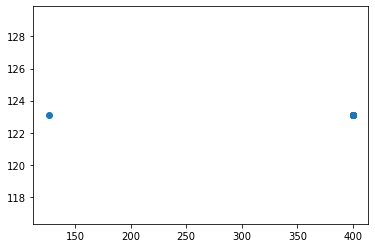

t+1 vs t-987


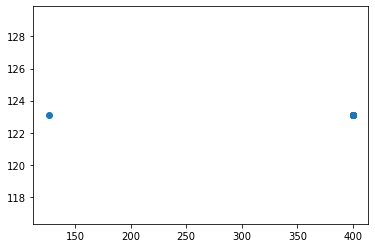

t+1 vs t-988


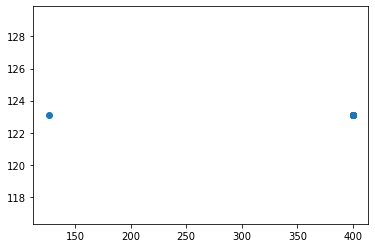

t+1 vs t-989


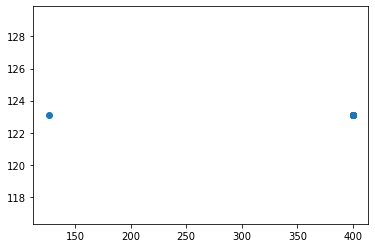

t+1 vs t-990


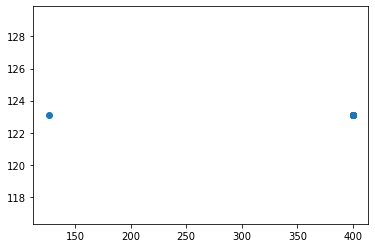

t+1 vs t-991


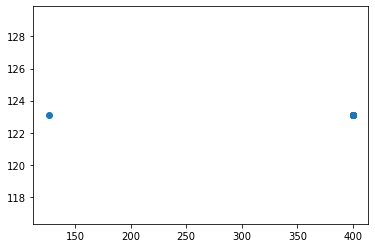

t+1 vs t-992


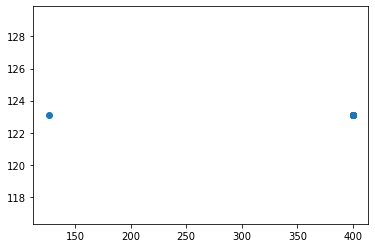

t+1 vs t-993


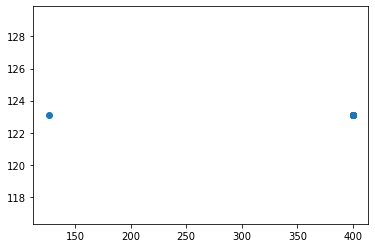

t+1 vs t-994


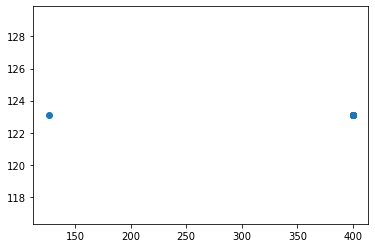

t+1 vs t-995


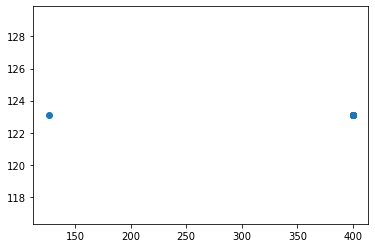

t+1 vs t-996


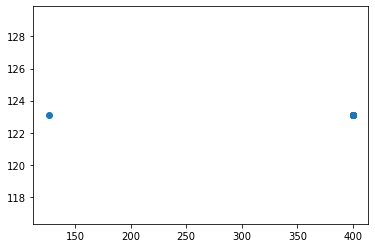

t+1 vs t-997


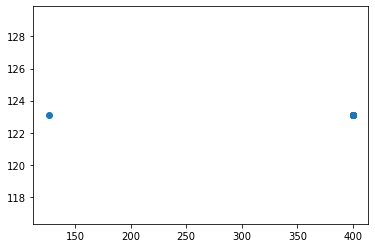

t+1 vs t-998


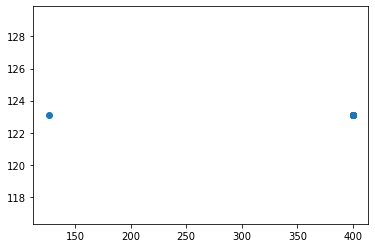

t+1 vs t-999


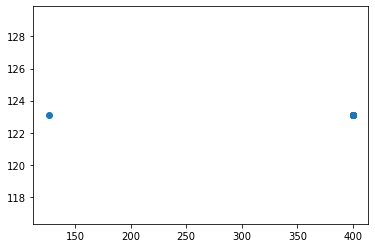

t+1 vs t-1000


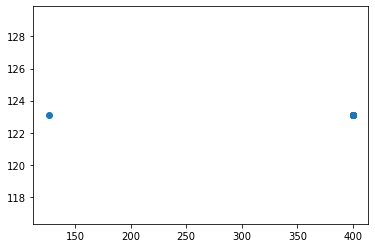

t+1 vs t-1001


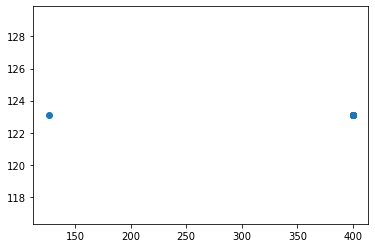

t+1 vs t-1002


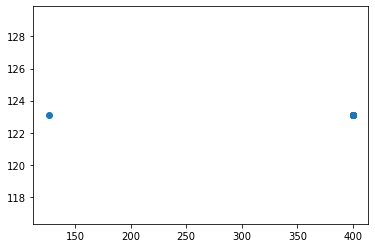

t+1 vs t-1003


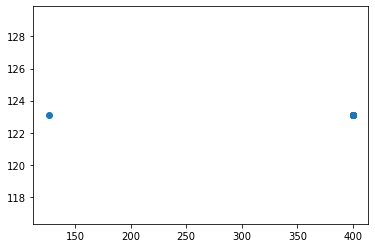

t+1 vs t-1004


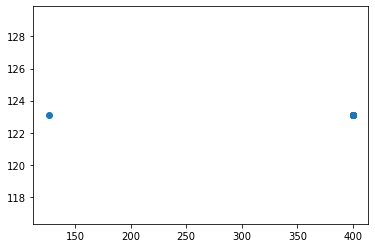

t+1 vs t-1005


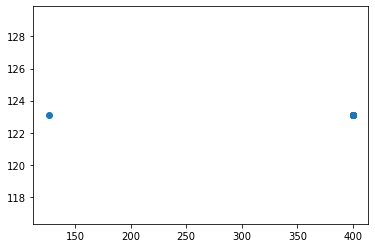

t+1 vs t-1006


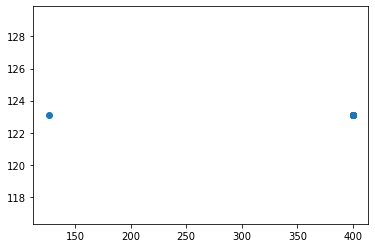

t+1 vs t-1007


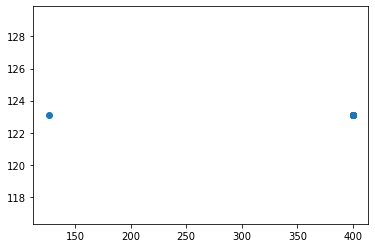

t+1 vs t-1008


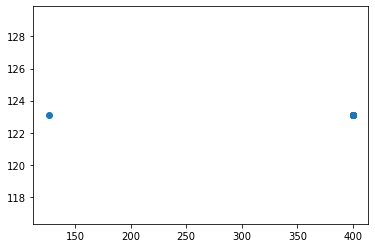

t+1 vs t-1009


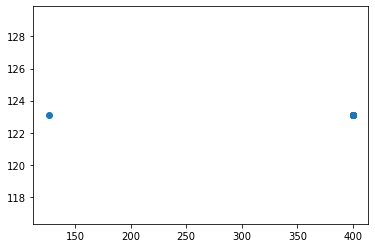

t+1 vs t-1010


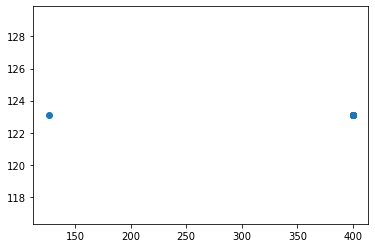

t+1 vs t-1011


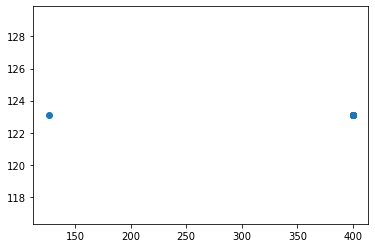

t+1 vs t-1012


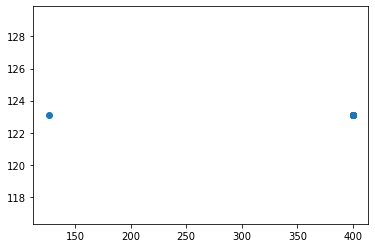

t+1 vs t-1013


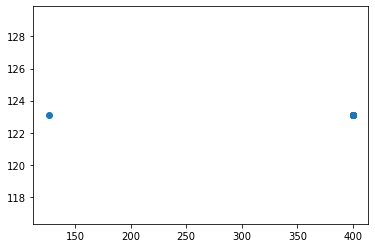

t+1 vs t-1014


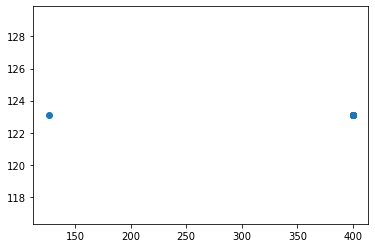

t+1 vs t-1015


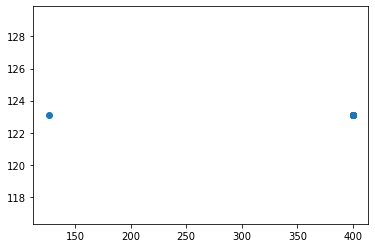

t+1 vs t-1016


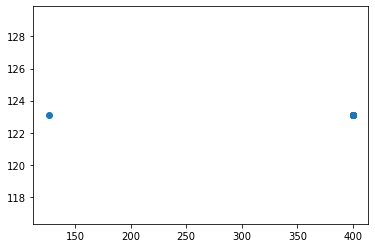

t+1 vs t-1017


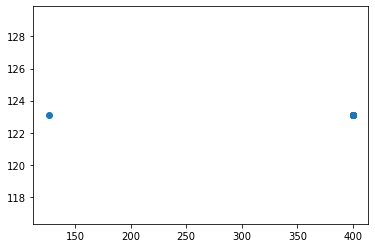

t+1 vs t-1018


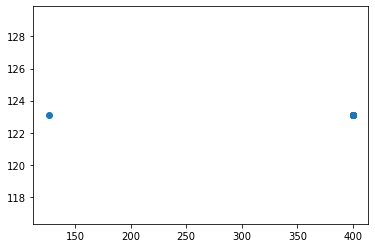

t+1 vs t-1019


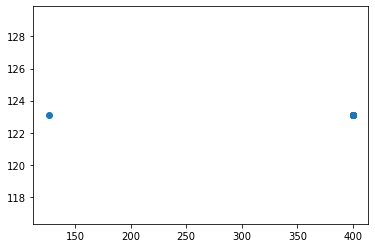

t+1 vs t-1020


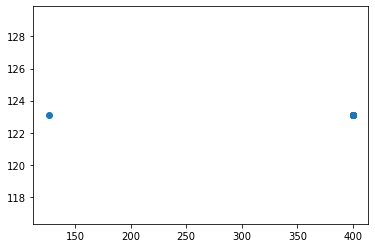

t+1 vs t-1021


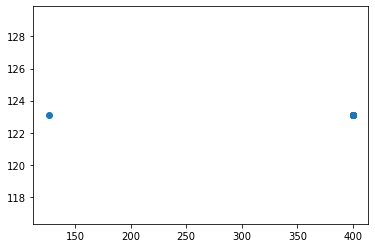

t+1 vs t-1022


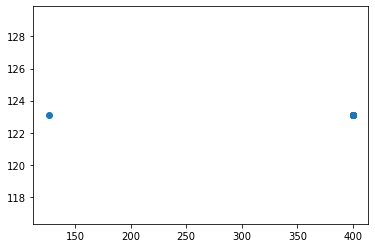

t+1 vs t-1023


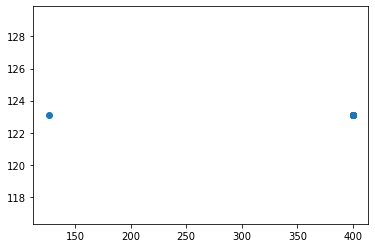

t+1 vs t-1024


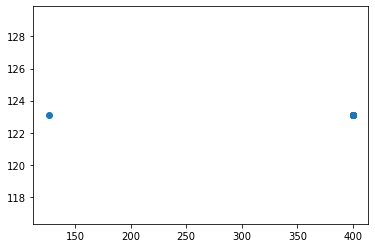

t+1 vs t-1025


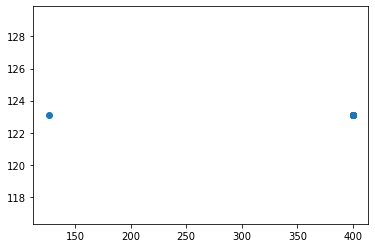

t+1 vs t-1026


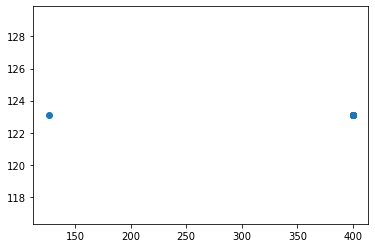

t+1 vs t-1027


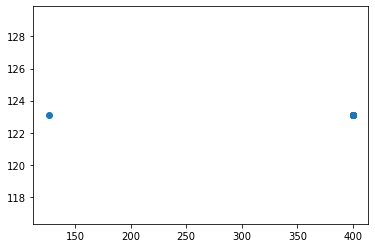

t+1 vs t-1028


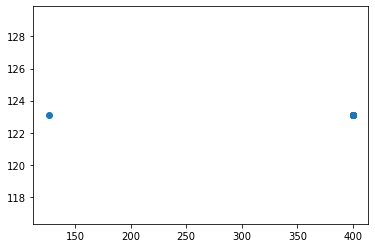

t+1 vs t-1029


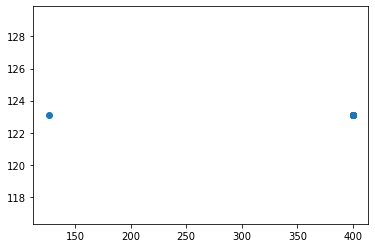

t+1 vs t-1030


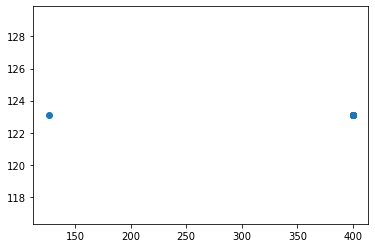

t+1 vs t-1031


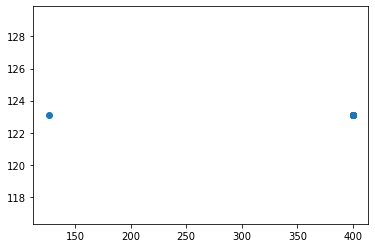

t+1 vs t-1032


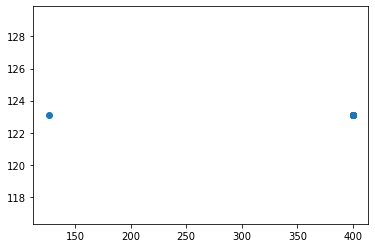

t+1 vs t-1033


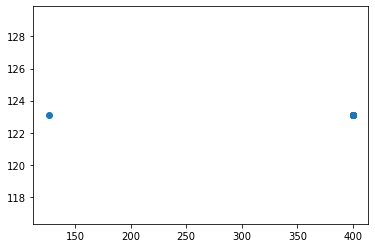

t+1 vs t-1034


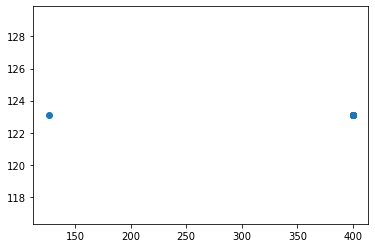

t+1 vs t-1035


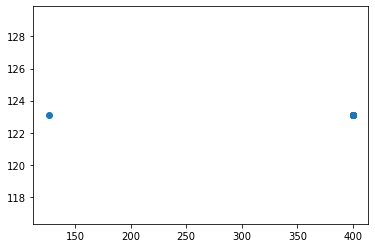

t+1 vs t-1036


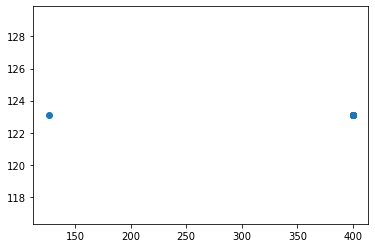

t+1 vs t-1037


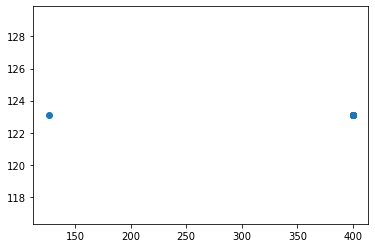

t+1 vs t-1038


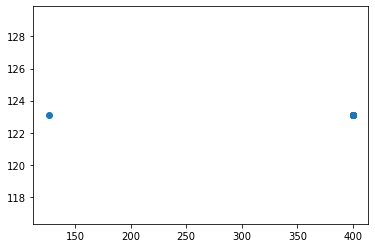

t+1 vs t-1039


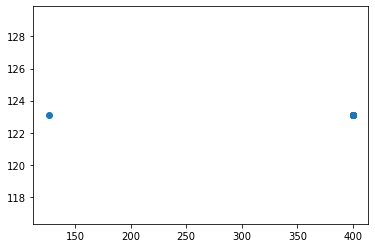

t+1 vs t-1040


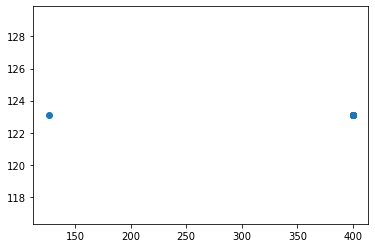

t+1 vs t-1041


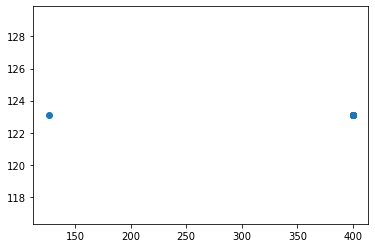

t+1 vs t-1042


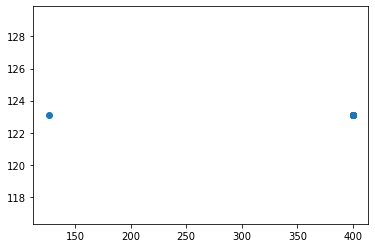

t+1 vs t-1043


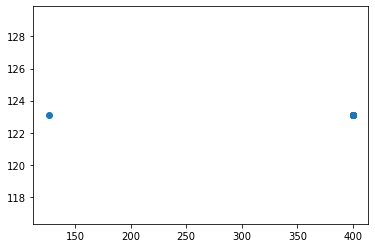

t+1 vs t-1044


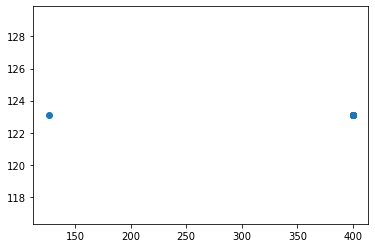

t+1 vs t-1045


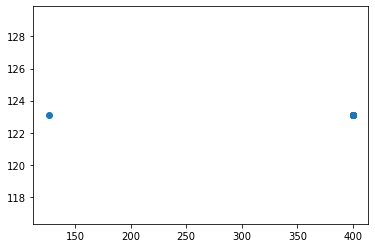

t+1 vs t-1046


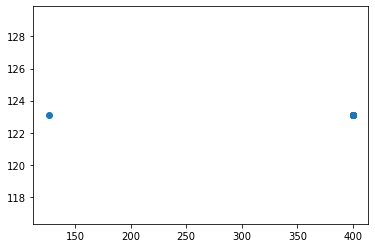

t+1 vs t-1047


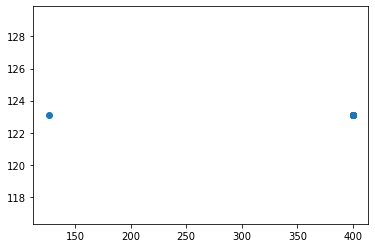

t+1 vs t-1048


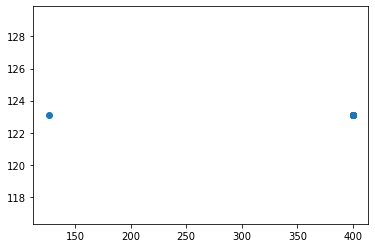

t+1 vs t-1049


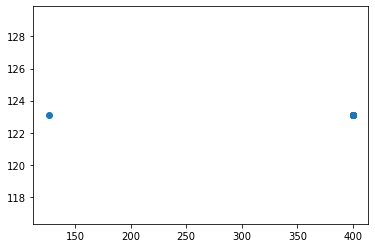

t+1 vs t-1050


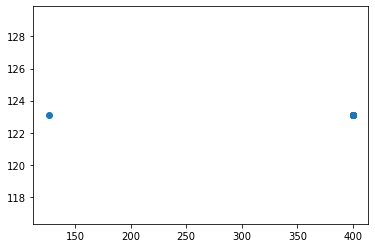

t+1 vs t-1051


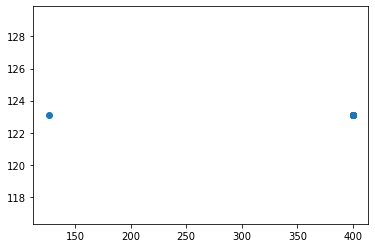

t+1 vs t-1052


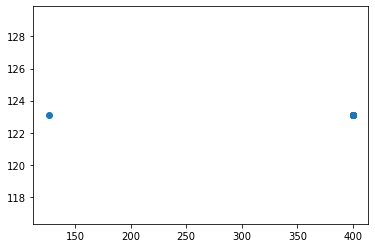

t+1 vs t-1053


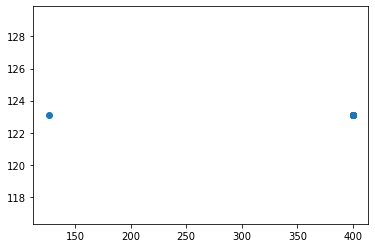

t+1 vs t-1054


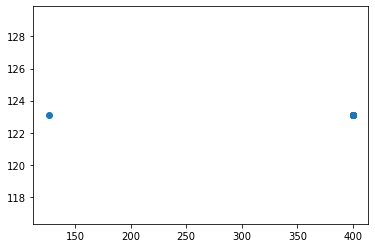

t+1 vs t-1055


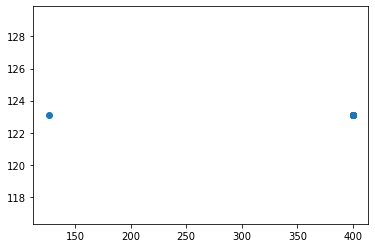

t+1 vs t-1056


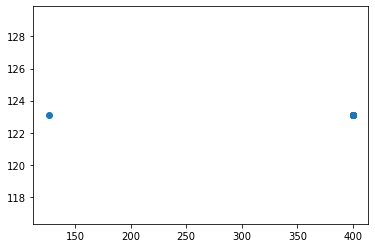

t+1 vs t-1057


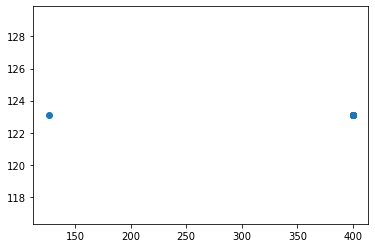

t+1 vs t-1058


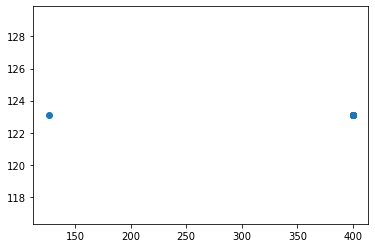

t+1 vs t-1059


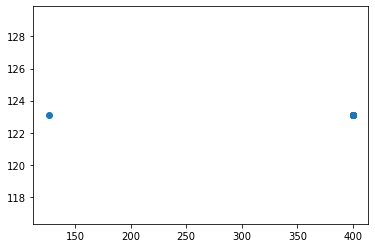

t+1 vs t-1060


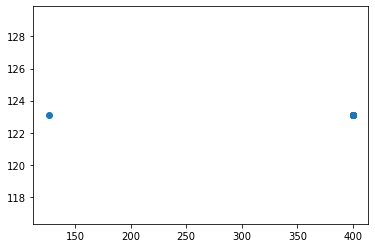

t+1 vs t-1061


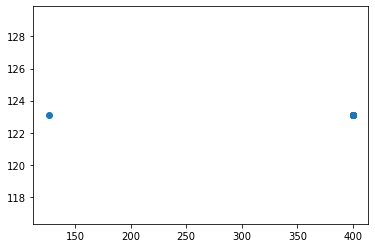

t+1 vs t-1062


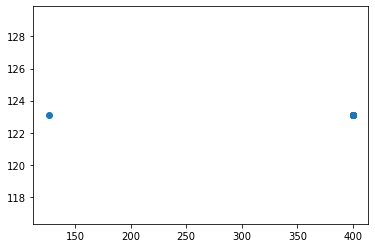

t+1 vs t-1063


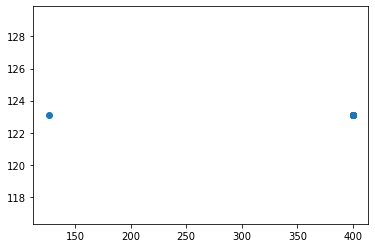

t+1 vs t-1064


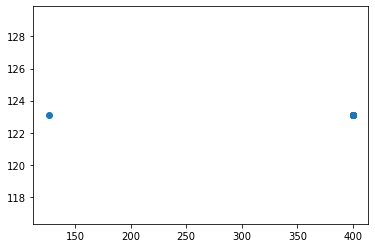

t+1 vs t-1065


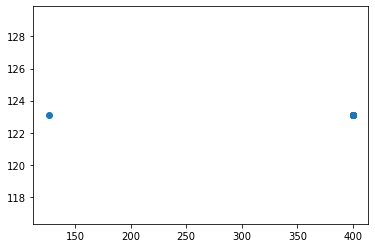

t+1 vs t-1066


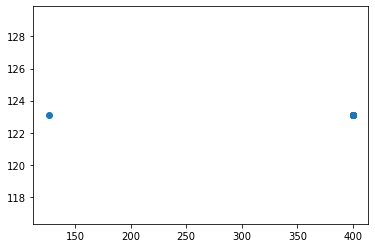

t+1 vs t-1067


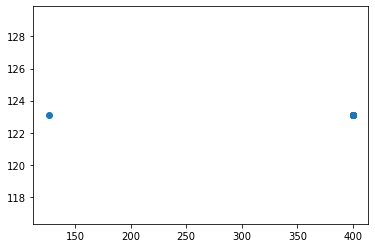

t+1 vs t-1068


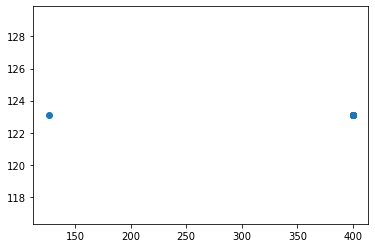

t+1 vs t-1069


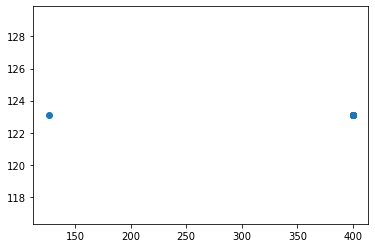

t+1 vs t-1070


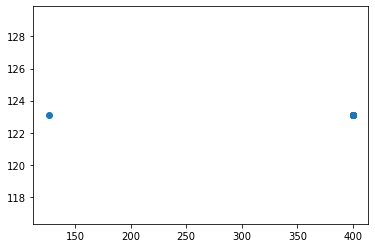

t+1 vs t-1071


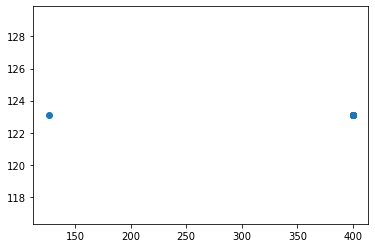

t+1 vs t-1072


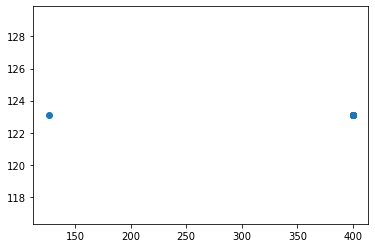

t+1 vs t-1073


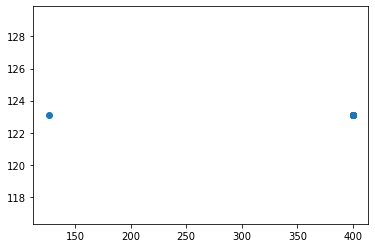

t+1 vs t-1074


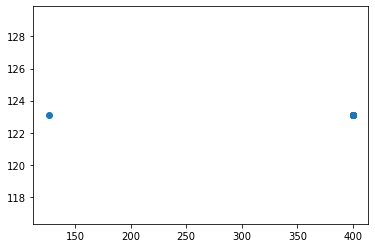

t+1 vs t-1075


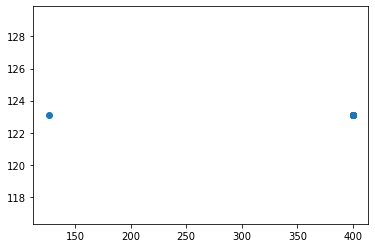

t+1 vs t-1076


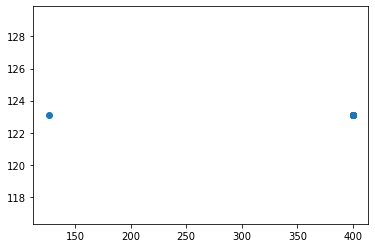

t+1 vs t-1077


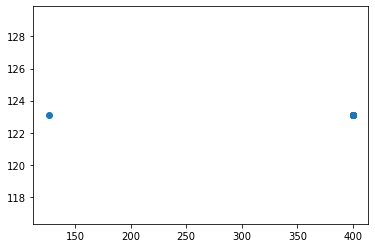

t+1 vs t-1078


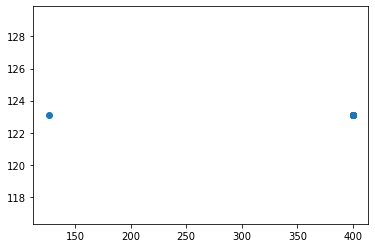

t+1 vs t-1079


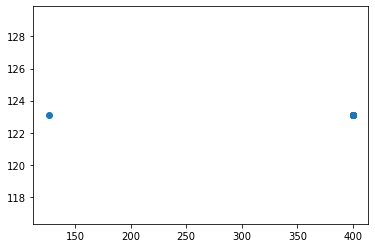

t+1 vs t-1080


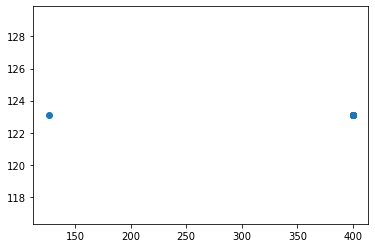

t+1 vs t-1081


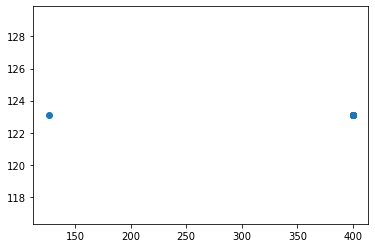

t+1 vs t-1082


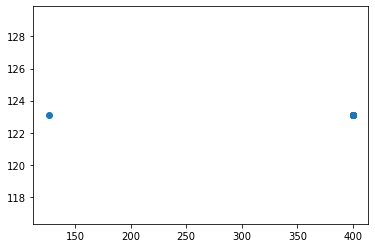

t+1 vs t-1083


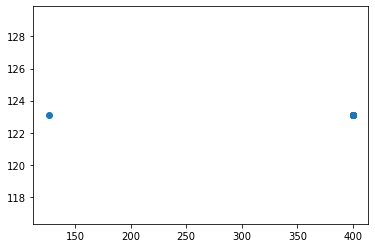

t+1 vs t-1084


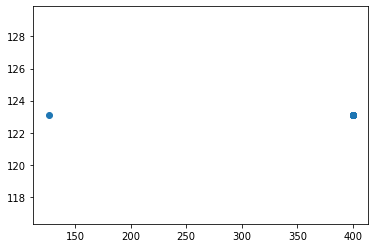

t+1 vs t-1085


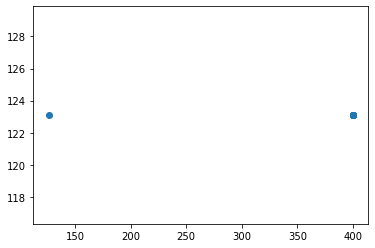

t+1 vs t-1086


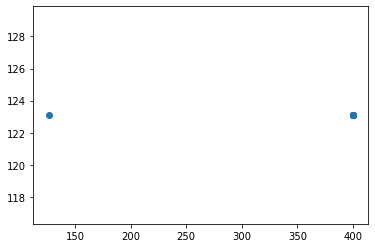

t+1 vs t-1087


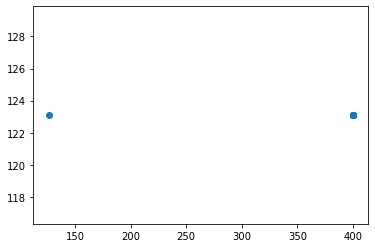

t+1 vs t-1088


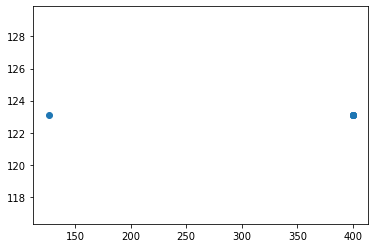

t+1 vs t-1089


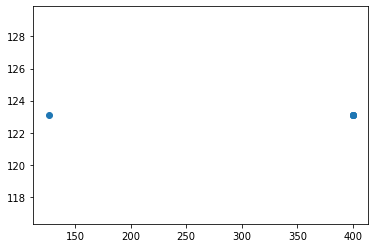

t+1 vs t-1090


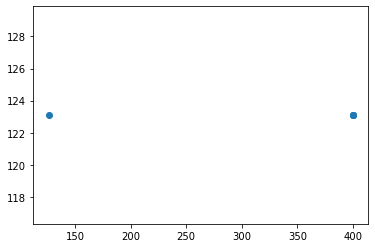

t+1 vs t-1091


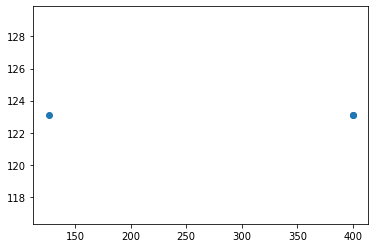

t+1 vs t-1092


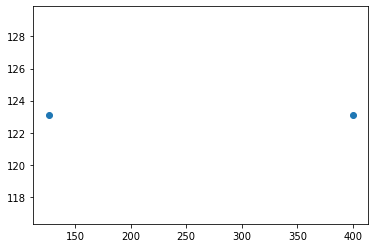

t+1 vs t-1093


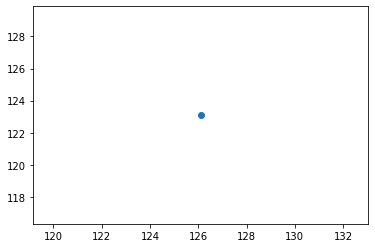

t+1 vs t-1094


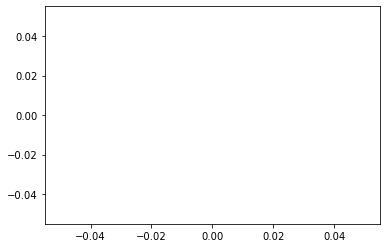

In [568]:
values = DataFrame(transacciones_78_importe_df.values)
lags = transacciones_78_importe_df.size
columns = [values]
for i in range(1,(lags + 1)):
	columns.append(values.shift(i))
dataframe = concat(columns, axis=1)
columns = ['t+1']
for i in range(1,(lags + 1)):
	columns.append('t-' + str(i))
dataframe.columns = columns
for i in range(1,(lags + 1)):
	print('t+1 vs t-' + str(i))
	pyplot.scatter(x=dataframe['t+1'].values, y=dataframe['t-'+str(i)].values)
	pyplot.show()

In [255]:
"""
Repetimos las mismas conclusiones en la correlacion de y(t+1) con sus 8 lags anteriores para la correlacion con todos sus
lags anteriores.
"""

'\nRepetimos las mismas conclusiones en la correlacion de y(t+1) con sus 8 lags anteriores para la correlacion con todos sus\nlags anteriores.\n'

In [256]:
# 6. Time Series Autocorrelation Plots

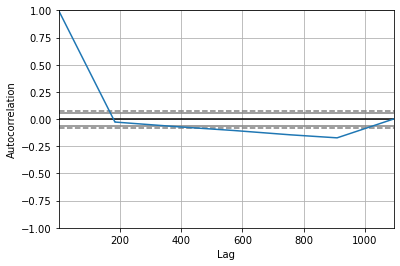

In [257]:
autocorrelation_plot(transacciones_78_importe_df)
pyplot.show()

In [258]:
"""
Vemos que hay una alta correlacion positiva (mayor a 0.5) entre y(t+1) y sus 100 lags anteriores y correlacion positiva 
estadisticamente significativa desde el lag 100 hasta el 180.

Hay correlacion negativa estadisticamente significativa de y(t+1) con los lags desde el 400 al 1000.

CONCLUSION: Esta serie temporal es modelizable.
"""

'\nVemos que hay una alta correlacion positiva (mayor a 0.5) entre y(t+1) y sus 100 lags anteriores y correlacion positiva \nestadisticamente significativa desde el lag 100 hasta el 180.\n\nHay correlacion negativa estadisticamente significativa de y(t+1) con los lags desde el 400 al 1000.\n\nCONCLUSION: Esta serie temporal es modelizable.\n'

In [259]:
# Hacemos el dataframe del dia de pago del seguro del coche

In [260]:
transacciones_78_dia_df = transacciones_78_importe_df.copy()
transacciones_78_dia_df

,IMPORTE
2016-10-13,123.1
2016-10-14,123.1
2016-10-15,123.1
2016-10-16,123.1
2016-10-17,123.1
...,...
2019-10-07,400.0
2019-10-08,400.0
2019-10-09,400.0
2019-10-10,400.0


In [261]:
# hacemos una columna con la fecha a partir del índice
transacciones_78_dia_df['FECHA'] = transacciones_78_dia_df.index
transacciones_78_dia_df

,IMPORTE,FECHA
2016-10-13,123.1,2016-10-13
2016-10-14,123.1,2016-10-14
2016-10-15,123.1,2016-10-15
2016-10-16,123.1,2016-10-16
2016-10-17,123.1,2016-10-17
...,...,...
2019-10-07,400.0,2019-10-07
2019-10-08,400.0,2019-10-08
2019-10-09,400.0,2019-10-09
2019-10-10,400.0,2019-10-10


In [262]:
transacciones_78_dia_df.dtypes

IMPORTE           float64
FECHA      datetime64[ns]
dtype: object

In [263]:
# vamos a repetir el ultimo año 3 veces

In [264]:
end_date = transacciones_78_dia_df.FECHA.max()
end_date

Timestamp('2019-10-11 00:00:00')

In [265]:
start_date = end_date - relativedelta(years=1)
start_date

Timestamp('2018-10-11 00:00:00')

In [266]:
mask = (transacciones_78_dia_df['FECHA'] > start_date) & (transacciones_78_dia_df['FECHA'] <= end_date)
mask

2016-10-13    False
2016-10-14    False
2016-10-15    False
2016-10-16    False
2016-10-17    False
              ...  
2019-10-07     True
2019-10-08     True
2019-10-09     True
2019-10-10     True
2019-10-11     True
Freq: D, Name: FECHA, Length: 1094, dtype: bool

In [267]:
transacciones_78_dia_year3_df = transacciones_78_dia_df.loc[mask]
transacciones_78_dia_year3_df

,IMPORTE,FECHA
2018-10-12,126.13,2018-10-12
2018-10-13,126.13,2018-10-13
2018-10-14,126.13,2018-10-14
2018-10-15,126.13,2018-10-15
2018-10-16,126.13,2018-10-16
...,...,...
2019-10-07,400.00,2019-10-07
2019-10-08,400.00,2019-10-08
2019-10-09,400.00,2019-10-09
2019-10-10,400.00,2019-10-10


In [268]:
transacciones_78_dia_year2_df = transacciones_78_dia_year3_df.copy()
transacciones_78_dia_year2_df

,IMPORTE,FECHA
2018-10-12,126.13,2018-10-12
2018-10-13,126.13,2018-10-13
2018-10-14,126.13,2018-10-14
2018-10-15,126.13,2018-10-15
2018-10-16,126.13,2018-10-16
...,...,...
2019-10-07,400.00,2019-10-07
2019-10-08,400.00,2019-10-08
2019-10-09,400.00,2019-10-09
2019-10-10,400.00,2019-10-10


In [269]:
transacciones_78_dia_year1_df = transacciones_78_dia_year3_df.copy()
transacciones_78_dia_year1_df

,IMPORTE,FECHA
2018-10-12,126.13,2018-10-12
2018-10-13,126.13,2018-10-13
2018-10-14,126.13,2018-10-14
2018-10-15,126.13,2018-10-15
2018-10-16,126.13,2018-10-16
...,...,...
2019-10-07,400.00,2019-10-07
2019-10-08,400.00,2019-10-08
2019-10-09,400.00,2019-10-09
2019-10-10,400.00,2019-10-10


In [270]:
transacciones_78_dia_year2_df['FECHA'] = transacciones_78_dia_year2_df['FECHA'] - DateOffset(years=1)
transacciones_78_dia_year2_df

,IMPORTE,FECHA
2018-10-12,126.13,2017-10-12
2018-10-13,126.13,2017-10-13
2018-10-14,126.13,2017-10-14
2018-10-15,126.13,2017-10-15
2018-10-16,126.13,2017-10-16
...,...,...
2019-10-07,400.00,2018-10-07
2019-10-08,400.00,2018-10-08
2019-10-09,400.00,2018-10-09
2019-10-10,400.00,2018-10-10


In [271]:
transacciones_78_dia_year1_df['FECHA'] = transacciones_78_dia_year1_df['FECHA'] - DateOffset(years=2)
transacciones_78_dia_year1_df

,IMPORTE,FECHA
2018-10-12,126.13,2016-10-12
2018-10-13,126.13,2016-10-13
2018-10-14,126.13,2016-10-14
2018-10-15,126.13,2016-10-15
2018-10-16,126.13,2016-10-16
...,...,...
2019-10-07,400.00,2017-10-07
2019-10-08,400.00,2017-10-08
2019-10-09,400.00,2017-10-09
2019-10-10,400.00,2017-10-10


In [272]:
transacciones_78_dia_year3_df.reset_index(drop=True, inplace=True)
transacciones_78_dia_year3_df

,IMPORTE,FECHA
0,126.13,2018-10-12
1,126.13,2018-10-13
2,126.13,2018-10-14
3,126.13,2018-10-15
4,126.13,2018-10-16
...,...,...
360,400.00,2019-10-07
361,400.00,2019-10-08
362,400.00,2019-10-09
363,400.00,2019-10-10


In [273]:
transacciones_78_dia_year2_df.reset_index(drop=True, inplace=True)
transacciones_78_dia_year2_df

,IMPORTE,FECHA
0,126.13,2017-10-12
1,126.13,2017-10-13
2,126.13,2017-10-14
3,126.13,2017-10-15
4,126.13,2017-10-16
...,...,...
360,400.00,2018-10-07
361,400.00,2018-10-08
362,400.00,2018-10-09
363,400.00,2018-10-10


In [274]:
transacciones_78_dia_year1_df.reset_index(drop=True, inplace=True)
transacciones_78_dia_year1_df

,IMPORTE,FECHA
0,126.13,2016-10-12
1,126.13,2016-10-13
2,126.13,2016-10-14
3,126.13,2016-10-15
4,126.13,2016-10-16
...,...,...
360,400.00,2017-10-07
361,400.00,2017-10-08
362,400.00,2017-10-09
363,400.00,2017-10-10


In [275]:
transacciones_78_dia_year1_df = transacciones_78_dia_year1_df.append(transacciones_78_dia_year2_df, ignore_index=True)
transacciones_78_dia_year1_df

,IMPORTE,FECHA
0,126.13,2016-10-12
1,126.13,2016-10-13
2,126.13,2016-10-14
3,126.13,2016-10-15
4,126.13,2016-10-16
...,...,...
725,400.00,2018-10-07
726,400.00,2018-10-08
727,400.00,2018-10-09
728,400.00,2018-10-10


In [276]:
transacciones_78_dia_year1_df

,IMPORTE,FECHA
0,126.13,2016-10-12
1,126.13,2016-10-13
2,126.13,2016-10-14
3,126.13,2016-10-15
4,126.13,2016-10-16
...,...,...
725,400.00,2018-10-07
726,400.00,2018-10-08
727,400.00,2018-10-09
728,400.00,2018-10-10


In [277]:
transacciones_78_dia_year1_df = transacciones_78_dia_year1_df.append(transacciones_78_dia_year3_df, ignore_index=True)
transacciones_78_dia_year1_df

,IMPORTE,FECHA
0,126.13,2016-10-12
1,126.13,2016-10-13
2,126.13,2016-10-14
3,126.13,2016-10-15
4,126.13,2016-10-16
...,...,...
1090,400.00,2019-10-07
1091,400.00,2019-10-08
1092,400.00,2019-10-09
1093,400.00,2019-10-10


In [278]:
transacciones_78_3years_df = transacciones_78_dia_year1_df.copy()
transacciones_78_3years_df

,IMPORTE,FECHA
0,126.13,2016-10-12
1,126.13,2016-10-13
2,126.13,2016-10-14
3,126.13,2016-10-15
4,126.13,2016-10-16
...,...,...
1090,400.00,2019-10-07
1091,400.00,2019-10-08
1092,400.00,2019-10-09
1093,400.00,2019-10-10


In [279]:
del transacciones_78_dia_year1_df
del transacciones_78_dia_year2_df
del transacciones_78_dia_year3_df

In [280]:
transacciones_78_3years_df.set_index(['FECHA'], drop=True, inplace=True)
transacciones_78_3years_df

,IMPORTE
FECHA,
2016-10-12,126.13
2016-10-13,126.13
2016-10-14,126.13
2016-10-15,126.13
2016-10-16,126.13
...,...
2019-10-07,400.00
2019-10-08,400.00
2019-10-09,400.00


In [281]:
transacciones_78_3years_df.dtypes

IMPORTE    float64
dtype: object

In [282]:
transacciones_78_3years_df.index

DatetimeIndex(['2016-10-12', '2016-10-13', '2016-10-14', '2016-10-15',
               '2016-10-16', '2016-10-17', '2016-10-18', '2016-10-19',
               '2016-10-20', '2016-10-21',
               ...
               '2019-10-02', '2019-10-03', '2019-10-04', '2019-10-05',
               '2019-10-06', '2019-10-07', '2019-10-08', '2019-10-09',
               '2019-10-10', '2019-10-11'],
              dtype='datetime64[ns]', name='FECHA', length=1095, freq=None)

In [283]:
del transacciones_78_dia_df

In [284]:
transacciones_78_3years_importe_df = transacciones_78_3years_df.copy()
transacciones_78_3years_importe_df

,IMPORTE
FECHA,
2016-10-12,126.13
2016-10-13,126.13
2016-10-14,126.13
2016-10-15,126.13
2016-10-16,126.13
...,...
2019-10-07,400.00
2019-10-08,400.00
2019-10-09,400.00


In [285]:
# vamos a repetir el estudio de la serie temporal del ultimo año concatenado 3 veces

In [286]:
# Time Series Data Visualization with Python
# https://machinelearningmastery.com/time-series-data-visualization-with-python/

In [287]:
# 1. Time Series Line Plot

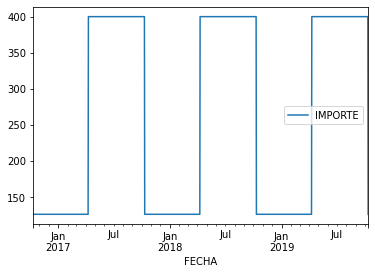

In [288]:
transacciones_78_3years_importe_df.plot()
pyplot.show()

In [289]:
"""
A priori sale una serie temporal repetible y facilmente modelizable.
"""

'\nA priori sale una serie temporal repetible y facilmente modelizable.\n'

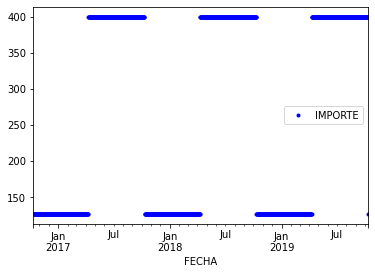

In [290]:
transacciones_78_3years_importe_df.plot(style='b.')
pyplot.show()

In [291]:
# 2. Time Series Histogram and Density Plots

In [292]:
transacciones_78_3years_importe_df

,IMPORTE
FECHA,
2016-10-12,126.13
2016-10-13,126.13
2016-10-14,126.13
2016-10-15,126.13
2016-10-16,126.13
...,...
2019-10-07,400.00
2019-10-08,400.00
2019-10-09,400.00


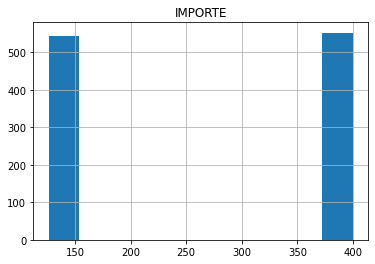

In [293]:
transacciones_78_3years_importe_df.hist()
pyplot.show()

In [294]:
"""
Nos sale una distribucion con dos picos bien definidos y cuyos datos se distribuyen por igual
"""

'\nNos sale una distribucion con dos picos bien definidos y cuyos datos se distribuyen por igual\n'

In [295]:
transacciones_78_3years_importe_df.describe()

,IMPORTE
count,1095.000000
mean,264.190411
std,136.993026
min,126.100000
25%,126.130000
50%,400.000000
75%,400.000000
max,400.000000


In [296]:
"""
min = 126.10
q1 = 126.13
stat_mode = q2 = q3 = max = 400.00
mean = 264.19 eur
std = 136.99 eur
"""

'\nmin = 126.10\nq1 = 126.13\nstat_mode = q2 = q3 = max = 400.00\nmean = 264.19 eur\nstd = 136.99 eur\n'

In [297]:
# calculamos la moda
stat_mode = statistics.mode(transacciones_78_3years_importe_df['IMPORTE'])
stat_mode

400.0

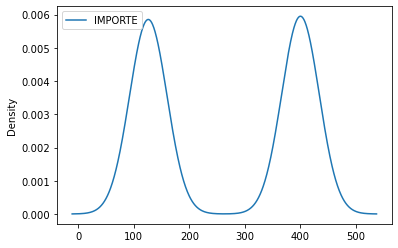

In [298]:
transacciones_78_3years_importe_df.plot(kind='kde')
pyplot.show()

In [299]:
"""
El diagrama de densidad nos confirma las conclusiones del histograma y de la serie temporal:
2 series normales juntas: 1 con un pico en 125 eur y otra con un pico en 400 eur.
"""

'\nEl diagrama de densidad nos confirma las conclusiones del histograma y de la serie temporal:\n2 series normales juntas: 1 con un pico en 125 eur y otra con un pico en 400 eur.\n'

In [300]:
# 3. Time Series Box and Whisker Plots by Interval

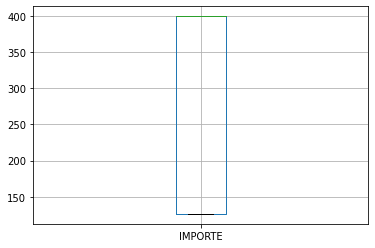

In [301]:
transacciones_78_3years_importe_df.boxplot()
pyplot.show()

In [302]:
"""
El boxplot no tiene outliers ni whiskers
min = 126.10; q1 = 126.13
stat_mode = q2 = q3 = max = 400.00
"""

'\nEl boxplot no tiene outliers ni whiskers\nmin = 126.10; q1 = 126.13\nstat_mode = q2 = q3 = max = 400.00\n'

In [303]:
# 4. Time Series Heat Maps

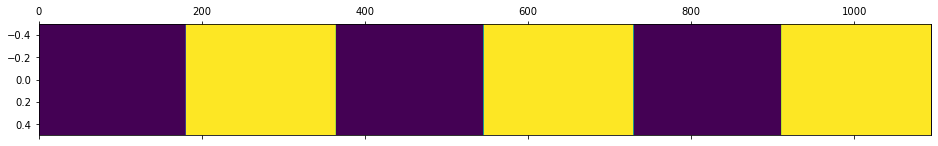

In [304]:
pyplot.matshow(transacciones_78_3years_importe_df.T, interpolation=None, aspect='auto')
pyplot.show()

In [305]:
"""
El mapa de color no nos aporta nueva informacion con respecto al grafico de la serie temporal y los anterioresw gráficos sino
que va en línea con ellos.
"""

'\nEl mapa de color no nos aporta nueva informacion con respecto al grafico de la serie temporal y los anterioresw gráficos sino\nque va en línea con ellos.\n'

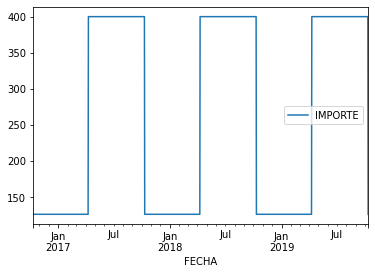

In [306]:
transacciones_78_3years_importe_df.plot()
pyplot.show()

In [307]:
# 5. Time Series Lag Scatter Plots

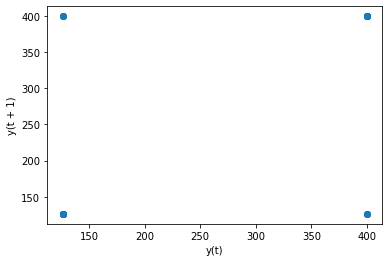

In [308]:
lag_plot(transacciones_78_3years_importe_df)
pyplot.show()

In [309]:
"""
Al igual que en estudio de anterior serie temporal:
Como esta distribucion solo toma valores en 125 eur y 400 eur los scatter plots no dan información visible sobre la correlacion
entre y(t+1) e y(t) pero eso no quiere decir que esta serie no sea modelizable.
"""

'\nAl igual que en estudio de anterior serie temporal:\nComo esta distribucion solo toma valores en 125 eur y 400 eur los scatter plots no dan información visible sobre la correlacion\nentre y(t+1) e y(t) pero eso no quiere decir que esta serie no sea modelizable.\n'

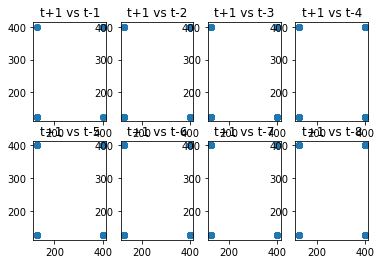

In [310]:
values = DataFrame(transacciones_78_3years_importe_df.values)
lags = 8
columns = [values]
for i in range(1,(lags + 1)):
	columns.append(values.shift(i))
dataframe = concat(columns, axis=1)
columns = ['t+1']
for i in range(1,(lags + 1)):
	columns.append('t-' + str(i))
dataframe.columns = columns
pyplot.figure(1)
for i in range(1,(lags + 1)):
	ax = pyplot.subplot(240 + i)
	ax.set_title('t+1 vs t-' + str(i))
	pyplot.scatter(x=dataframe['t+1'].values, y=dataframe['t-'+str(i)].values)
pyplot.show()

In [311]:
"""
Repetimos la misma conclusion entre la correlacion de y(t+1) con y(t-1) para sus 8 lags anteriores
"""

'\nRepetimos la misma conclusion entre la correlacion de y(t+1) con y(t-1) para sus 8 lags anteriores\n'

t+1 vs t-1


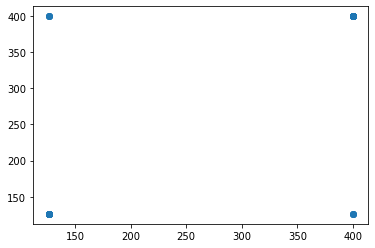

t+1 vs t-2


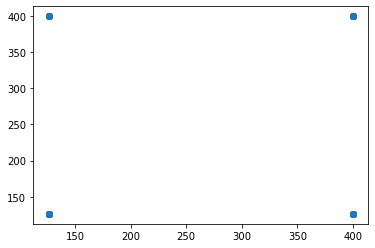

t+1 vs t-3


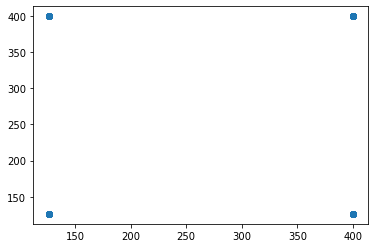

t+1 vs t-4


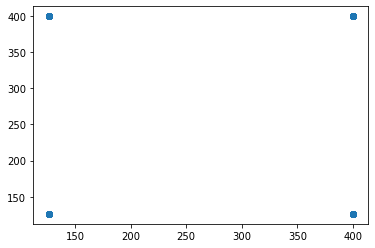

t+1 vs t-5


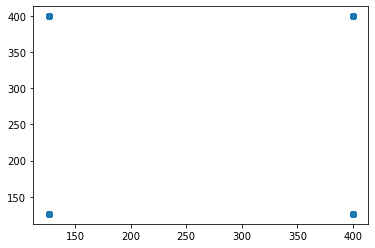

t+1 vs t-6


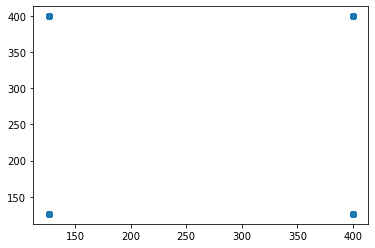

t+1 vs t-7


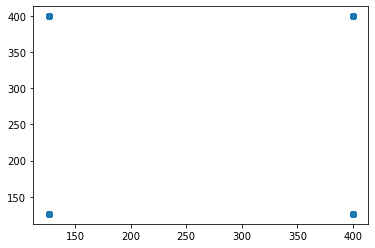

t+1 vs t-8


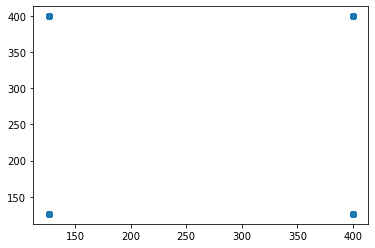

t+1 vs t-9


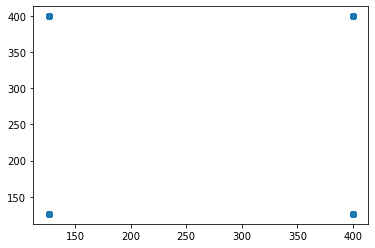

t+1 vs t-10


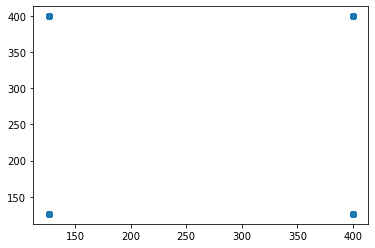

t+1 vs t-11


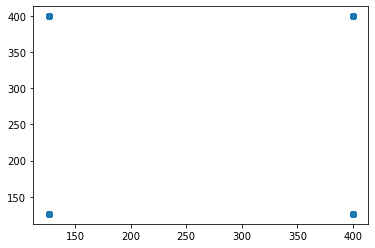

t+1 vs t-12


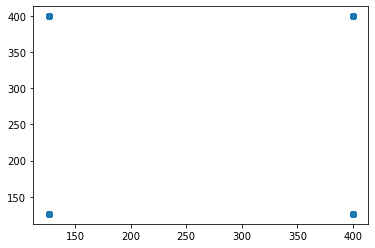

t+1 vs t-13


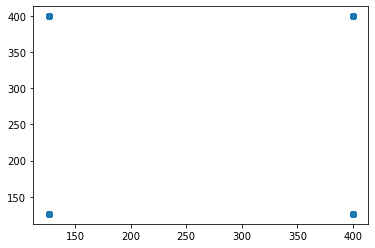

t+1 vs t-14


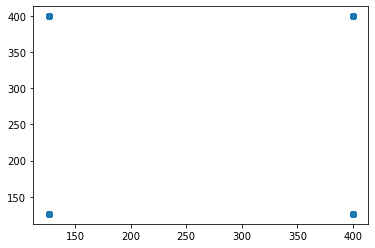

t+1 vs t-15


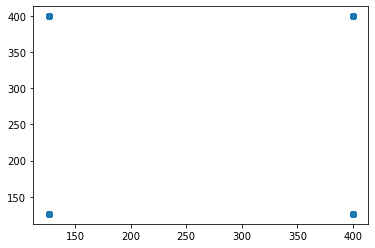

t+1 vs t-16


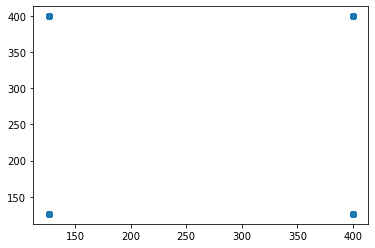

t+1 vs t-17


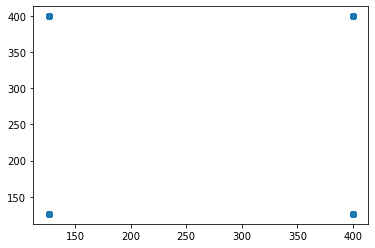

t+1 vs t-18


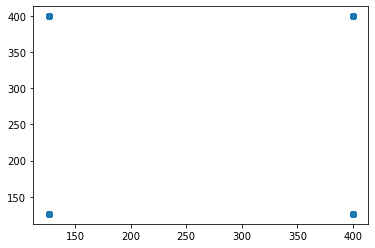

t+1 vs t-19


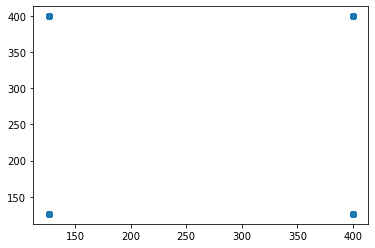

t+1 vs t-20


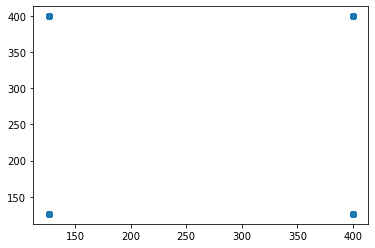

t+1 vs t-21


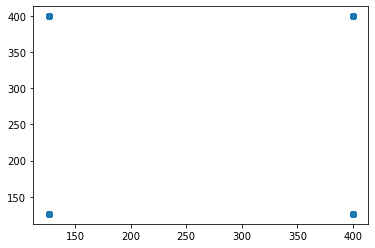

t+1 vs t-22


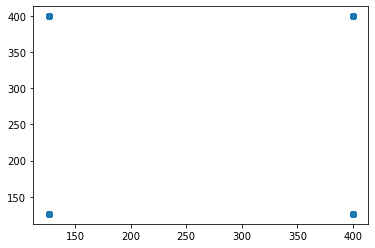

t+1 vs t-23


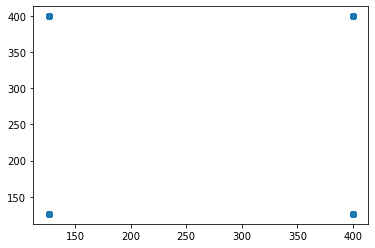

t+1 vs t-24


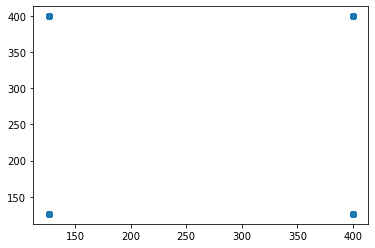

t+1 vs t-25


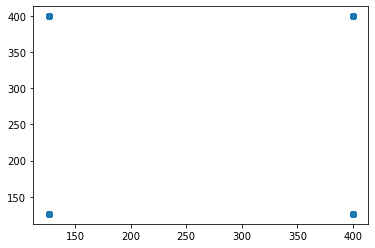

t+1 vs t-26


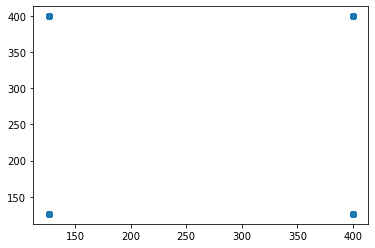

t+1 vs t-27


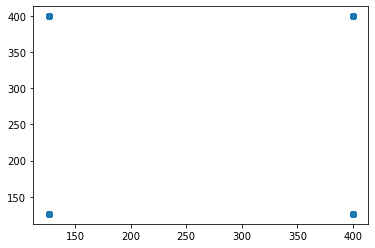

t+1 vs t-28


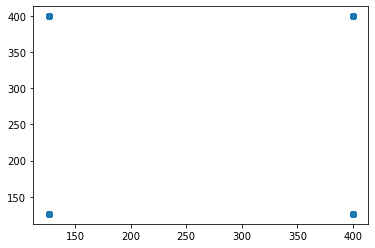

t+1 vs t-29


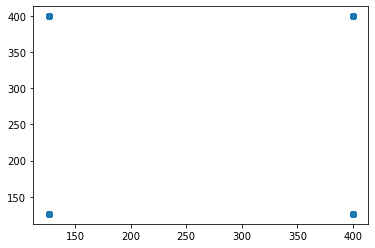

t+1 vs t-30


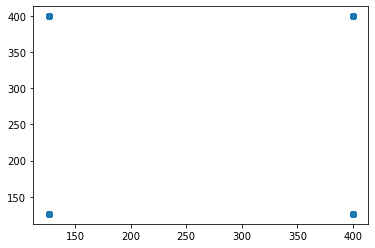

t+1 vs t-31


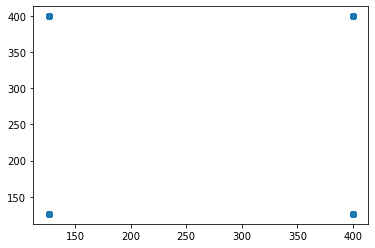

t+1 vs t-32


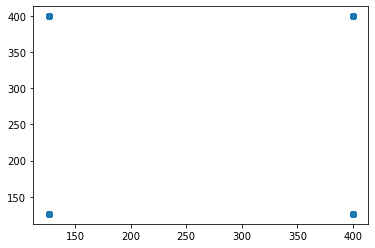

t+1 vs t-33


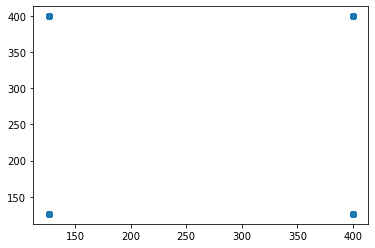

t+1 vs t-34


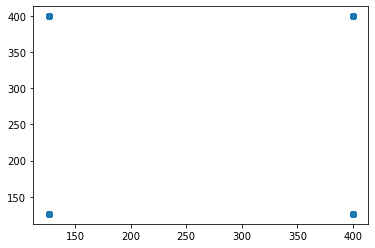

t+1 vs t-35


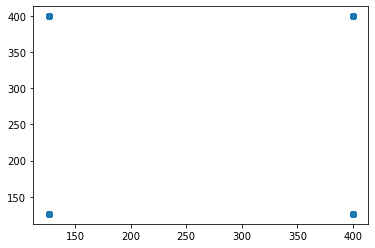

t+1 vs t-36


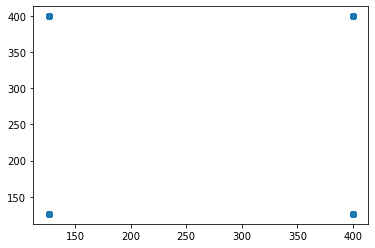

t+1 vs t-37


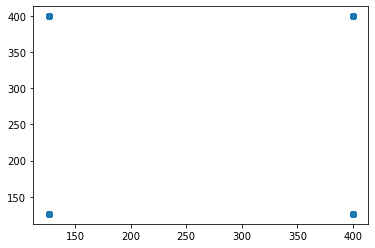

t+1 vs t-38


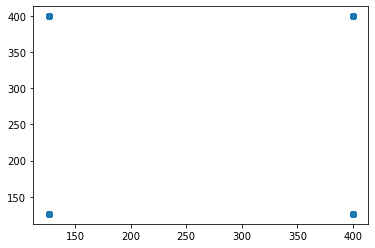

t+1 vs t-39


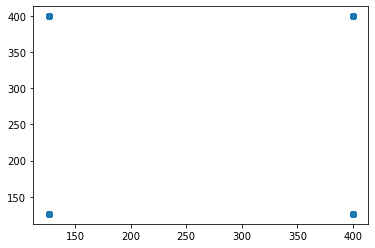

t+1 vs t-40


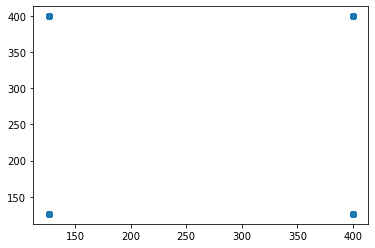

t+1 vs t-41


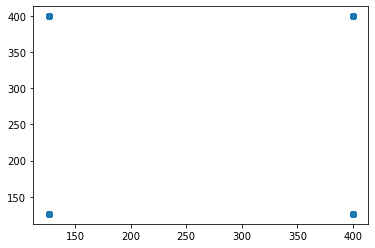

t+1 vs t-42


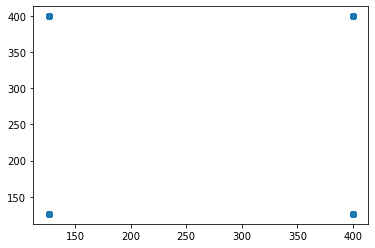

t+1 vs t-43


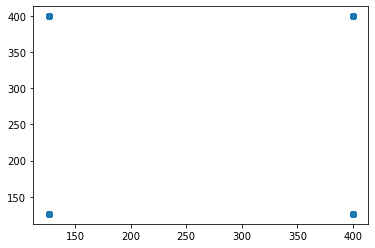

t+1 vs t-44


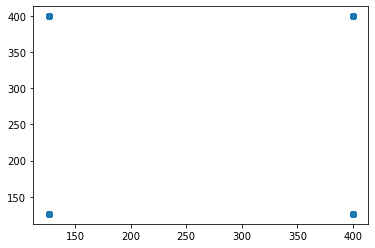

t+1 vs t-45


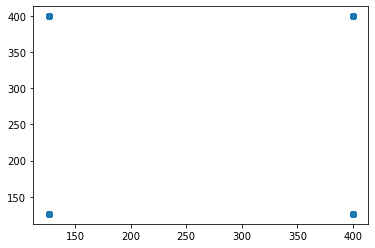

t+1 vs t-46


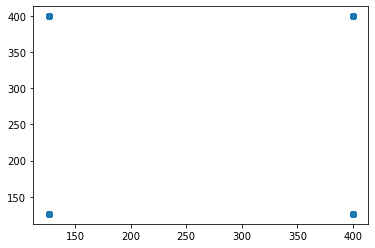

t+1 vs t-47


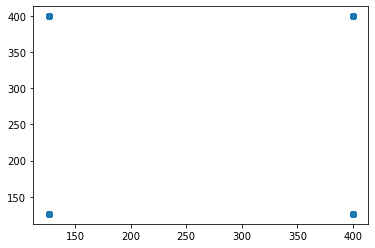

t+1 vs t-48


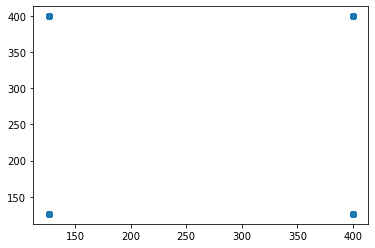

t+1 vs t-49


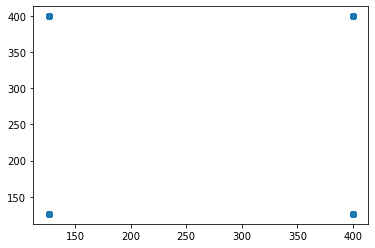

t+1 vs t-50


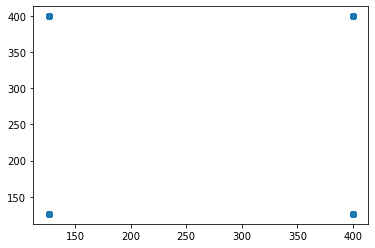

t+1 vs t-51


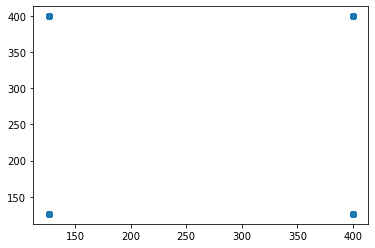

t+1 vs t-52


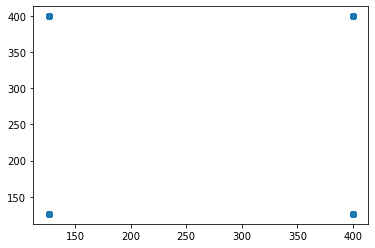

t+1 vs t-53


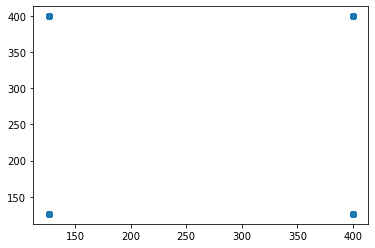

t+1 vs t-54


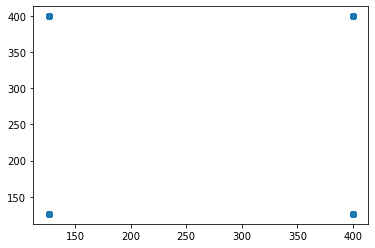

t+1 vs t-55


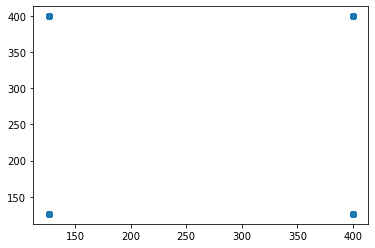

t+1 vs t-56


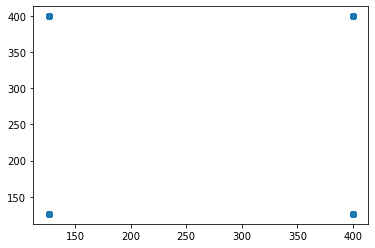

t+1 vs t-57


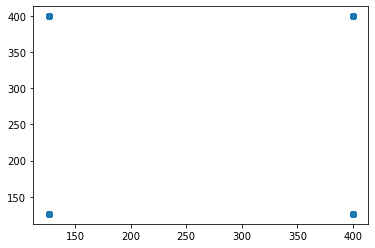

t+1 vs t-58


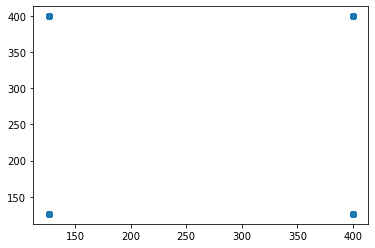

t+1 vs t-59


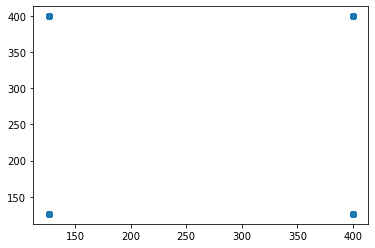

t+1 vs t-60


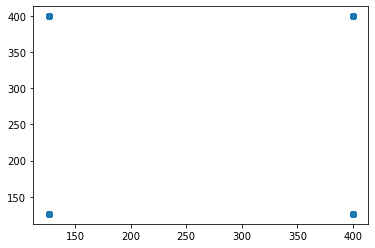

t+1 vs t-61


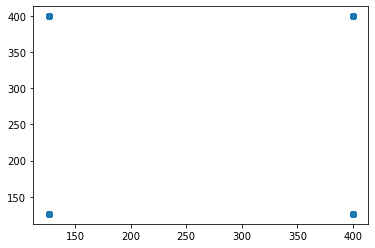

t+1 vs t-62


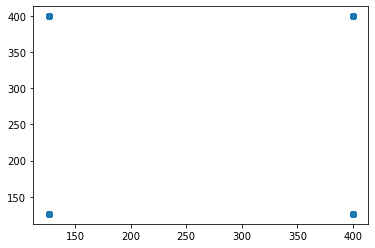

t+1 vs t-63


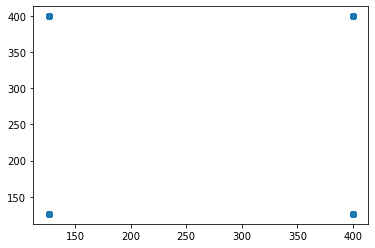

t+1 vs t-64


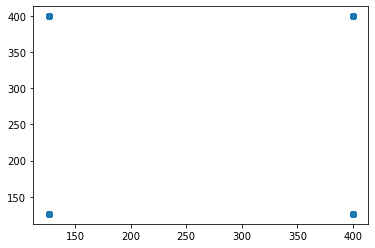

t+1 vs t-65


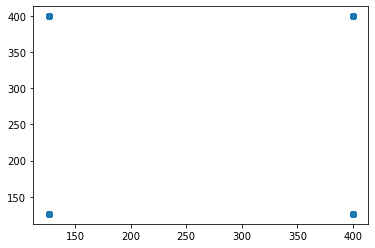

t+1 vs t-66


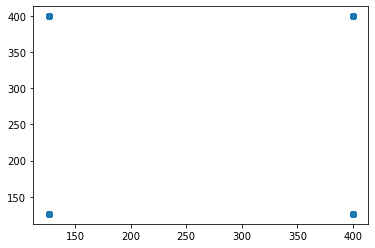

t+1 vs t-67


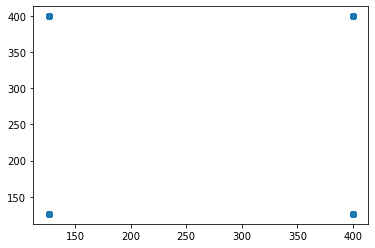

t+1 vs t-68


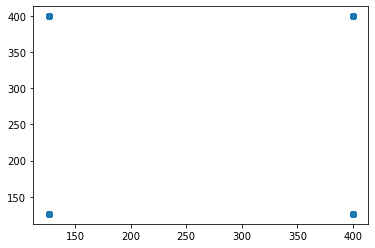

t+1 vs t-69


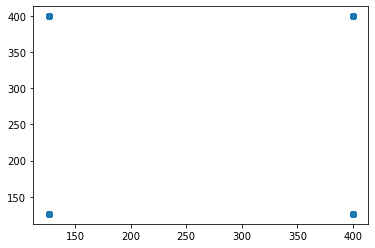

t+1 vs t-70


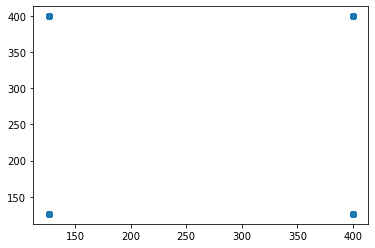

t+1 vs t-71


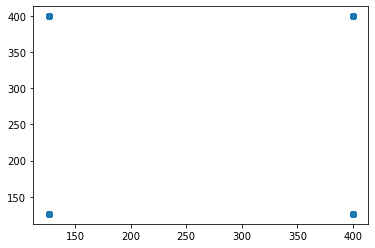

t+1 vs t-72


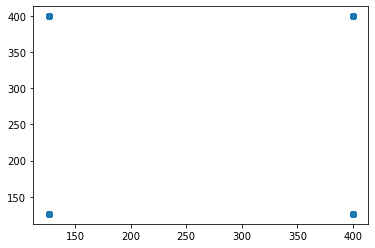

t+1 vs t-73


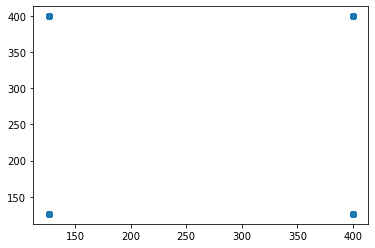

t+1 vs t-74


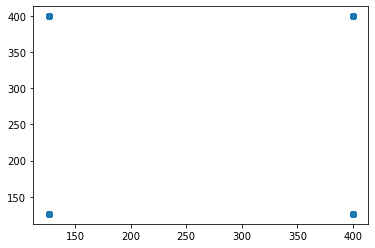

t+1 vs t-75


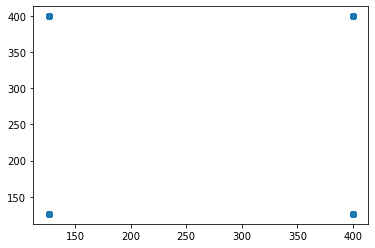

t+1 vs t-76


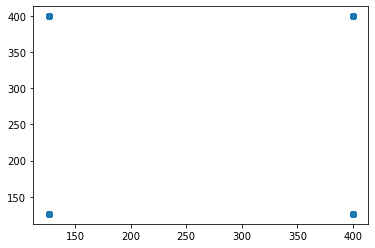

t+1 vs t-77


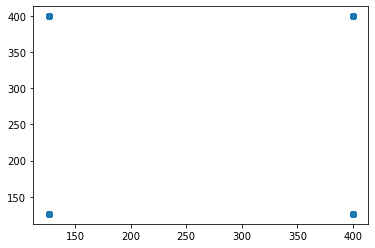

t+1 vs t-78


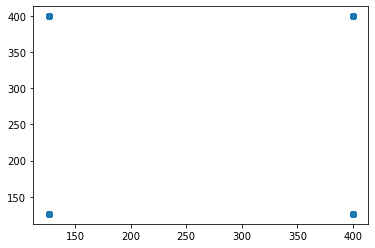

t+1 vs t-79


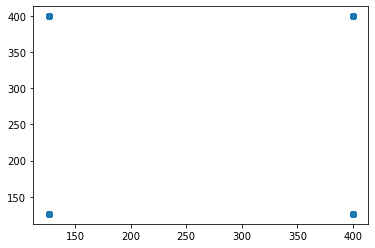

t+1 vs t-80


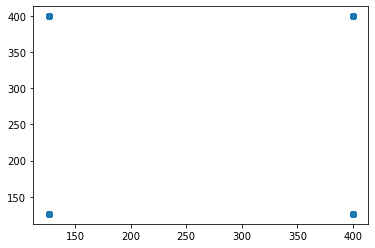

t+1 vs t-81


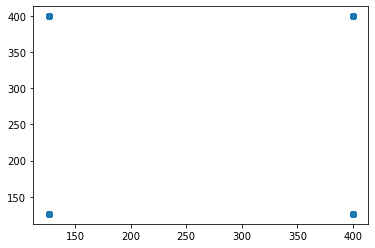

t+1 vs t-82


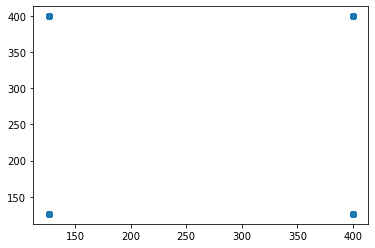

t+1 vs t-83


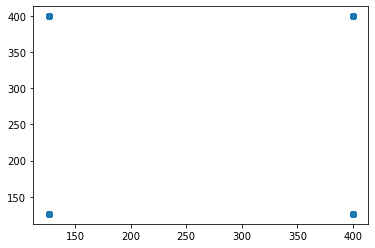

t+1 vs t-84


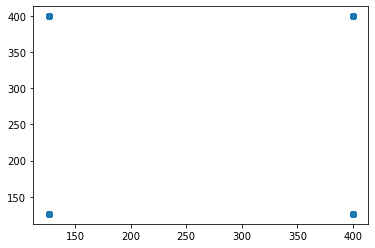

t+1 vs t-85


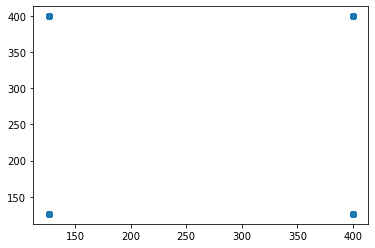

t+1 vs t-86


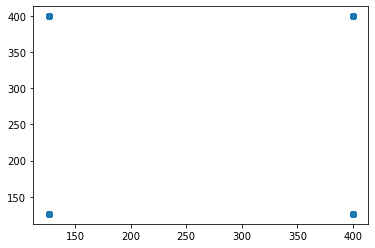

t+1 vs t-87


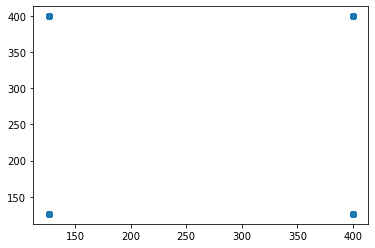

t+1 vs t-88


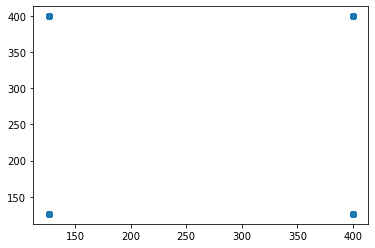

t+1 vs t-89


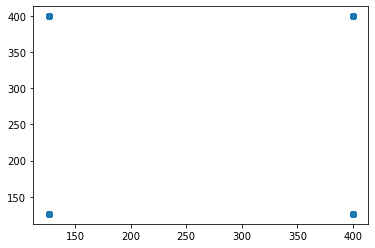

t+1 vs t-90


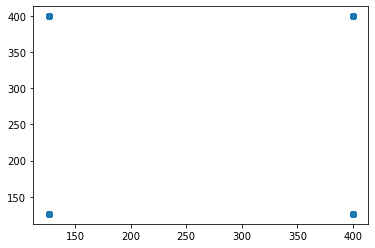

t+1 vs t-91


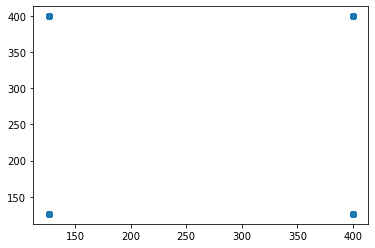

t+1 vs t-92


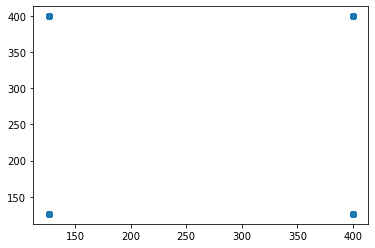

t+1 vs t-93


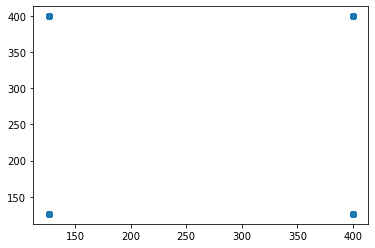

t+1 vs t-94


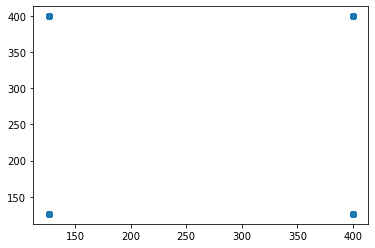

t+1 vs t-95


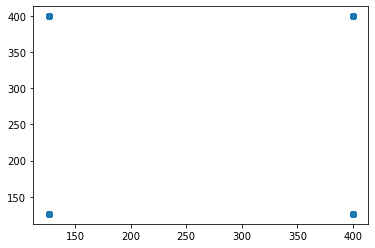

t+1 vs t-96


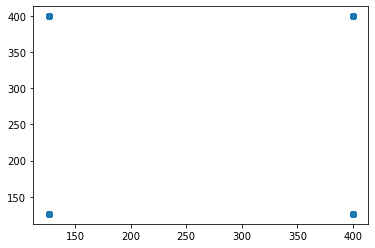

t+1 vs t-97


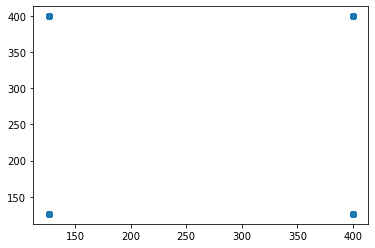

t+1 vs t-98


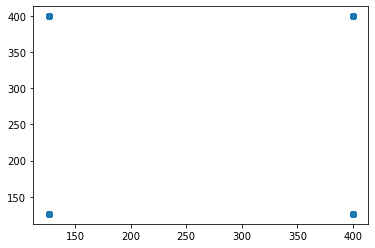

t+1 vs t-99


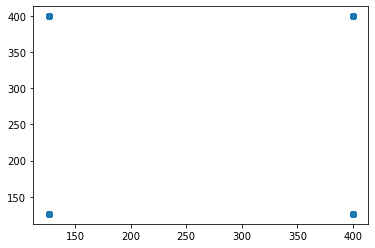

t+1 vs t-100


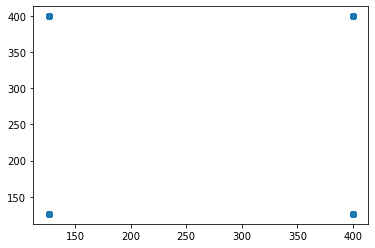

t+1 vs t-101


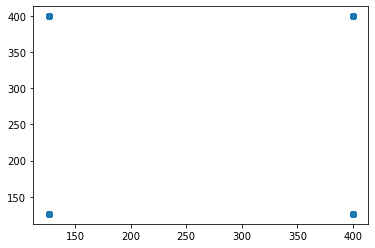

t+1 vs t-102


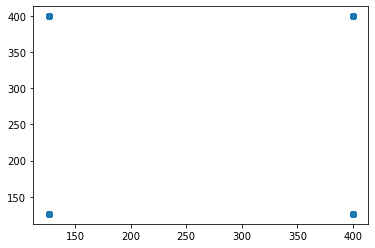

t+1 vs t-103


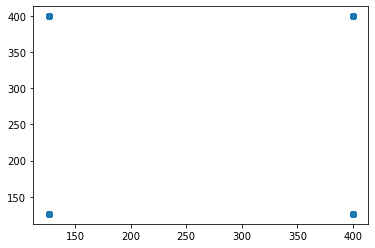

t+1 vs t-104


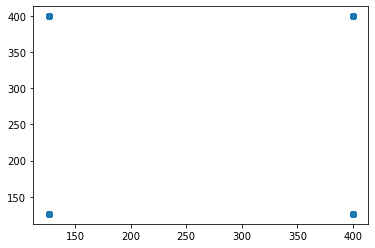

t+1 vs t-105


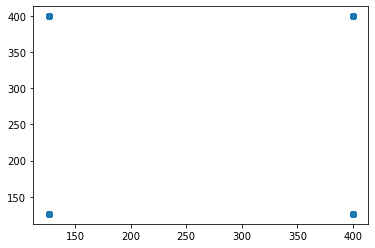

t+1 vs t-106


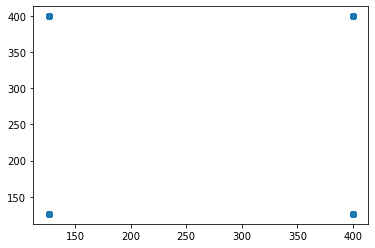

t+1 vs t-107


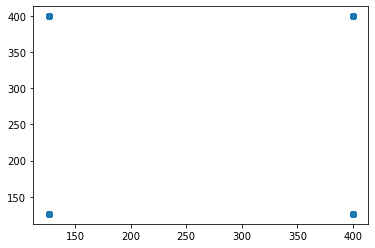

t+1 vs t-108


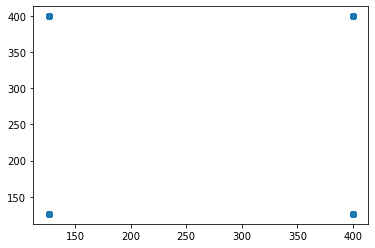

t+1 vs t-109


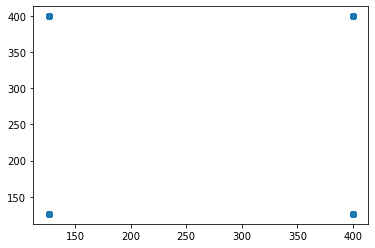

t+1 vs t-110


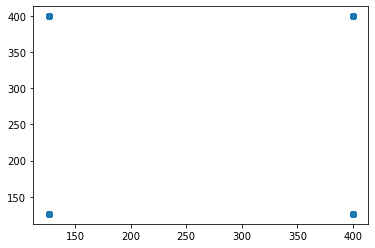

t+1 vs t-111


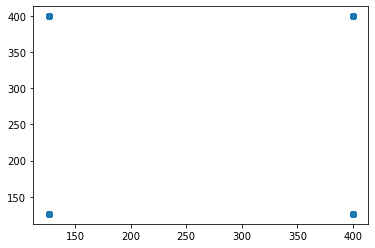

t+1 vs t-112


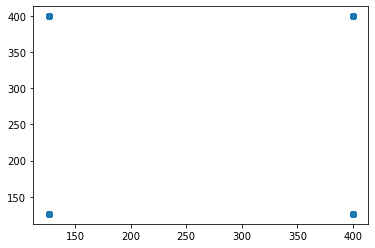

t+1 vs t-113


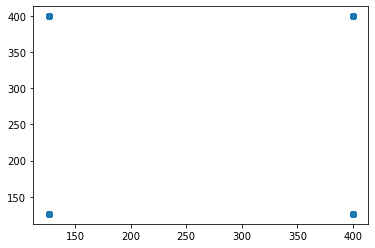

t+1 vs t-114


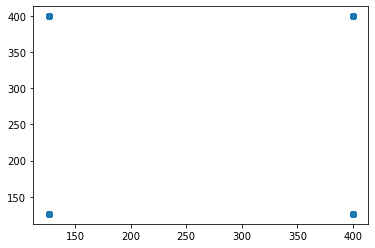

t+1 vs t-115


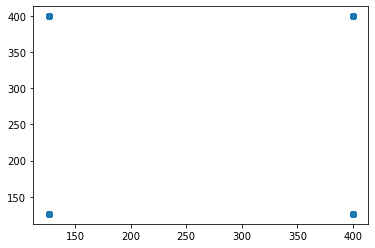

t+1 vs t-116


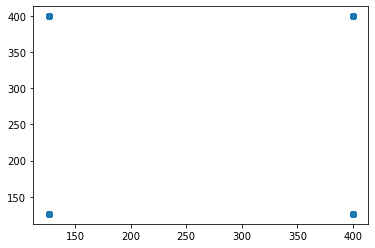

t+1 vs t-117


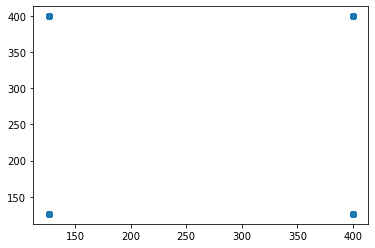

t+1 vs t-118


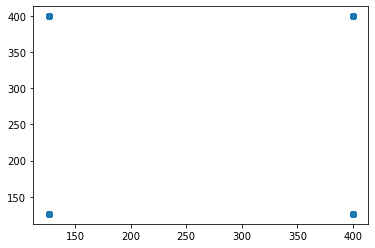

t+1 vs t-119


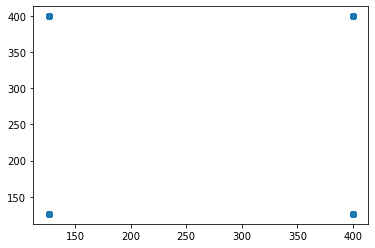

t+1 vs t-120


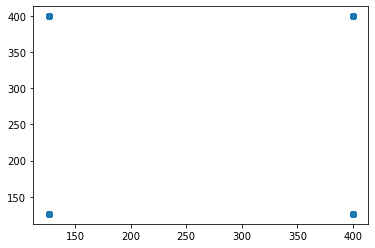

t+1 vs t-121


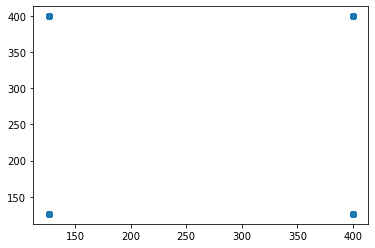

t+1 vs t-122


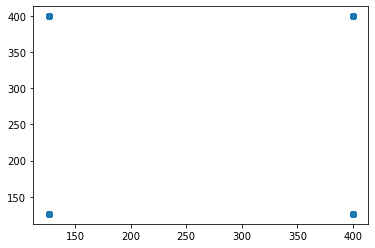

t+1 vs t-123


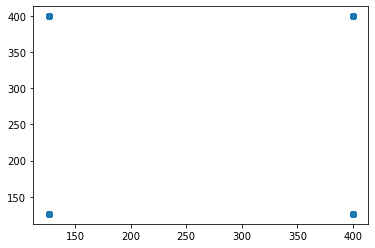

t+1 vs t-124


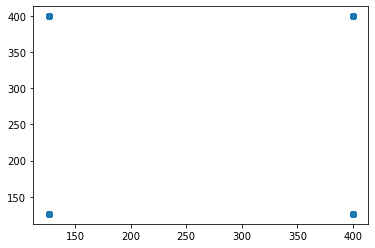

t+1 vs t-125


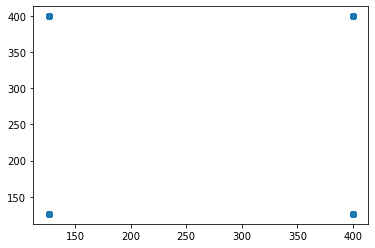

t+1 vs t-126


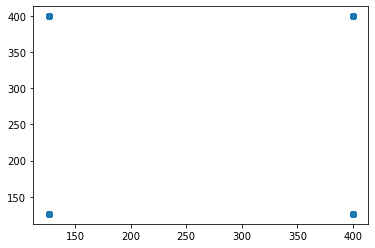

t+1 vs t-127


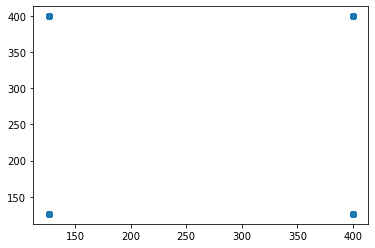

t+1 vs t-128


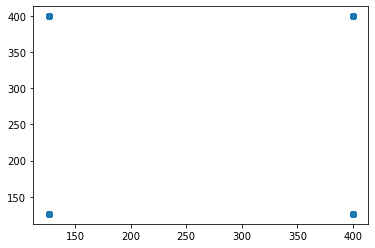

t+1 vs t-129


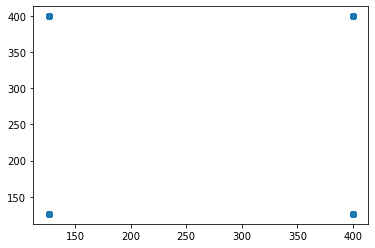

t+1 vs t-130


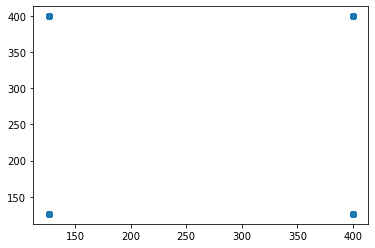

t+1 vs t-131


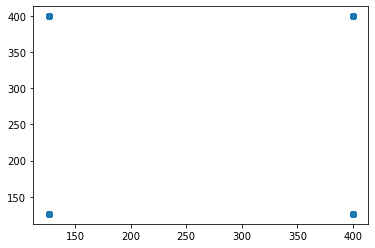

t+1 vs t-132


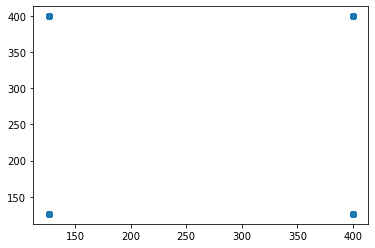

t+1 vs t-133


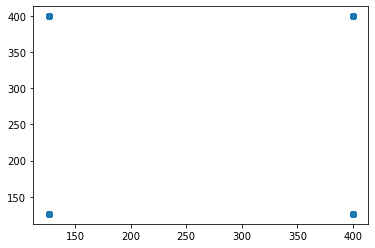

t+1 vs t-134


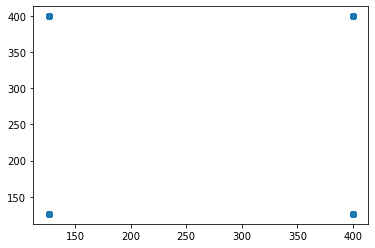

t+1 vs t-135


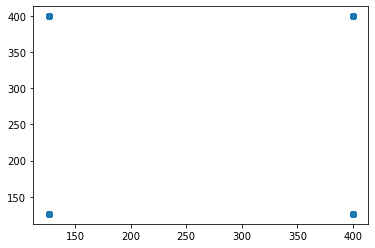

t+1 vs t-136


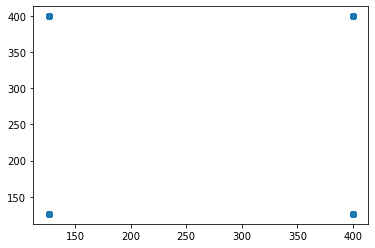

t+1 vs t-137


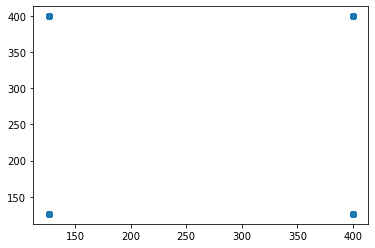

t+1 vs t-138


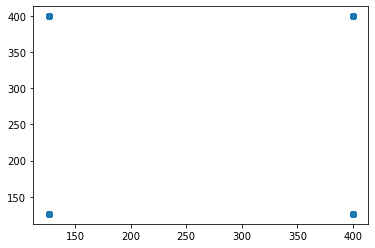

t+1 vs t-139


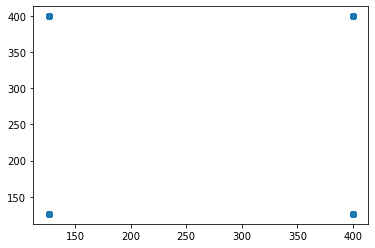

t+1 vs t-140


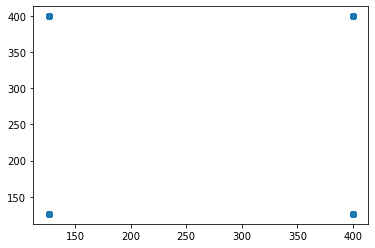

t+1 vs t-141


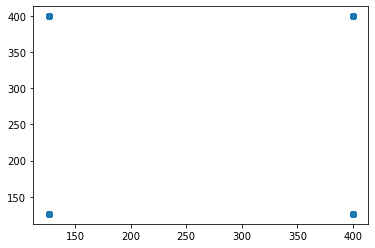

t+1 vs t-142


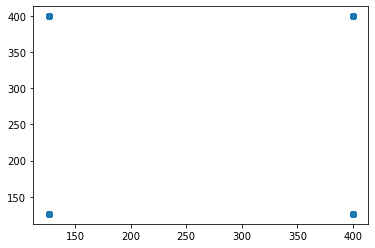

t+1 vs t-143


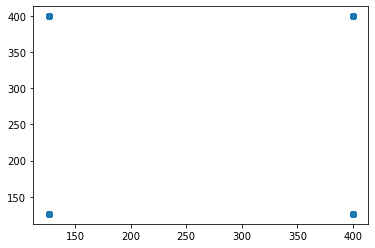

t+1 vs t-144


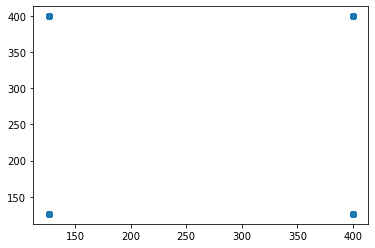

t+1 vs t-145


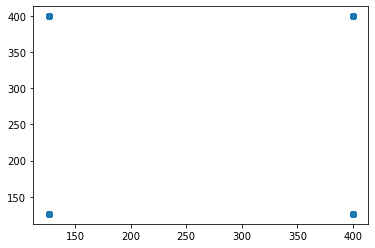

t+1 vs t-146


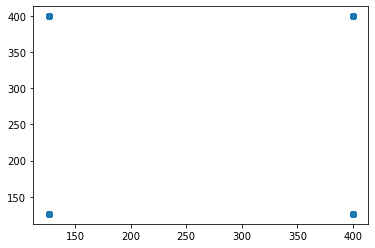

t+1 vs t-147


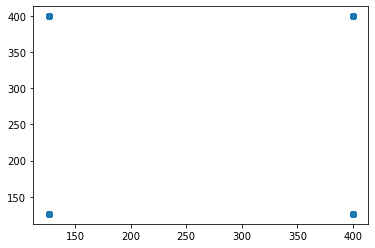

t+1 vs t-148


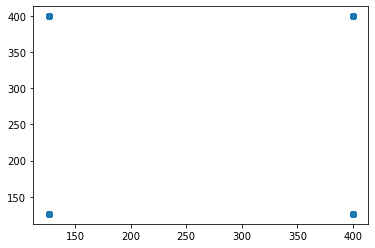

t+1 vs t-149


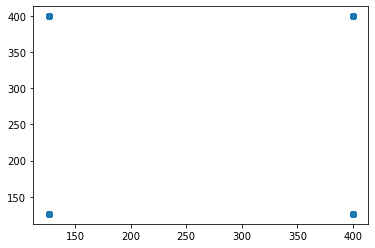

t+1 vs t-150


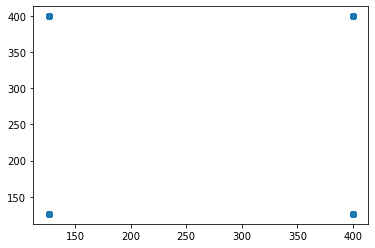

t+1 vs t-151


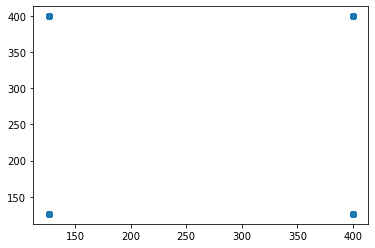

t+1 vs t-152


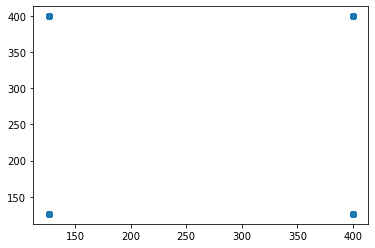

t+1 vs t-153


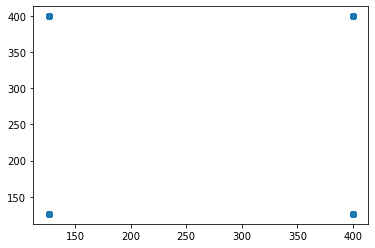

t+1 vs t-154


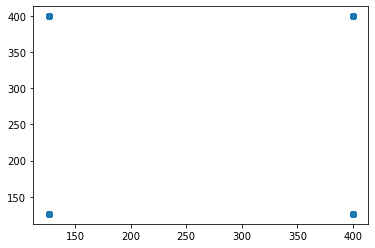

t+1 vs t-155


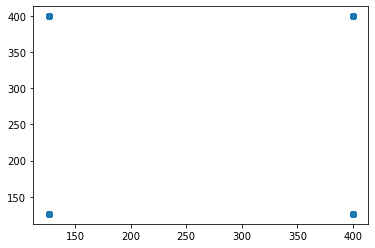

t+1 vs t-156


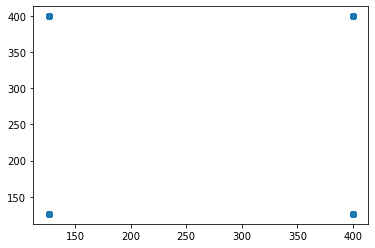

t+1 vs t-157


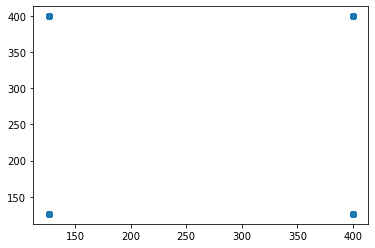

t+1 vs t-158


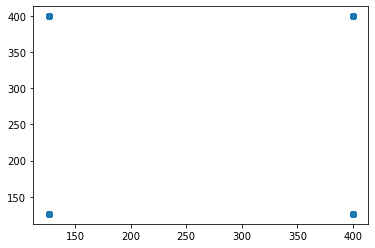

t+1 vs t-159


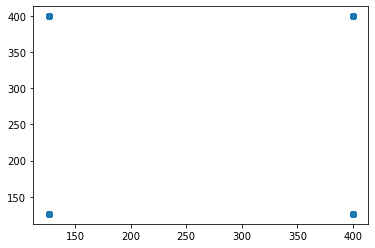

t+1 vs t-160


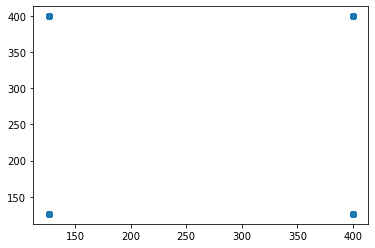

t+1 vs t-161


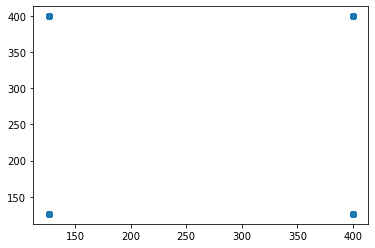

t+1 vs t-162


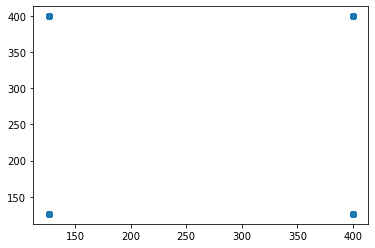

t+1 vs t-163


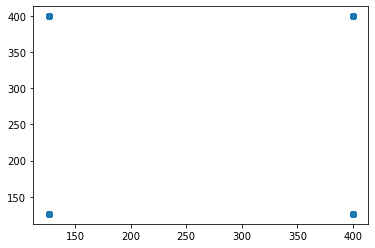

t+1 vs t-164


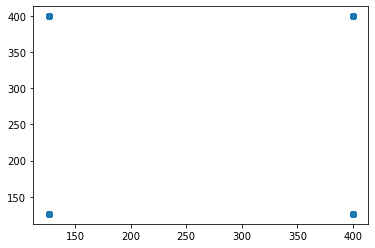

t+1 vs t-165


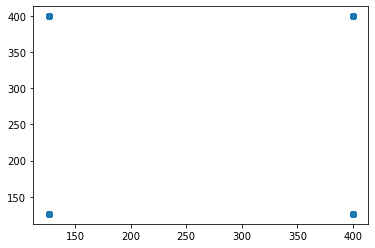

t+1 vs t-166


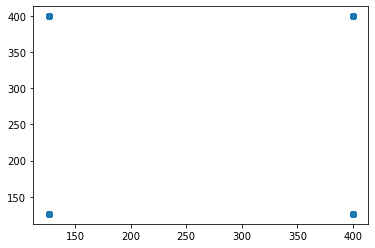

t+1 vs t-167


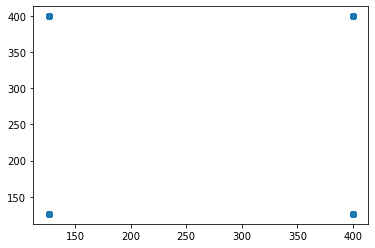

t+1 vs t-168


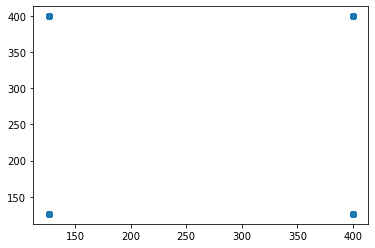

t+1 vs t-169


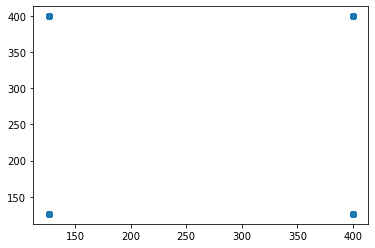

t+1 vs t-170


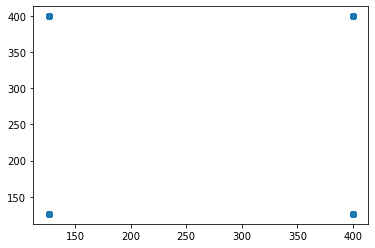

t+1 vs t-171


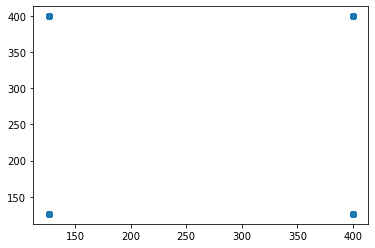

t+1 vs t-172


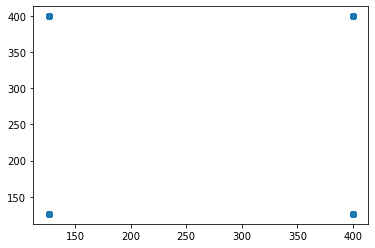

t+1 vs t-173


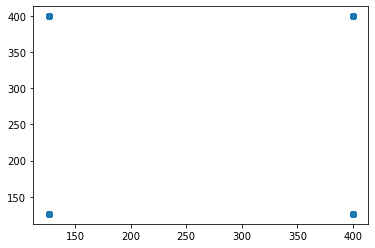

t+1 vs t-174


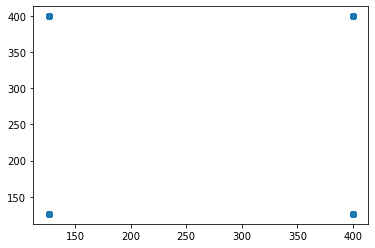

t+1 vs t-175


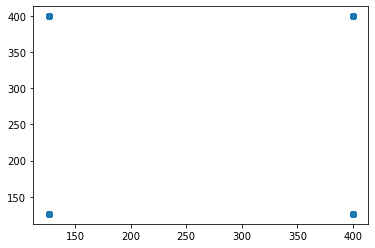

t+1 vs t-176


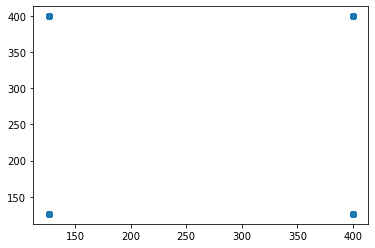

t+1 vs t-177


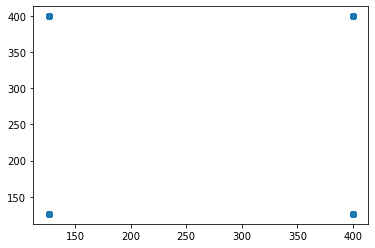

t+1 vs t-178


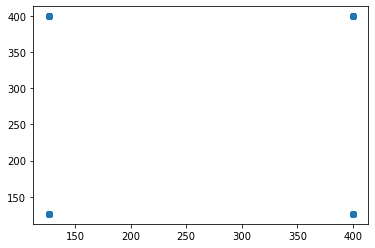

t+1 vs t-179


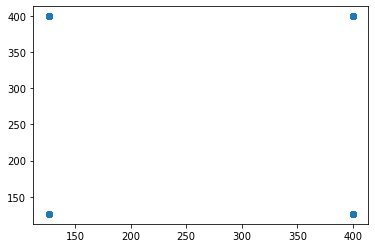

t+1 vs t-180


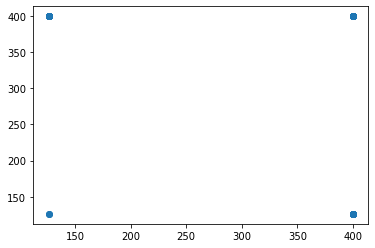

t+1 vs t-181


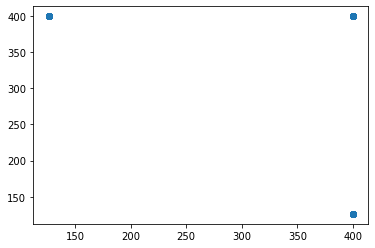

t+1 vs t-182


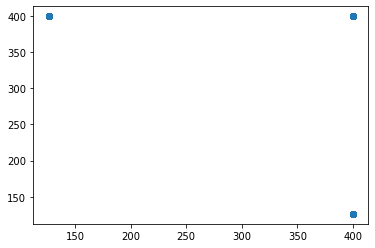

t+1 vs t-183


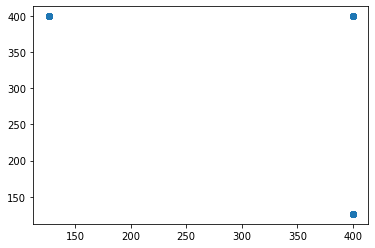

t+1 vs t-184


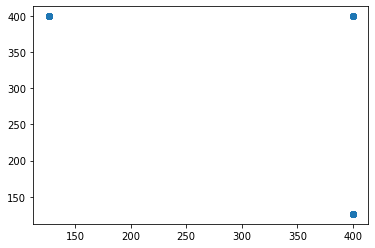

t+1 vs t-185


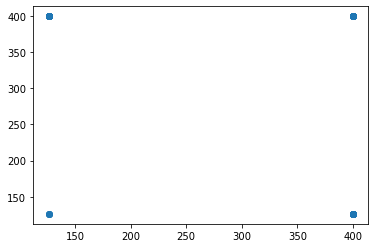

t+1 vs t-186


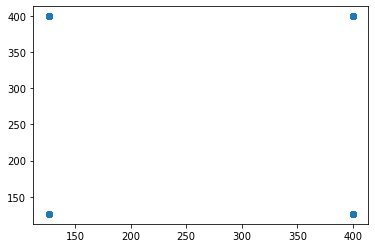

t+1 vs t-187


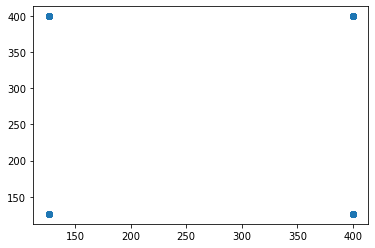

t+1 vs t-188


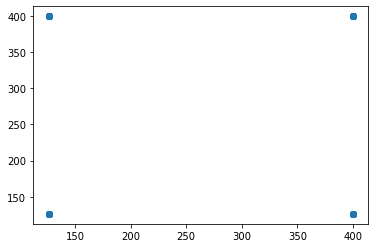

t+1 vs t-189


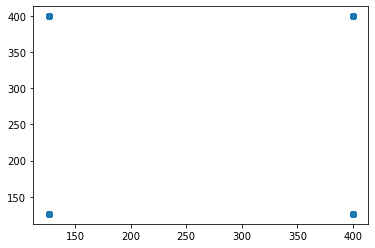

t+1 vs t-190


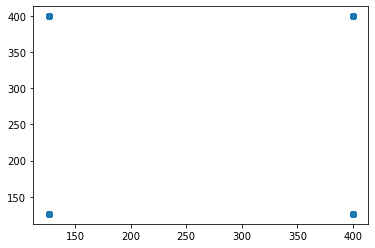

t+1 vs t-191


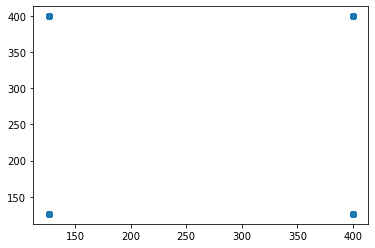

t+1 vs t-192


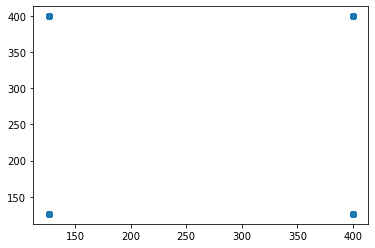

t+1 vs t-193


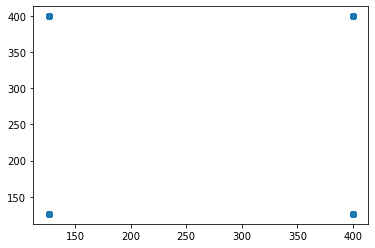

t+1 vs t-194


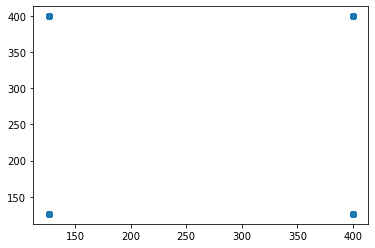

t+1 vs t-195


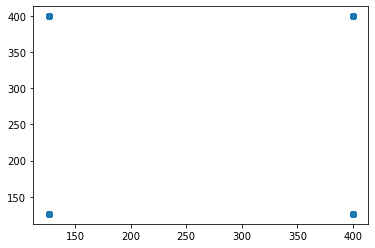

t+1 vs t-196


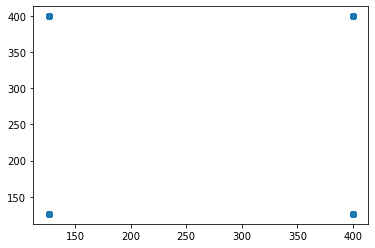

t+1 vs t-197


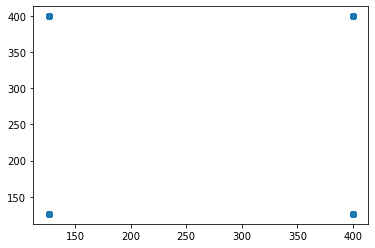

t+1 vs t-198


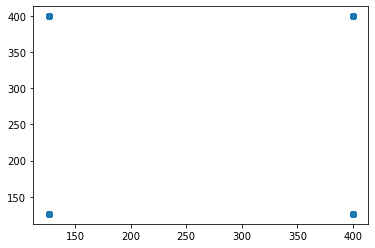

t+1 vs t-199


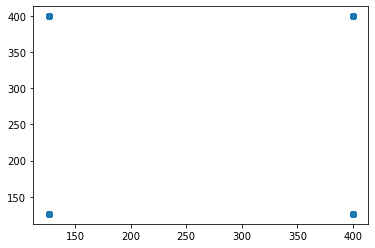

t+1 vs t-200


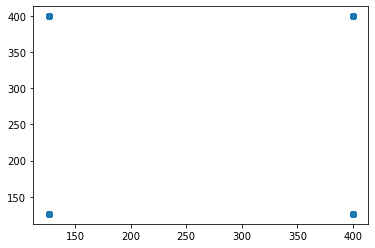

t+1 vs t-201


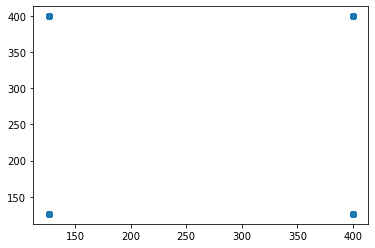

t+1 vs t-202


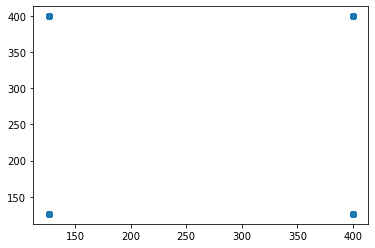

t+1 vs t-203


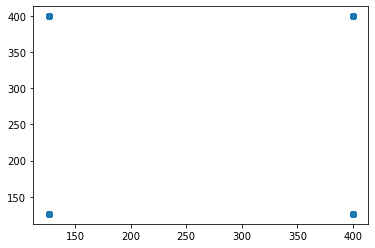

t+1 vs t-204


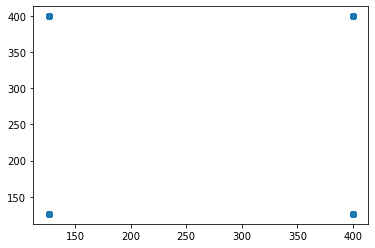

t+1 vs t-205


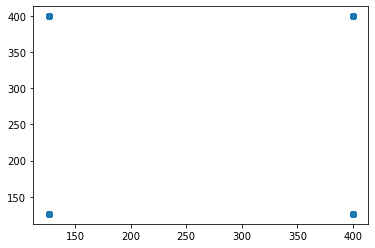

t+1 vs t-206


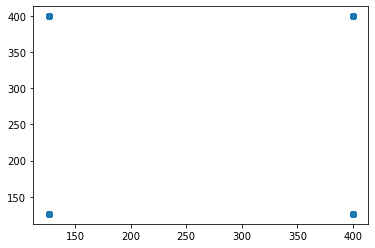

t+1 vs t-207


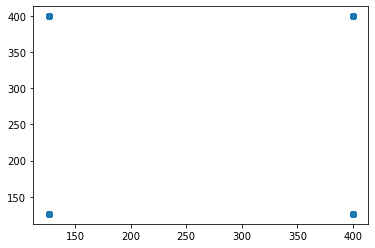

t+1 vs t-208


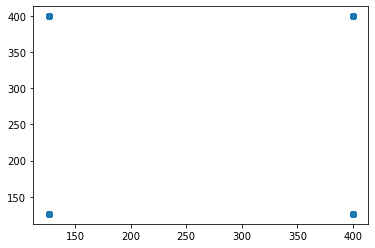

t+1 vs t-209


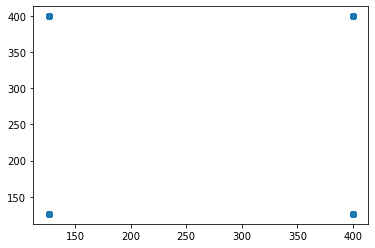

t+1 vs t-210


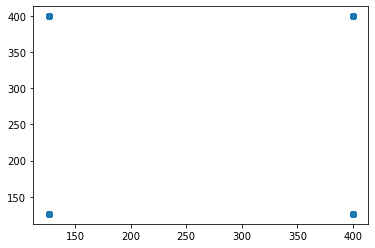

t+1 vs t-211


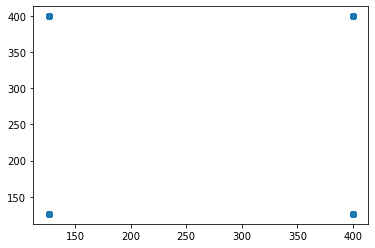

t+1 vs t-212


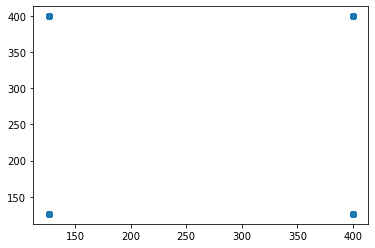

t+1 vs t-213


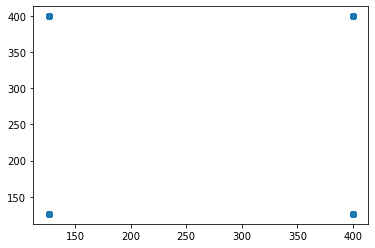

t+1 vs t-214


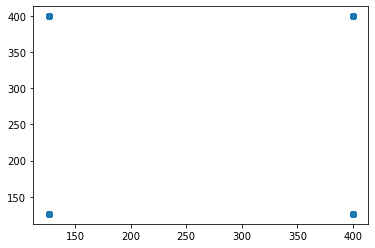

t+1 vs t-215


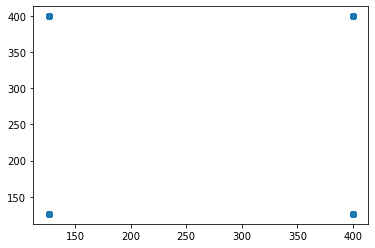

t+1 vs t-216


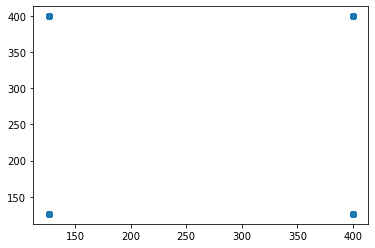

t+1 vs t-217


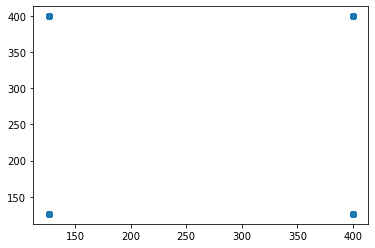

t+1 vs t-218


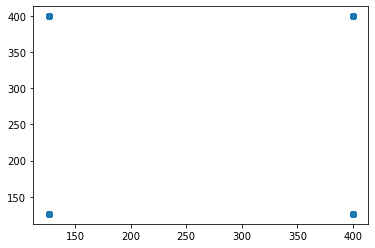

t+1 vs t-219


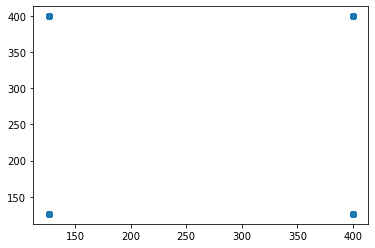

t+1 vs t-220


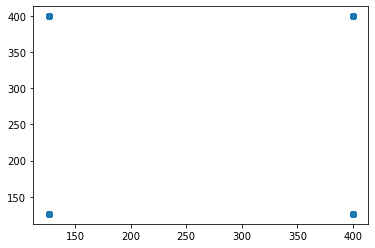

t+1 vs t-221


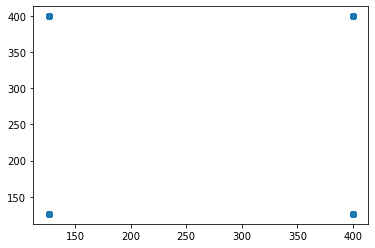

t+1 vs t-222


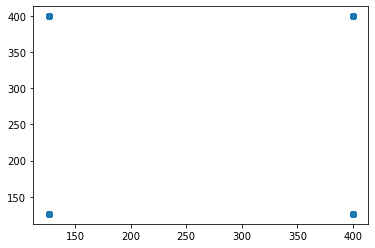

t+1 vs t-223


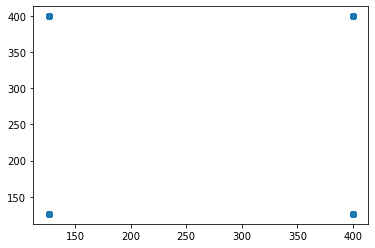

t+1 vs t-224


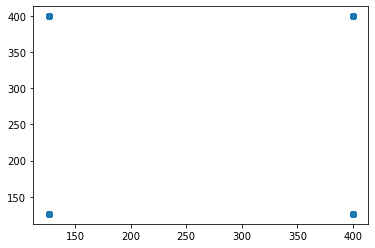

t+1 vs t-225


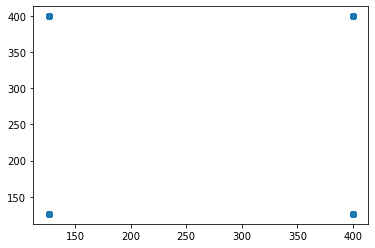

t+1 vs t-226


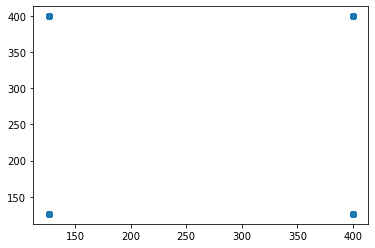

t+1 vs t-227


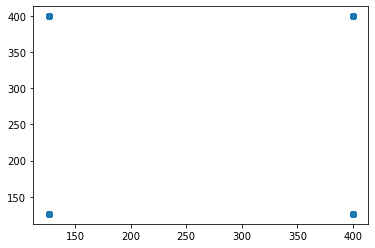

t+1 vs t-228


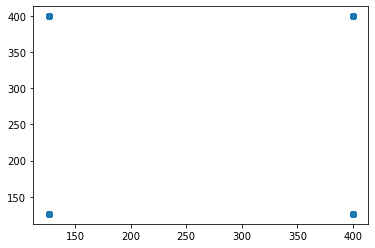

t+1 vs t-229


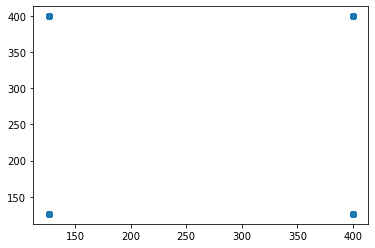

t+1 vs t-230


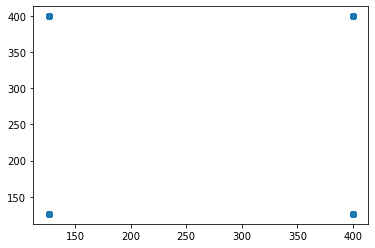

t+1 vs t-231


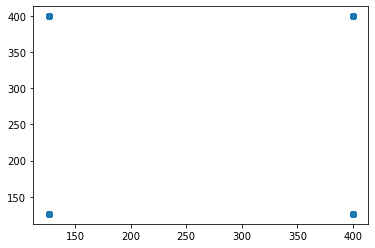

t+1 vs t-232


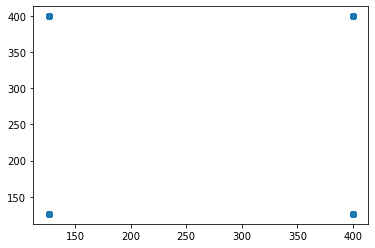

t+1 vs t-233


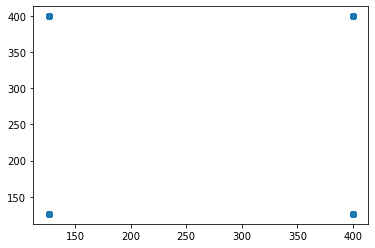

t+1 vs t-234


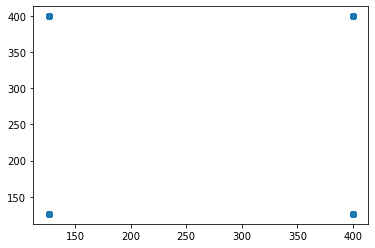

t+1 vs t-235


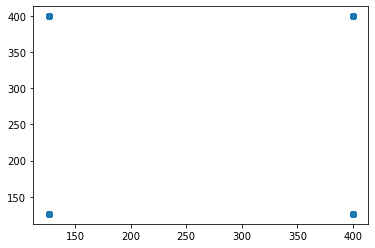

t+1 vs t-236


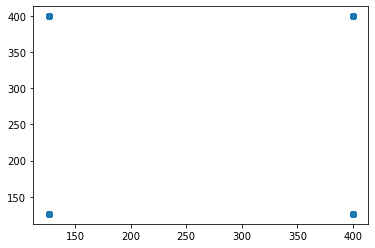

t+1 vs t-237


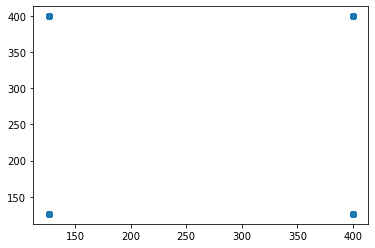

t+1 vs t-238


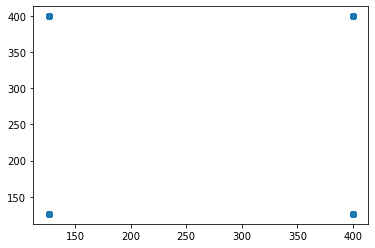

t+1 vs t-239


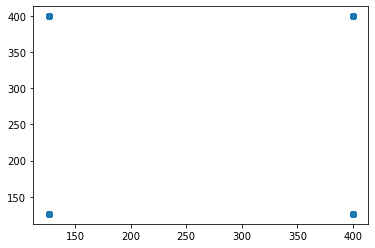

t+1 vs t-240


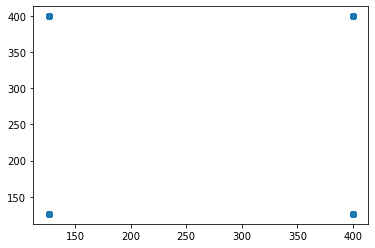

t+1 vs t-241


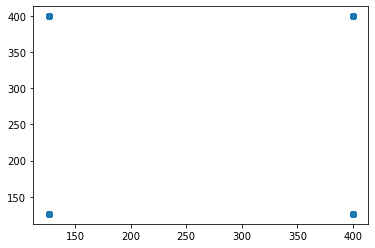

t+1 vs t-242


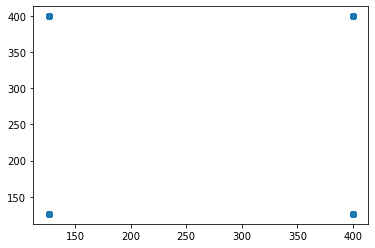

t+1 vs t-243


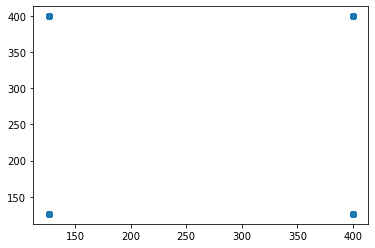

t+1 vs t-244


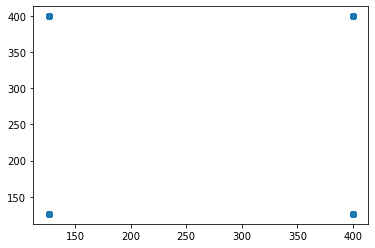

t+1 vs t-245


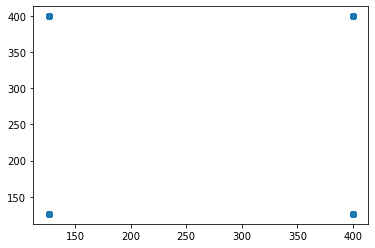

t+1 vs t-246


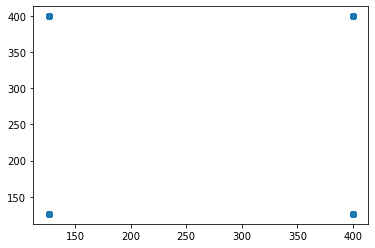

t+1 vs t-247


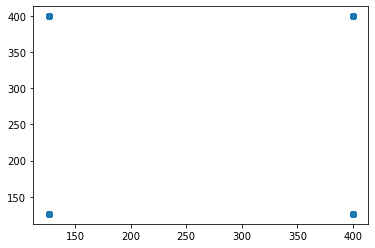

t+1 vs t-248


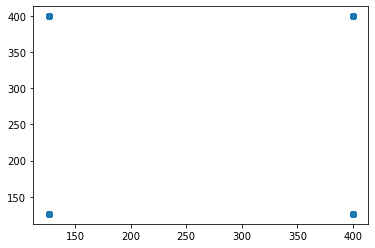

t+1 vs t-249


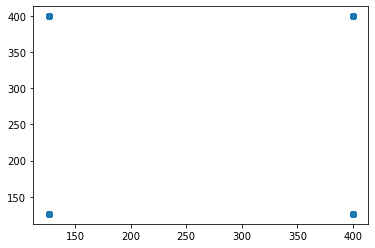

t+1 vs t-250


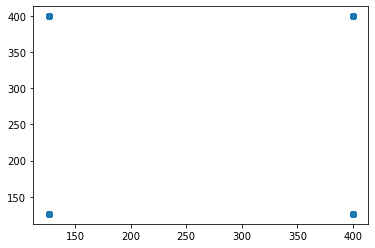

t+1 vs t-251


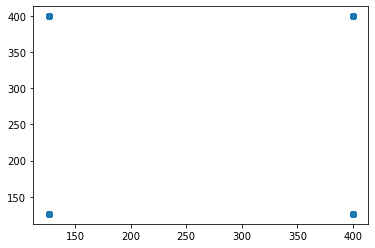

t+1 vs t-252


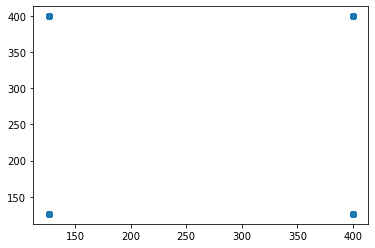

t+1 vs t-253


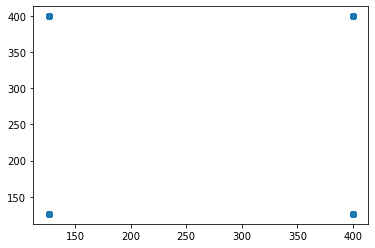

t+1 vs t-254


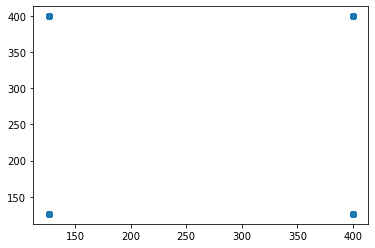

t+1 vs t-255


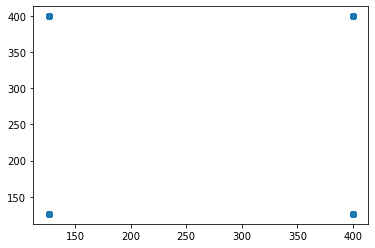

t+1 vs t-256


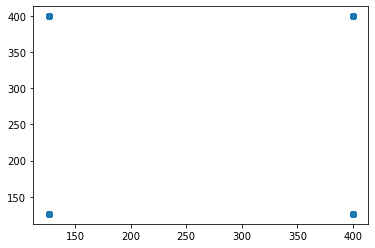

t+1 vs t-257


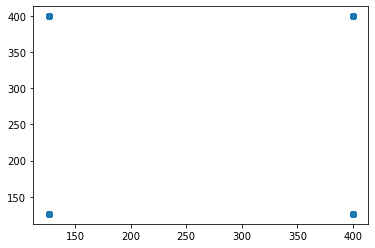

t+1 vs t-258


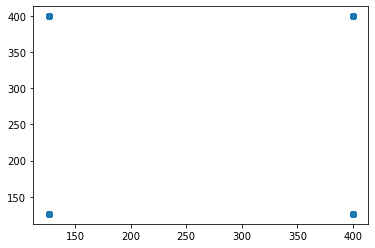

t+1 vs t-259


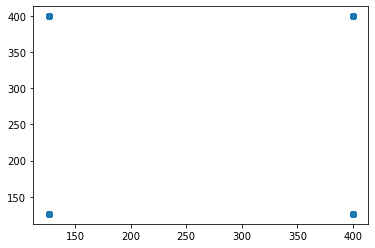

t+1 vs t-260


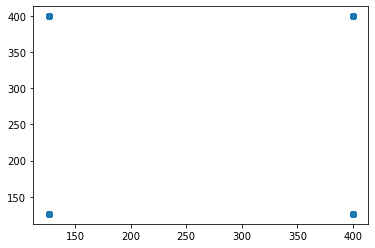

t+1 vs t-261


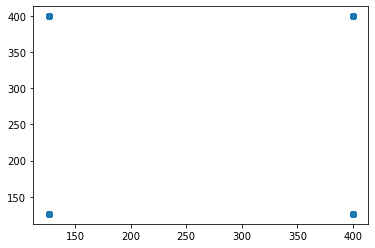

t+1 vs t-262


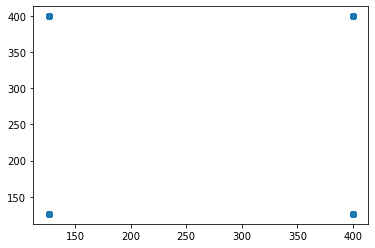

t+1 vs t-263


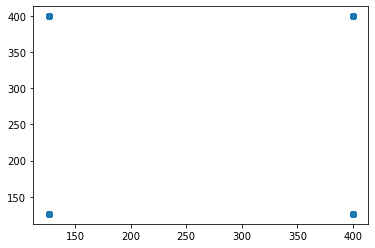

t+1 vs t-264


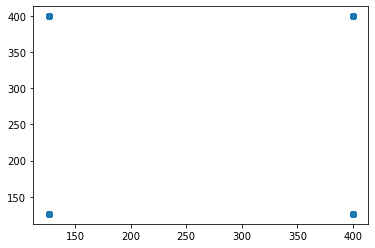

t+1 vs t-265


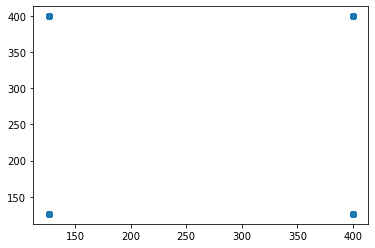

t+1 vs t-266


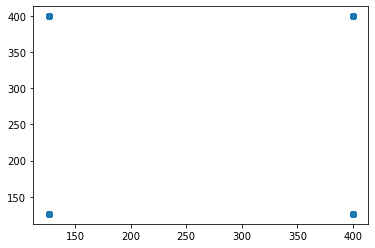

t+1 vs t-267


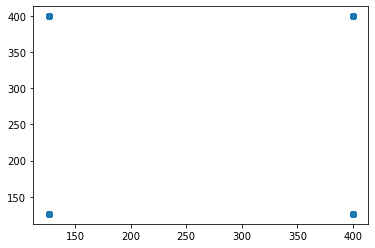

t+1 vs t-268


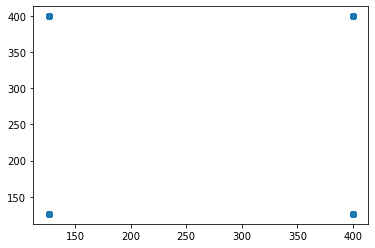

t+1 vs t-269


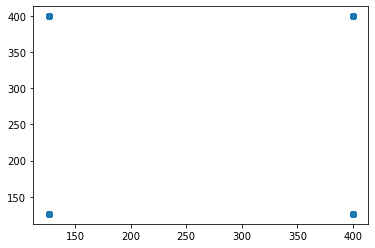

t+1 vs t-270


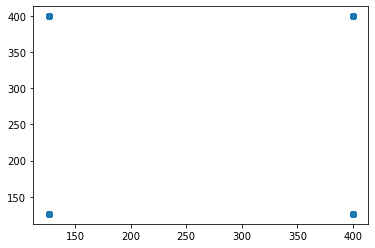

t+1 vs t-271


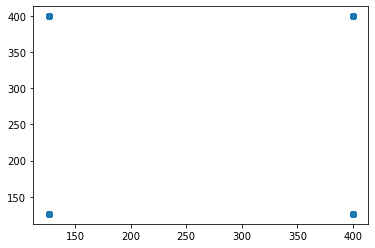

t+1 vs t-272


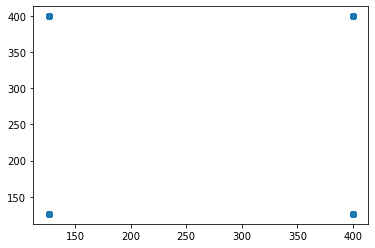

t+1 vs t-273


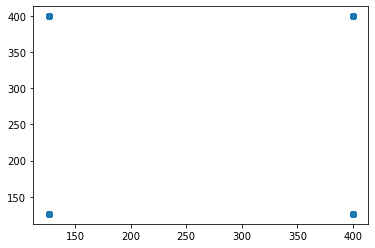

t+1 vs t-274


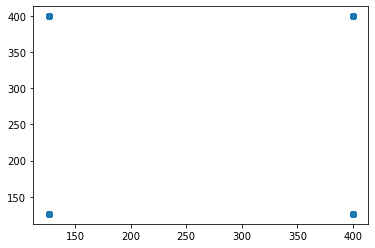

t+1 vs t-275


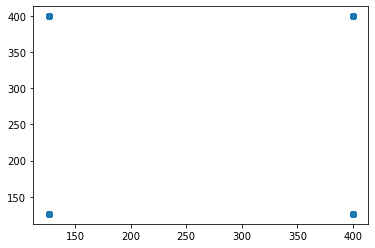

t+1 vs t-276


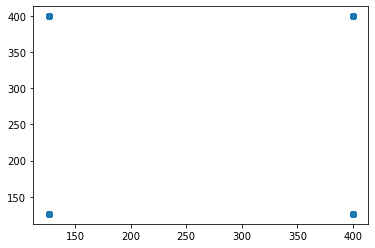

t+1 vs t-277


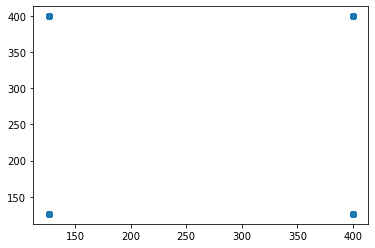

t+1 vs t-278


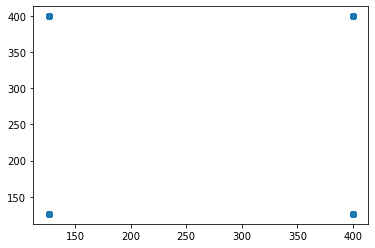

t+1 vs t-279


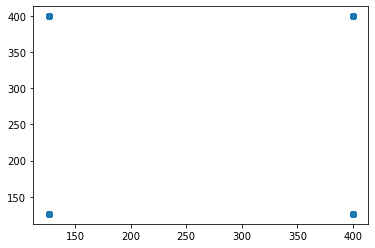

t+1 vs t-280


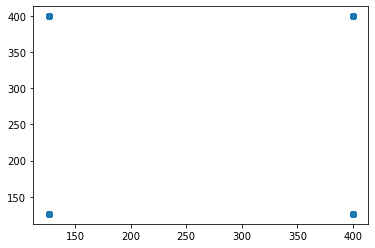

t+1 vs t-281


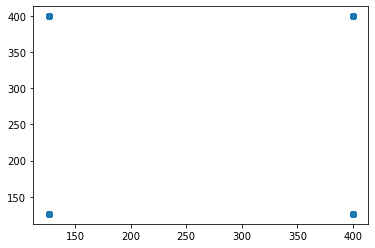

t+1 vs t-282


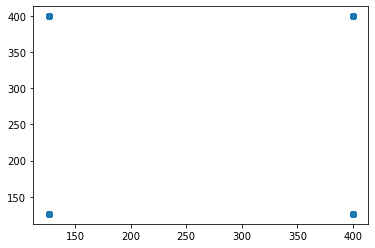

t+1 vs t-283


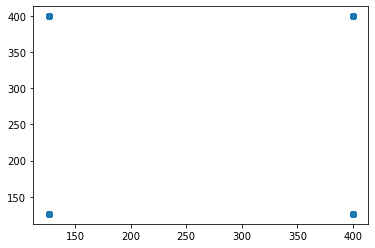

t+1 vs t-284


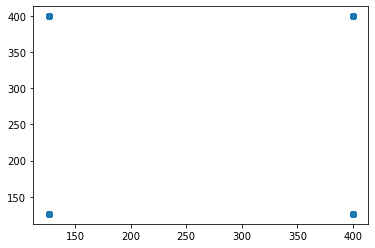

t+1 vs t-285


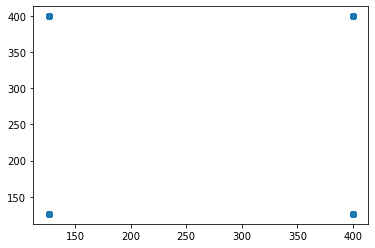

t+1 vs t-286


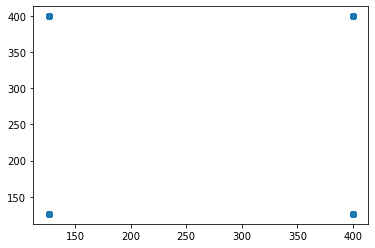

t+1 vs t-287


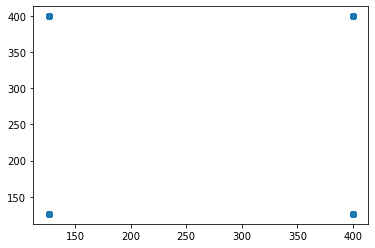

t+1 vs t-288


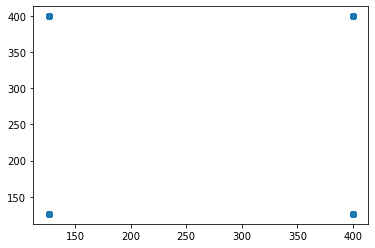

t+1 vs t-289


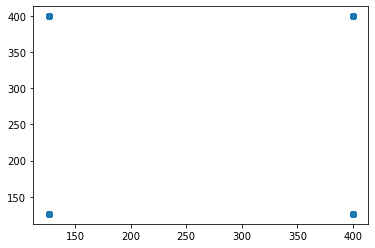

t+1 vs t-290


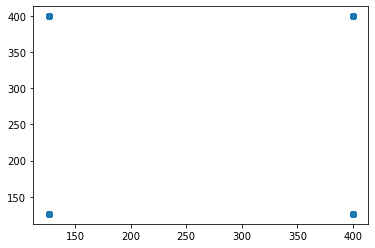

t+1 vs t-291


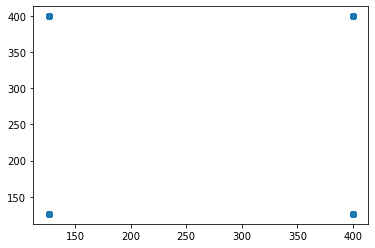

t+1 vs t-292


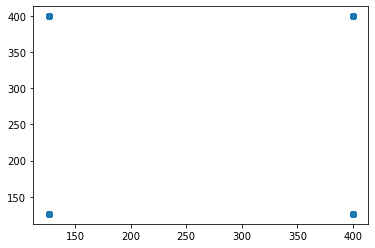

t+1 vs t-293


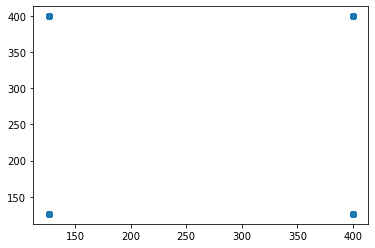

t+1 vs t-294


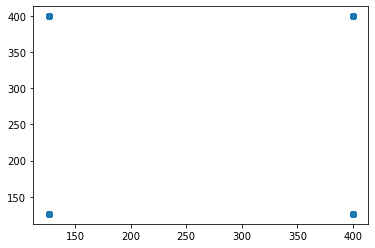

t+1 vs t-295


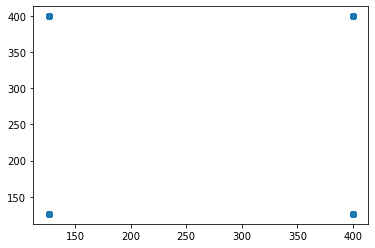

t+1 vs t-296


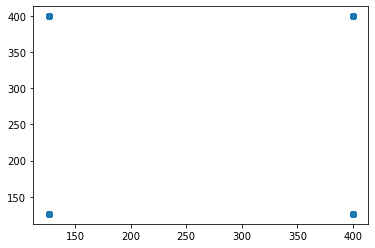

t+1 vs t-297


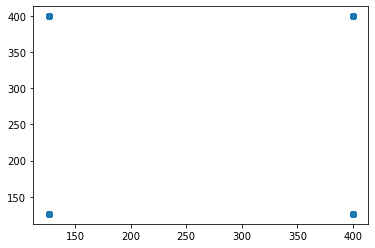

t+1 vs t-298


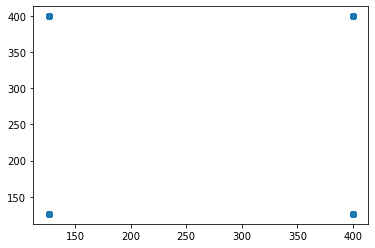

t+1 vs t-299


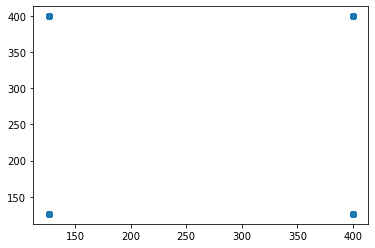

t+1 vs t-300


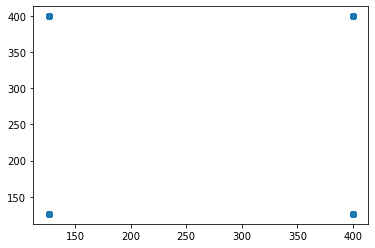

t+1 vs t-301


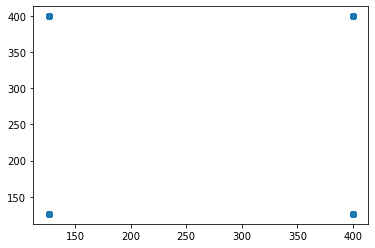

t+1 vs t-302


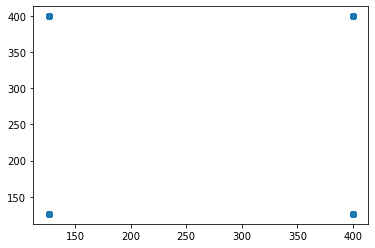

t+1 vs t-303


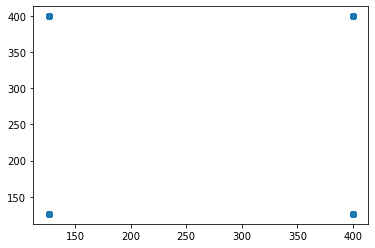

t+1 vs t-304


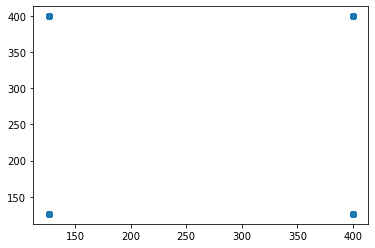

t+1 vs t-305


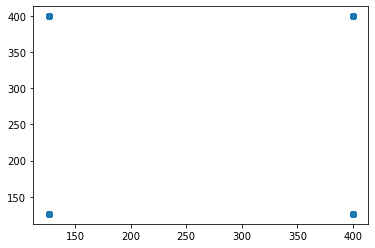

t+1 vs t-306


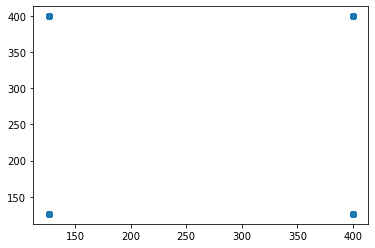

t+1 vs t-307


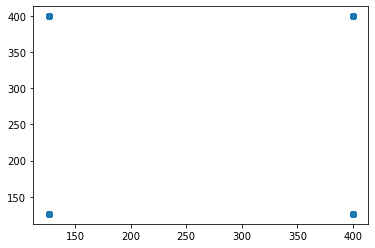

t+1 vs t-308


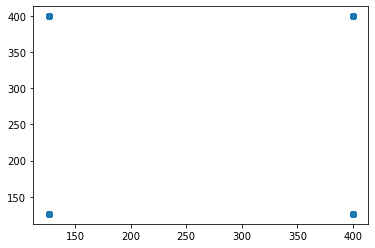

t+1 vs t-309


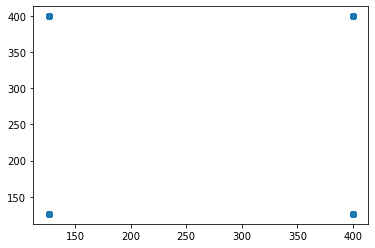

t+1 vs t-310


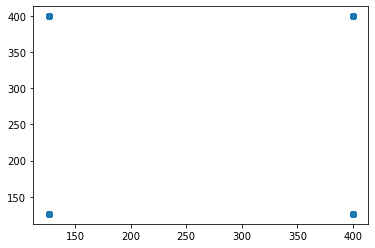

t+1 vs t-311


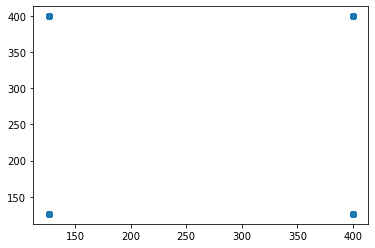

t+1 vs t-312


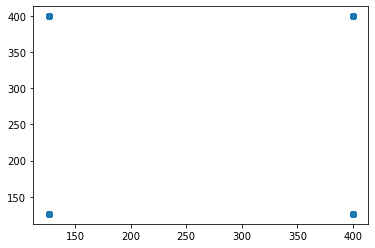

t+1 vs t-313


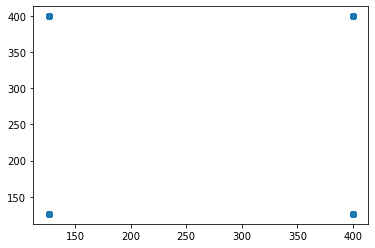

t+1 vs t-314


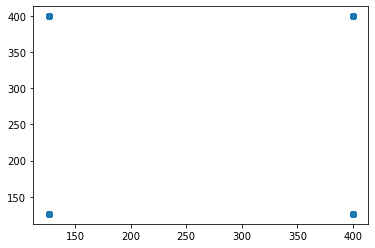

t+1 vs t-315


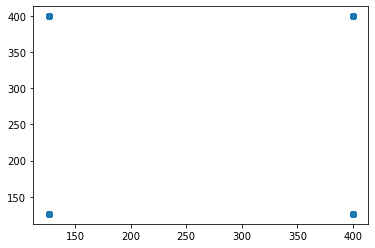

t+1 vs t-316


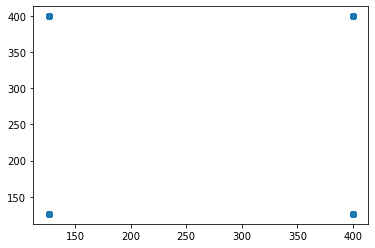

t+1 vs t-317


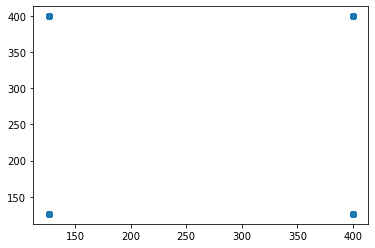

t+1 vs t-318


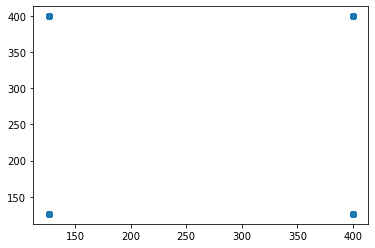

t+1 vs t-319


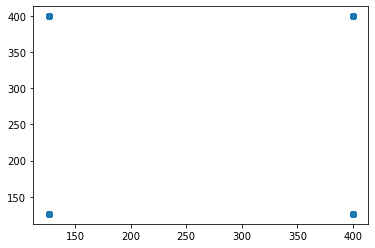

t+1 vs t-320


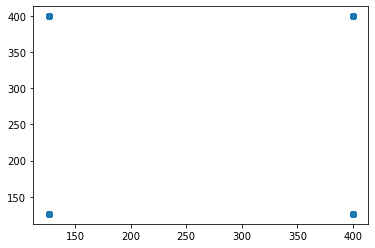

t+1 vs t-321


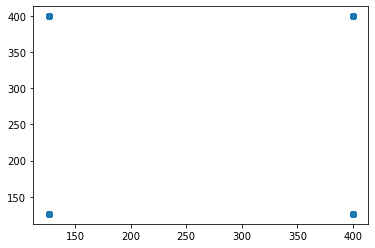

t+1 vs t-322


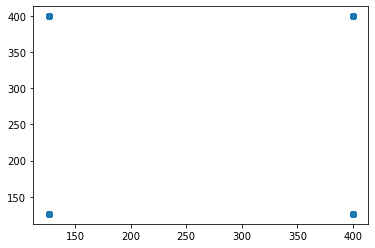

t+1 vs t-323


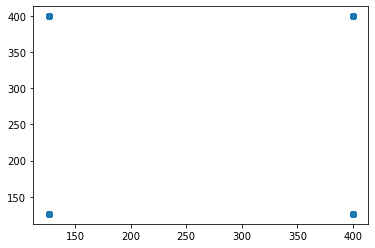

t+1 vs t-324


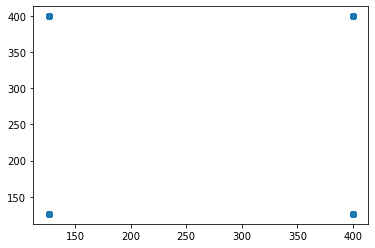

t+1 vs t-325


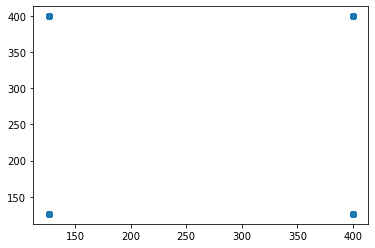

t+1 vs t-326


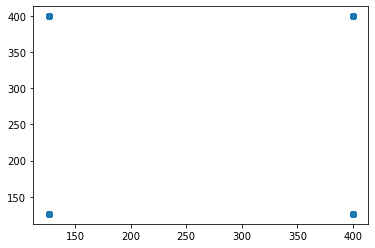

t+1 vs t-327


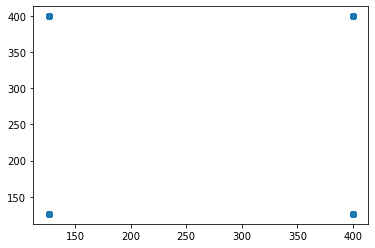

t+1 vs t-328


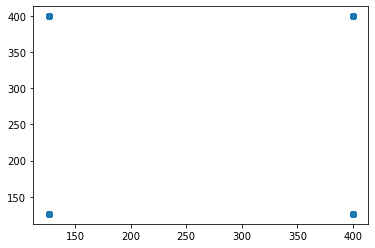

t+1 vs t-329


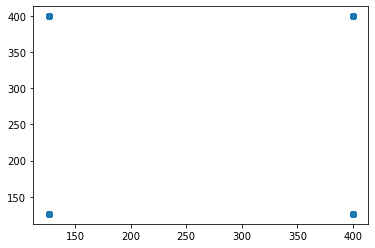

t+1 vs t-330


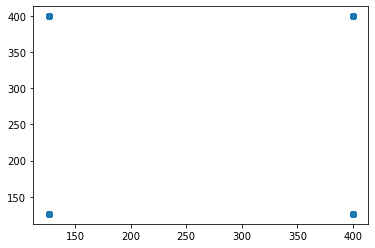

t+1 vs t-331


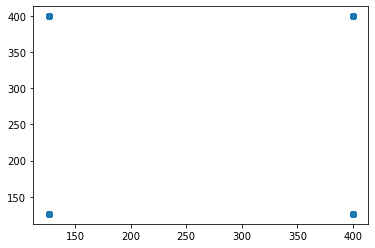

t+1 vs t-332


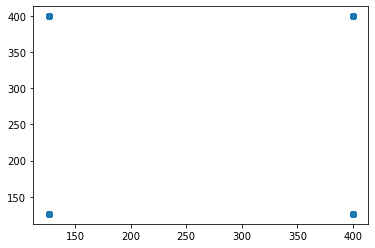

t+1 vs t-333


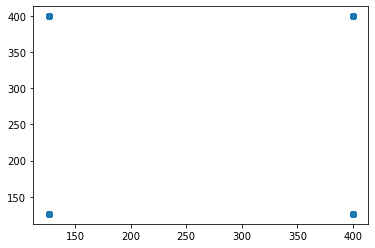

t+1 vs t-334


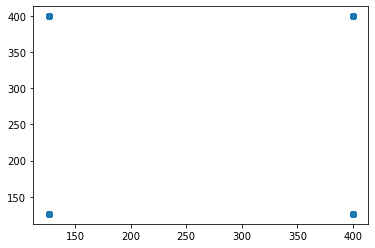

t+1 vs t-335


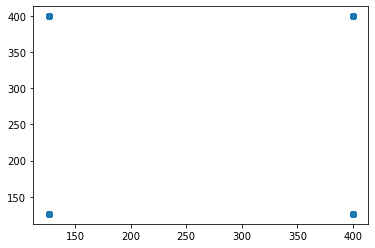

t+1 vs t-336


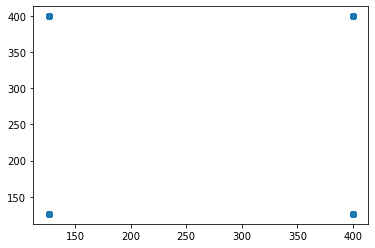

t+1 vs t-337


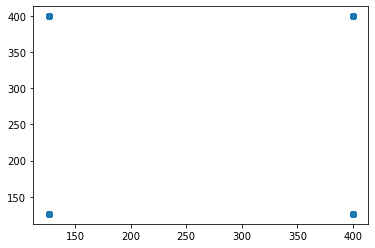

t+1 vs t-338


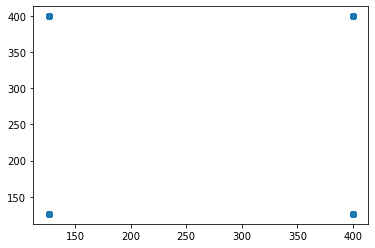

t+1 vs t-339


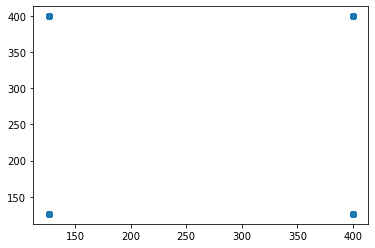

t+1 vs t-340


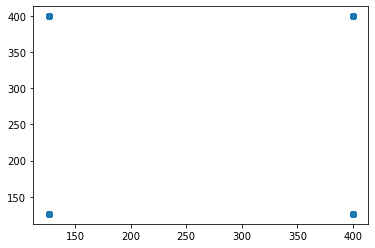

t+1 vs t-341


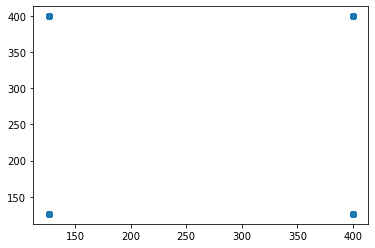

t+1 vs t-342


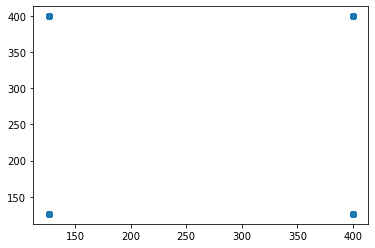

t+1 vs t-343


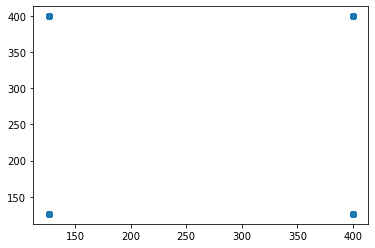

t+1 vs t-344


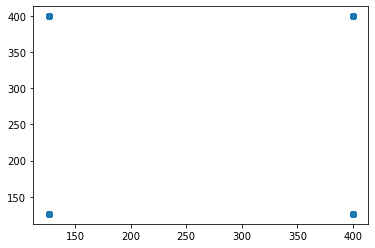

t+1 vs t-345


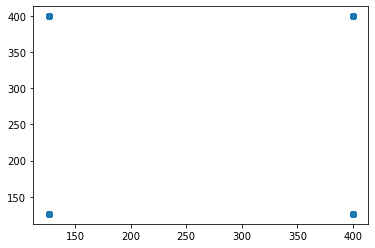

t+1 vs t-346


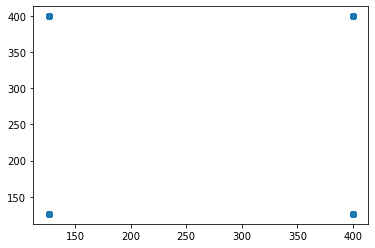

t+1 vs t-347


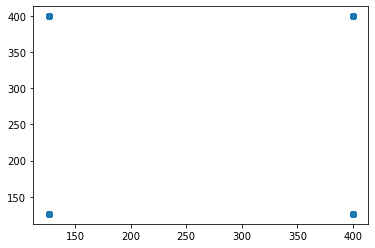

t+1 vs t-348


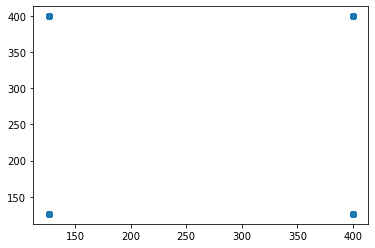

t+1 vs t-349


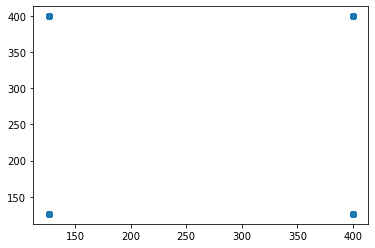

t+1 vs t-350


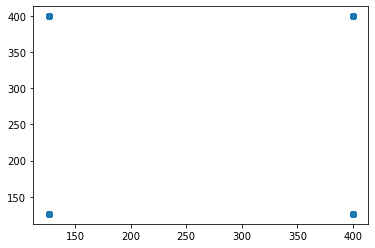

t+1 vs t-351


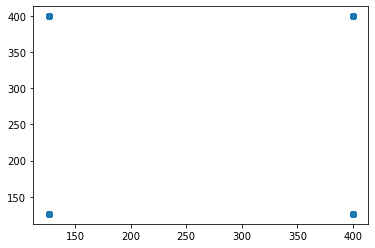

t+1 vs t-352


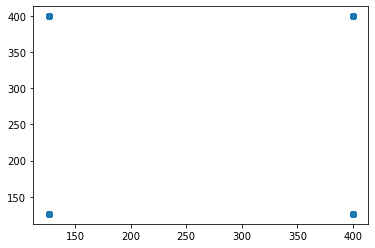

t+1 vs t-353


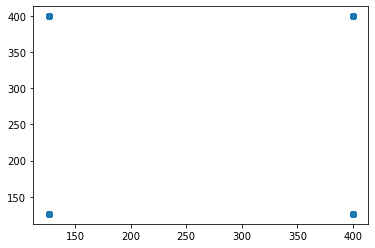

t+1 vs t-354


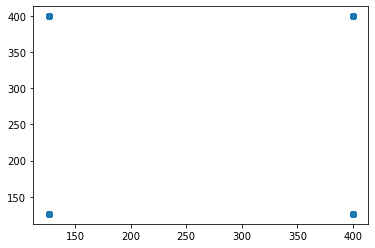

t+1 vs t-355


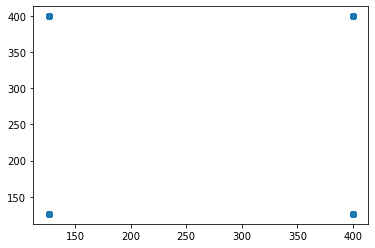

t+1 vs t-356


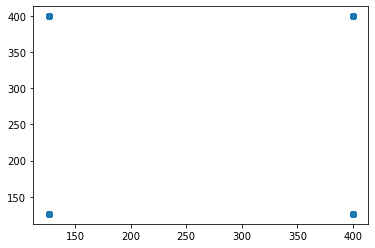

t+1 vs t-357


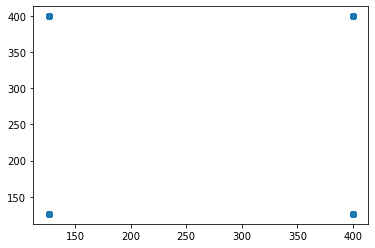

t+1 vs t-358


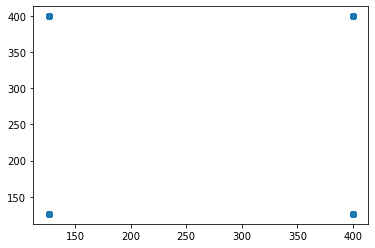

t+1 vs t-359


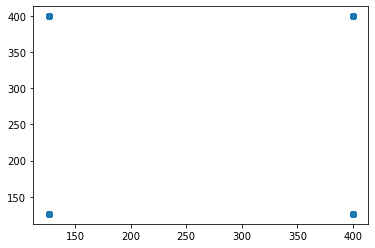

t+1 vs t-360


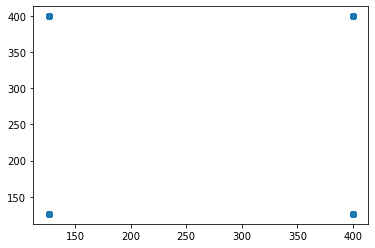

t+1 vs t-361


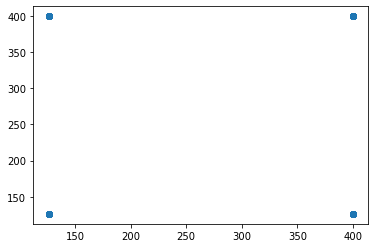

t+1 vs t-362


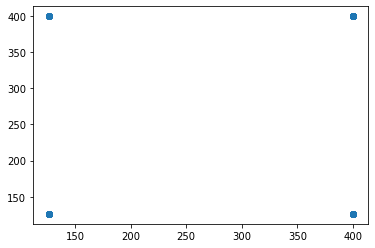

t+1 vs t-363


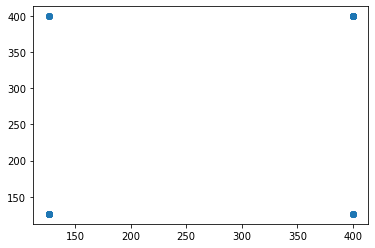

t+1 vs t-364


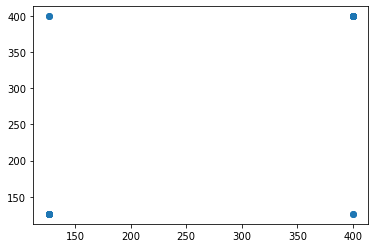

t+1 vs t-365


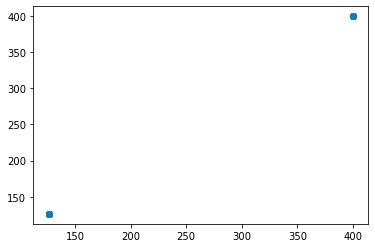

t+1 vs t-366


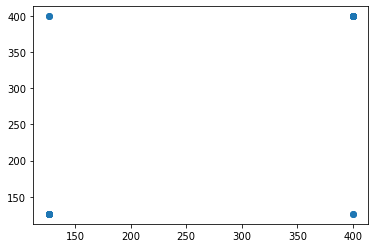

t+1 vs t-367


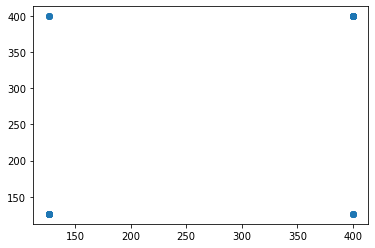

t+1 vs t-368


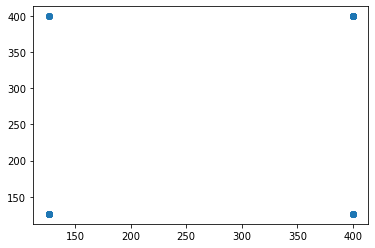

t+1 vs t-369


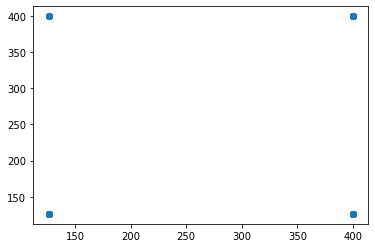

t+1 vs t-370


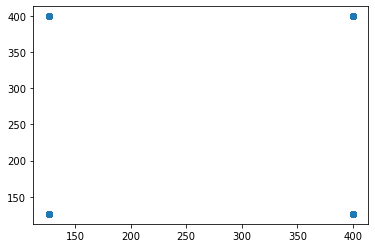

t+1 vs t-371


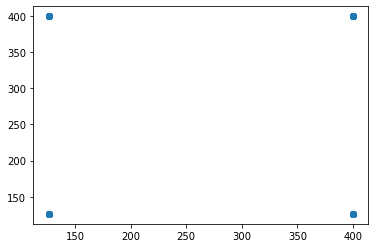

t+1 vs t-372


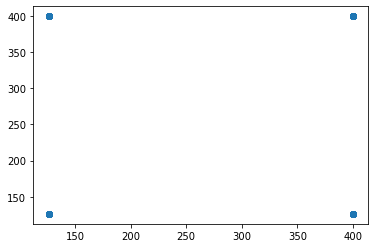

t+1 vs t-373


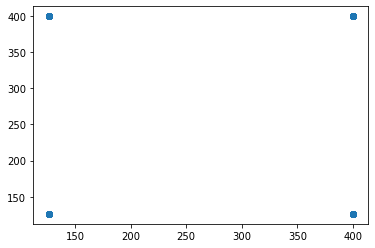

t+1 vs t-374


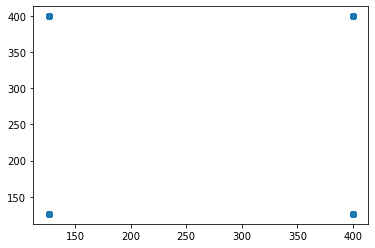

t+1 vs t-375


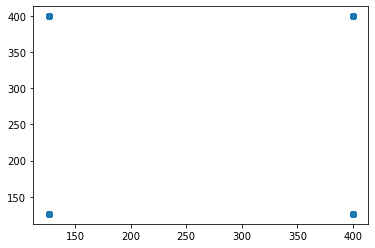

t+1 vs t-376


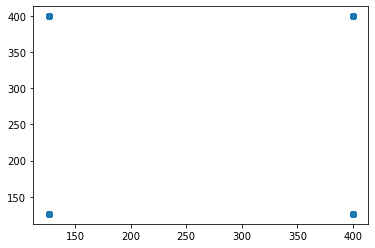

t+1 vs t-377


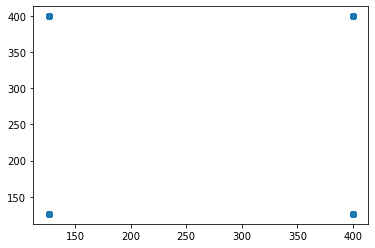

t+1 vs t-378


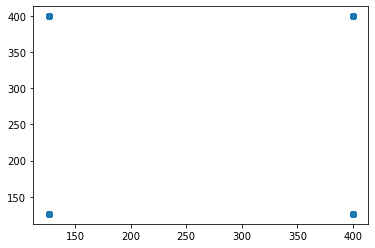

t+1 vs t-379


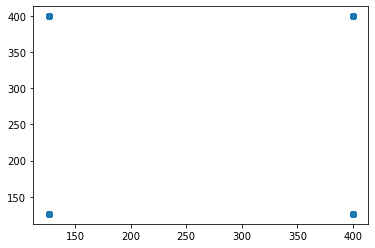

t+1 vs t-380


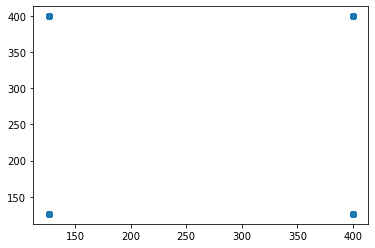

t+1 vs t-381


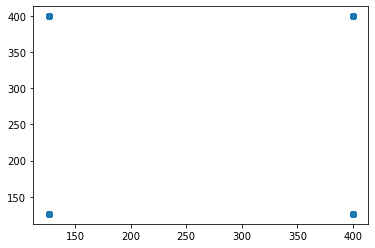

t+1 vs t-382


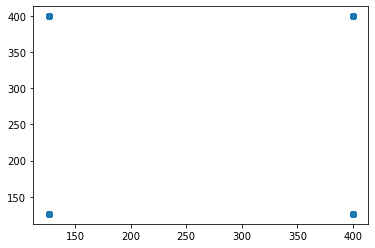

t+1 vs t-383


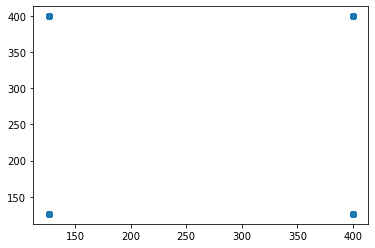

t+1 vs t-384


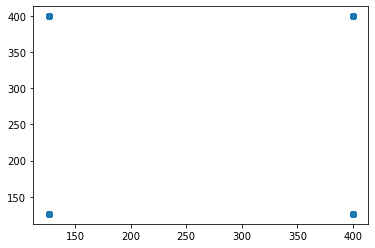

t+1 vs t-385


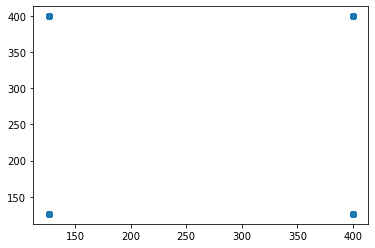

t+1 vs t-386


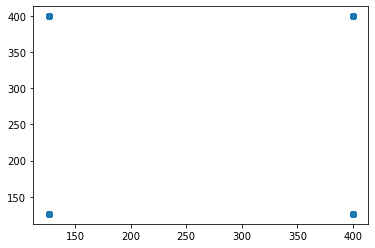

t+1 vs t-387


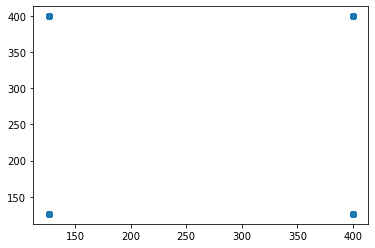

t+1 vs t-388


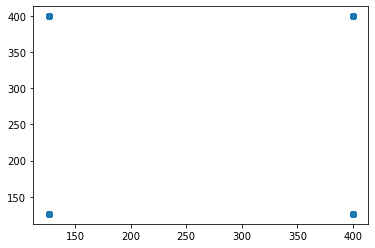

t+1 vs t-389


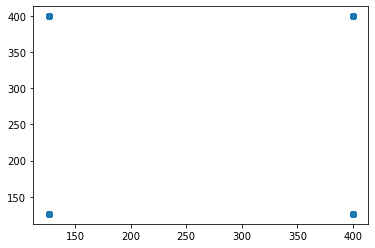

t+1 vs t-390


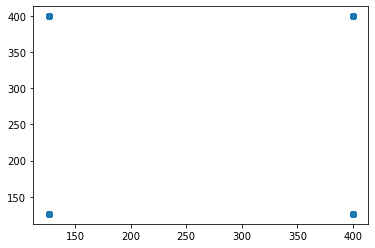

t+1 vs t-391


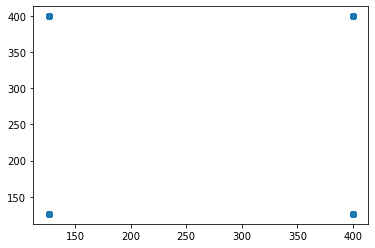

t+1 vs t-392


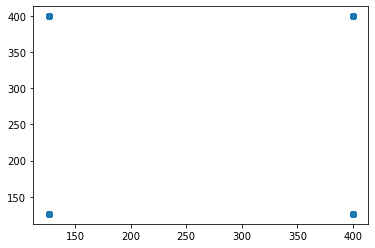

t+1 vs t-393


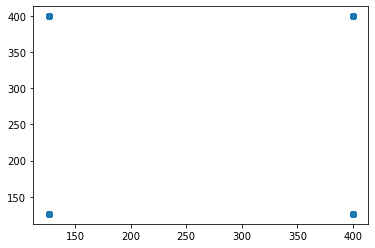

t+1 vs t-394


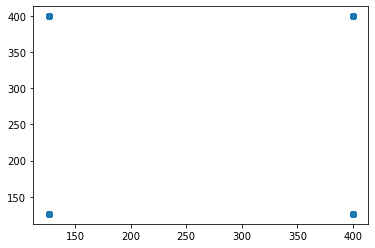

t+1 vs t-395


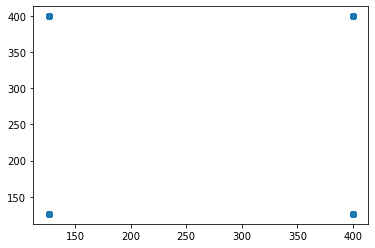

t+1 vs t-396


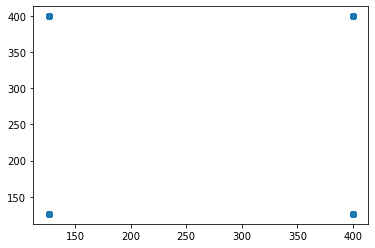

t+1 vs t-397


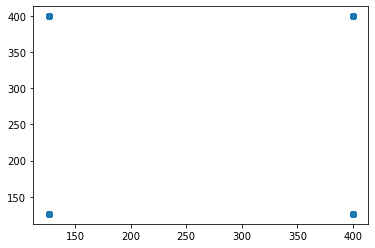

t+1 vs t-398


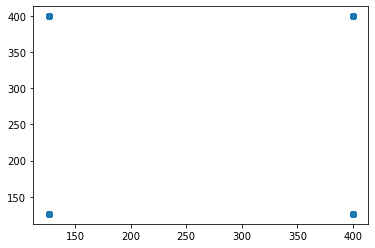

t+1 vs t-399


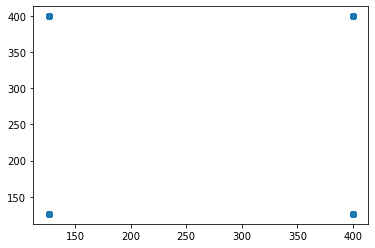

t+1 vs t-400


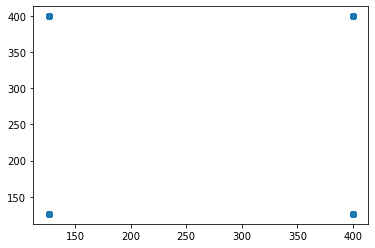

t+1 vs t-401


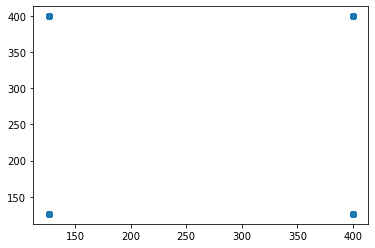

t+1 vs t-402


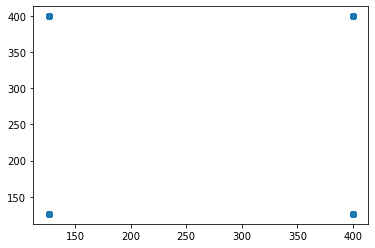

t+1 vs t-403


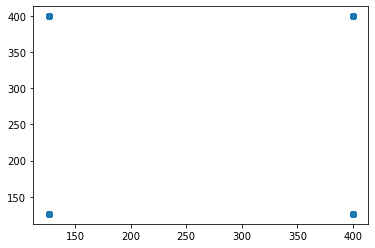

t+1 vs t-404


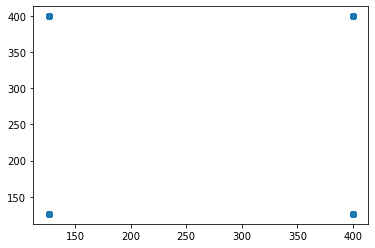

t+1 vs t-405


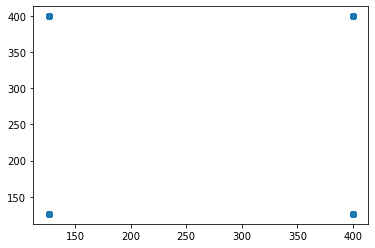

t+1 vs t-406


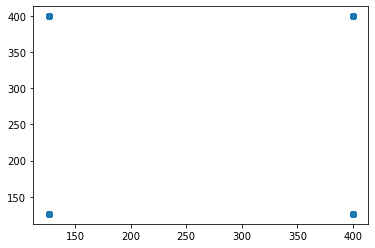

t+1 vs t-407


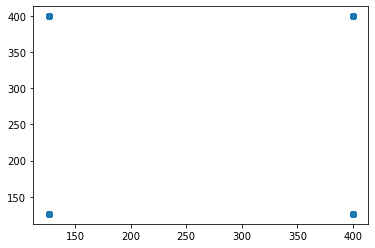

t+1 vs t-408


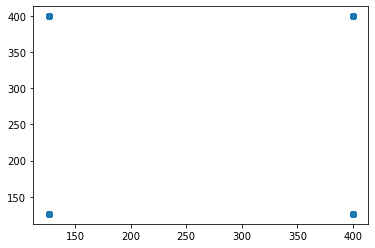

t+1 vs t-409


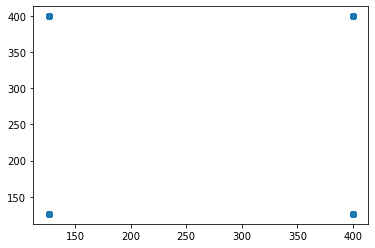

t+1 vs t-410


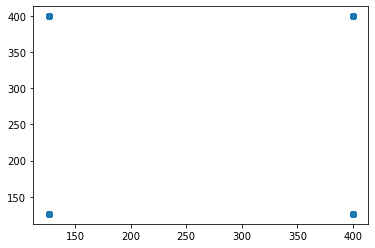

t+1 vs t-411


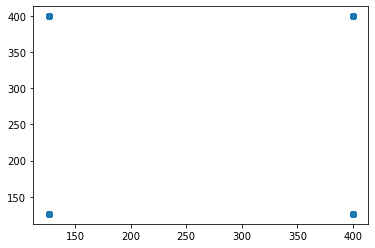

t+1 vs t-412


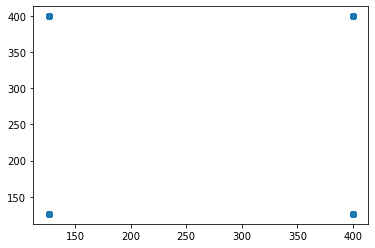

t+1 vs t-413


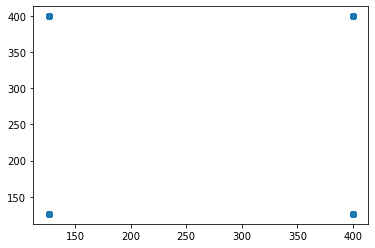

t+1 vs t-414


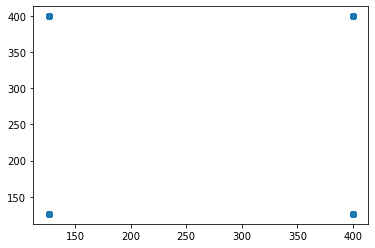

t+1 vs t-415


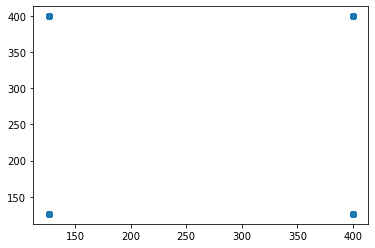

t+1 vs t-416


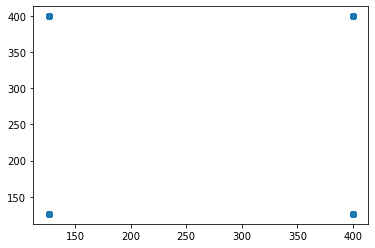

t+1 vs t-417


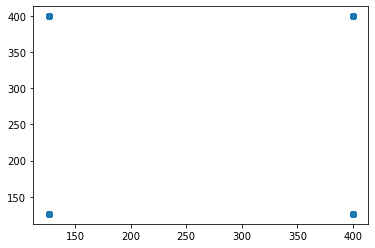

t+1 vs t-418


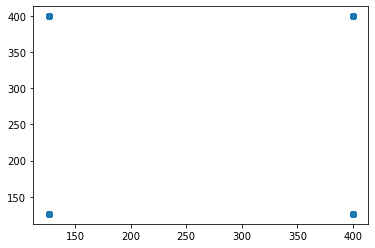

t+1 vs t-419


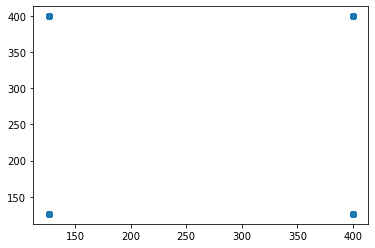

t+1 vs t-420


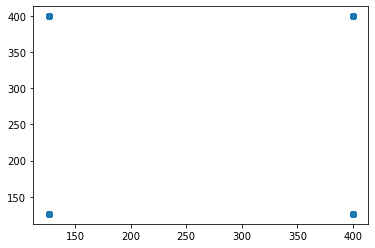

t+1 vs t-421


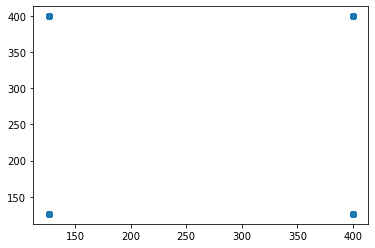

t+1 vs t-422


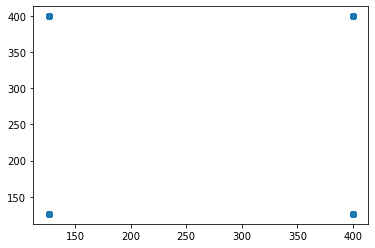

t+1 vs t-423


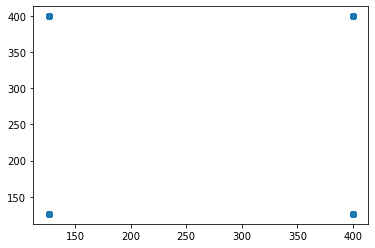

t+1 vs t-424


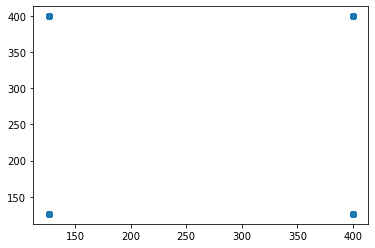

t+1 vs t-425


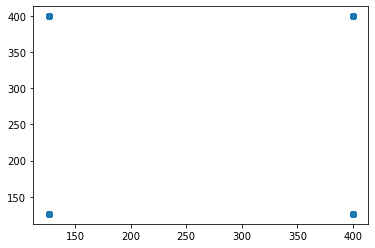

t+1 vs t-426


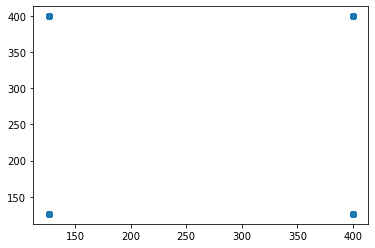

t+1 vs t-427


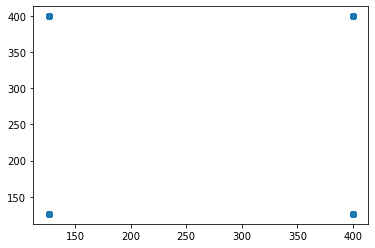

t+1 vs t-428


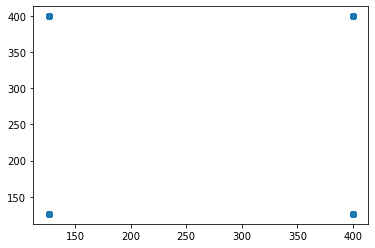

t+1 vs t-429


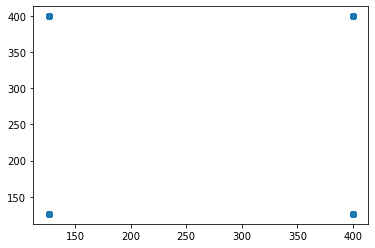

t+1 vs t-430


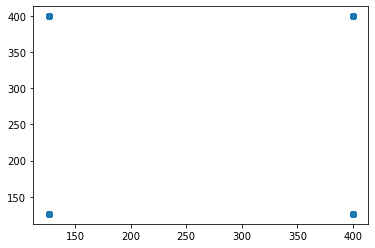

t+1 vs t-431


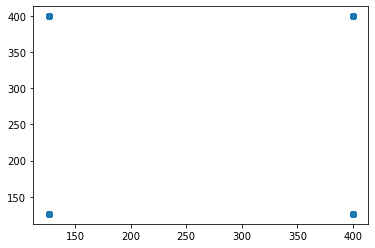

t+1 vs t-432


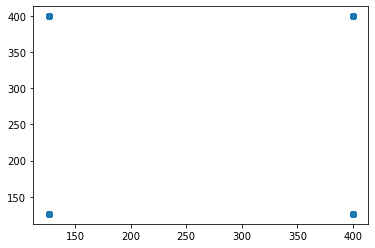

t+1 vs t-433


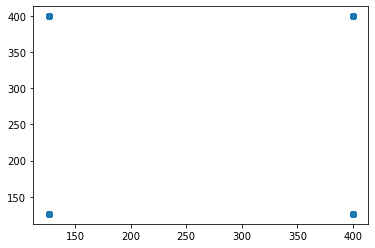

t+1 vs t-434


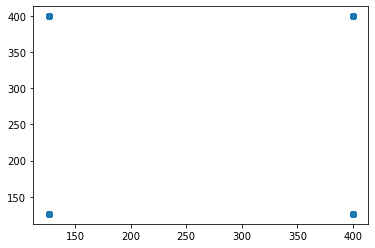

t+1 vs t-435


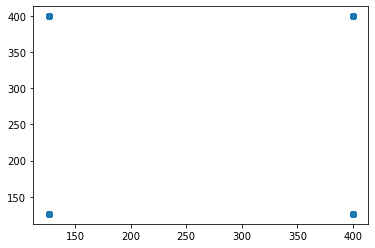

t+1 vs t-436


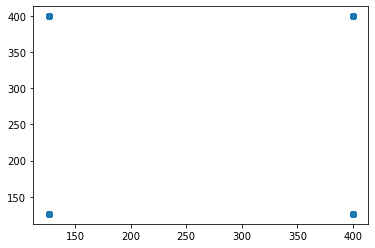

t+1 vs t-437


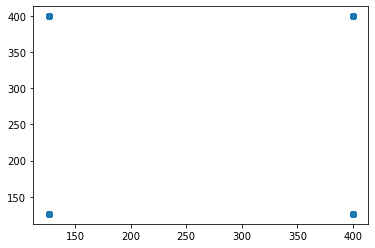

t+1 vs t-438


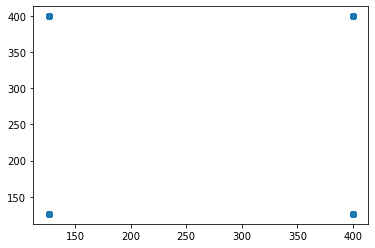

t+1 vs t-439


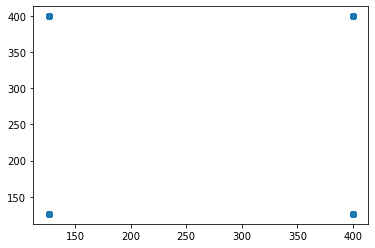

t+1 vs t-440


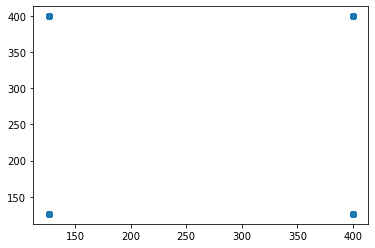

t+1 vs t-441


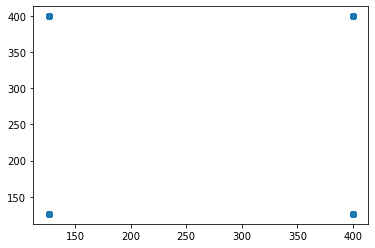

t+1 vs t-442


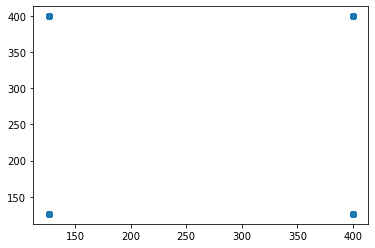

t+1 vs t-443


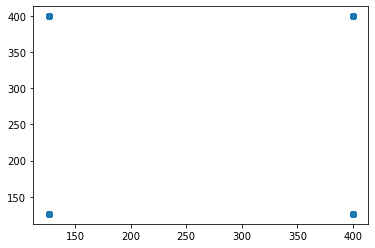

t+1 vs t-444


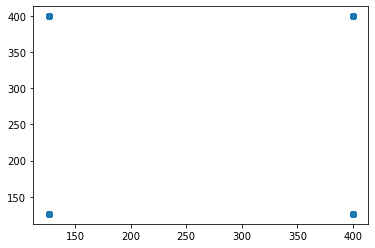

t+1 vs t-445


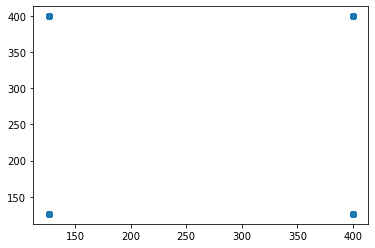

t+1 vs t-446


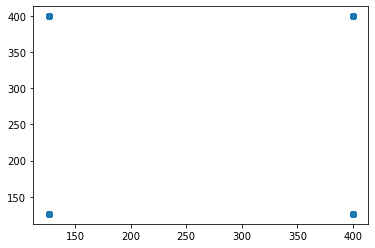

t+1 vs t-447


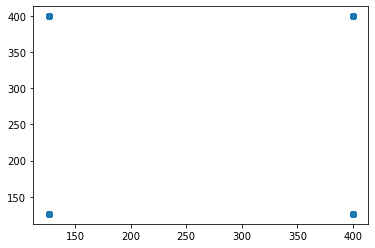

t+1 vs t-448


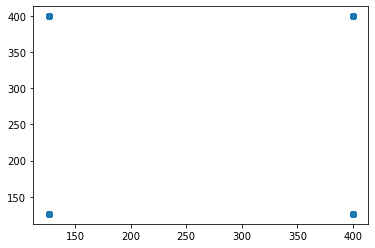

t+1 vs t-449


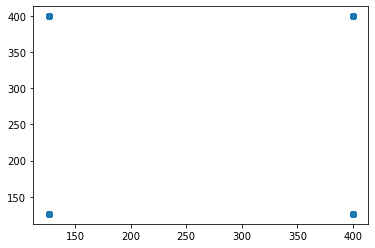

t+1 vs t-450


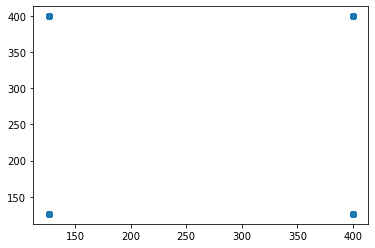

t+1 vs t-451


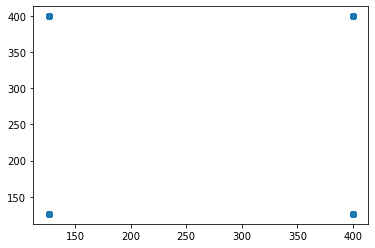

t+1 vs t-452


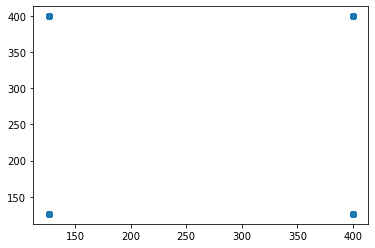

t+1 vs t-453


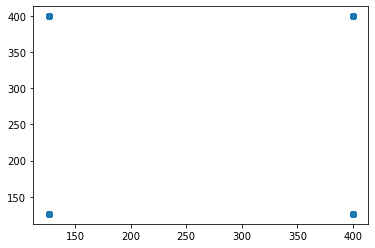

t+1 vs t-454


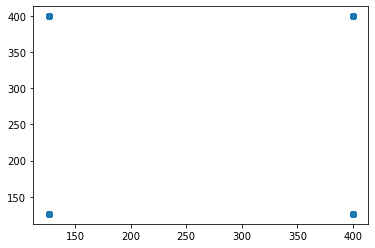

t+1 vs t-455


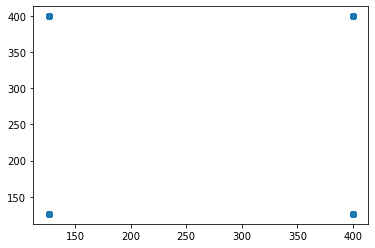

t+1 vs t-456


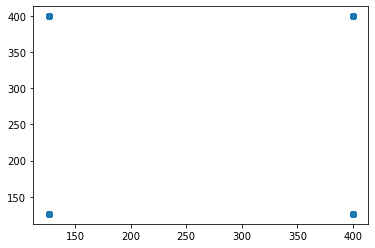

t+1 vs t-457


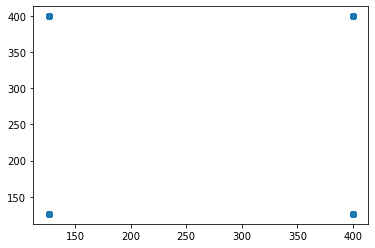

t+1 vs t-458


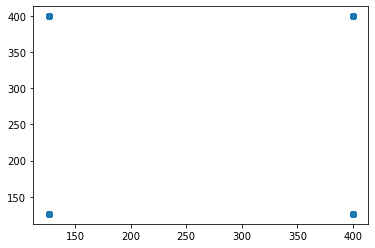

t+1 vs t-459


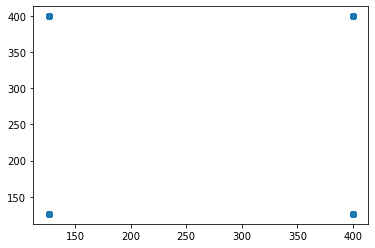

t+1 vs t-460


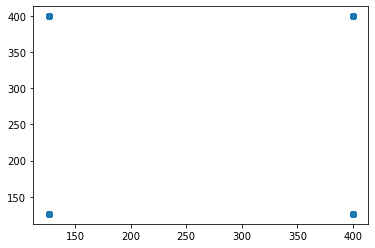

t+1 vs t-461


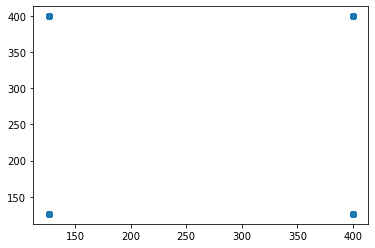

t+1 vs t-462


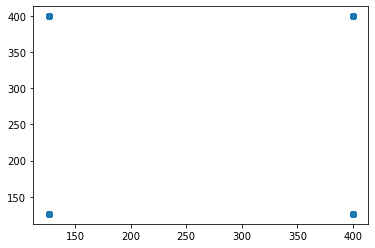

t+1 vs t-463


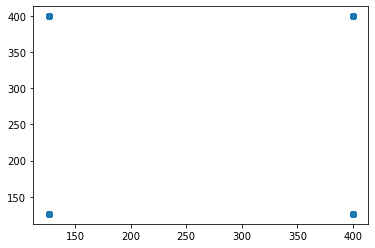

t+1 vs t-464


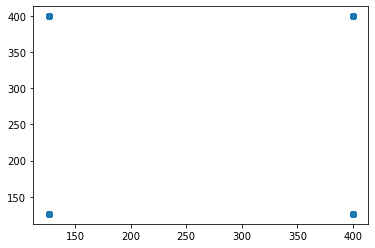

t+1 vs t-465


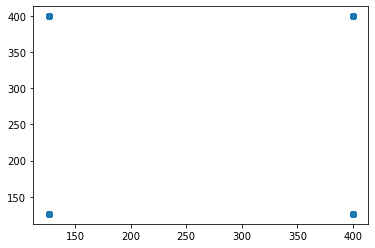

t+1 vs t-466


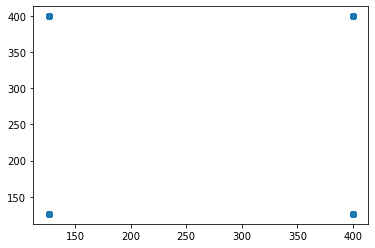

t+1 vs t-467


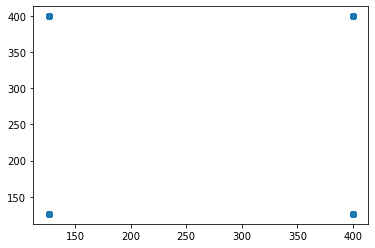

t+1 vs t-468


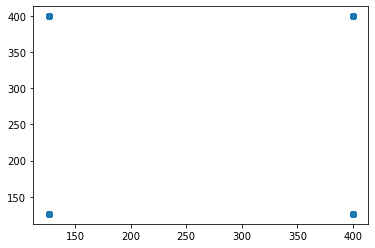

t+1 vs t-469


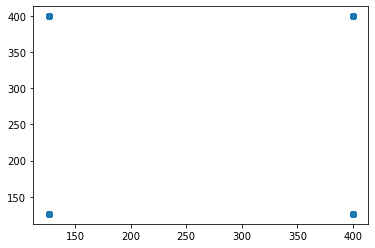

t+1 vs t-470


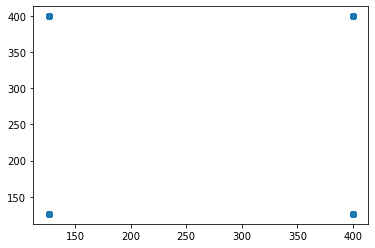

t+1 vs t-471


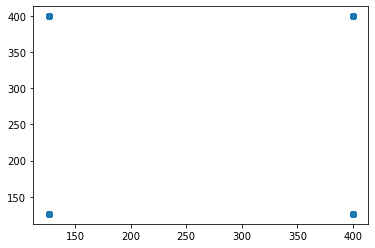

t+1 vs t-472


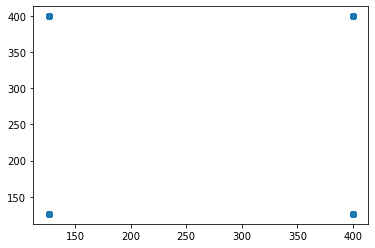

t+1 vs t-473


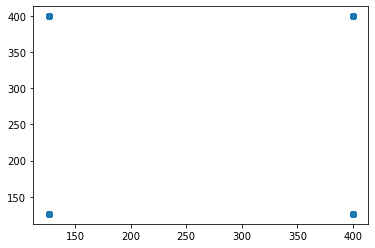

t+1 vs t-474


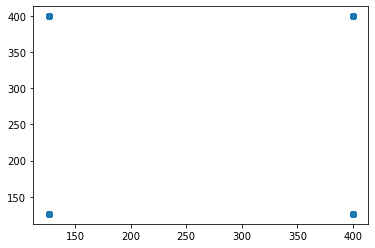

t+1 vs t-475


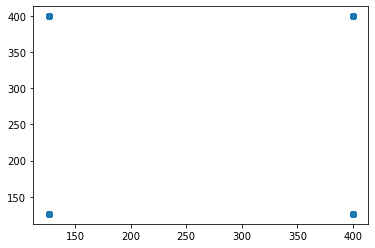

t+1 vs t-476


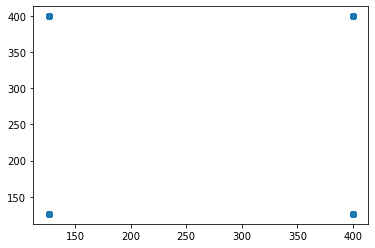

t+1 vs t-477


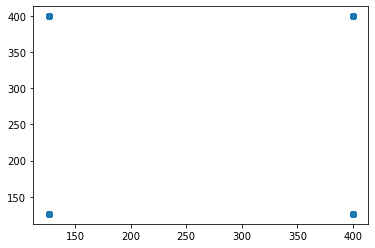

t+1 vs t-478


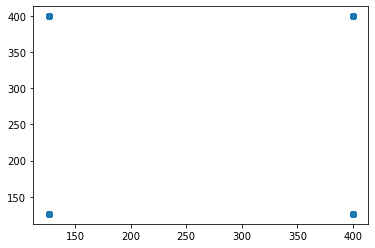

t+1 vs t-479


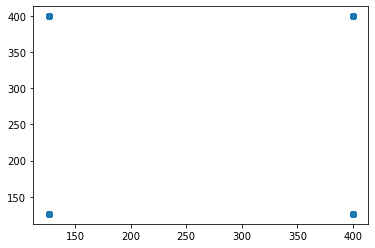

t+1 vs t-480


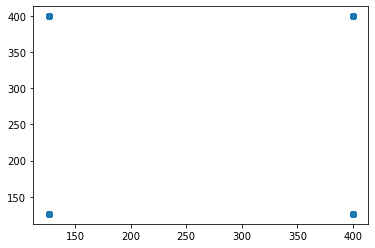

t+1 vs t-481


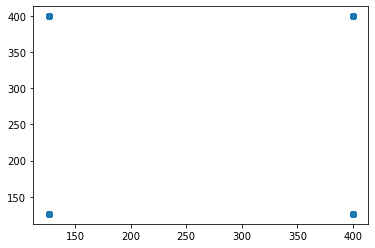

t+1 vs t-482


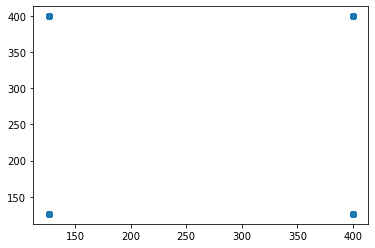

t+1 vs t-483


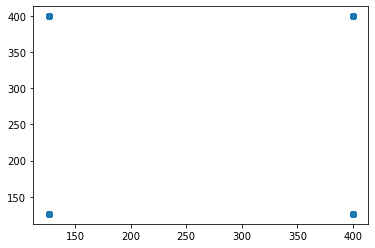

t+1 vs t-484


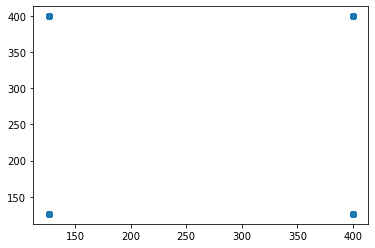

t+1 vs t-485


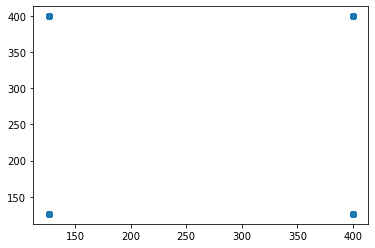

t+1 vs t-486


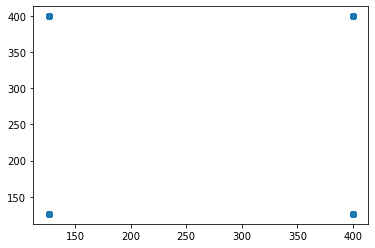

t+1 vs t-487


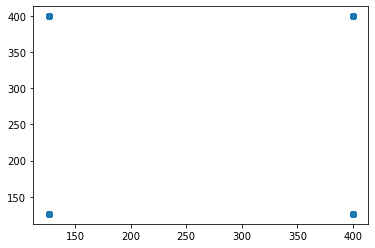

t+1 vs t-488


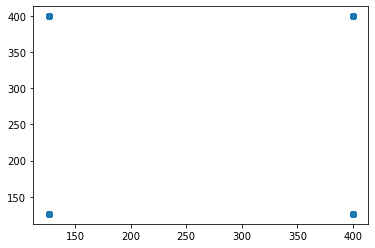

t+1 vs t-489


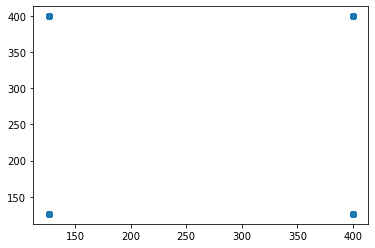

t+1 vs t-490


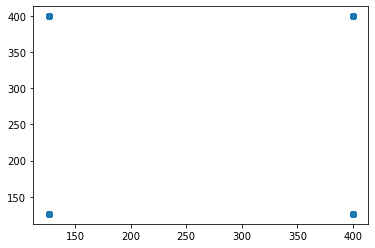

t+1 vs t-491


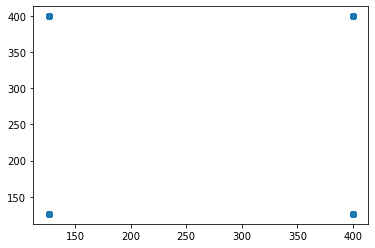

t+1 vs t-492


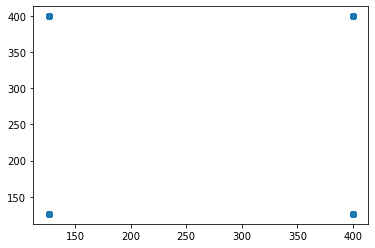

t+1 vs t-493


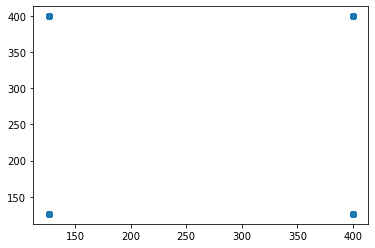

t+1 vs t-494


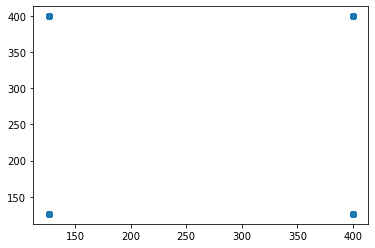

t+1 vs t-495


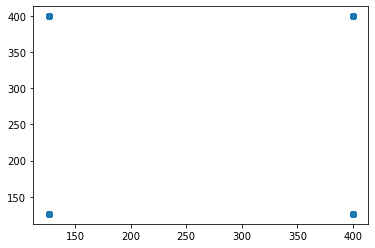

t+1 vs t-496


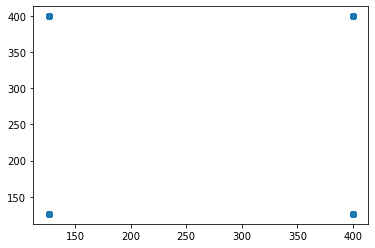

t+1 vs t-497


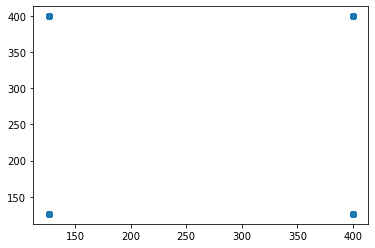

t+1 vs t-498


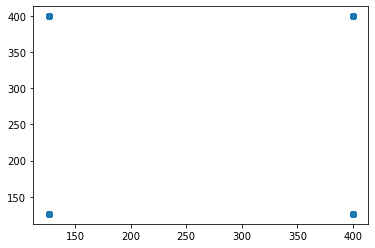

t+1 vs t-499


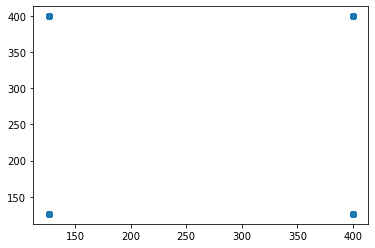

t+1 vs t-500


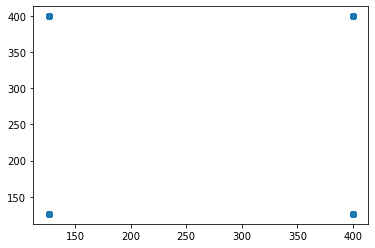

t+1 vs t-501


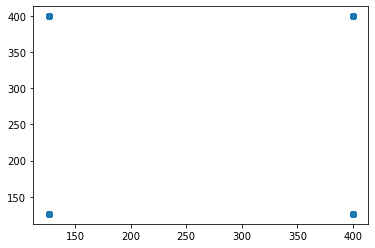

t+1 vs t-502


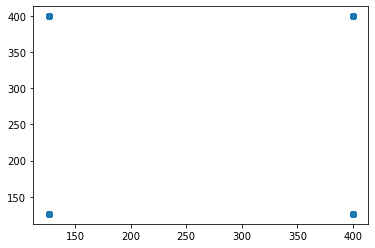

t+1 vs t-503


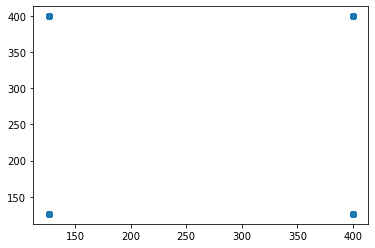

t+1 vs t-504


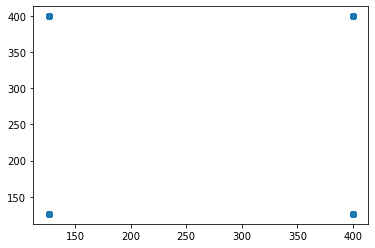

t+1 vs t-505


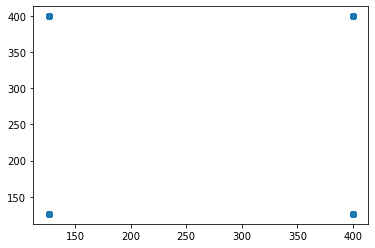

t+1 vs t-506


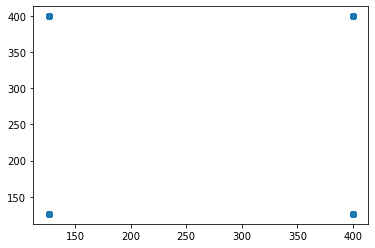

t+1 vs t-507


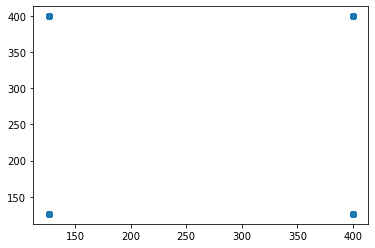

t+1 vs t-508


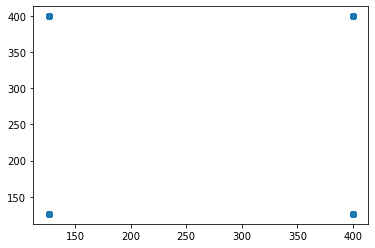

t+1 vs t-509


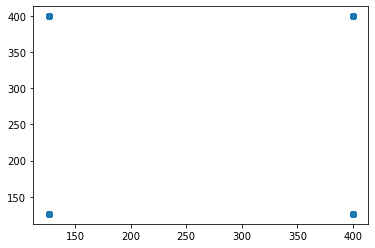

t+1 vs t-510


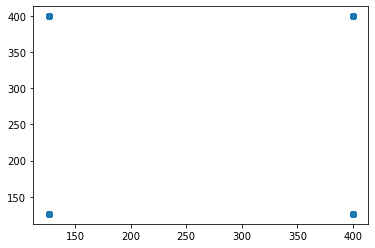

t+1 vs t-511


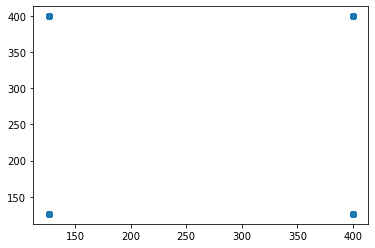

t+1 vs t-512


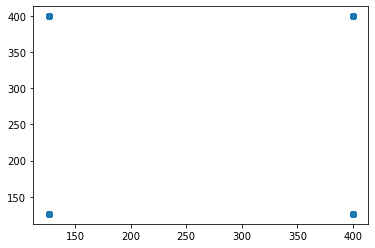

t+1 vs t-513


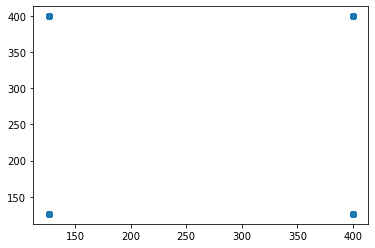

t+1 vs t-514


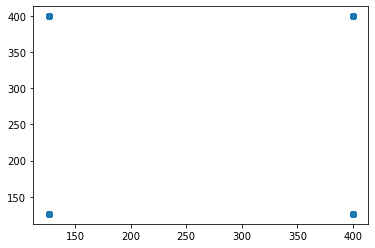

t+1 vs t-515


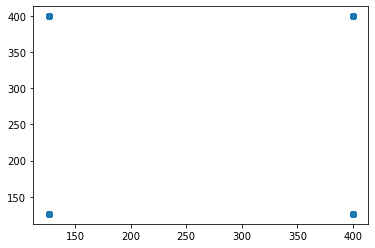

t+1 vs t-516


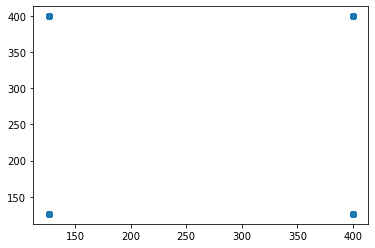

t+1 vs t-517


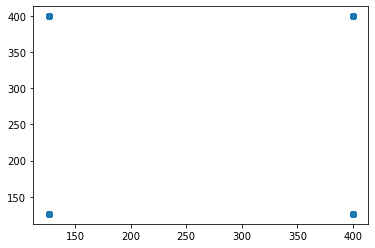

t+1 vs t-518


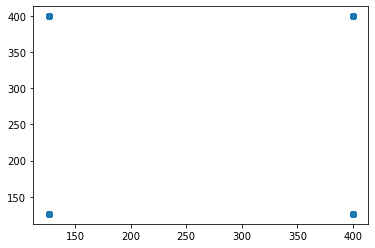

t+1 vs t-519


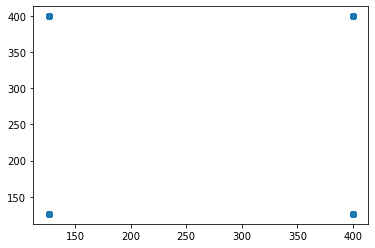

t+1 vs t-520


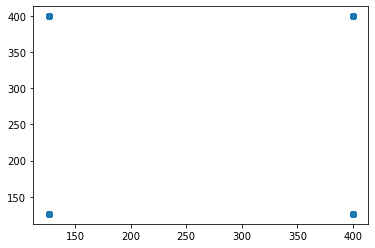

t+1 vs t-521


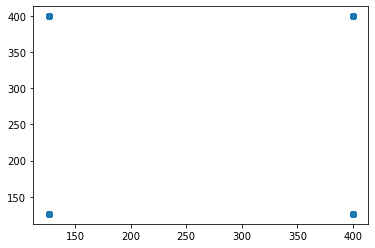

t+1 vs t-522


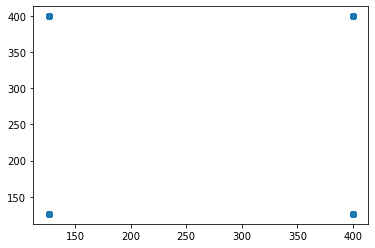

t+1 vs t-523


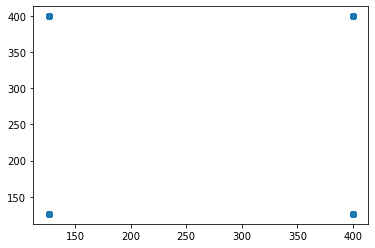

t+1 vs t-524


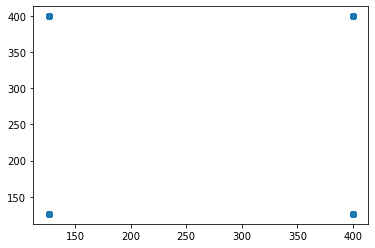

t+1 vs t-525


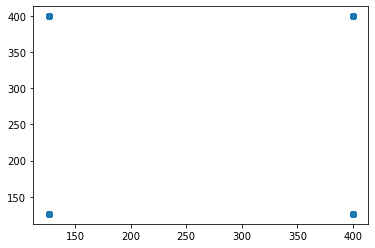

t+1 vs t-526


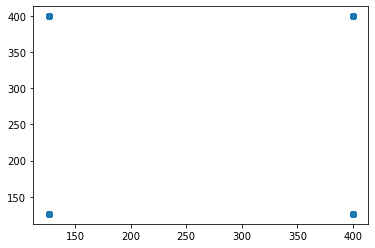

t+1 vs t-527


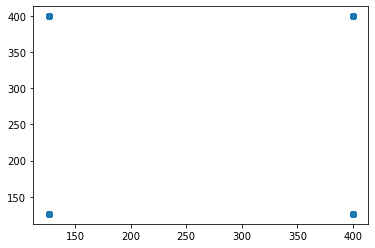

t+1 vs t-528


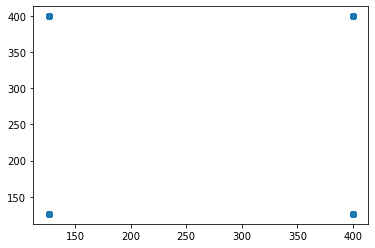

t+1 vs t-529


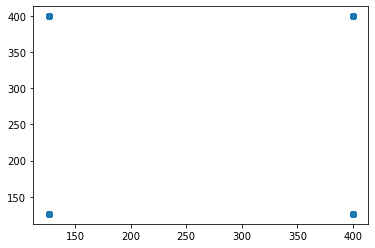

t+1 vs t-530


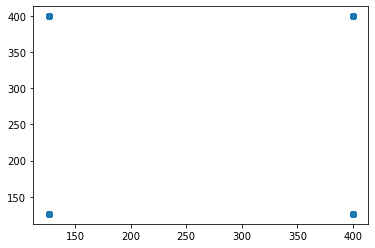

t+1 vs t-531


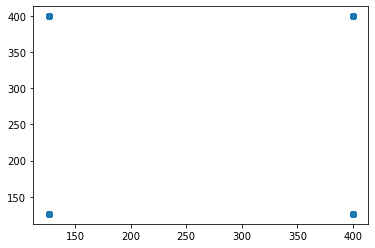

t+1 vs t-532


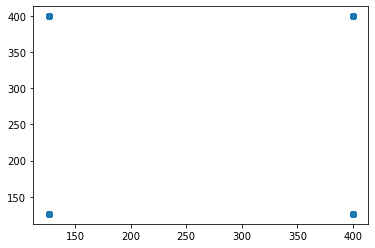

t+1 vs t-533


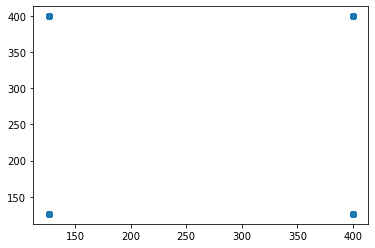

t+1 vs t-534


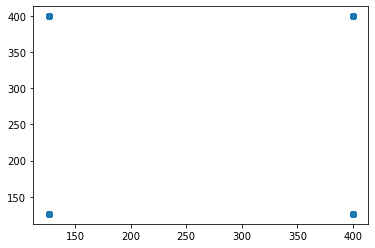

t+1 vs t-535


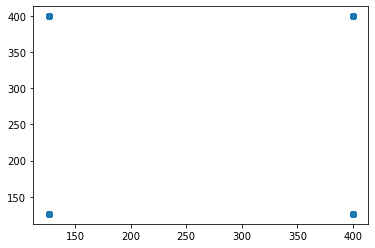

t+1 vs t-536


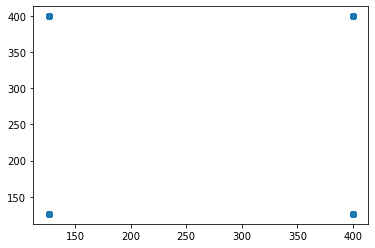

t+1 vs t-537


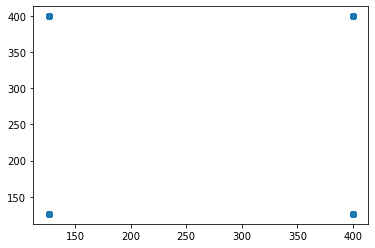

t+1 vs t-538


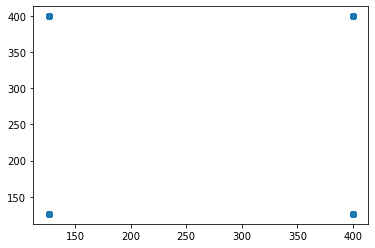

t+1 vs t-539


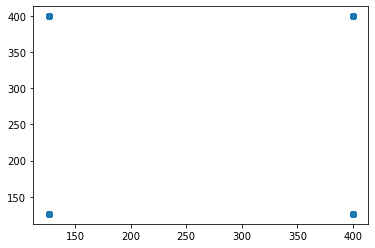

t+1 vs t-540


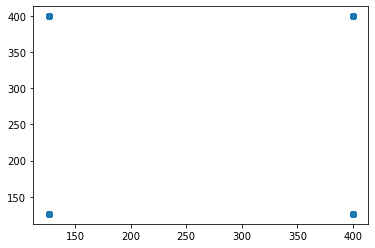

t+1 vs t-541


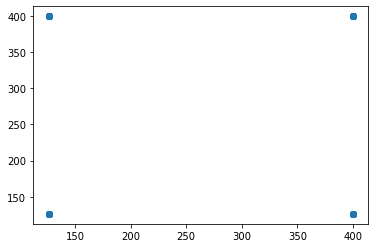

t+1 vs t-542


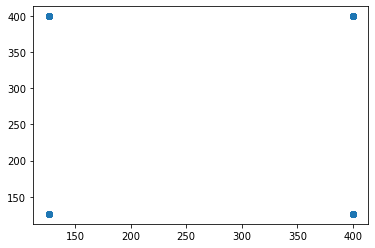

t+1 vs t-543


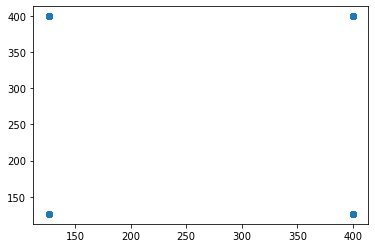

t+1 vs t-544


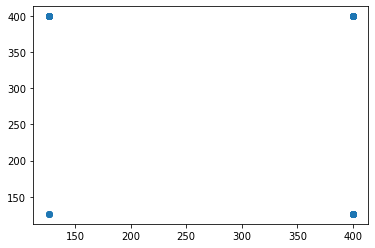

t+1 vs t-545


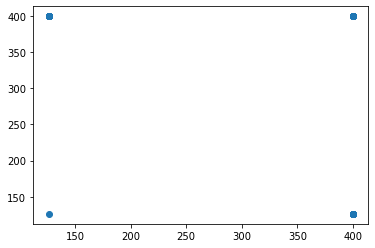

t+1 vs t-546


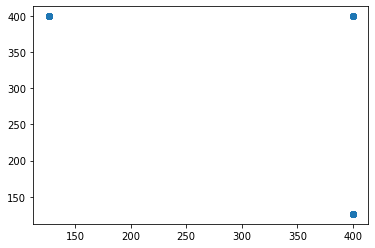

t+1 vs t-547


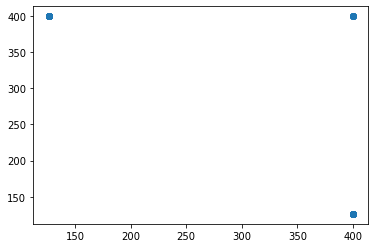

t+1 vs t-548


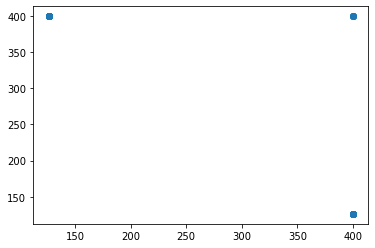

t+1 vs t-549


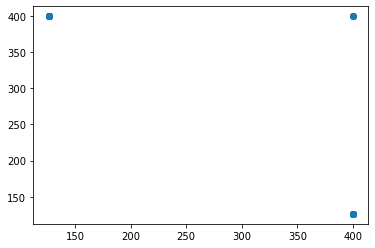

t+1 vs t-550


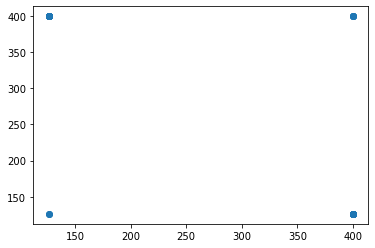

t+1 vs t-551


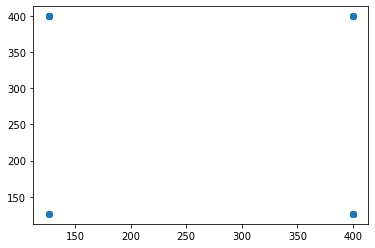

t+1 vs t-552


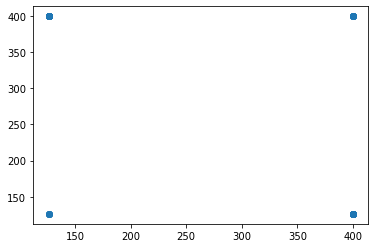

t+1 vs t-553


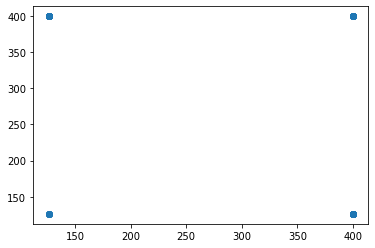

t+1 vs t-554


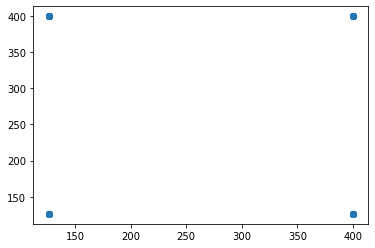

t+1 vs t-555


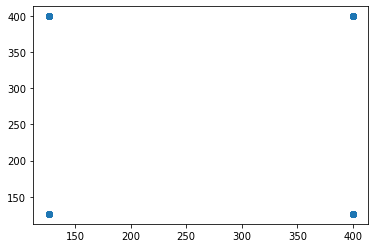

t+1 vs t-556


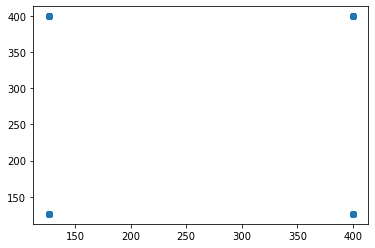

t+1 vs t-557


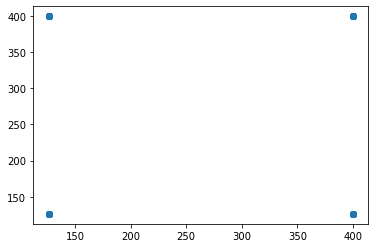

t+1 vs t-558


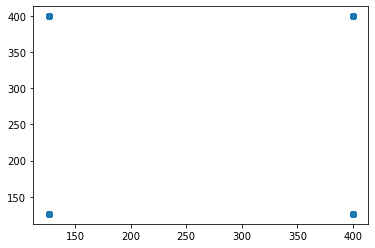

t+1 vs t-559


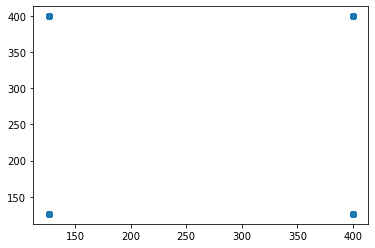

t+1 vs t-560


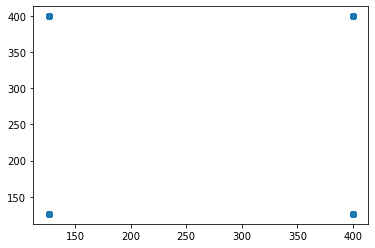

t+1 vs t-561


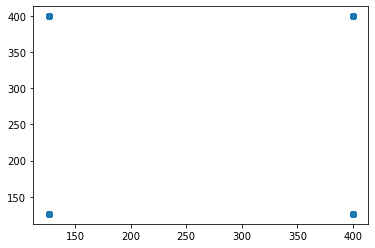

t+1 vs t-562


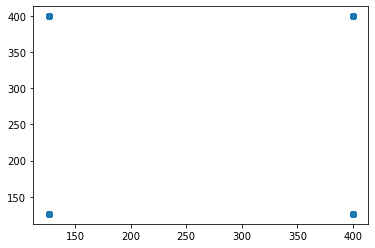

t+1 vs t-563


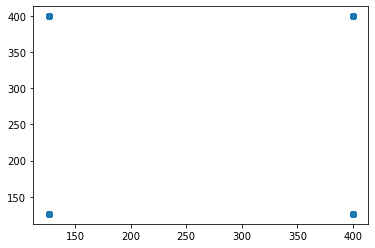

t+1 vs t-564


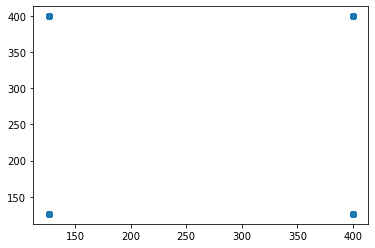

t+1 vs t-565


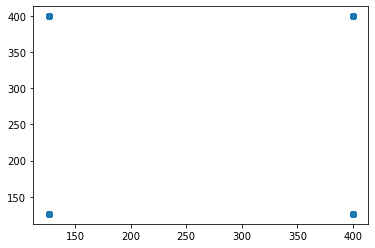

t+1 vs t-566


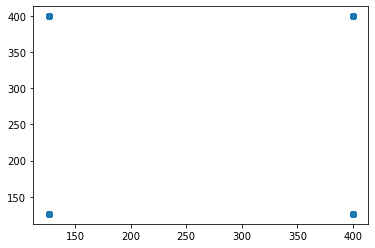

t+1 vs t-567


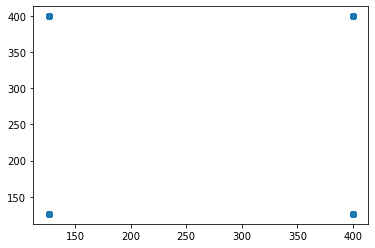

t+1 vs t-568


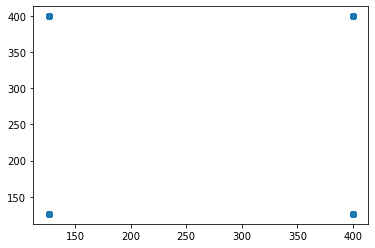

t+1 vs t-569


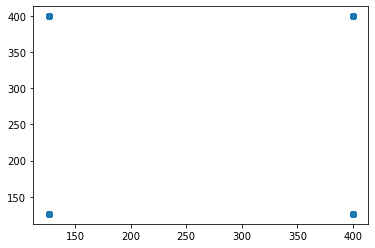

t+1 vs t-570


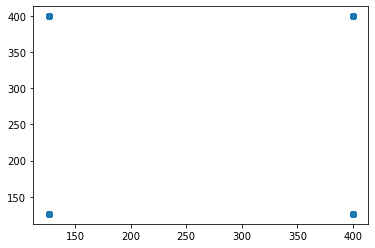

t+1 vs t-571


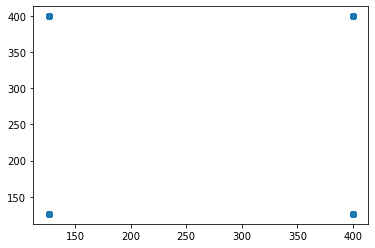

t+1 vs t-572


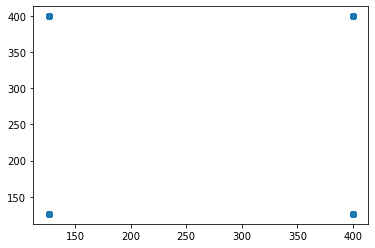

t+1 vs t-573


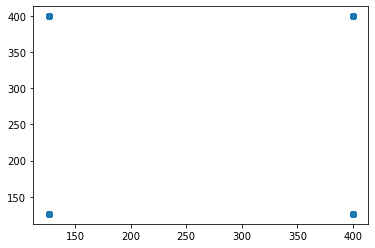

t+1 vs t-574


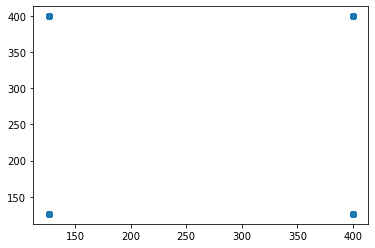

t+1 vs t-575


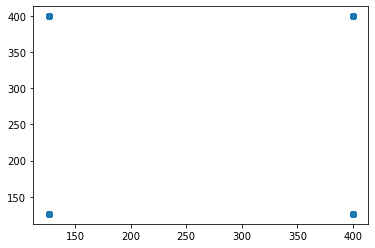

t+1 vs t-576


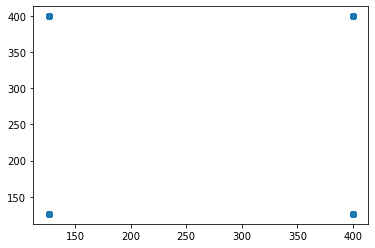

t+1 vs t-577


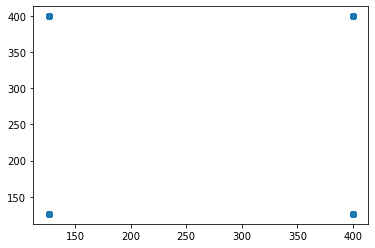

t+1 vs t-578


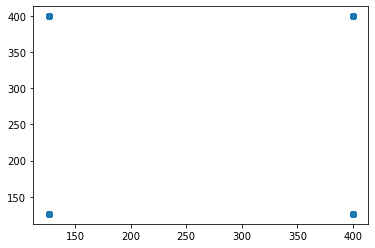

t+1 vs t-579


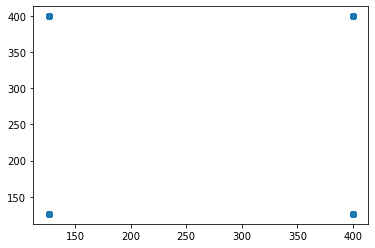

t+1 vs t-580


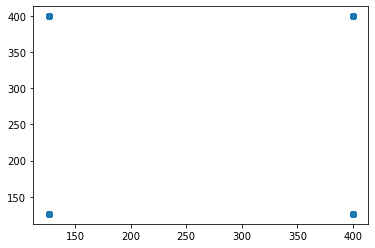

t+1 vs t-581


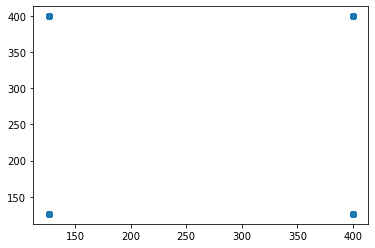

t+1 vs t-582


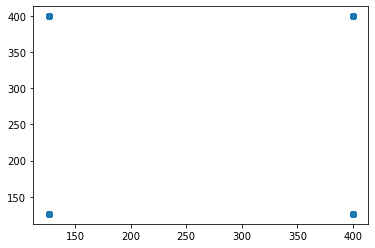

t+1 vs t-583


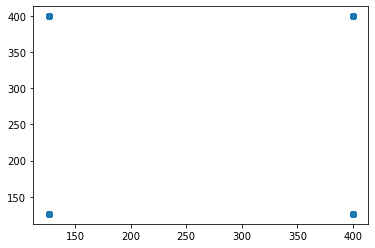

t+1 vs t-584


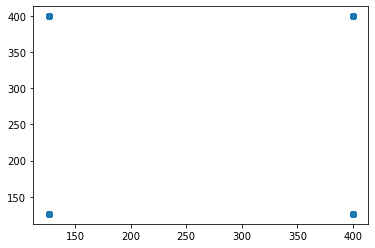

t+1 vs t-585


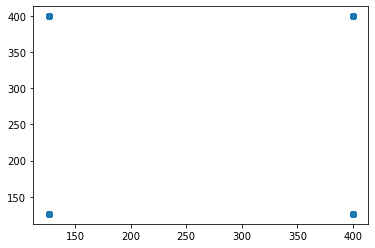

t+1 vs t-586


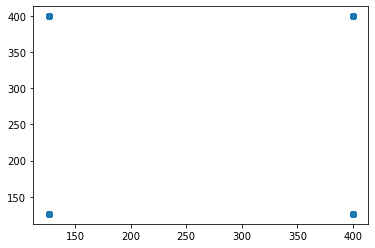

t+1 vs t-587


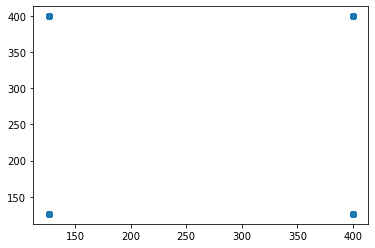

t+1 vs t-588


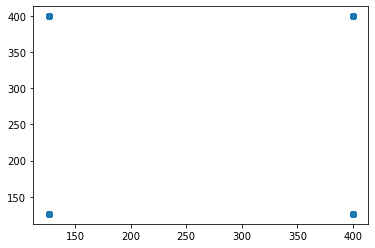

t+1 vs t-589


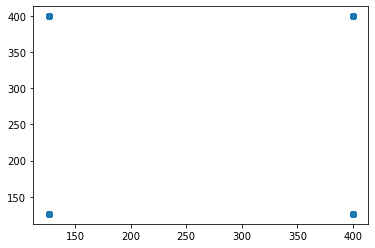

t+1 vs t-590


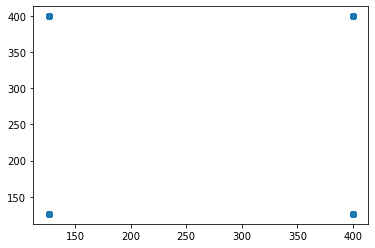

t+1 vs t-591


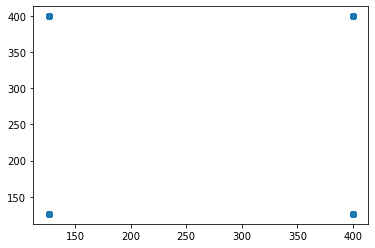

t+1 vs t-592


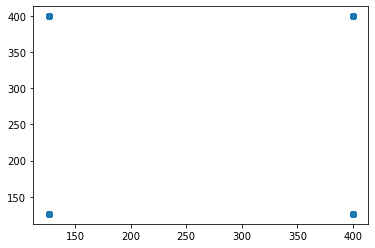

t+1 vs t-593


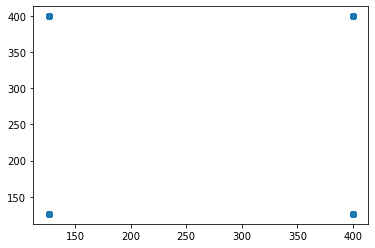

t+1 vs t-594


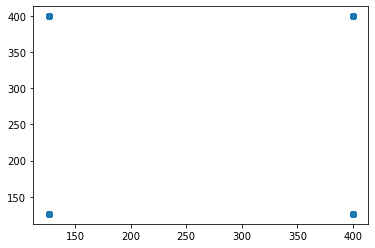

t+1 vs t-595


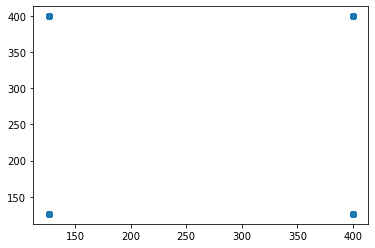

t+1 vs t-596


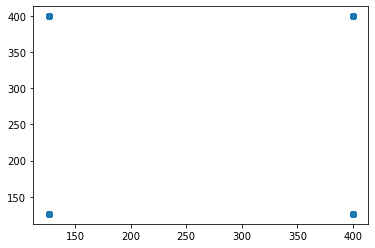

t+1 vs t-597


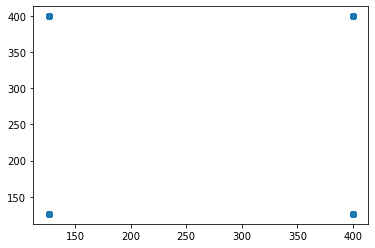

t+1 vs t-598


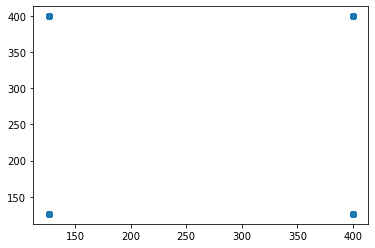

t+1 vs t-599


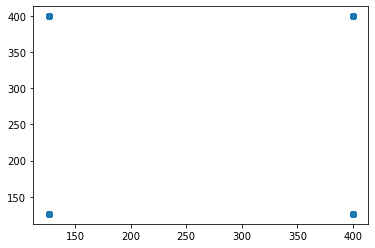

t+1 vs t-600


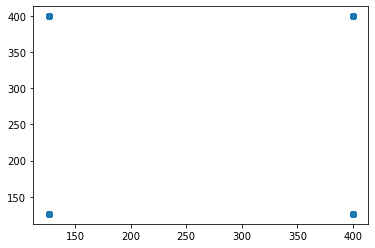

t+1 vs t-601


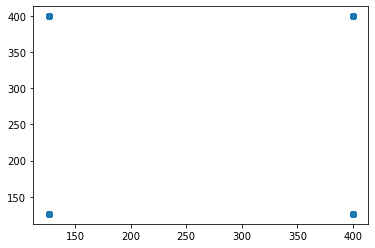

t+1 vs t-602


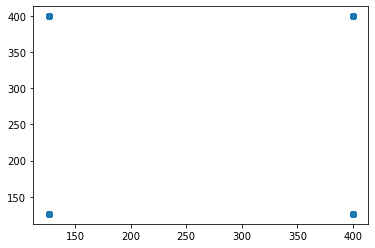

t+1 vs t-603


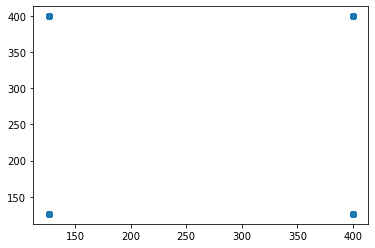

t+1 vs t-604


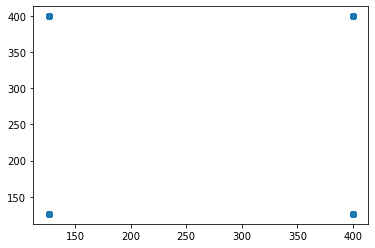

t+1 vs t-605


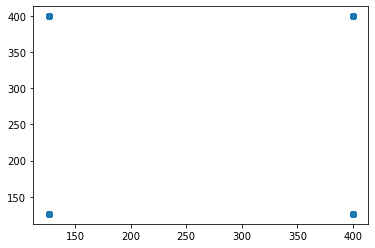

t+1 vs t-606


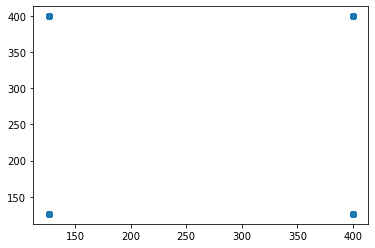

t+1 vs t-607


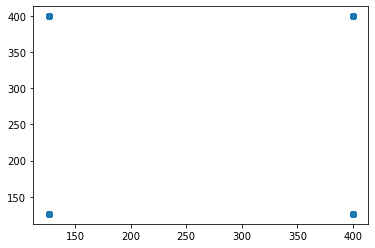

t+1 vs t-608


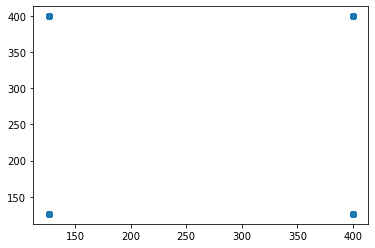

t+1 vs t-609


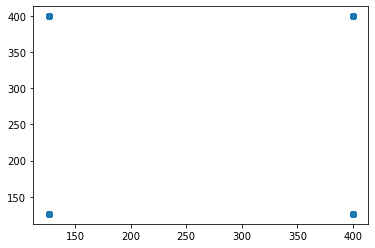

t+1 vs t-610


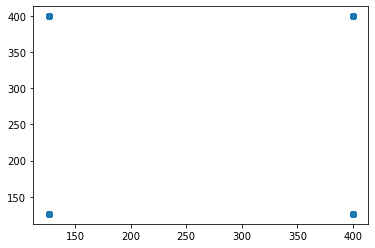

t+1 vs t-611


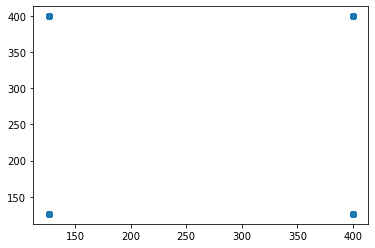

t+1 vs t-612


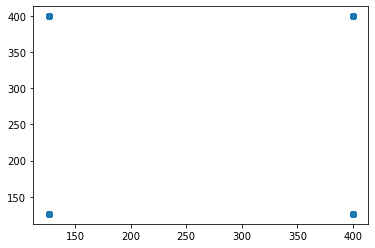

t+1 vs t-613


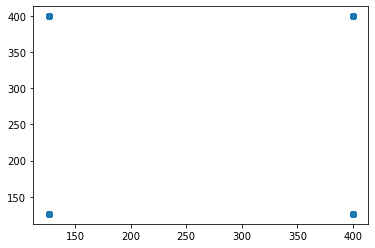

t+1 vs t-614


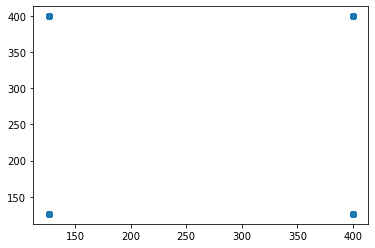

t+1 vs t-615


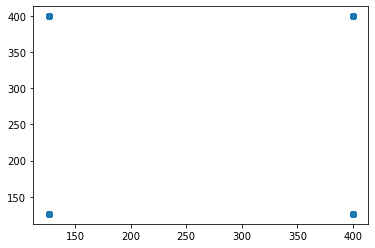

t+1 vs t-616


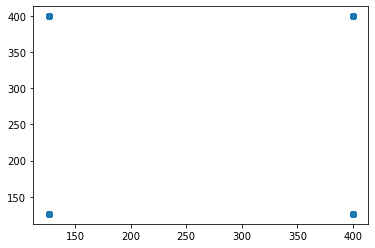

t+1 vs t-617


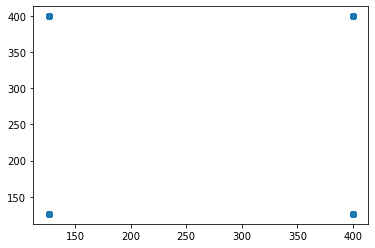

t+1 vs t-618


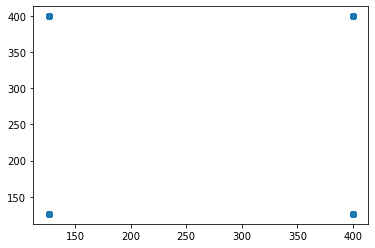

t+1 vs t-619


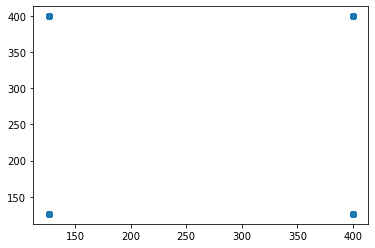

t+1 vs t-620


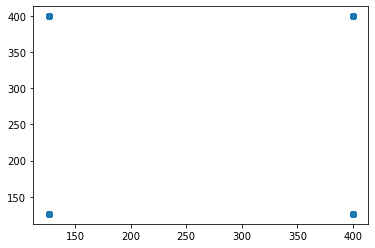

t+1 vs t-621


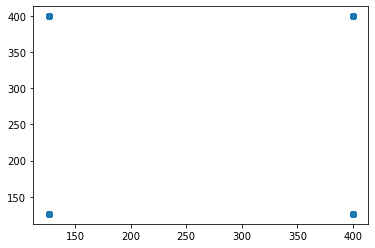

t+1 vs t-622


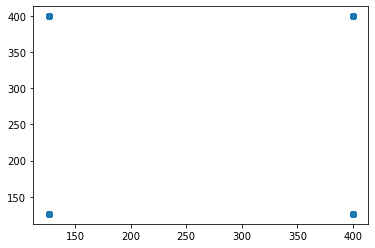

t+1 vs t-623


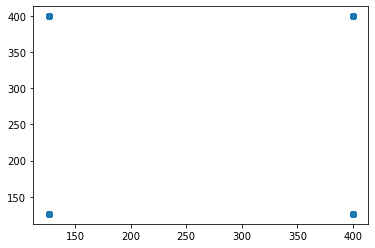

t+1 vs t-624


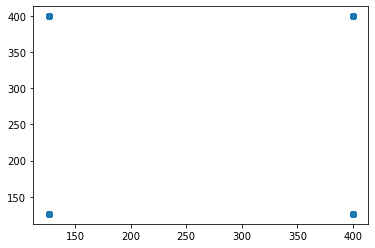

t+1 vs t-625


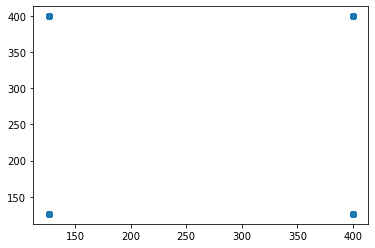

t+1 vs t-626


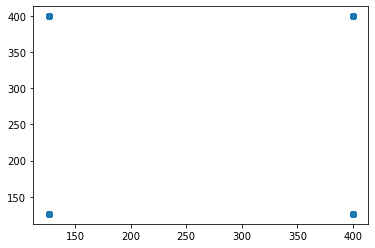

t+1 vs t-627


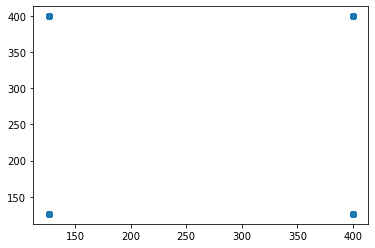

t+1 vs t-628


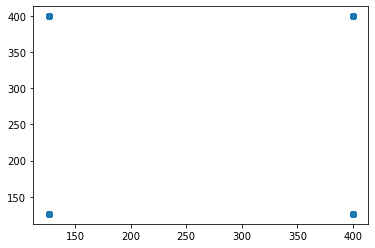

t+1 vs t-629


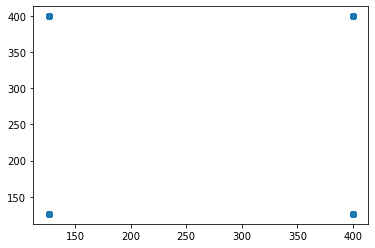

t+1 vs t-630


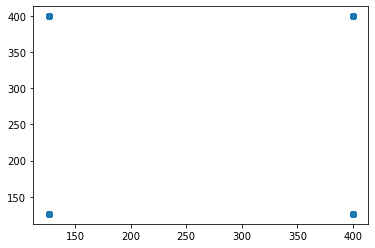

t+1 vs t-631


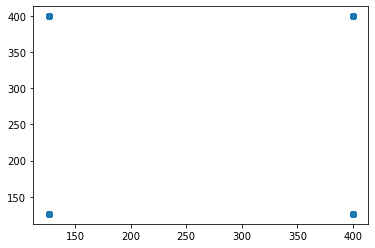

t+1 vs t-632


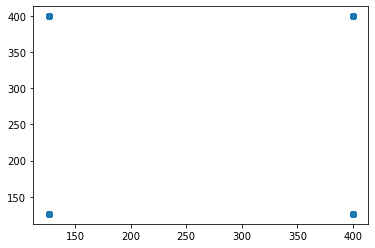

t+1 vs t-633


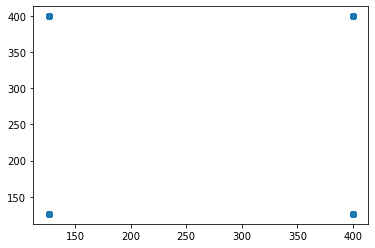

t+1 vs t-634


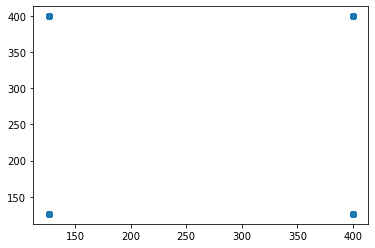

t+1 vs t-635


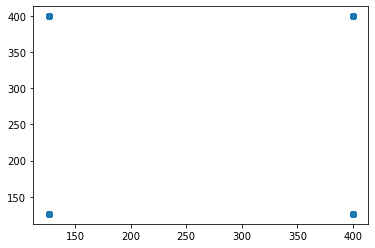

t+1 vs t-636


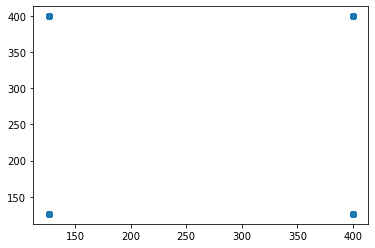

t+1 vs t-637


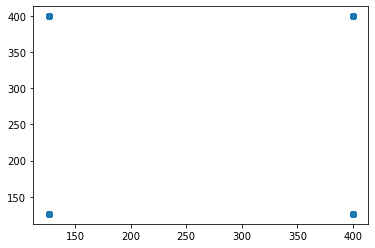

t+1 vs t-638


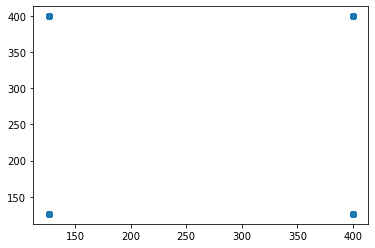

t+1 vs t-639


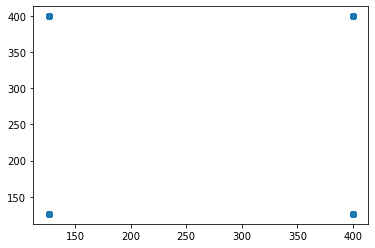

t+1 vs t-640


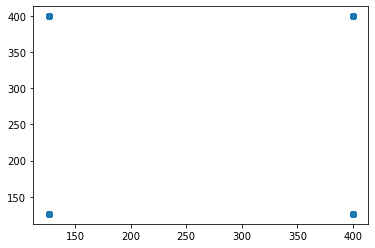

t+1 vs t-641


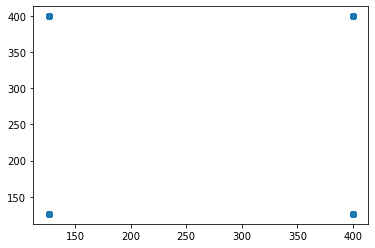

t+1 vs t-642


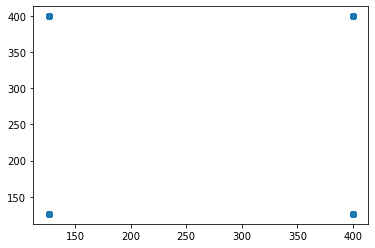

t+1 vs t-643


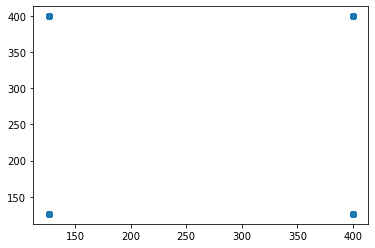

t+1 vs t-644


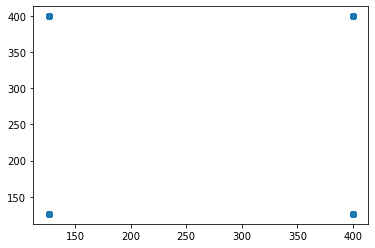

t+1 vs t-645


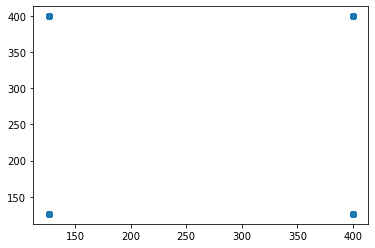

t+1 vs t-646


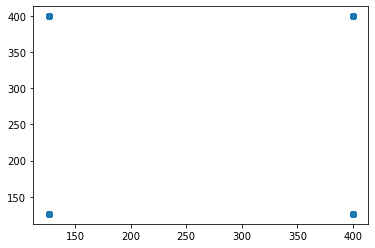

t+1 vs t-647


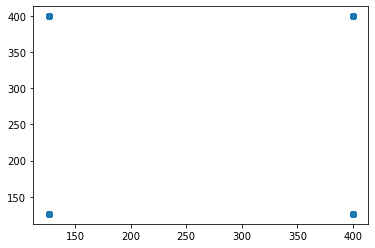

t+1 vs t-648


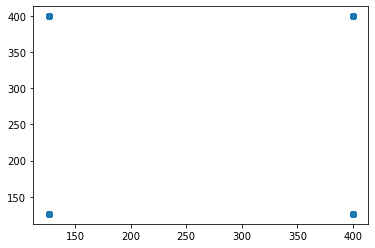

t+1 vs t-649


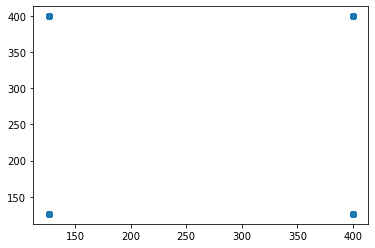

t+1 vs t-650


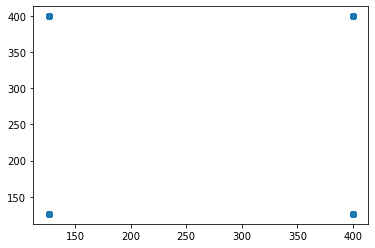

t+1 vs t-651


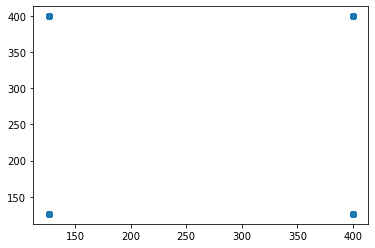

t+1 vs t-652


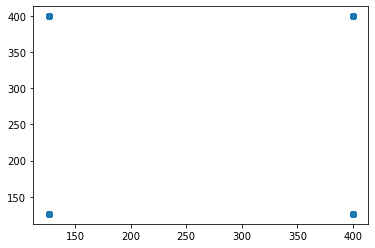

t+1 vs t-653


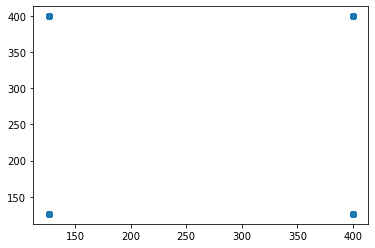

t+1 vs t-654


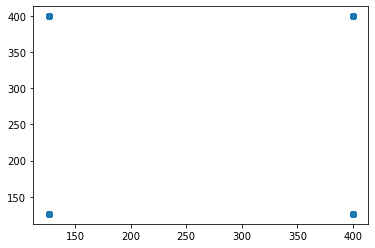

t+1 vs t-655


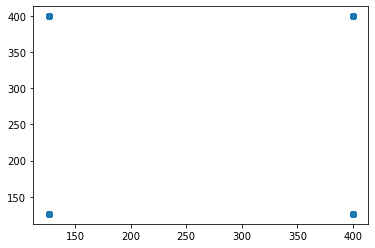

t+1 vs t-656


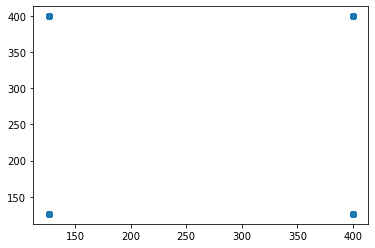

t+1 vs t-657


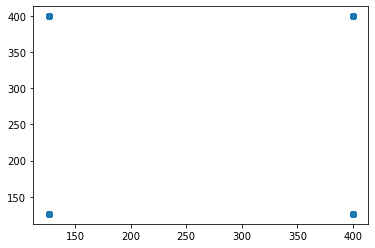

t+1 vs t-658


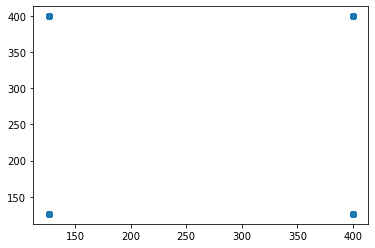

t+1 vs t-659


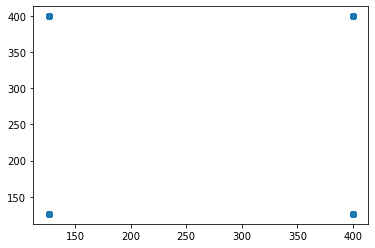

t+1 vs t-660


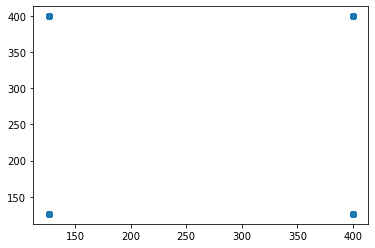

t+1 vs t-661


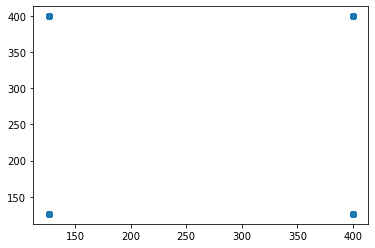

t+1 vs t-662


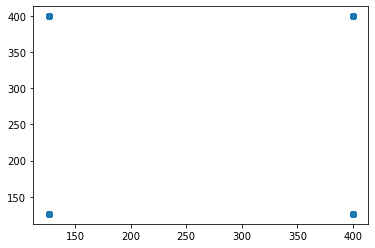

t+1 vs t-663


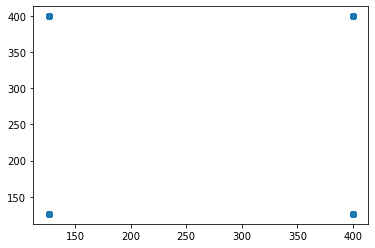

t+1 vs t-664


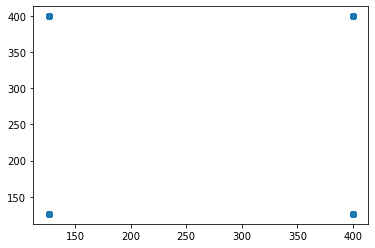

t+1 vs t-665


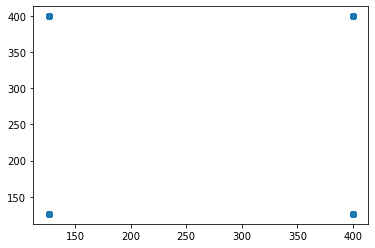

t+1 vs t-666


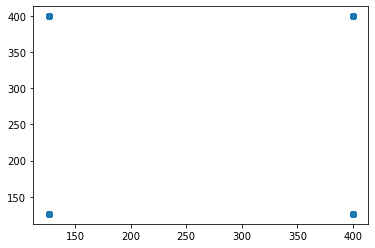

t+1 vs t-667


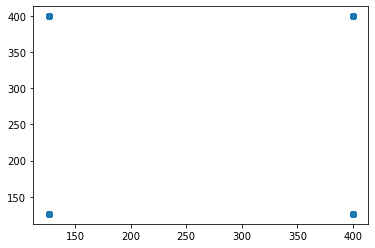

t+1 vs t-668


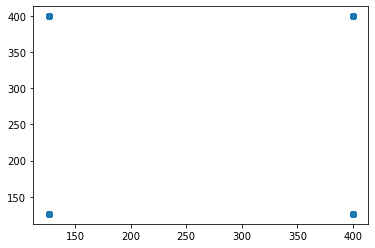

t+1 vs t-669


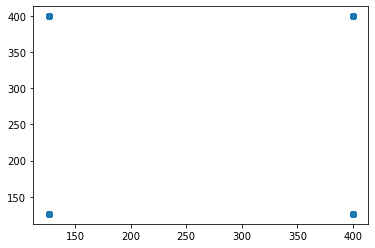

t+1 vs t-670


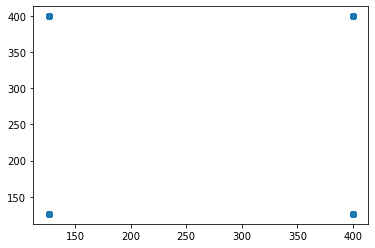

t+1 vs t-671


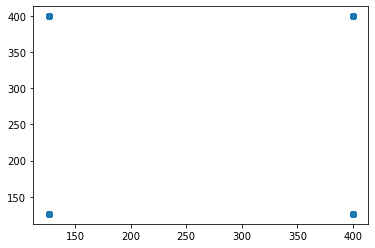

t+1 vs t-672


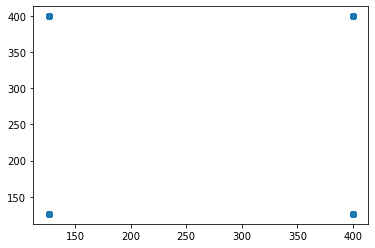

t+1 vs t-673


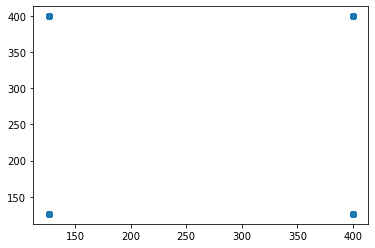

t+1 vs t-674


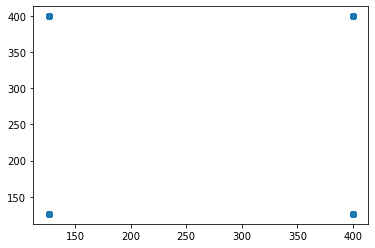

t+1 vs t-675


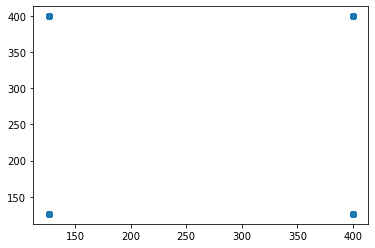

t+1 vs t-676


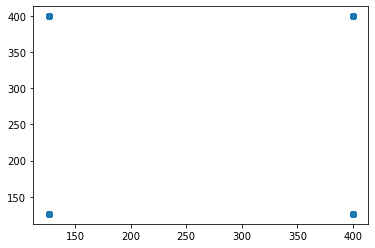

t+1 vs t-677


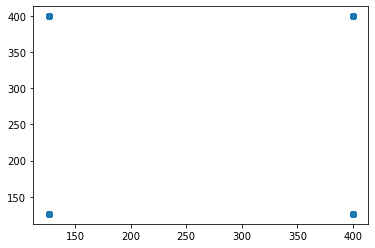

t+1 vs t-678


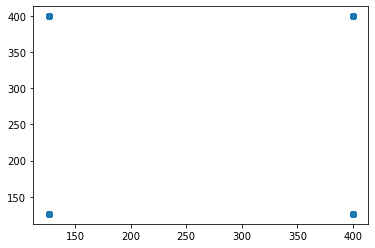

t+1 vs t-679


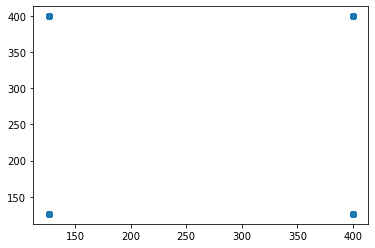

t+1 vs t-680


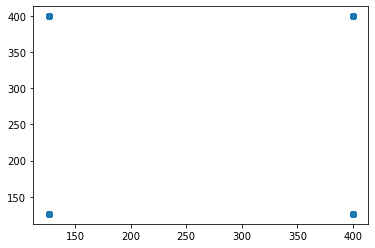

t+1 vs t-681


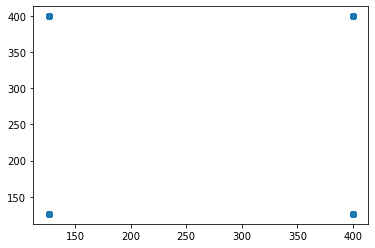

t+1 vs t-682


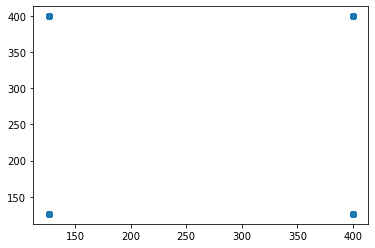

t+1 vs t-683


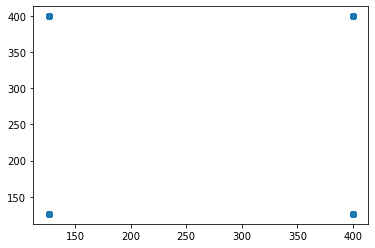

t+1 vs t-684


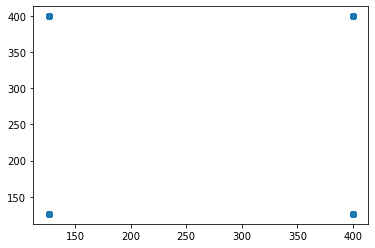

t+1 vs t-685


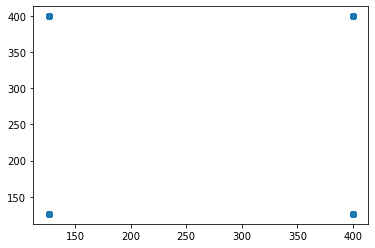

t+1 vs t-686


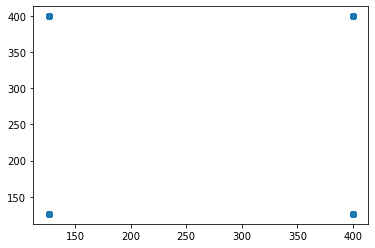

t+1 vs t-687


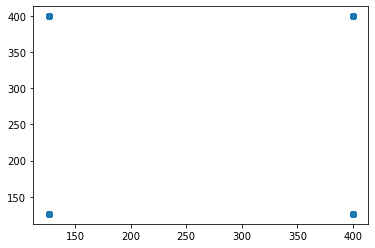

t+1 vs t-688


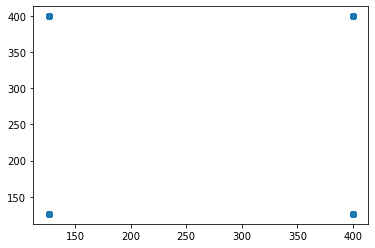

t+1 vs t-689


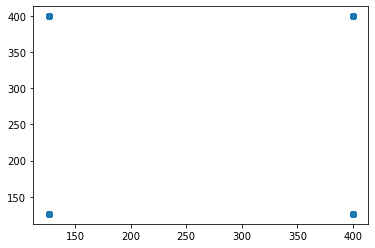

t+1 vs t-690


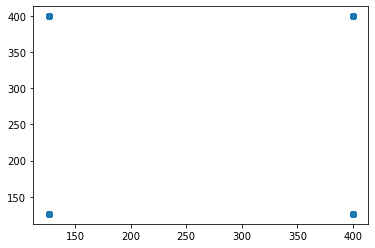

t+1 vs t-691


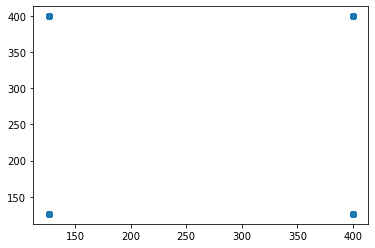

t+1 vs t-692


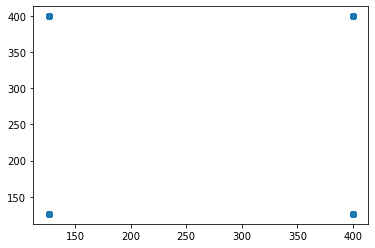

t+1 vs t-693


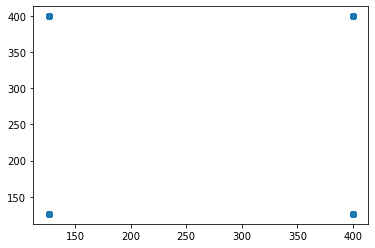

t+1 vs t-694


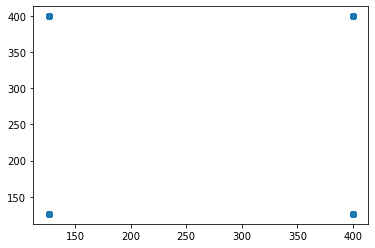

t+1 vs t-695


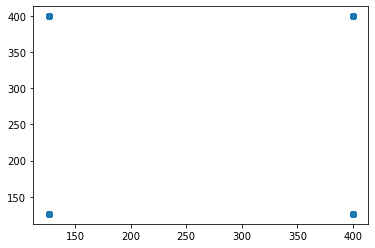

t+1 vs t-696


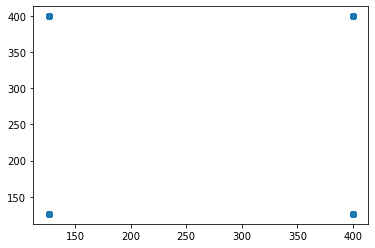

t+1 vs t-697


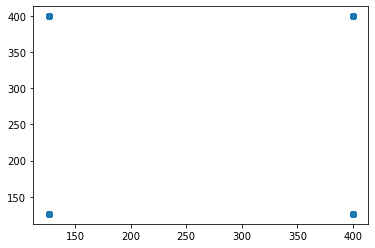

t+1 vs t-698


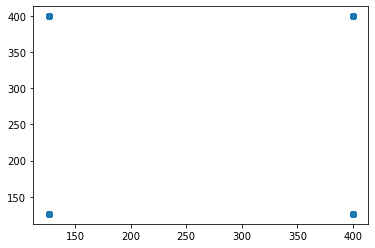

t+1 vs t-699


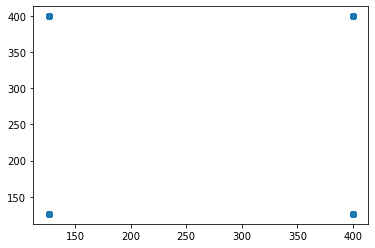

t+1 vs t-700


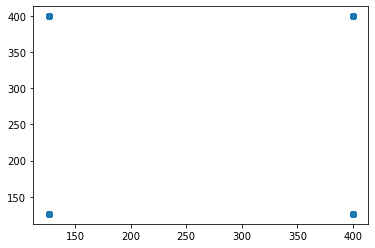

t+1 vs t-701


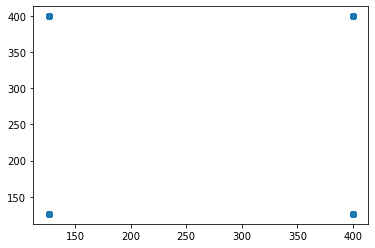

t+1 vs t-702


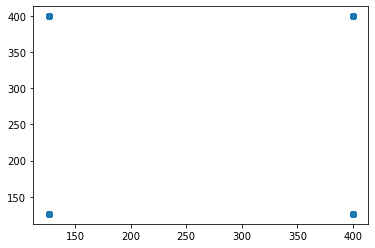

t+1 vs t-703


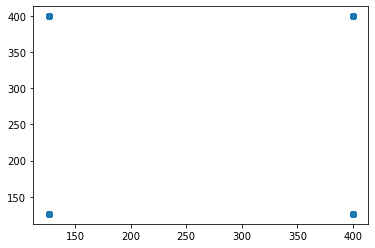

t+1 vs t-704


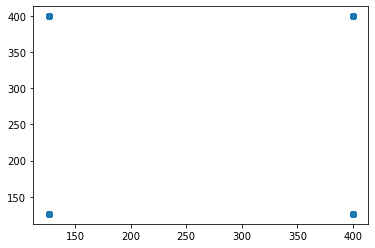

t+1 vs t-705


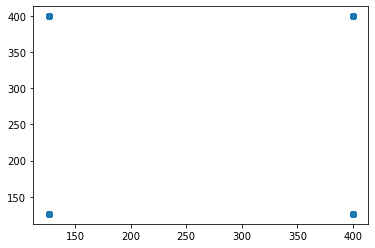

t+1 vs t-706


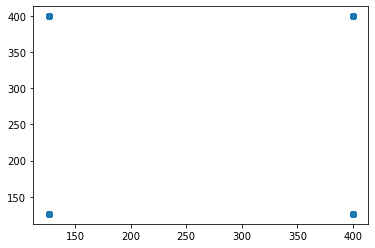

t+1 vs t-707


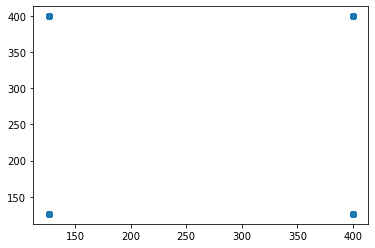

t+1 vs t-708


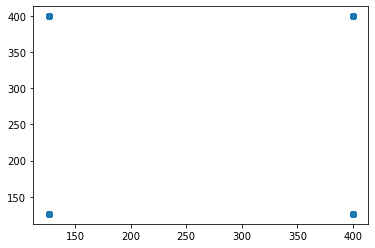

t+1 vs t-709


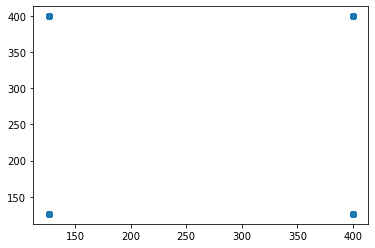

t+1 vs t-710


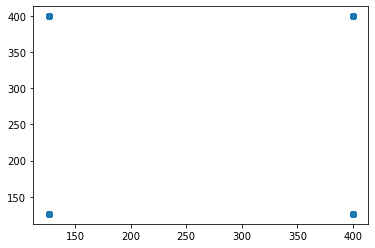

t+1 vs t-711


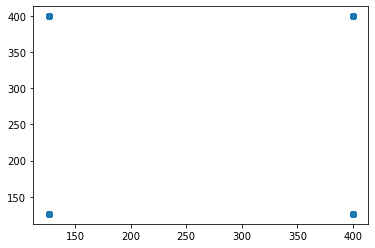

t+1 vs t-712


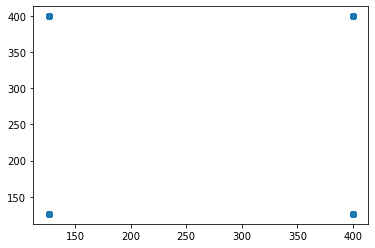

t+1 vs t-713


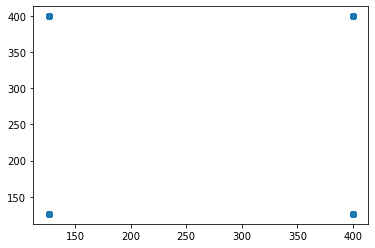

t+1 vs t-714


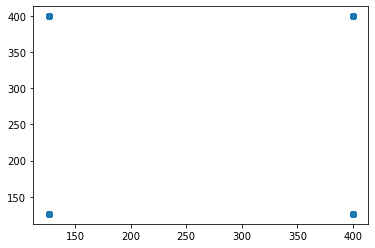

t+1 vs t-715


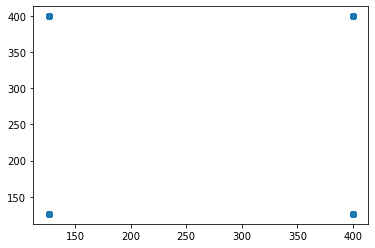

t+1 vs t-716


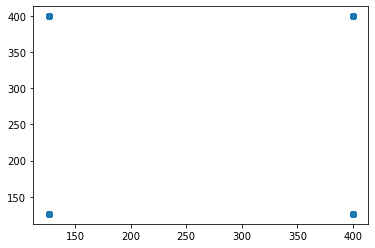

t+1 vs t-717


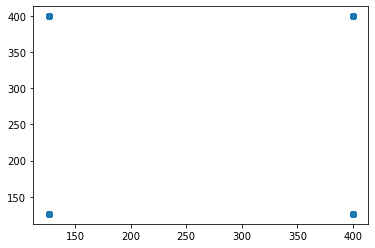

t+1 vs t-718


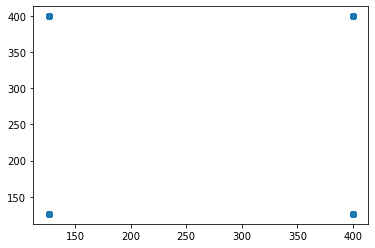

t+1 vs t-719


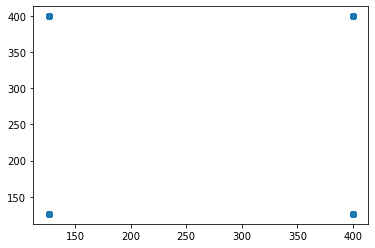

t+1 vs t-720


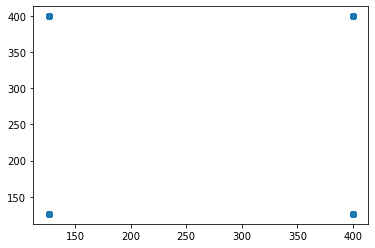

t+1 vs t-721


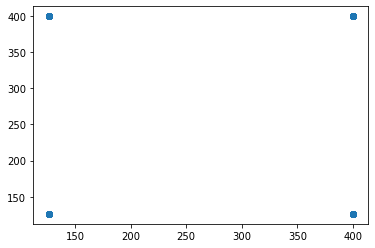

t+1 vs t-722


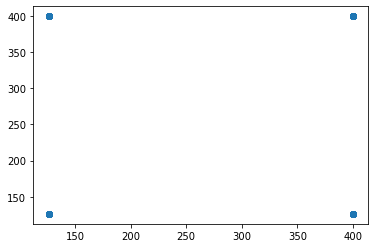

t+1 vs t-723


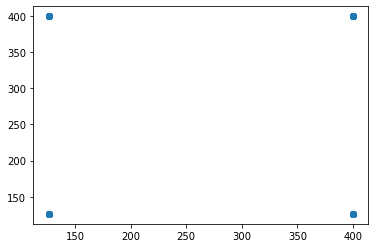

t+1 vs t-724


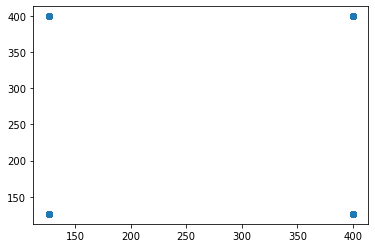

t+1 vs t-725


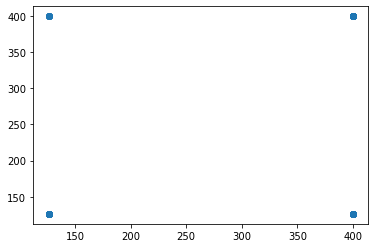

t+1 vs t-726


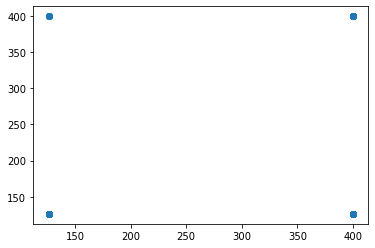

t+1 vs t-727


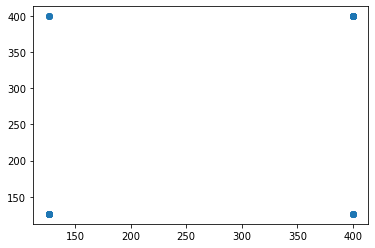

t+1 vs t-728


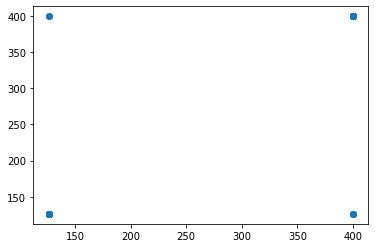

t+1 vs t-729


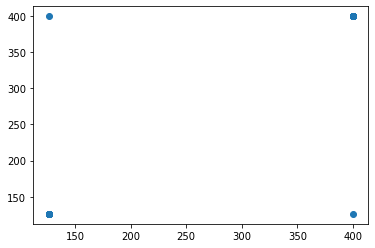

t+1 vs t-730


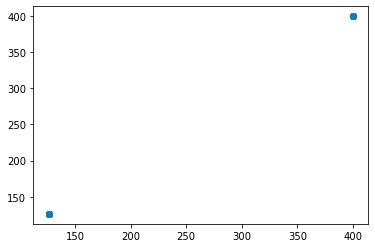

t+1 vs t-731


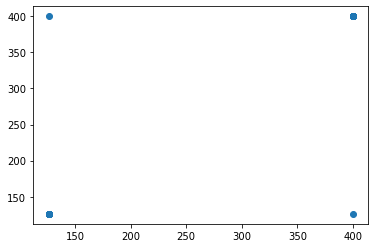

t+1 vs t-732


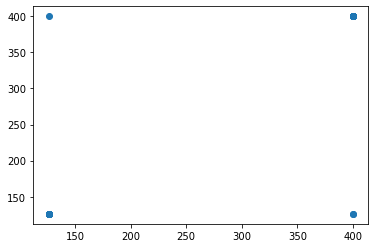

t+1 vs t-733


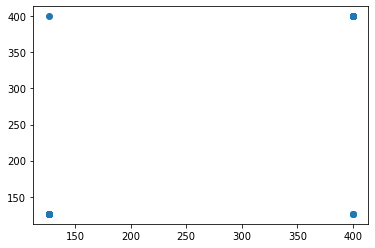

t+1 vs t-734


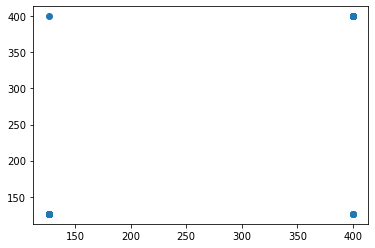

t+1 vs t-735


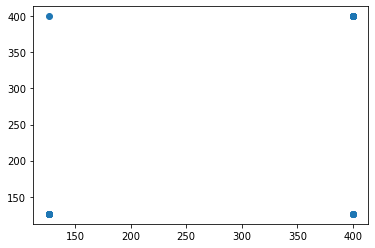

t+1 vs t-736


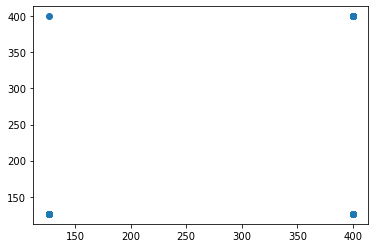

t+1 vs t-737


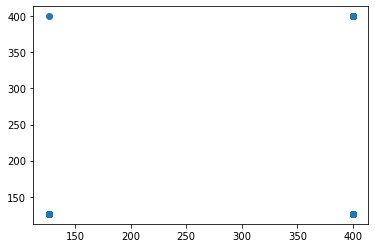

t+1 vs t-738


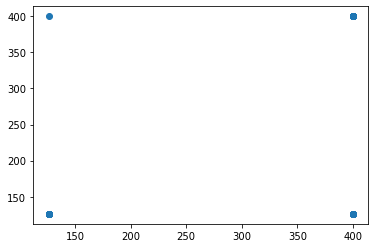

t+1 vs t-739


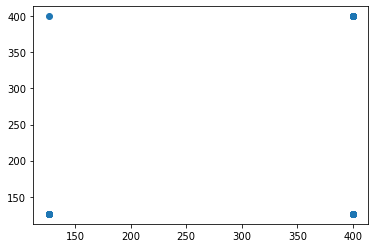

t+1 vs t-740


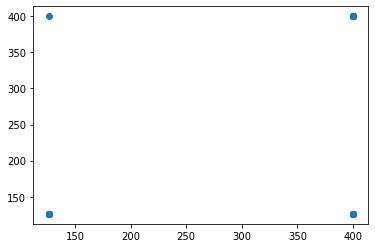

t+1 vs t-741


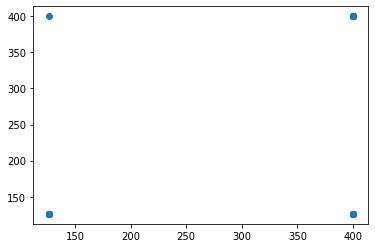

t+1 vs t-742


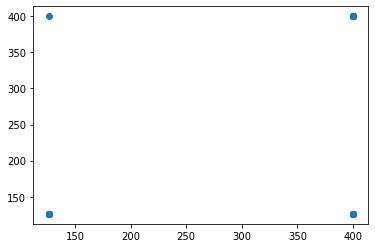

t+1 vs t-743


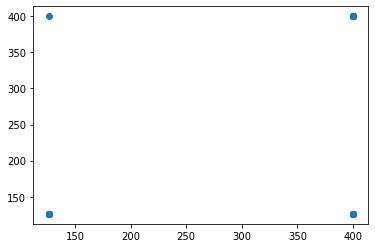

t+1 vs t-744


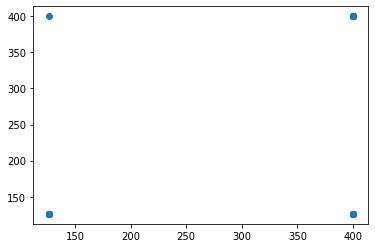

t+1 vs t-745


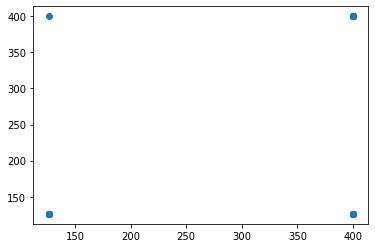

t+1 vs t-746


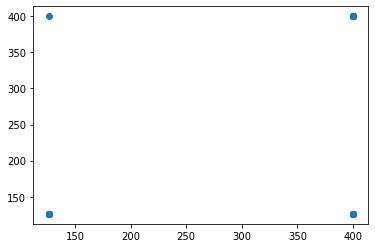

t+1 vs t-747


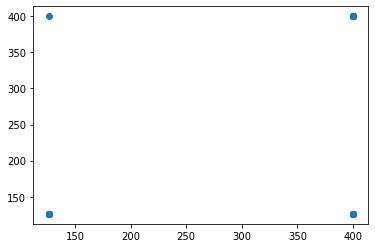

t+1 vs t-748


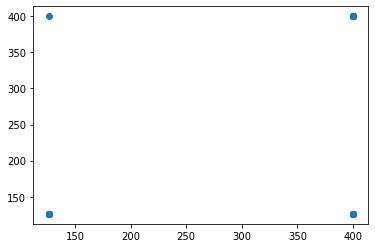

t+1 vs t-749


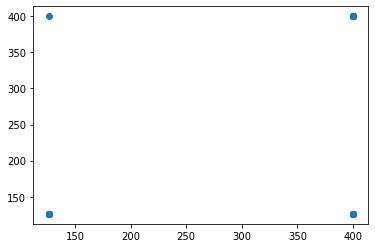

t+1 vs t-750


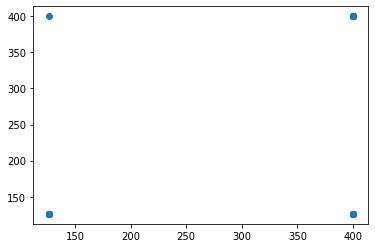

t+1 vs t-751


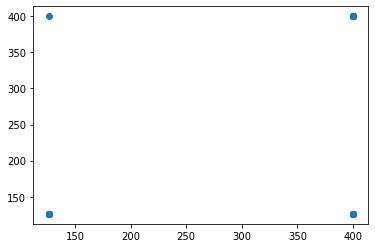

t+1 vs t-752


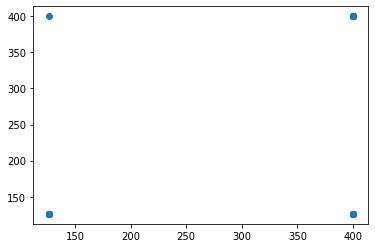

t+1 vs t-753


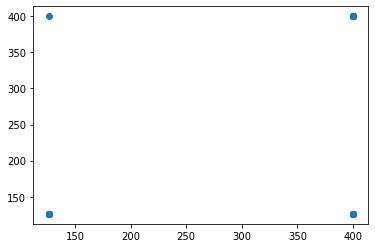

t+1 vs t-754


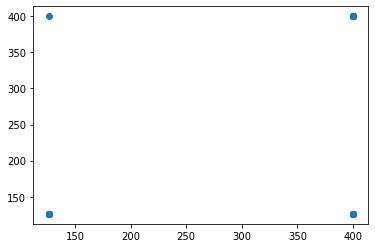

t+1 vs t-755


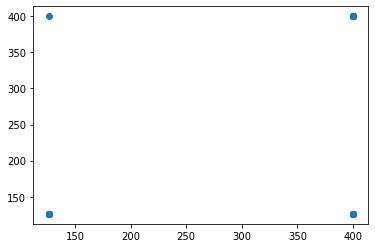

t+1 vs t-756


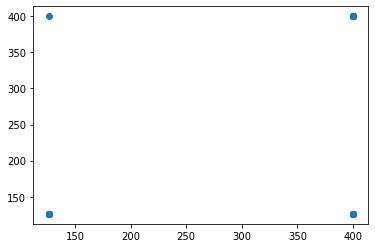

t+1 vs t-757


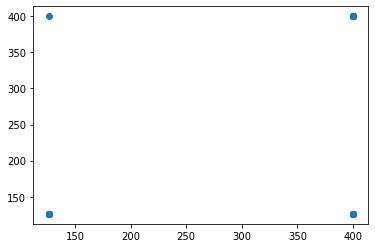

t+1 vs t-758


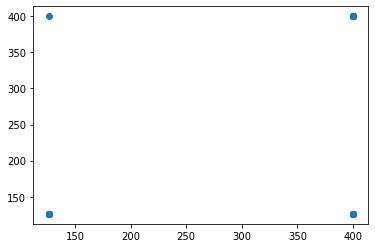

t+1 vs t-759


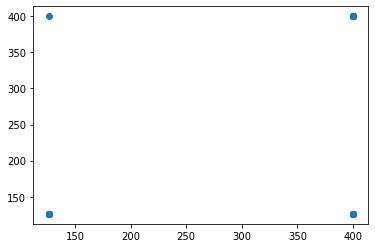

t+1 vs t-760


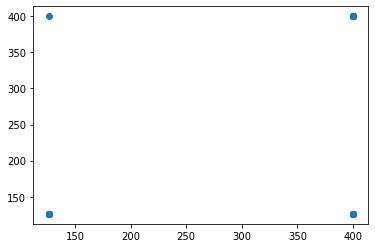

t+1 vs t-761


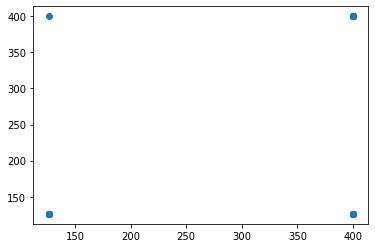

t+1 vs t-762


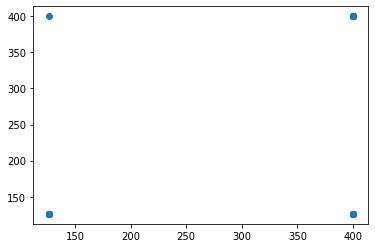

t+1 vs t-763


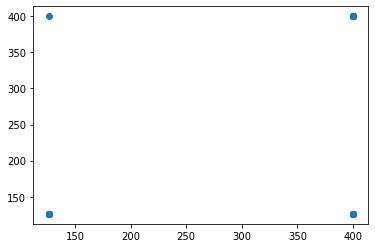

t+1 vs t-764


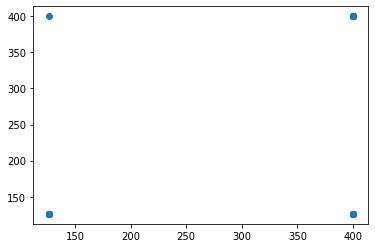

t+1 vs t-765


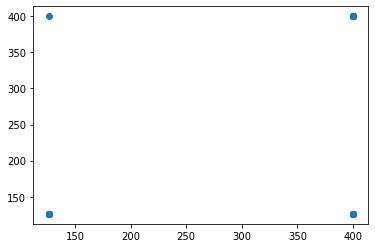

t+1 vs t-766


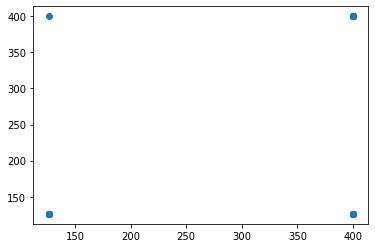

t+1 vs t-767


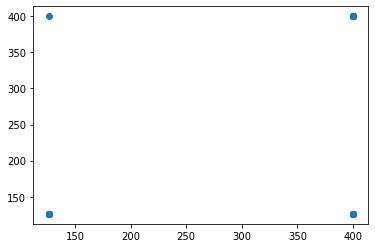

t+1 vs t-768


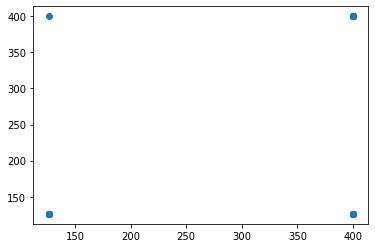

t+1 vs t-769


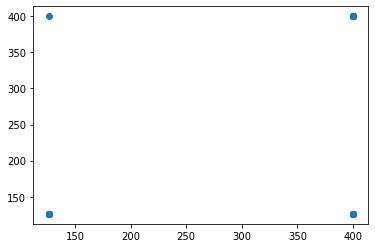

t+1 vs t-770


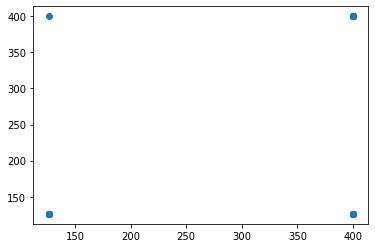

t+1 vs t-771


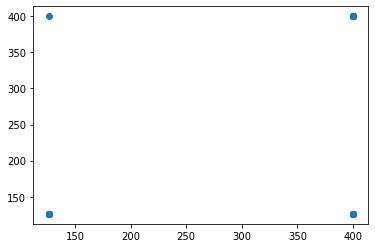

t+1 vs t-772


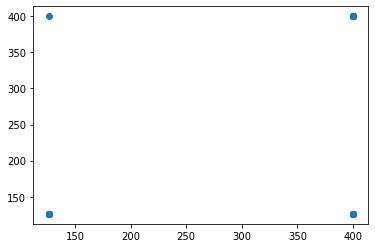

t+1 vs t-773


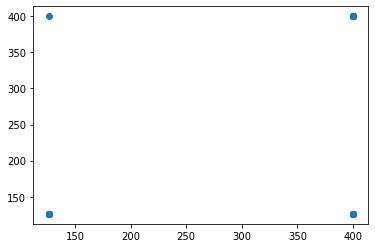

t+1 vs t-774


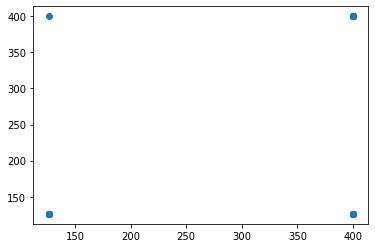

t+1 vs t-775


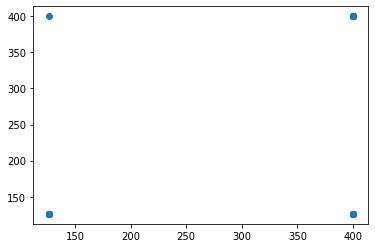

t+1 vs t-776


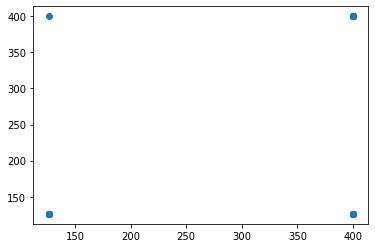

t+1 vs t-777


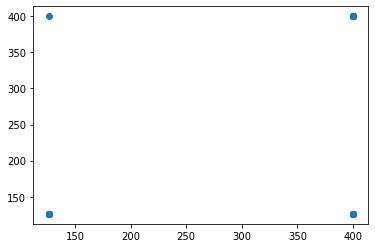

t+1 vs t-778


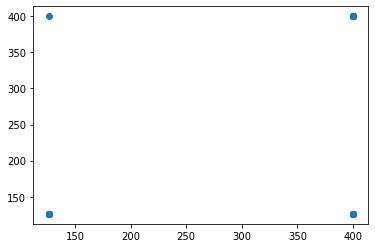

t+1 vs t-779


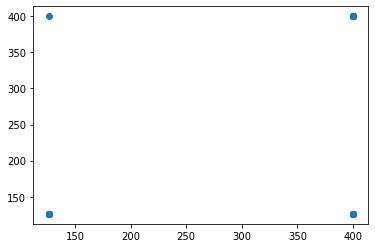

t+1 vs t-780


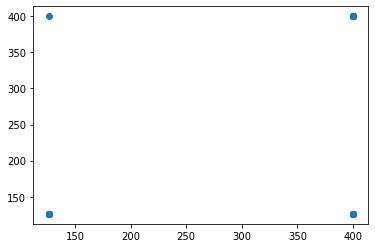

t+1 vs t-781


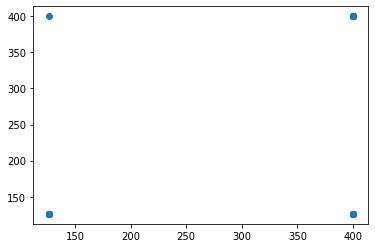

t+1 vs t-782


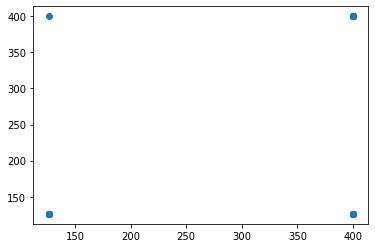

t+1 vs t-783


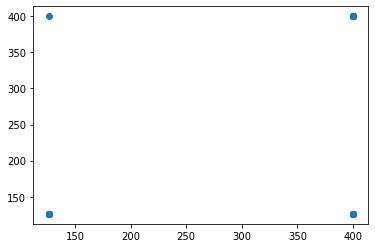

t+1 vs t-784


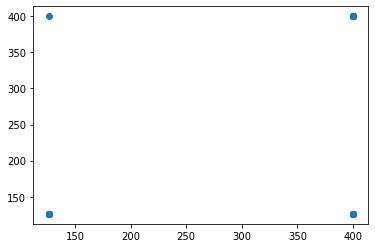

t+1 vs t-785


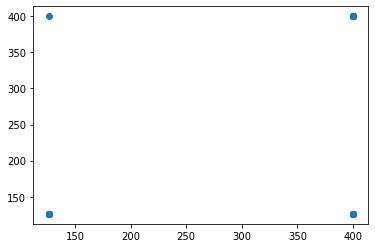

t+1 vs t-786


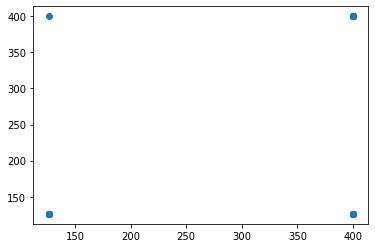

t+1 vs t-787


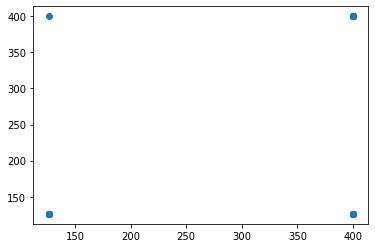

t+1 vs t-788


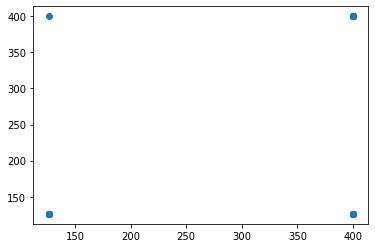

t+1 vs t-789


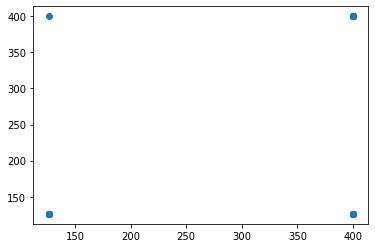

t+1 vs t-790


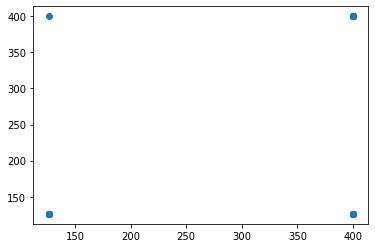

t+1 vs t-791


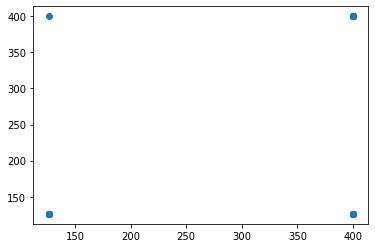

t+1 vs t-792


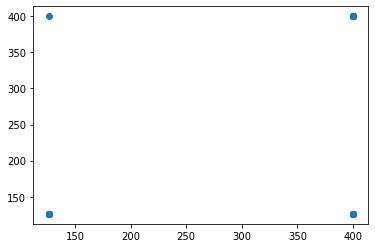

t+1 vs t-793


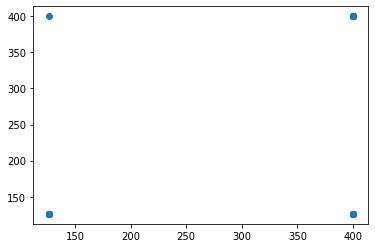

t+1 vs t-794


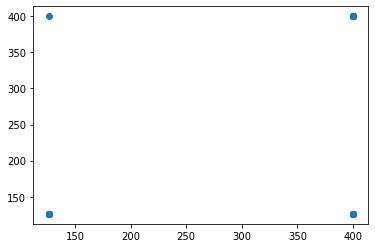

t+1 vs t-795


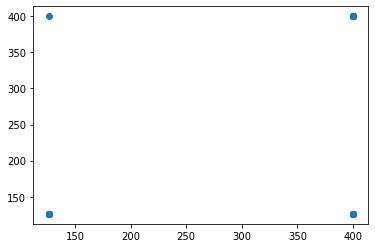

t+1 vs t-796


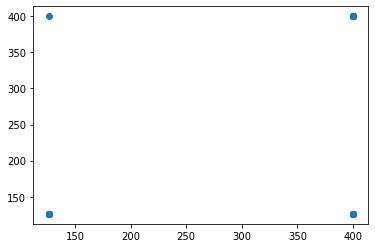

t+1 vs t-797


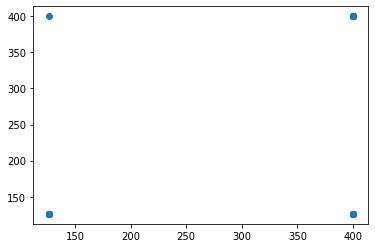

t+1 vs t-798


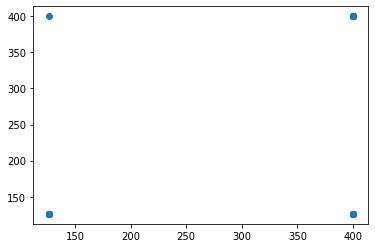

t+1 vs t-799


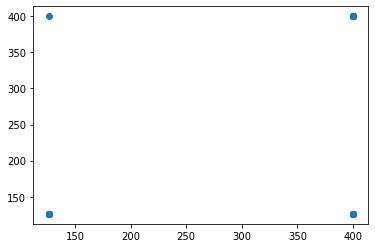

t+1 vs t-800


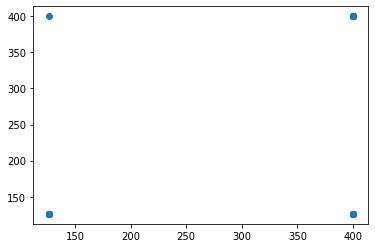

t+1 vs t-801


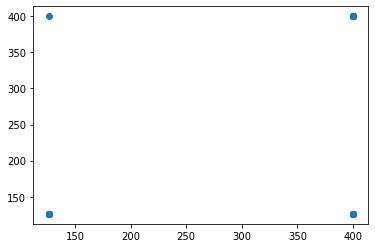

t+1 vs t-802


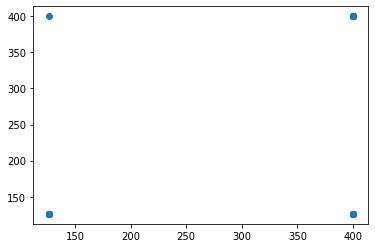

t+1 vs t-803


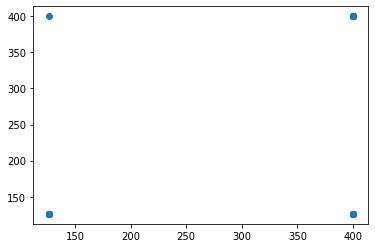

t+1 vs t-804


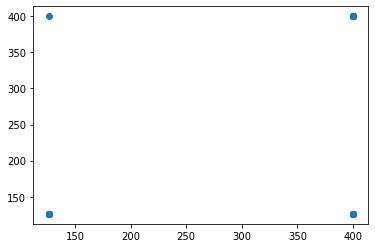

t+1 vs t-805


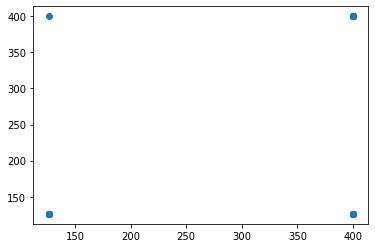

t+1 vs t-806


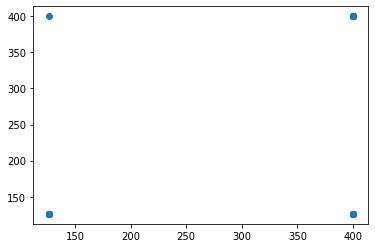

t+1 vs t-807


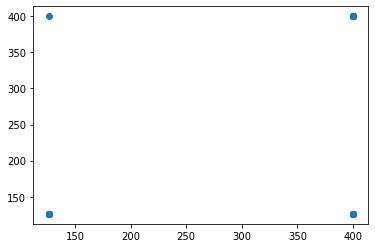

t+1 vs t-808


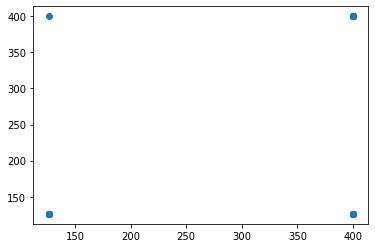

t+1 vs t-809


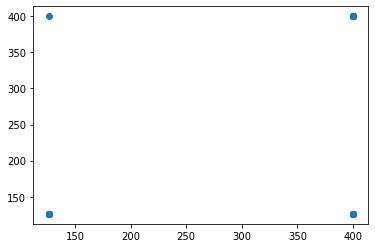

t+1 vs t-810


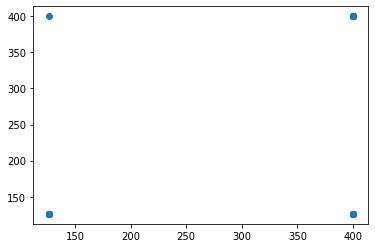

t+1 vs t-811


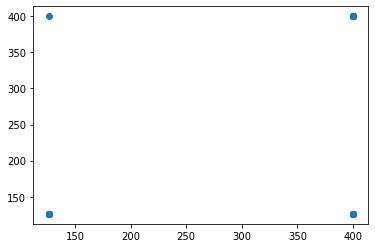

t+1 vs t-812


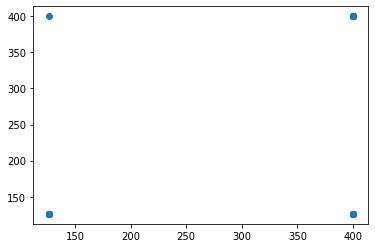

t+1 vs t-813


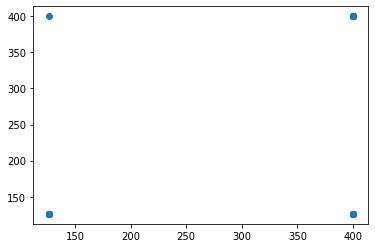

t+1 vs t-814


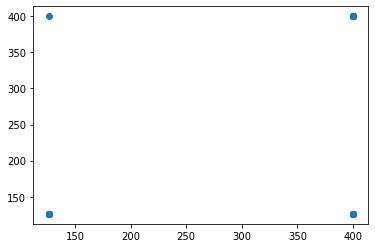

t+1 vs t-815


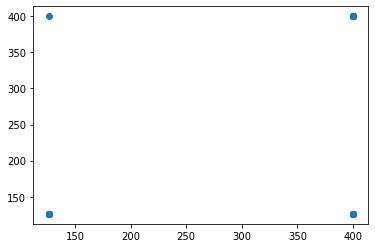

t+1 vs t-816


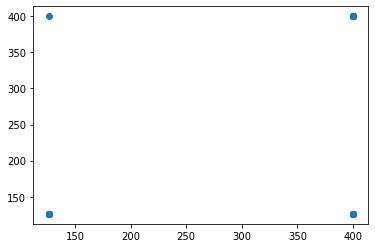

t+1 vs t-817


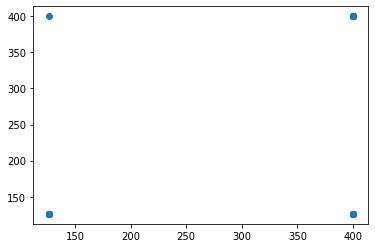

t+1 vs t-818


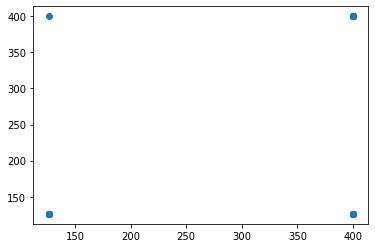

t+1 vs t-819


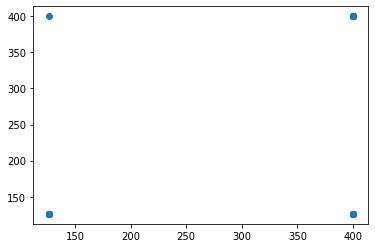

t+1 vs t-820


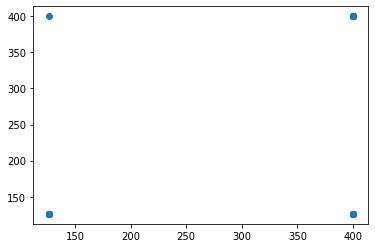

t+1 vs t-821


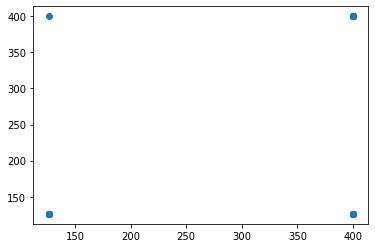

t+1 vs t-822


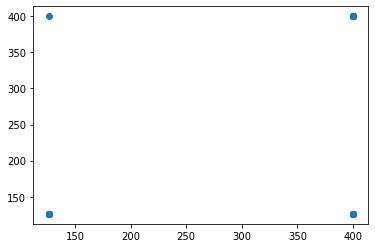

t+1 vs t-823


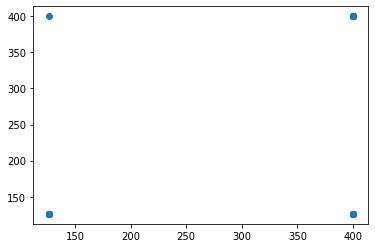

t+1 vs t-824


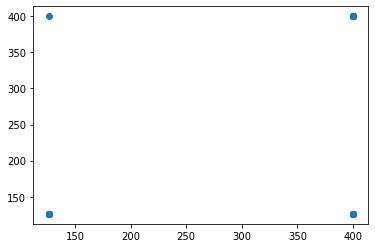

t+1 vs t-825


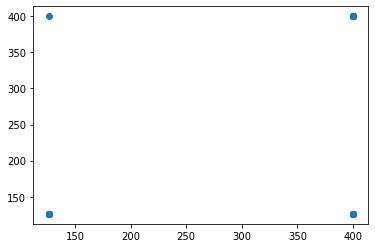

t+1 vs t-826


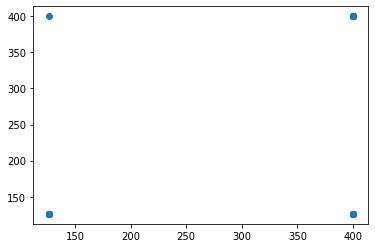

t+1 vs t-827


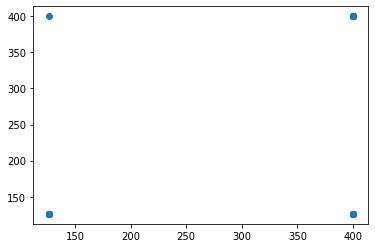

t+1 vs t-828


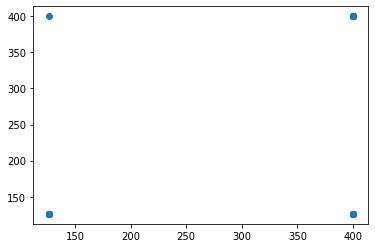

t+1 vs t-829


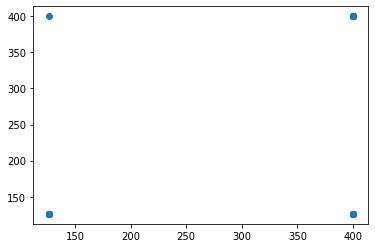

t+1 vs t-830


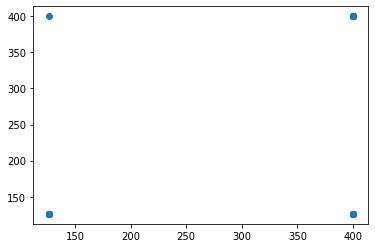

t+1 vs t-831


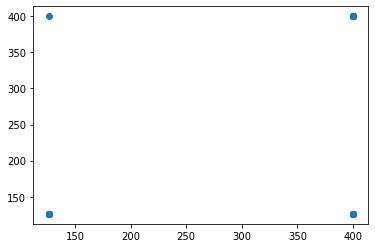

t+1 vs t-832


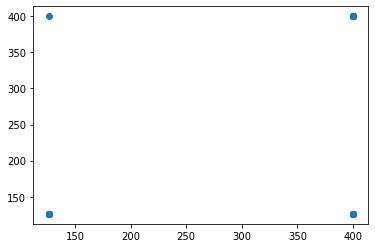

t+1 vs t-833


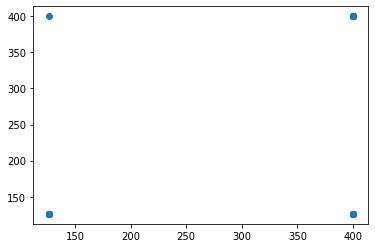

t+1 vs t-834


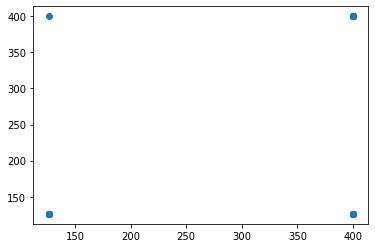

t+1 vs t-835


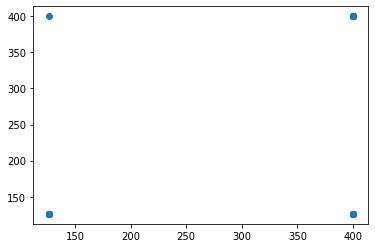

t+1 vs t-836


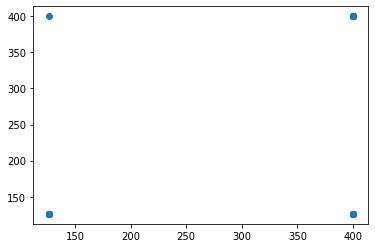

t+1 vs t-837


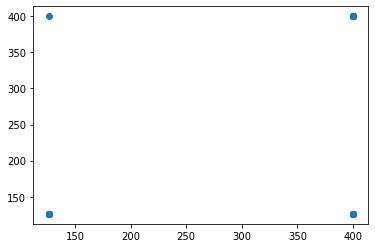

t+1 vs t-838


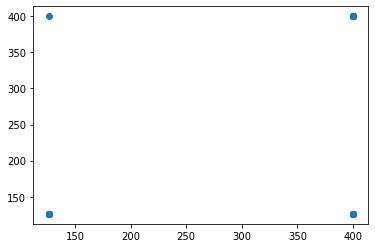

t+1 vs t-839


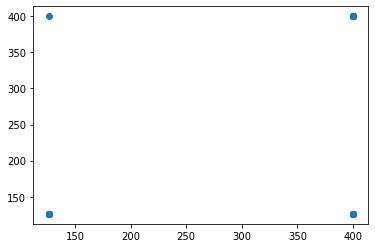

t+1 vs t-840


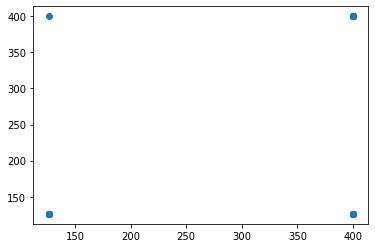

t+1 vs t-841


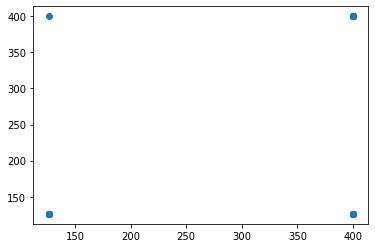

t+1 vs t-842


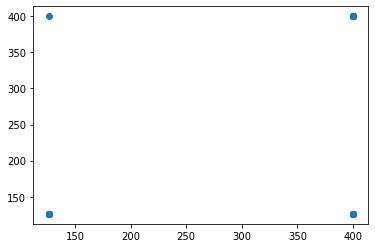

t+1 vs t-843


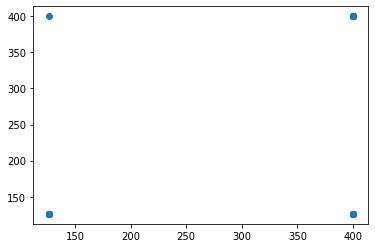

t+1 vs t-844


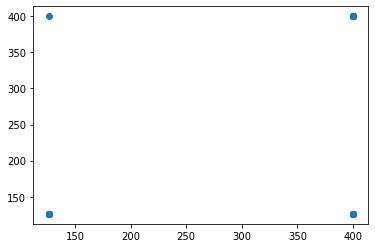

t+1 vs t-845


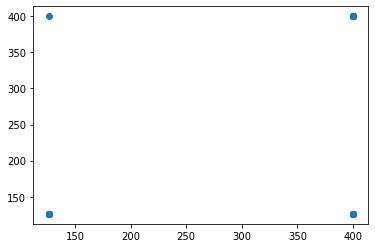

t+1 vs t-846


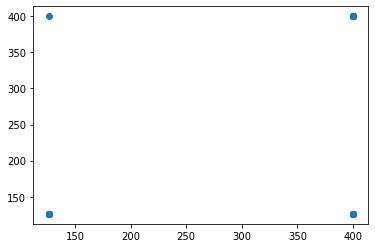

t+1 vs t-847


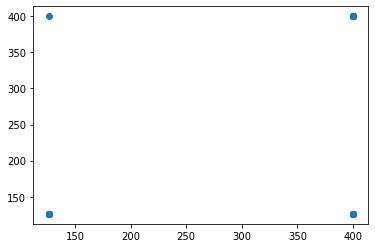

t+1 vs t-848


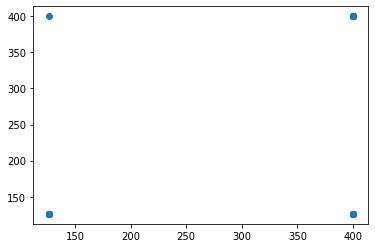

t+1 vs t-849


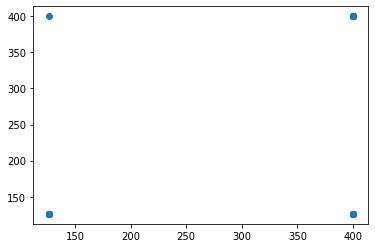

t+1 vs t-850


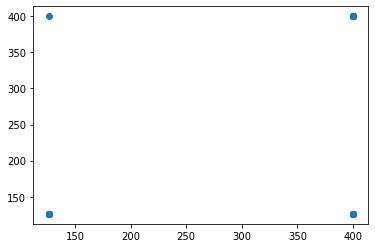

t+1 vs t-851


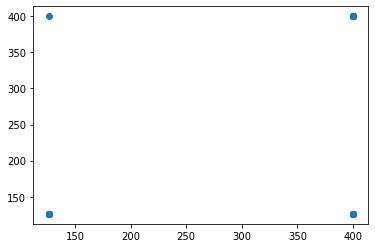

t+1 vs t-852


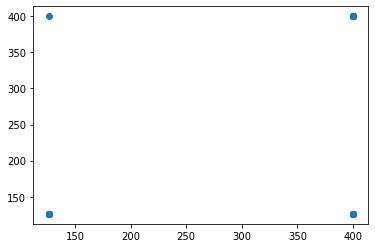

t+1 vs t-853


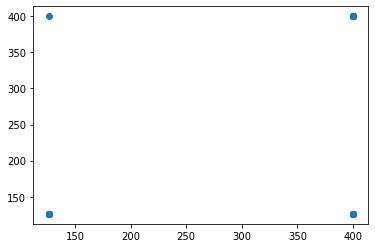

t+1 vs t-854


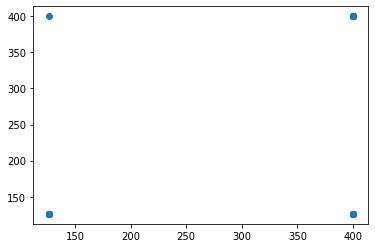

t+1 vs t-855


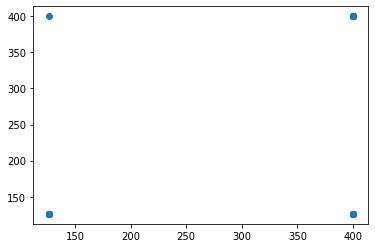

t+1 vs t-856


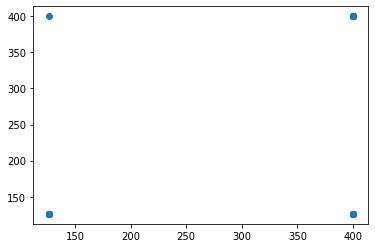

t+1 vs t-857


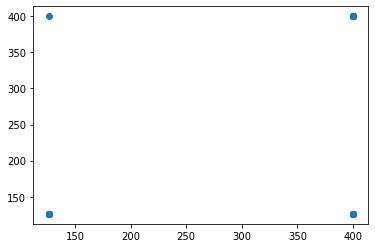

t+1 vs t-858


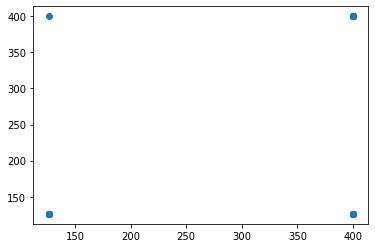

t+1 vs t-859


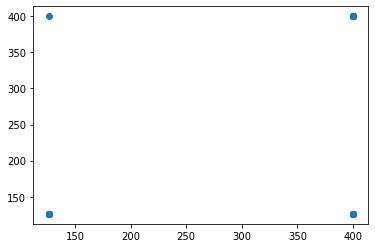

t+1 vs t-860


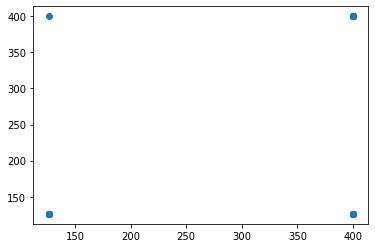

t+1 vs t-861


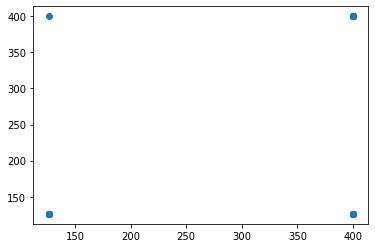

t+1 vs t-862


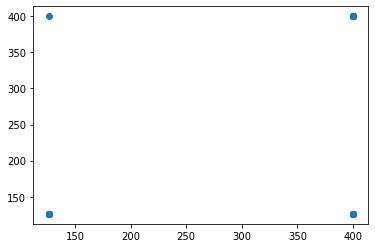

t+1 vs t-863


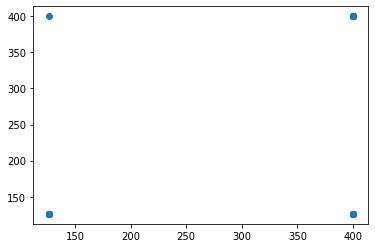

t+1 vs t-864


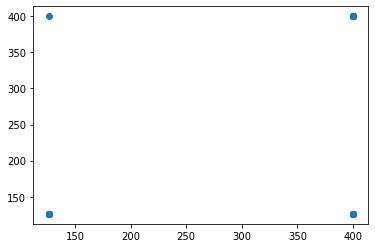

t+1 vs t-865


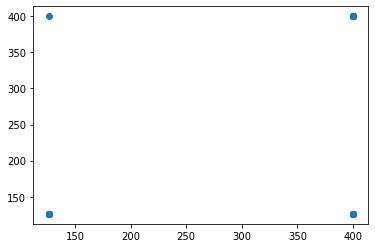

t+1 vs t-866


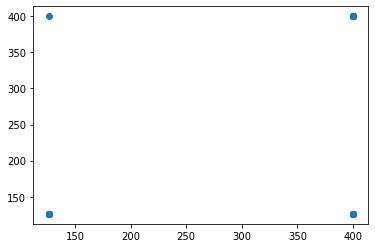

t+1 vs t-867


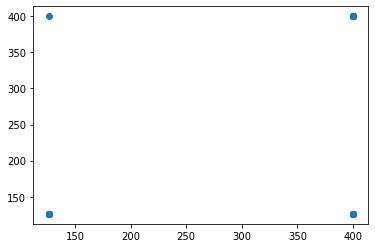

t+1 vs t-868


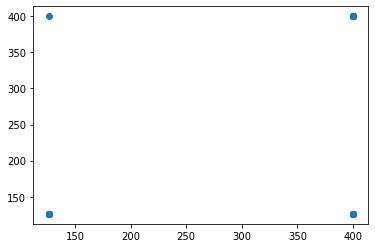

t+1 vs t-869


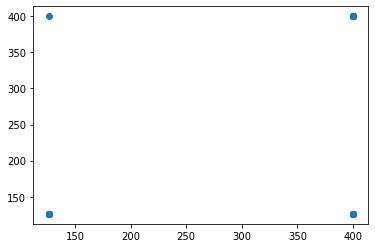

t+1 vs t-870


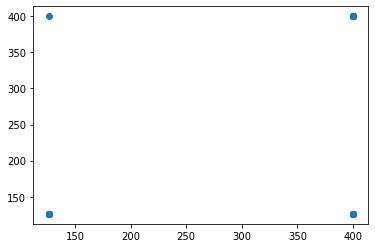

t+1 vs t-871


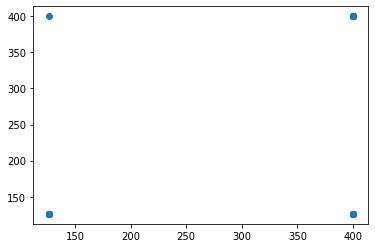

t+1 vs t-872


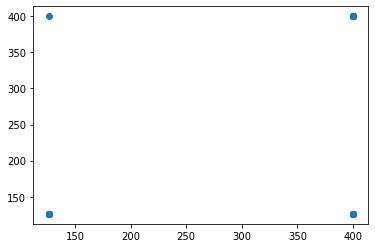

t+1 vs t-873


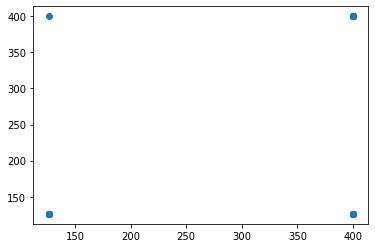

t+1 vs t-874


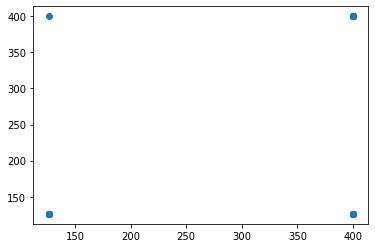

t+1 vs t-875


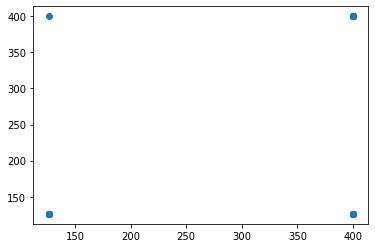

t+1 vs t-876


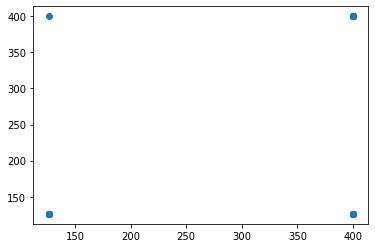

t+1 vs t-877


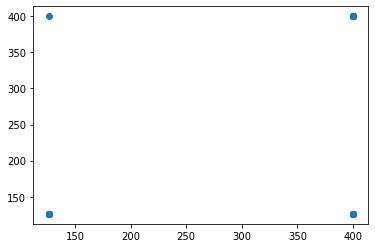

t+1 vs t-878


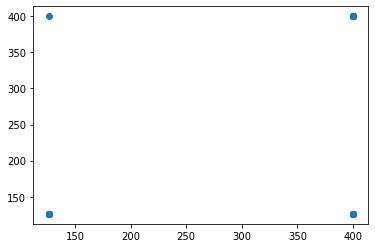

t+1 vs t-879


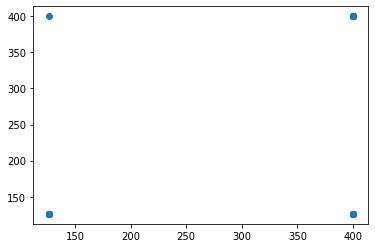

t+1 vs t-880


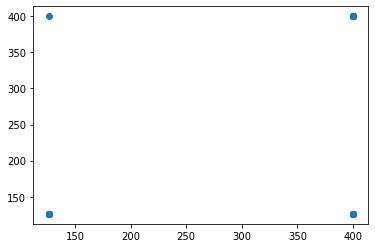

t+1 vs t-881


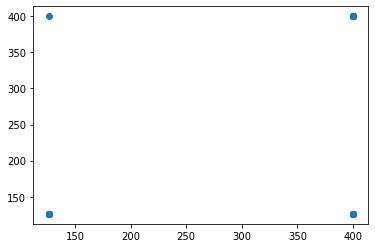

t+1 vs t-882


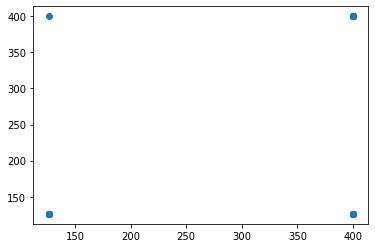

t+1 vs t-883


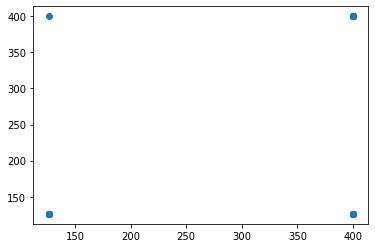

t+1 vs t-884


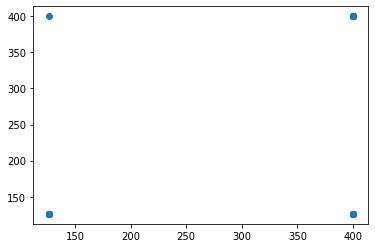

t+1 vs t-885


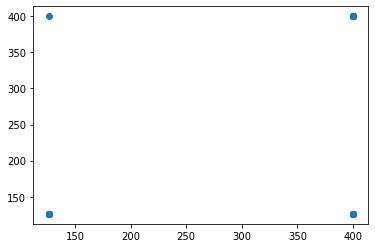

t+1 vs t-886


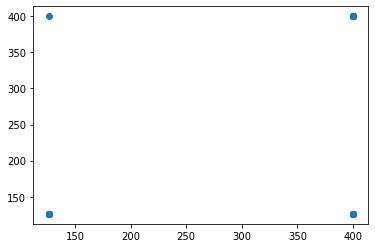

t+1 vs t-887


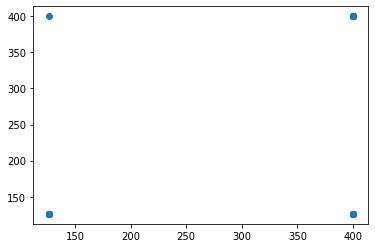

t+1 vs t-888


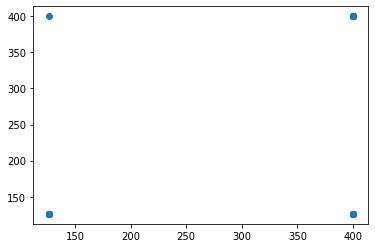

t+1 vs t-889


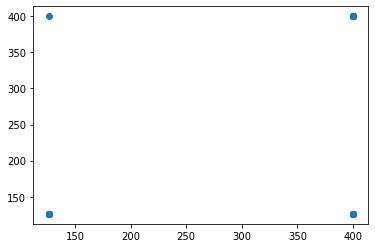

t+1 vs t-890


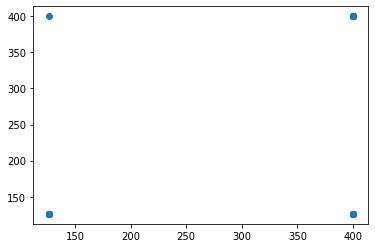

t+1 vs t-891


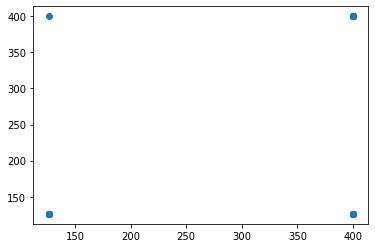

t+1 vs t-892


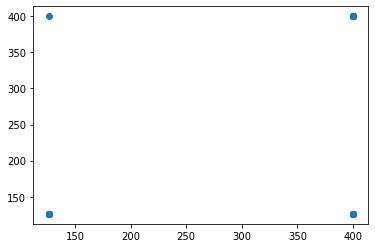

t+1 vs t-893


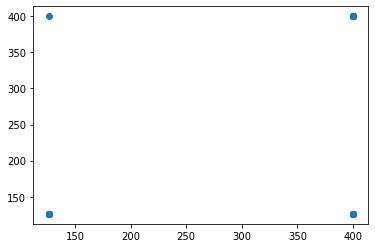

t+1 vs t-894


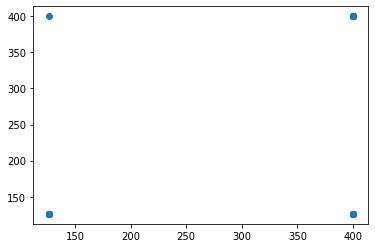

t+1 vs t-895


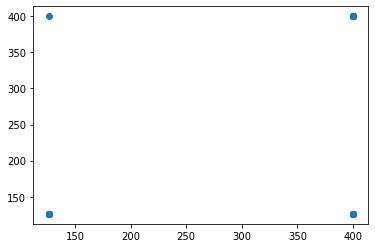

t+1 vs t-896


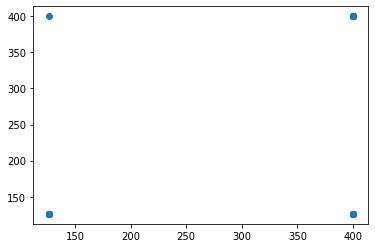

t+1 vs t-897


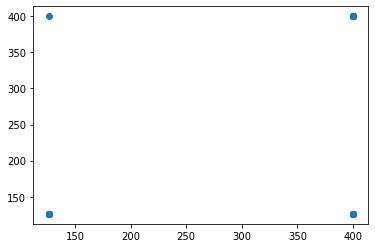

t+1 vs t-898


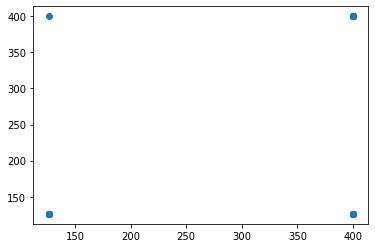

t+1 vs t-899


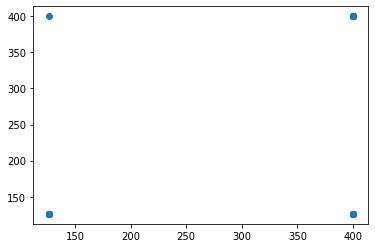

t+1 vs t-900


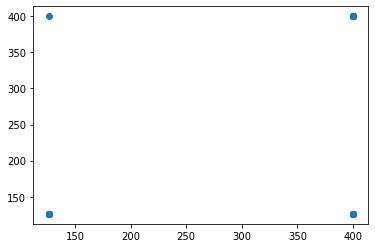

t+1 vs t-901


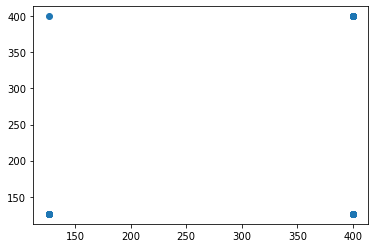

t+1 vs t-902


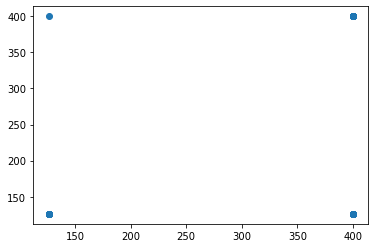

t+1 vs t-903


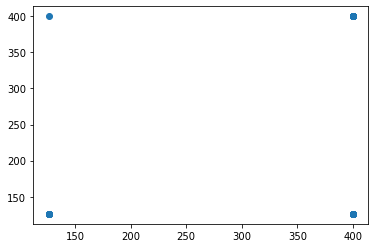

t+1 vs t-904


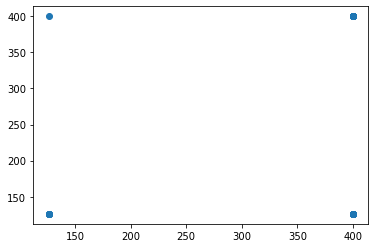

t+1 vs t-905


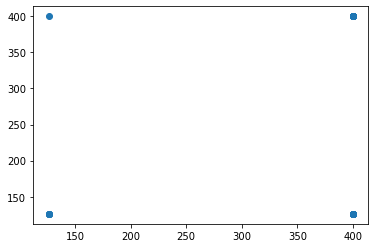

t+1 vs t-906


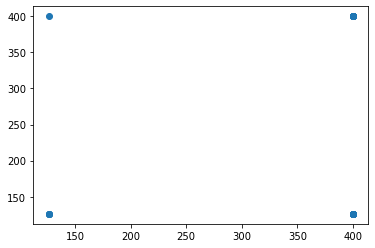

t+1 vs t-907


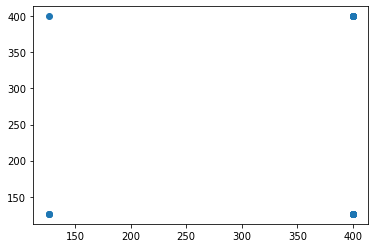

t+1 vs t-908


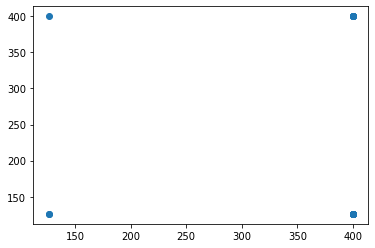

t+1 vs t-909


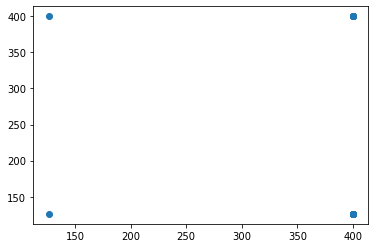

t+1 vs t-910


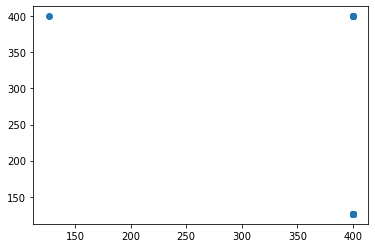

t+1 vs t-911


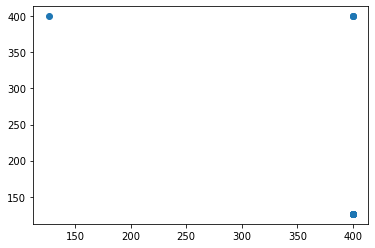

t+1 vs t-912


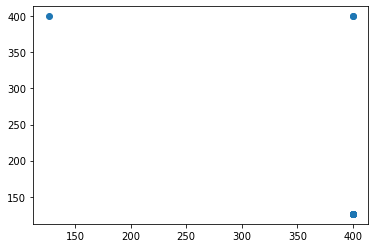

t+1 vs t-913


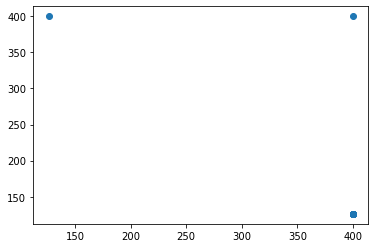

t+1 vs t-914


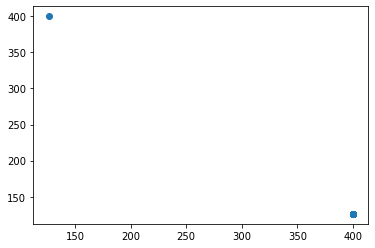

t+1 vs t-915


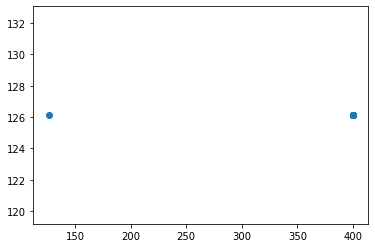

t+1 vs t-916


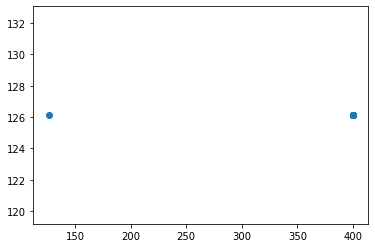

t+1 vs t-917


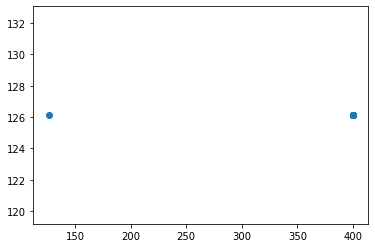

t+1 vs t-918


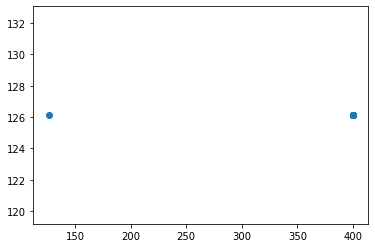

t+1 vs t-919


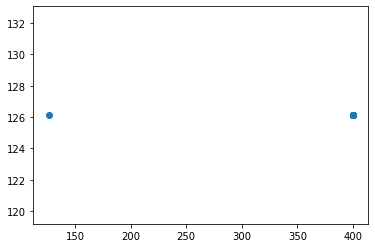

t+1 vs t-920


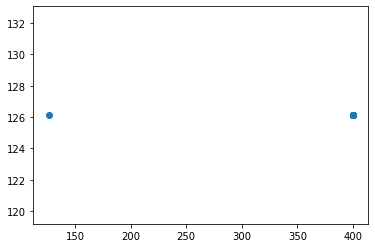

t+1 vs t-921


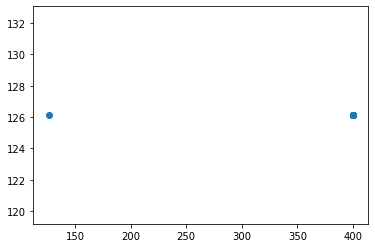

t+1 vs t-922


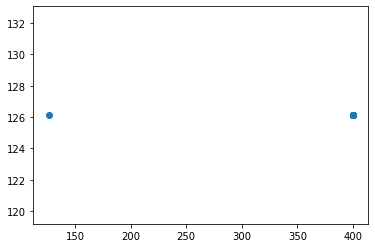

t+1 vs t-923


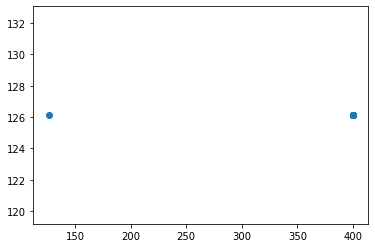

t+1 vs t-924


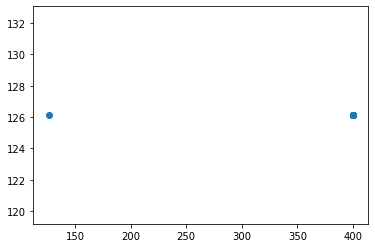

t+1 vs t-925


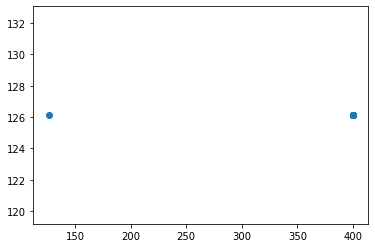

t+1 vs t-926


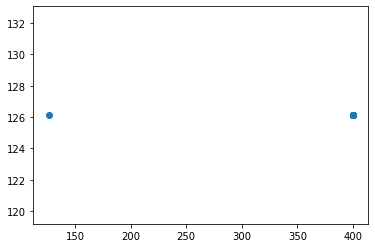

t+1 vs t-927


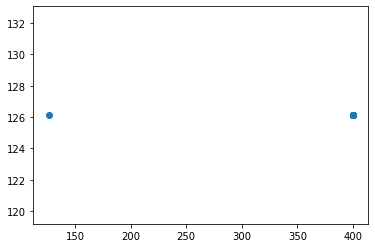

t+1 vs t-928


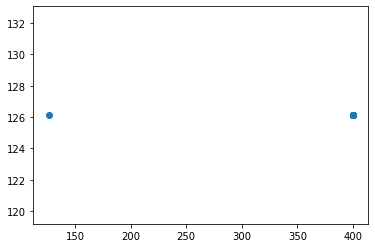

t+1 vs t-929


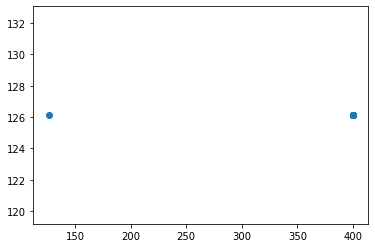

t+1 vs t-930


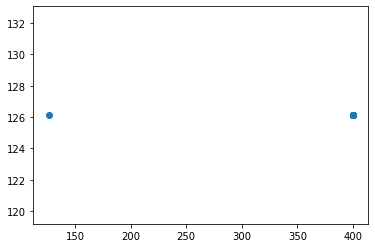

t+1 vs t-931


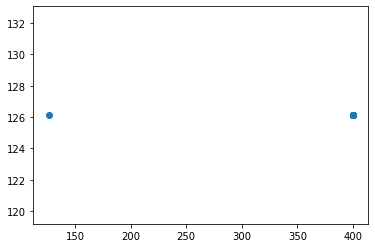

t+1 vs t-932


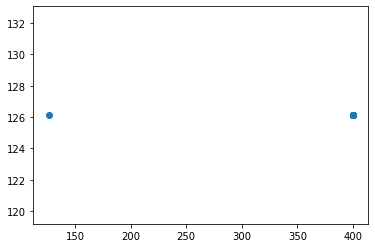

t+1 vs t-933


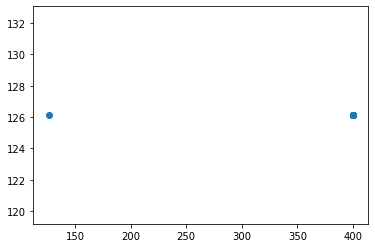

t+1 vs t-934


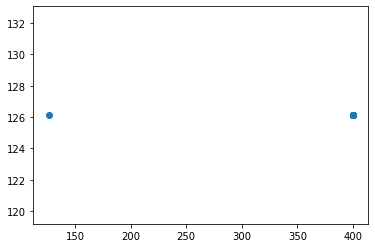

t+1 vs t-935


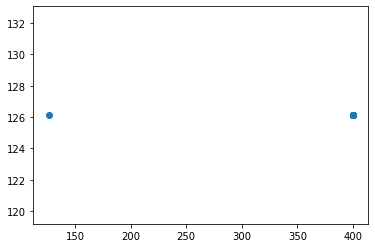

t+1 vs t-936


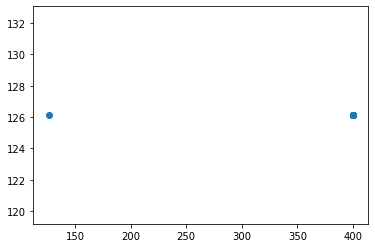

t+1 vs t-937


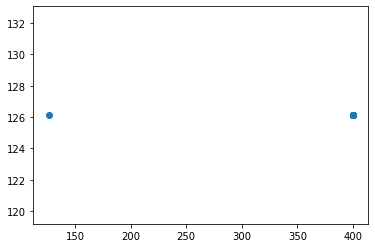

t+1 vs t-938


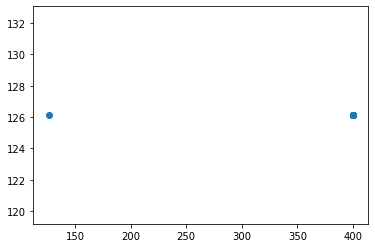

t+1 vs t-939


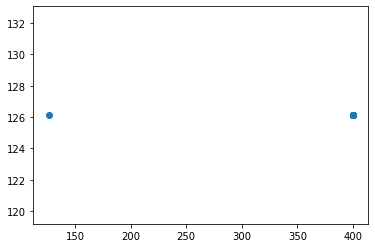

t+1 vs t-940


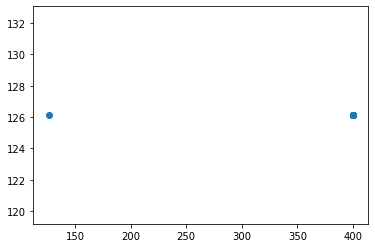

t+1 vs t-941


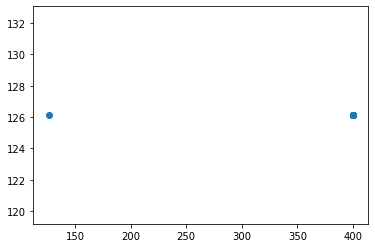

t+1 vs t-942


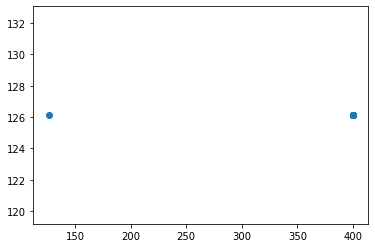

t+1 vs t-943


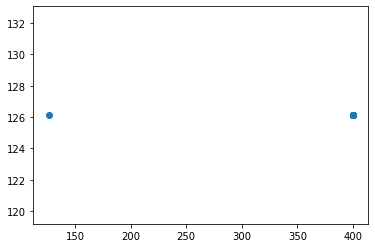

t+1 vs t-944


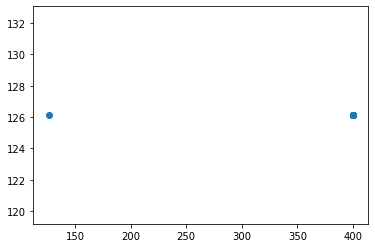

t+1 vs t-945


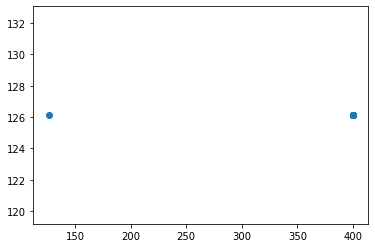

t+1 vs t-946


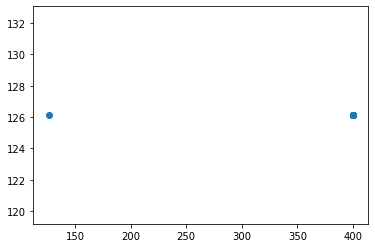

t+1 vs t-947


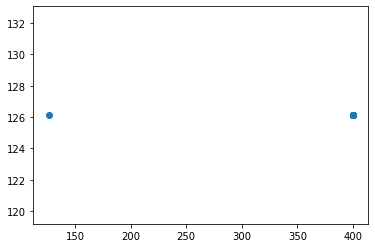

t+1 vs t-948


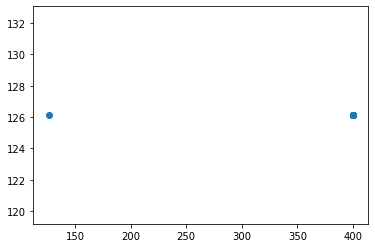

t+1 vs t-949


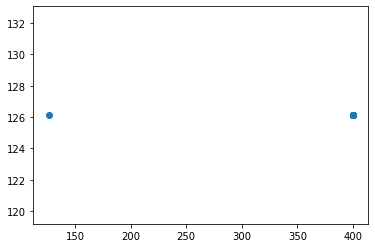

t+1 vs t-950


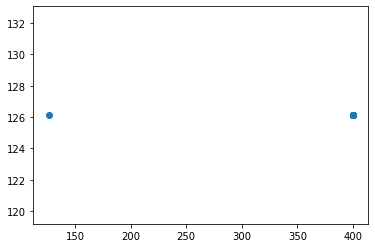

t+1 vs t-951


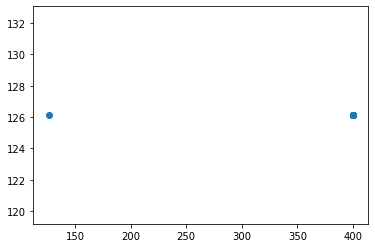

t+1 vs t-952


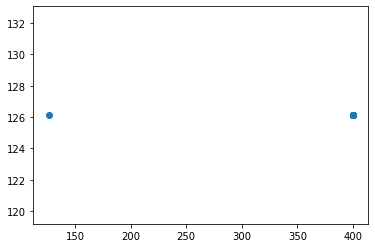

t+1 vs t-953


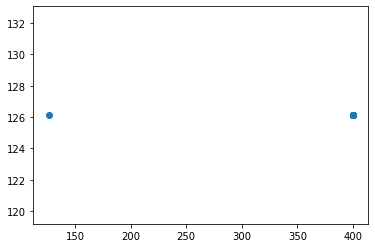

t+1 vs t-954


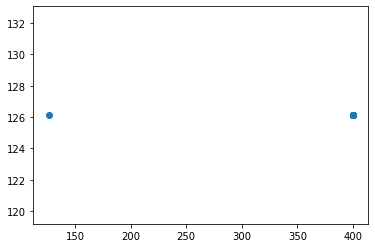

t+1 vs t-955


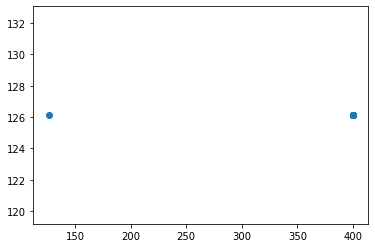

t+1 vs t-956


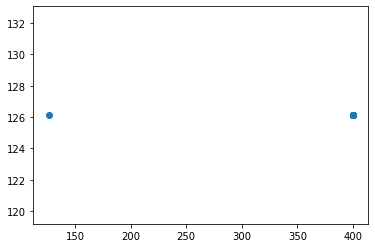

t+1 vs t-957


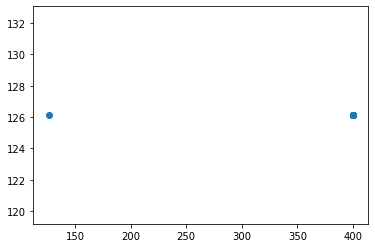

t+1 vs t-958


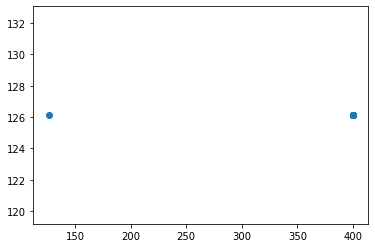

t+1 vs t-959


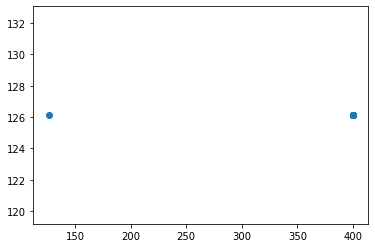

t+1 vs t-960


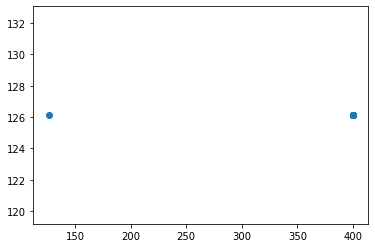

t+1 vs t-961


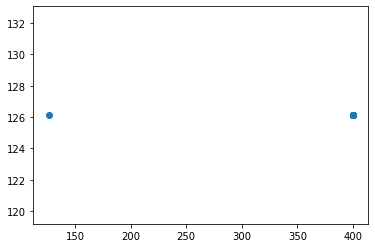

t+1 vs t-962


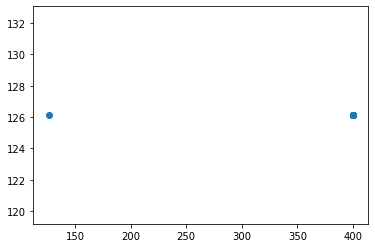

t+1 vs t-963


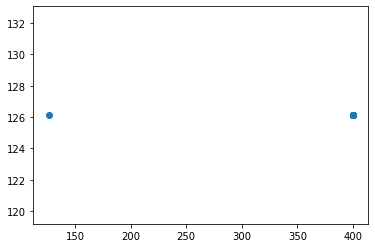

t+1 vs t-964


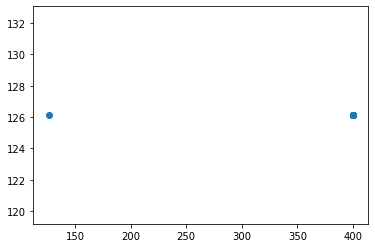

t+1 vs t-965


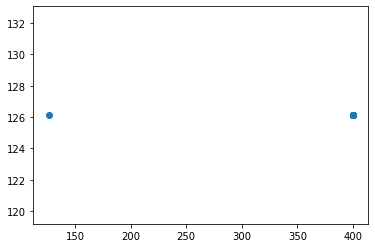

t+1 vs t-966


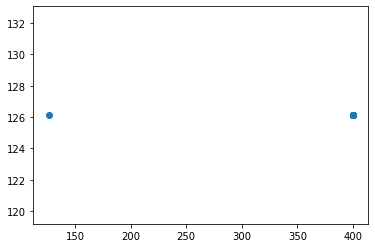

t+1 vs t-967


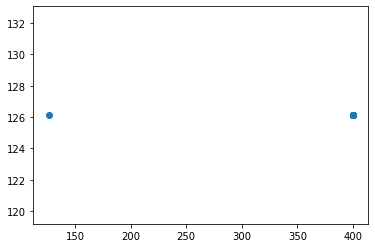

t+1 vs t-968


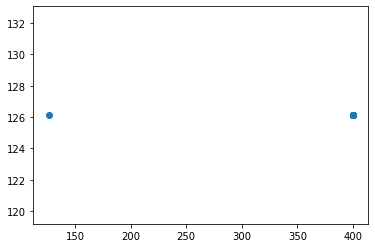

t+1 vs t-969


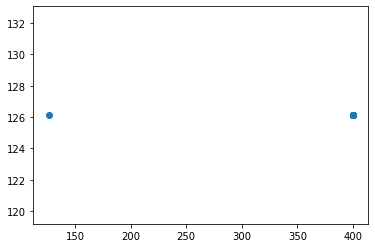

t+1 vs t-970


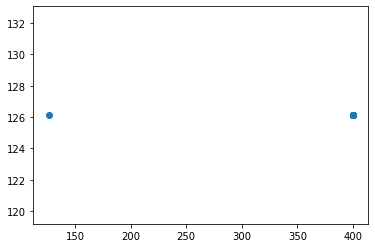

t+1 vs t-971


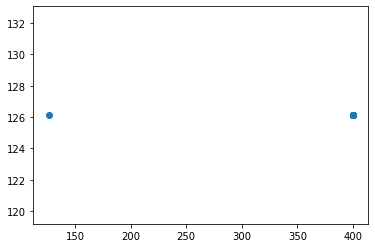

t+1 vs t-972


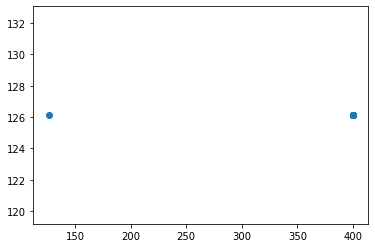

t+1 vs t-973


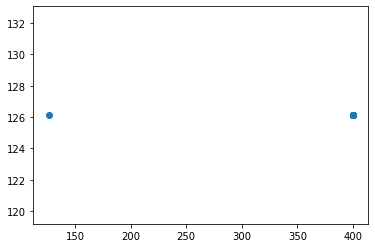

t+1 vs t-974


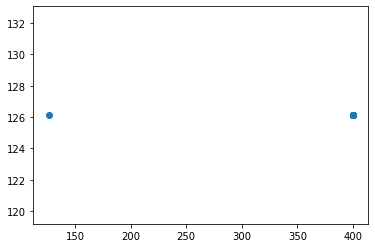

t+1 vs t-975


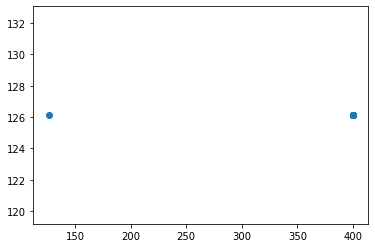

t+1 vs t-976


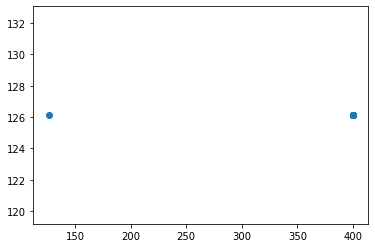

t+1 vs t-977


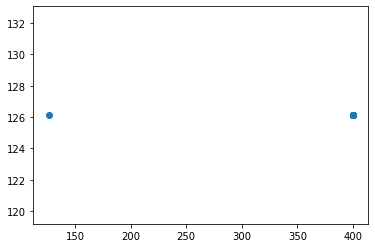

t+1 vs t-978


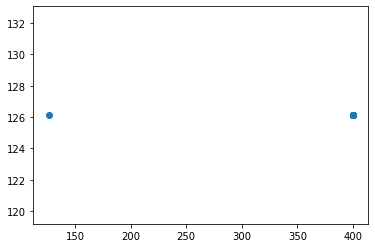

t+1 vs t-979


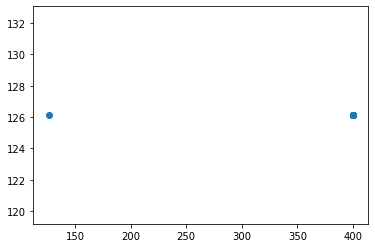

t+1 vs t-980


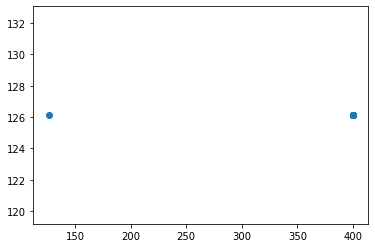

t+1 vs t-981


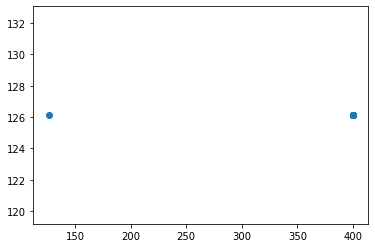

t+1 vs t-982


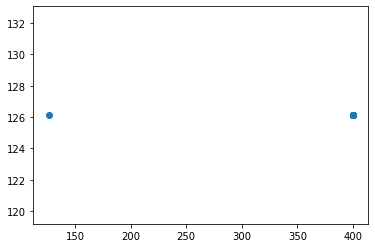

t+1 vs t-983


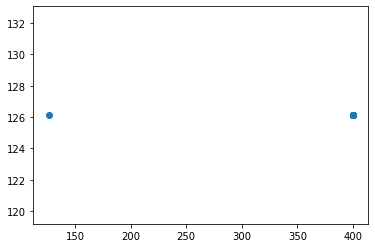

t+1 vs t-984


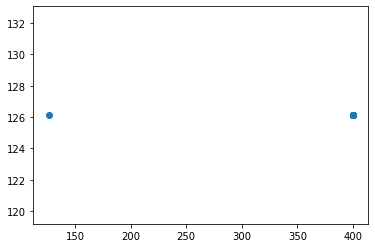

t+1 vs t-985


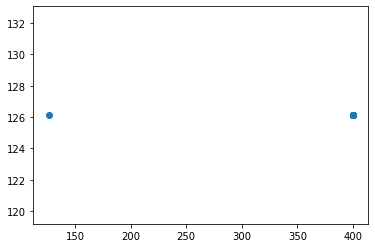

t+1 vs t-986


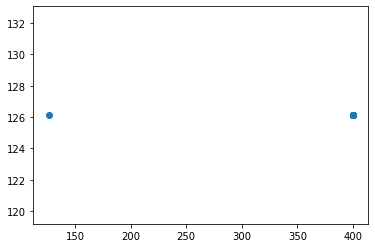

t+1 vs t-987


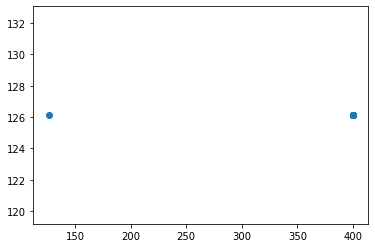

t+1 vs t-988


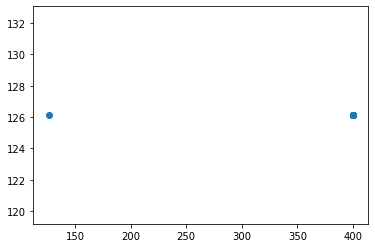

t+1 vs t-989


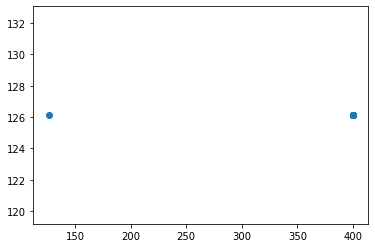

t+1 vs t-990


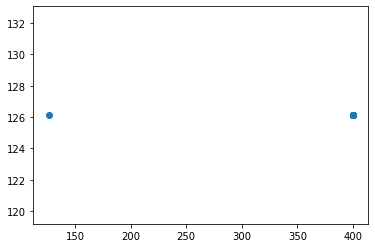

t+1 vs t-991


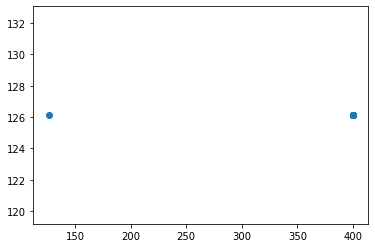

t+1 vs t-992


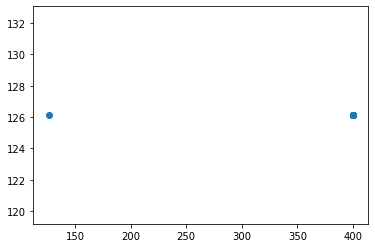

t+1 vs t-993


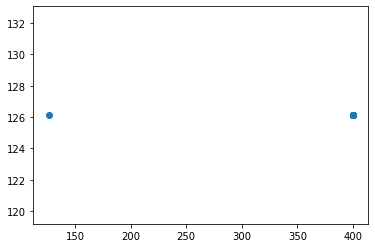

t+1 vs t-994


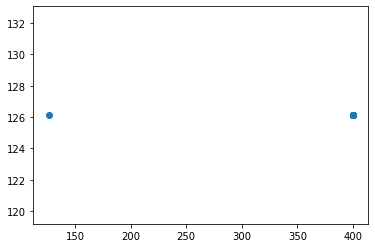

t+1 vs t-995


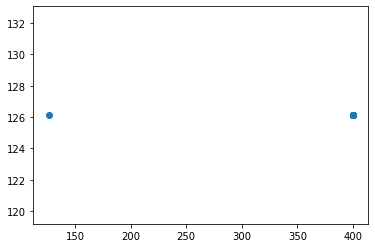

t+1 vs t-996


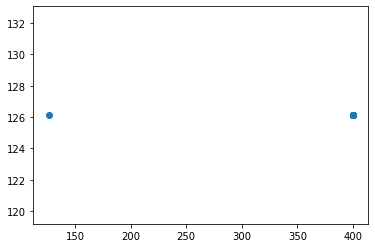

t+1 vs t-997


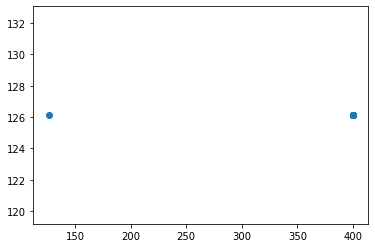

t+1 vs t-998


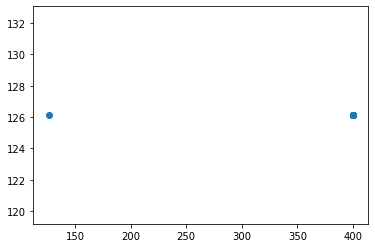

t+1 vs t-999


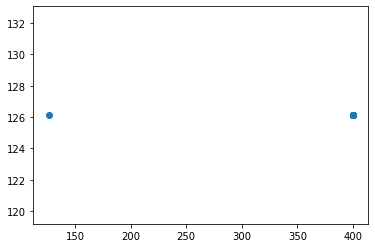

t+1 vs t-1000


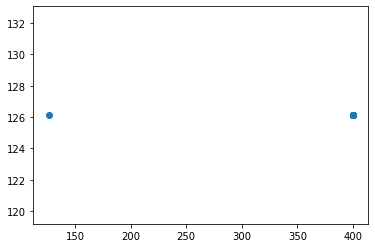

t+1 vs t-1001


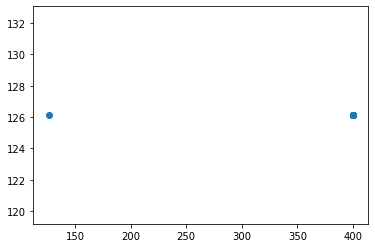

t+1 vs t-1002


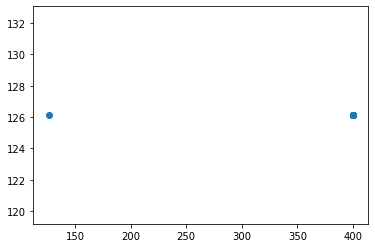

t+1 vs t-1003


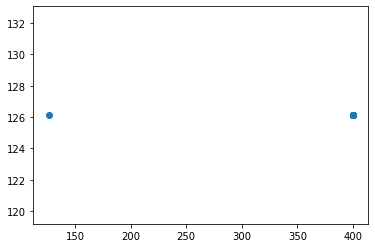

t+1 vs t-1004


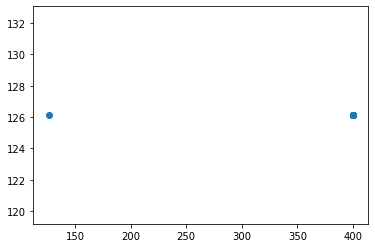

t+1 vs t-1005


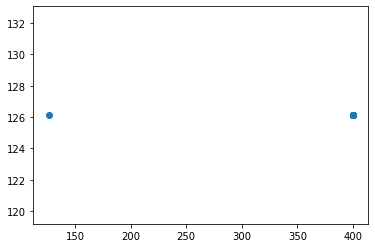

t+1 vs t-1006


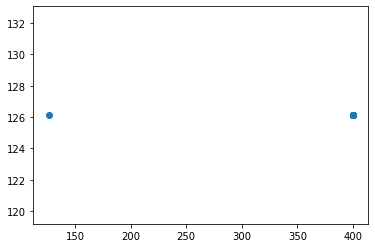

t+1 vs t-1007


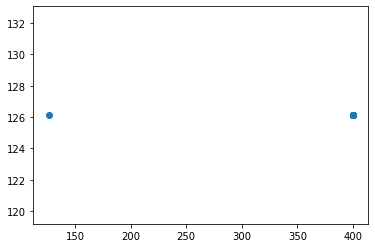

t+1 vs t-1008


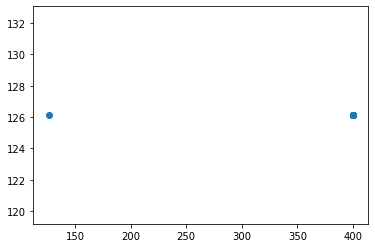

t+1 vs t-1009


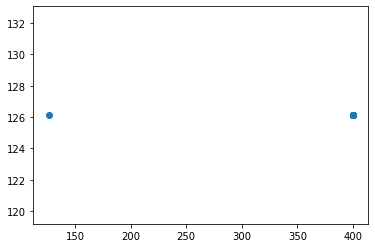

t+1 vs t-1010


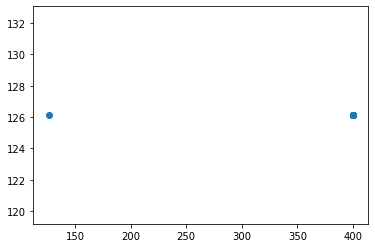

t+1 vs t-1011


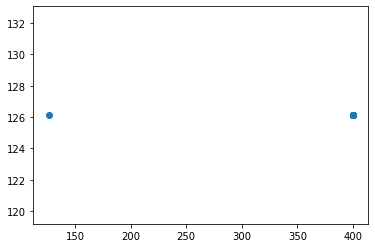

t+1 vs t-1012


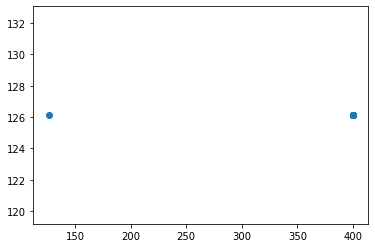

t+1 vs t-1013


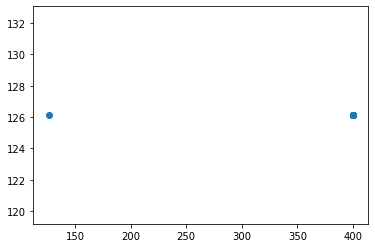

t+1 vs t-1014


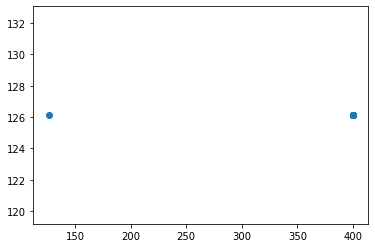

t+1 vs t-1015


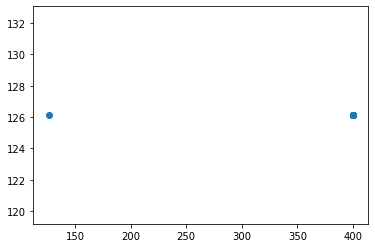

t+1 vs t-1016


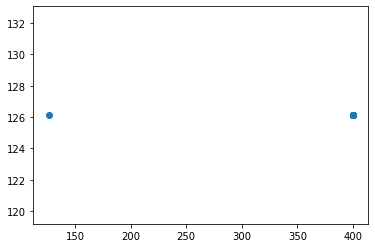

t+1 vs t-1017


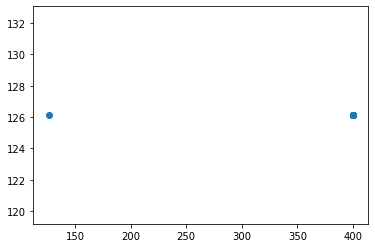

t+1 vs t-1018


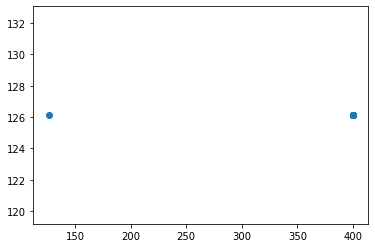

t+1 vs t-1019


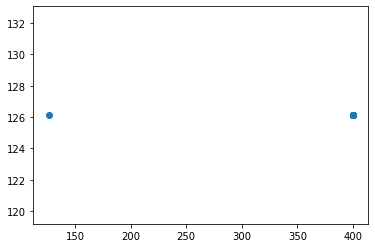

t+1 vs t-1020


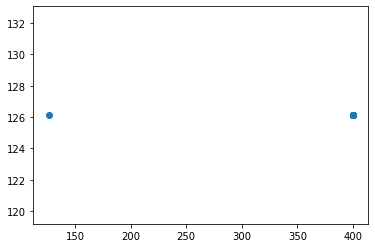

t+1 vs t-1021


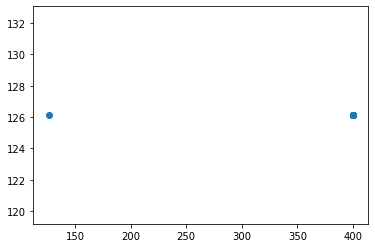

t+1 vs t-1022


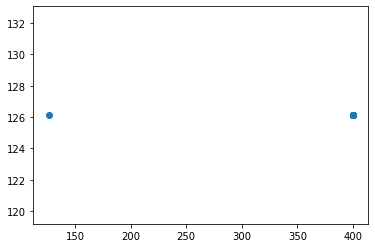

t+1 vs t-1023


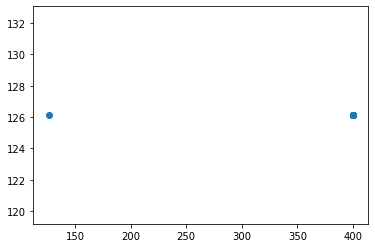

t+1 vs t-1024


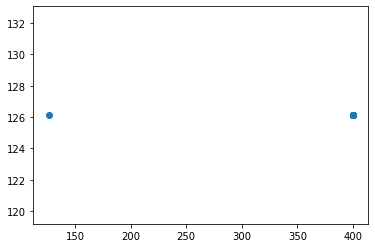

t+1 vs t-1025


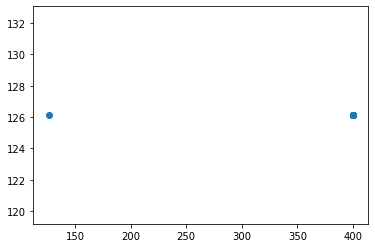

t+1 vs t-1026


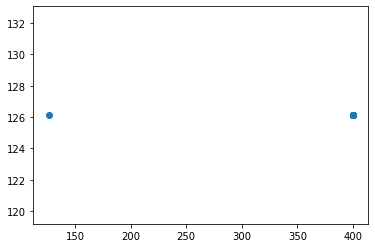

t+1 vs t-1027


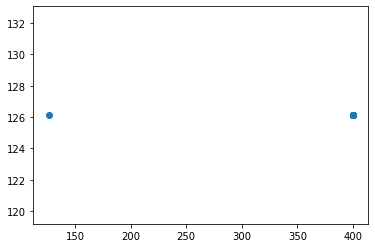

t+1 vs t-1028


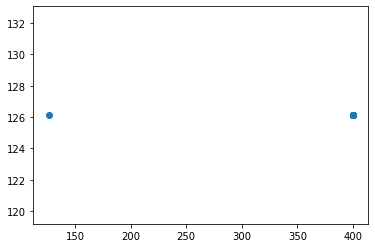

t+1 vs t-1029


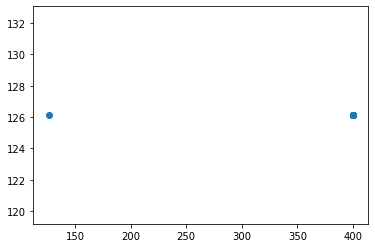

t+1 vs t-1030


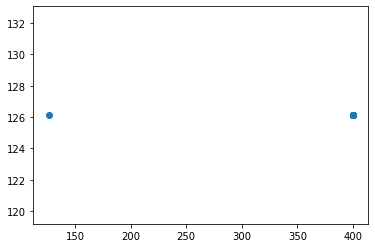

t+1 vs t-1031


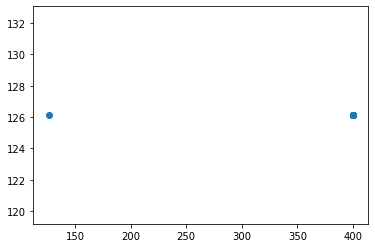

t+1 vs t-1032


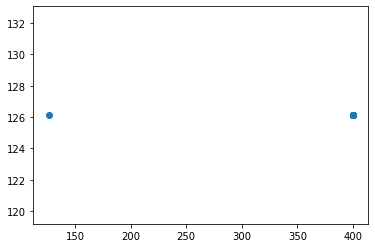

t+1 vs t-1033


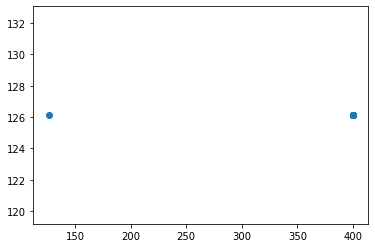

t+1 vs t-1034


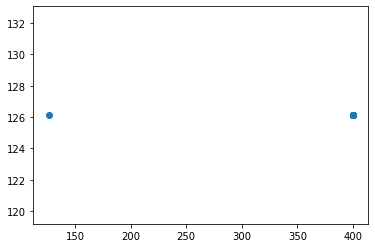

t+1 vs t-1035


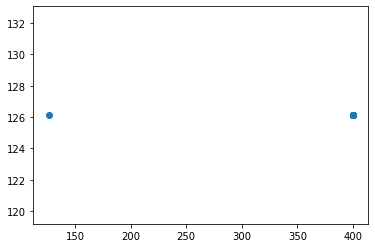

t+1 vs t-1036


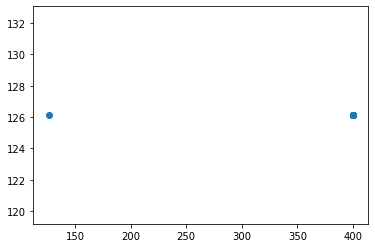

t+1 vs t-1037


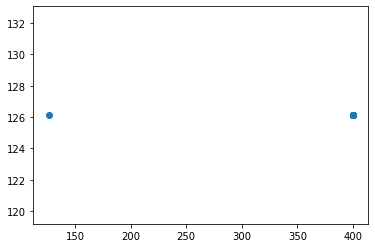

t+1 vs t-1038


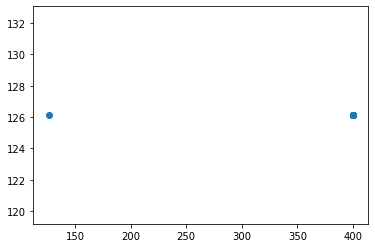

t+1 vs t-1039


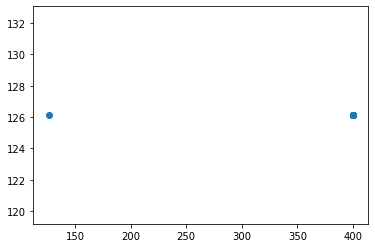

t+1 vs t-1040


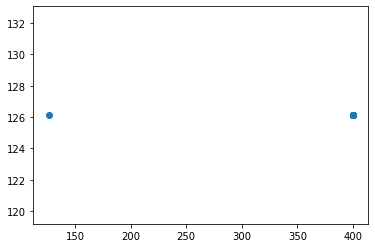

t+1 vs t-1041


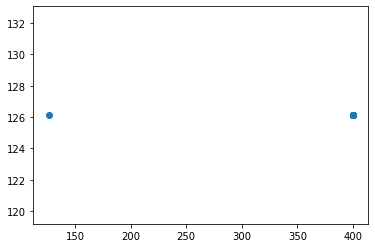

t+1 vs t-1042


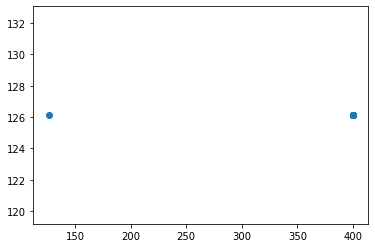

t+1 vs t-1043


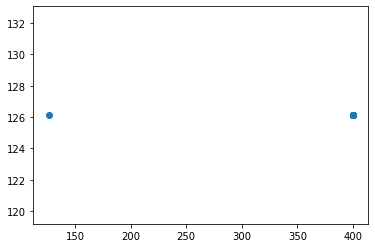

t+1 vs t-1044


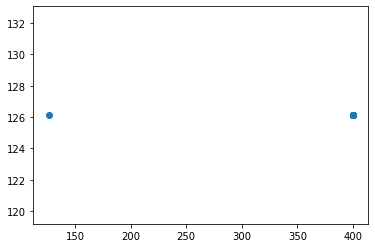

t+1 vs t-1045


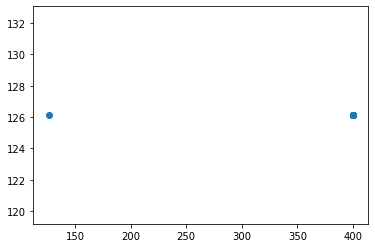

t+1 vs t-1046


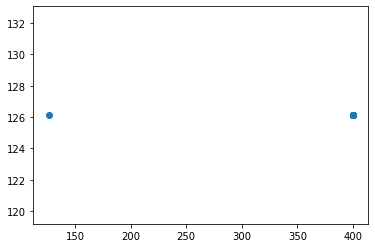

t+1 vs t-1047


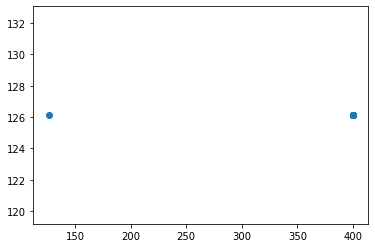

t+1 vs t-1048


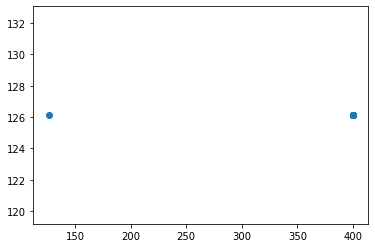

t+1 vs t-1049


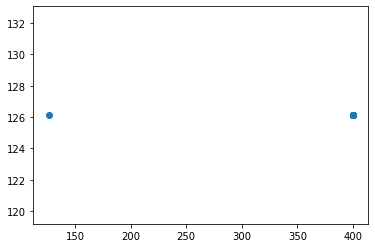

t+1 vs t-1050


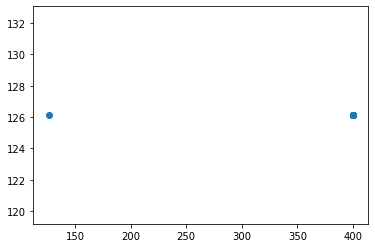

t+1 vs t-1051


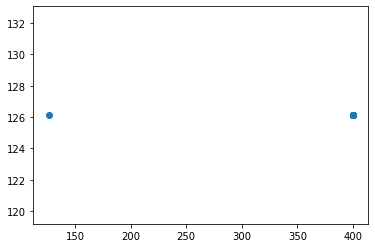

t+1 vs t-1052


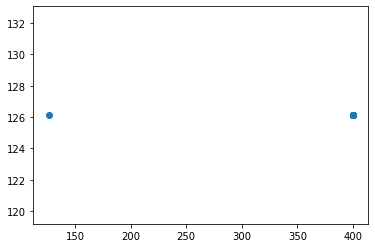

t+1 vs t-1053


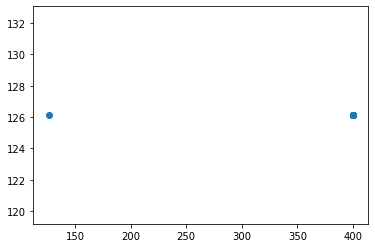

t+1 vs t-1054


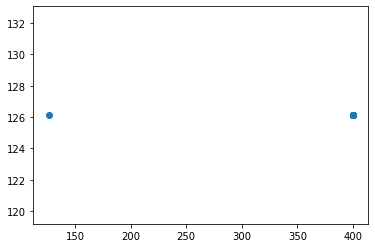

t+1 vs t-1055


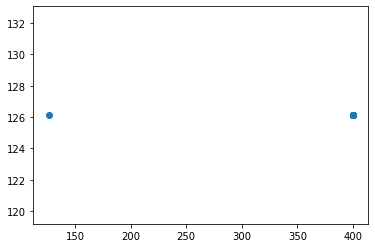

t+1 vs t-1056


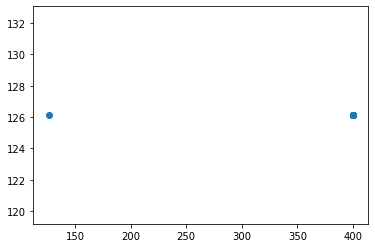

t+1 vs t-1057


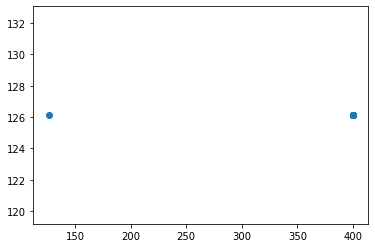

t+1 vs t-1058


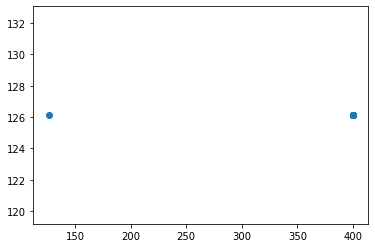

t+1 vs t-1059


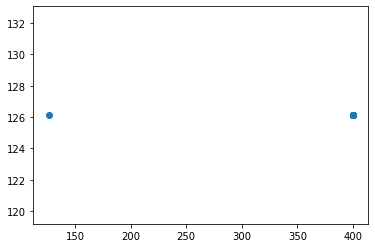

t+1 vs t-1060


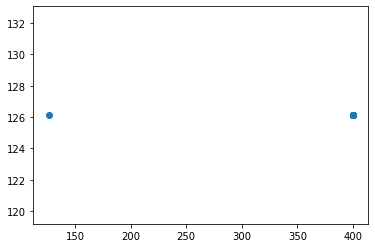

t+1 vs t-1061


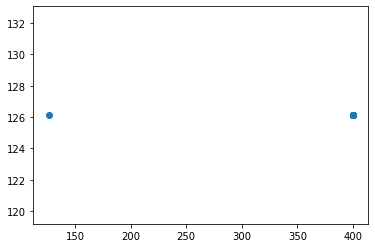

t+1 vs t-1062


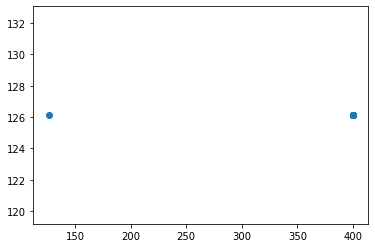

t+1 vs t-1063


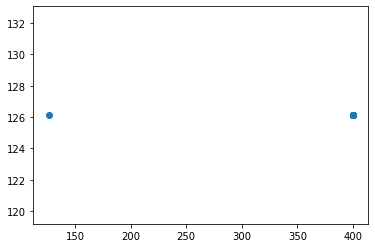

t+1 vs t-1064


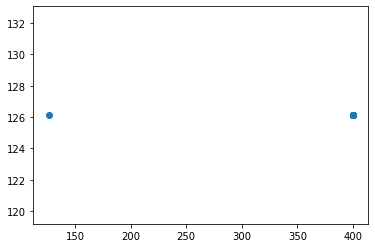

t+1 vs t-1065


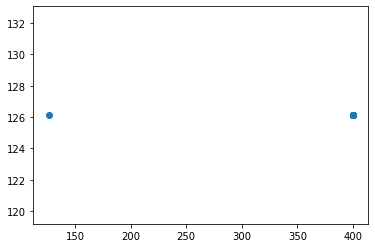

t+1 vs t-1066


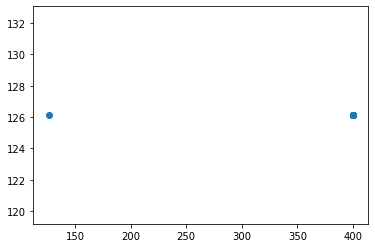

t+1 vs t-1067


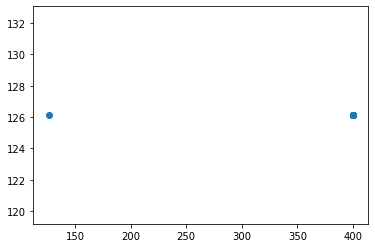

t+1 vs t-1068


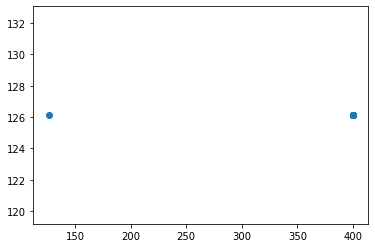

t+1 vs t-1069


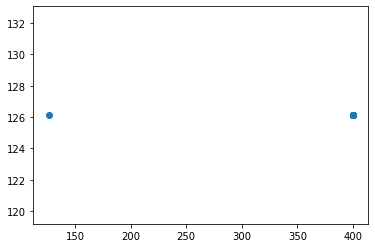

t+1 vs t-1070


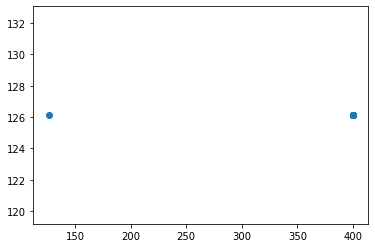

t+1 vs t-1071


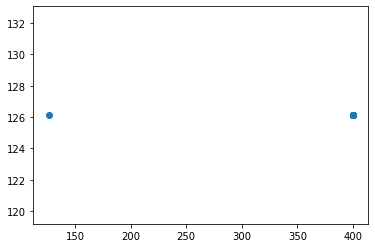

t+1 vs t-1072


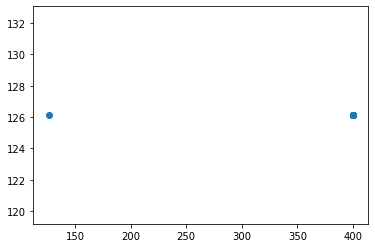

t+1 vs t-1073


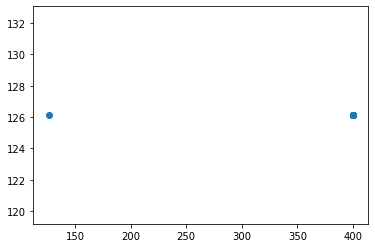

t+1 vs t-1074


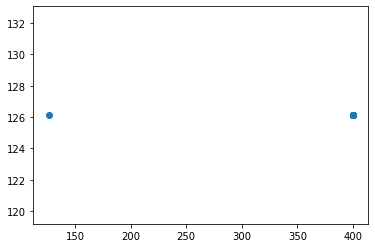

t+1 vs t-1075


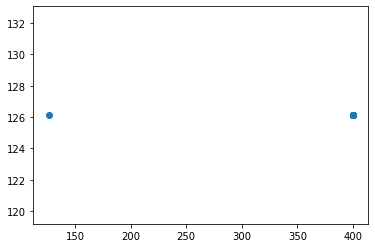

t+1 vs t-1076


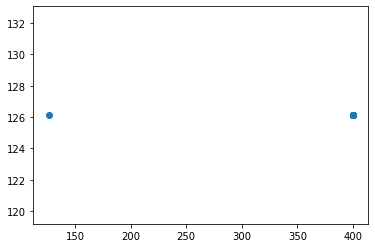

t+1 vs t-1077


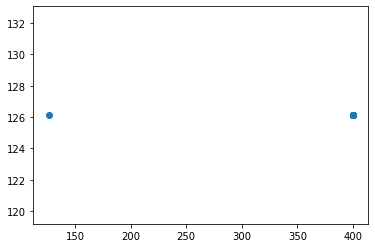

t+1 vs t-1078


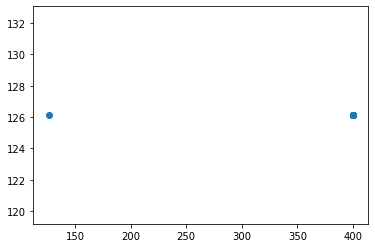

t+1 vs t-1079


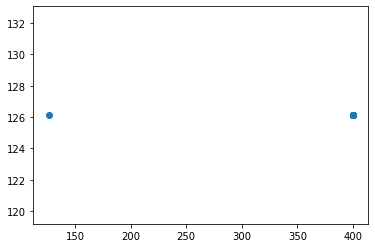

t+1 vs t-1080


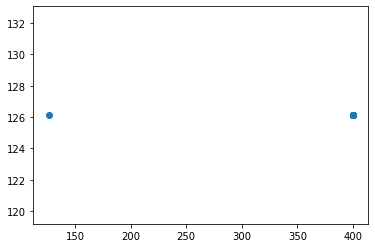

t+1 vs t-1081


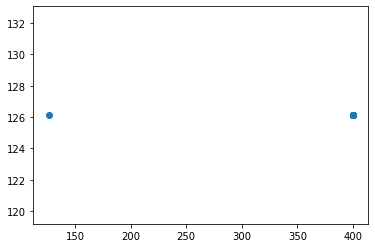

t+1 vs t-1082


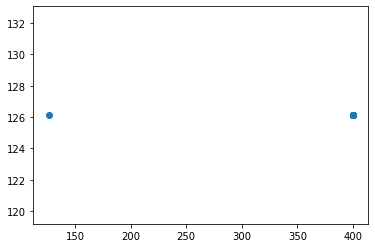

t+1 vs t-1083


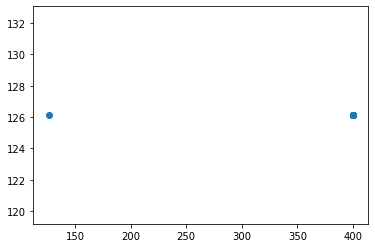

t+1 vs t-1084


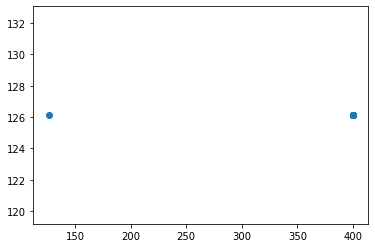

t+1 vs t-1085


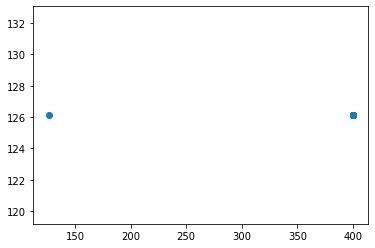

t+1 vs t-1086


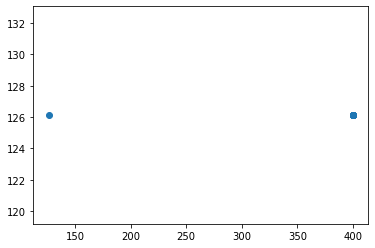

t+1 vs t-1087


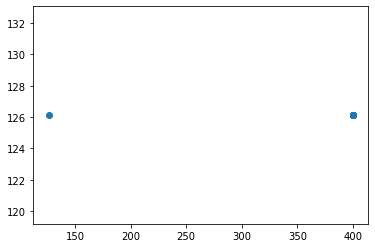

t+1 vs t-1088


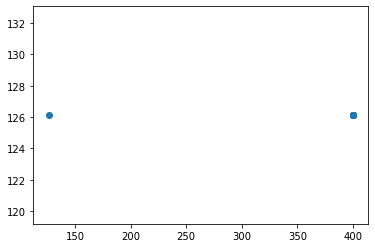

t+1 vs t-1089


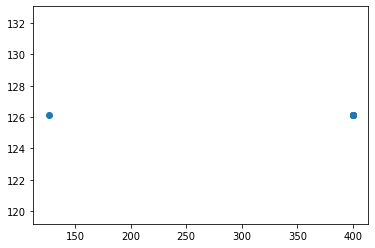

t+1 vs t-1090


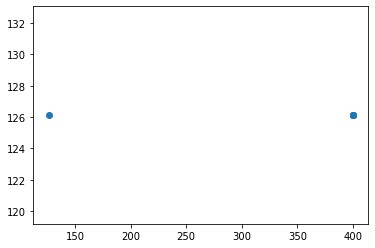

t+1 vs t-1091


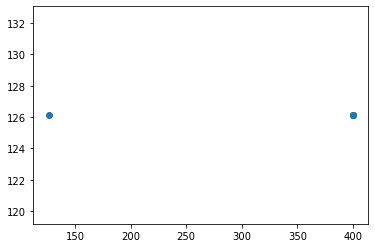

t+1 vs t-1092


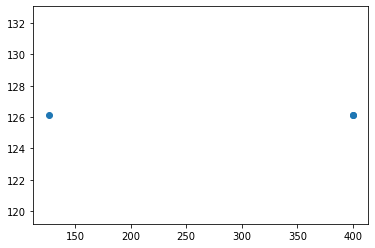

t+1 vs t-1093


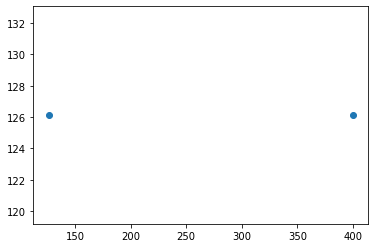

t+1 vs t-1094


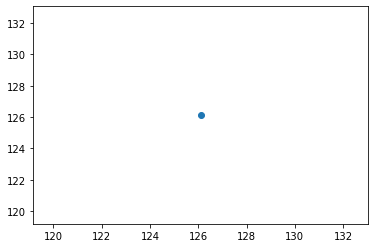

t+1 vs t-1095


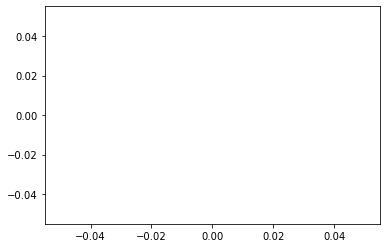

In [202]:
values = DataFrame(transacciones_78_3years_importe_df.values)
lags = transacciones_78_3years_importe_df.size
columns = [values]
for i in range(1,(lags + 1)):
	columns.append(values.shift(i))
dataframe = concat(columns, axis=1)
columns = ['t+1']
for i in range(1,(lags + 1)):
	columns.append('t-' + str(i))
dataframe.columns = columns
for i in range(1,(lags + 1)):
	print('t+1 vs t-' + str(i))
	pyplot.scatter(x=dataframe['t+1'].values, y=dataframe['t-'+str(i)].values)
	pyplot.show()

In [312]:
"""
Repetimos las mismas conclusiones en la correlacion de y(t+1) con sus 8 lags anteriores para la correlacion con todos sus
lags anteriores.
"""

'\nRepetimos las mismas conclusiones en la correlacion de y(t+1) con sus 8 lags anteriores para la correlacion con todos sus\nlags anteriores.\n'

In [313]:
# 6. Time Series Autocorrelation Plots

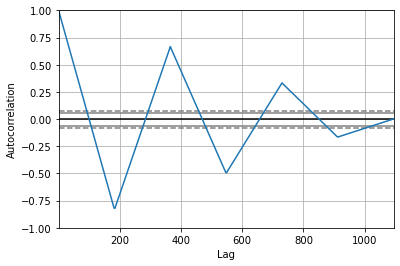

In [314]:
autocorrelation_plot(transacciones_78_3years_importe_df)
pyplot.show()

In [315]:
"""
Vemos que hay una alta correlacion positiva (mayor a 0.5) entre y(t+1) y sus 100 lags anteriores y entre el lag 300 y 500.
Vemos que hay una alta correlacion negativa (menor a 0.5) entre y(t+1) y los lags 175 a 225.

Vemos que hay fuertes ciclos de correlacion positiva y negativa. Esto captura la relación entre una observación con sus pasadas
observaciones y las mismas u opuestas estaciones o épocas del año.
Ondas como estas son un claro ejemplo de estacionalidad en la serie temporal.

CONCLUSION: Esta serie temporal es modelizable.
"""

'\nVemos que hay una alta correlacion positiva (mayor a 0.5) entre y(t+1) y sus 100 lags anteriores y entre el lag 300 y 500.\nVemos que hay una alta correlacion negativa (menor a 0.5) entre y(t+1) y los lags 175 a 225.\n\nVemos que hay fuertes ciclos de correlacion positiva y negativa. Esto captura la relación entre una observación con sus pasadas\nobservaciones y las mismas u opuestas estaciones o épocas del año.\nOndas como estas son un claro ejemplo de estacionalidad en la serie temporal.\n\nCONCLUSION: Esta serie temporal es modelizable.\n'

In [316]:
# HACEMOS EL DATAFRAME DEL DIA DE PAGO DEL SEGURO DEL COCHE

In [317]:
"""
mejor podemos hacer una columna con los dias que son de cobro (aquel cuyo importe varia con respecto al dia anterior) y 
calcular la diferencia entre dias y haciendo la serie temporal de la diferencia podemos sacar el siguiente día de cobro

la 1a observacion hay que forzarla a que sea dia de cobro
"""

'\nmejor podemos hacer una columna con los dias que son de cobro (aquel cuyo importe varia con respecto al dia anterior) y \ncalcular la diferencia entre dias y haciendo la serie temporal de la diferencia podemos sacar el siguiente día de cobro\n\nla 1a observacion hay que forzarla a que sea dia de cobro\n'

In [318]:
transacciones_78_3years_dia_df = transacciones_78_3years_df.copy()
transacciones_78_3years_dia_df

,IMPORTE
FECHA,
2016-10-12,126.13
2016-10-13,126.13
2016-10-14,126.13
2016-10-15,126.13
2016-10-16,126.13
...,...
2019-10-07,400.00
2019-10-08,400.00
2019-10-09,400.00


In [319]:
# hacemos una columna con la fecha a partir del índice
transacciones_78_3years_dia_df['FECHA'] = transacciones_78_3years_dia_df.index
transacciones_78_3years_dia_df

,IMPORTE,FECHA
FECHA,,
2016-10-12,126.13,2016-10-12
2016-10-13,126.13,2016-10-13
2016-10-14,126.13,2016-10-14
2016-10-15,126.13,2016-10-15
2016-10-16,126.13,2016-10-16
...,...,...
2019-10-07,400.00,2019-10-07
2019-10-08,400.00,2019-10-08
2019-10-09,400.00,2019-10-09


In [320]:
# creamos una columna IMPORTE_DIF para poner la diferencia del importe de una fila y su anterior
transacciones_78_3years_dia_df['IMPORTE_DIF'] = 0
transacciones_78_3years_dia_df

,IMPORTE,FECHA,IMPORTE_DIF
FECHA,,,
2016-10-12,126.13,2016-10-12,0
2016-10-13,126.13,2016-10-13,0
2016-10-14,126.13,2016-10-14,0
2016-10-15,126.13,2016-10-15,0
2016-10-16,126.13,2016-10-16,0
...,...,...,...
2019-10-07,400.00,2019-10-07,0
2019-10-08,400.00,2019-10-08,0
2019-10-09,400.00,2019-10-09,0


In [321]:
# reseteamos indice
transacciones_78_3years_dia_df.reset_index(drop=True, inplace=True)
transacciones_78_3years_dia_df

,IMPORTE,FECHA,IMPORTE_DIF
0,126.13,2016-10-12,0
1,126.13,2016-10-13,0
2,126.13,2016-10-14,0
3,126.13,2016-10-15,0
4,126.13,2016-10-16,0
...,...,...,...
1090,400.00,2019-10-07,0
1091,400.00,2019-10-08,0
1092,400.00,2019-10-09,0
1093,400.00,2019-10-10,0


In [322]:
# rellenamos la columna IMPORTE_DIF para cada fila con la diferencia entre su IMPORTE y el de la fila anterior
for i in range(transacciones_78_3years_dia_df.index[0],transacciones_78_3years_dia_df.index[-1]):
    transacciones_78_3years_dia_df.loc[i+1,'IMPORTE_DIF'] = transacciones_78_3years_dia_df.loc[i+1,'IMPORTE'] - \
    transacciones_78_3years_dia_df.loc[i,'IMPORTE']

transacciones_78_3years_dia_df

,IMPORTE,FECHA,IMPORTE_DIF
0,126.13,2016-10-12,0.0
1,126.13,2016-10-13,0.0
2,126.13,2016-10-14,0.0
3,126.13,2016-10-15,0.0
4,126.13,2016-10-16,0.0
...,...,...,...
1090,400.00,2019-10-07,0.0
1091,400.00,2019-10-08,0.0
1092,400.00,2019-10-09,0.0
1093,400.00,2019-10-10,0.0


In [323]:
# la 1a observacion siempre es un dia de cobro luego la asigno valor -99999 q es distinto de cero
transacciones_78_3years_dia_df.loc[0,'IMPORTE_DIF'] = -99999
transacciones_78_3years_dia_df

,IMPORTE,FECHA,IMPORTE_DIF
0,126.13,2016-10-12,-99999.0
1,126.13,2016-10-13,0.0
2,126.13,2016-10-14,0.0
3,126.13,2016-10-15,0.0
4,126.13,2016-10-16,0.0
...,...,...,...
1090,400.00,2019-10-07,0.0
1091,400.00,2019-10-08,0.0
1092,400.00,2019-10-09,0.0
1093,400.00,2019-10-10,0.0


In [324]:
# nos quedamos con aquellas transacciones que sean dia de cobro: IMPORTE_DIF != 0

In [325]:
transacciones_78_3years_dia_df = transacciones_78_3years_dia_df[transacciones_78_3years_dia_df['IMPORTE_DIF'] != 0.0]
transacciones_78_3years_dia_df

,IMPORTE,FECHA,IMPORTE_DIF
0,126.13,2016-10-12,-99999.00
180,400.00,2017-04-10,273.87
364,126.10,2017-10-11,-273.90
365,126.13,2017-10-12,0.03
545,400.00,2018-04-10,273.87
729,126.10,2018-10-11,-273.90
730,126.13,2018-10-12,0.03
910,400.00,2019-04-10,273.87
1094,126.10,2019-10-11,-273.90


In [326]:
# hago un reset del indice y calculo la diferencia entre dias de cobro

In [327]:
transacciones_78_3years_dia_df.dtypes

IMPORTE               float64
FECHA          datetime64[ns]
IMPORTE_DIF           float64
dtype: object

In [328]:
transacciones_78_3years_dia_df.reset_index(drop=True, inplace=True)
transacciones_78_3years_dia_df

,IMPORTE,FECHA,IMPORTE_DIF
0,126.13,2016-10-12,-99999.00
1,400.00,2017-04-10,273.87
2,126.10,2017-10-11,-273.90
3,126.13,2017-10-12,0.03
4,400.00,2018-04-10,273.87
5,126.10,2018-10-11,-273.90
6,126.13,2018-10-12,0.03
7,400.00,2019-04-10,273.87
8,126.10,2019-10-11,-273.90


In [329]:
for i in range(transacciones_78_3years_dia_df.index[0],transacciones_78_3years_dia_df.index[-1]):
    transacciones_78_3years_dia_df.loc[i,'FECHA_DIF'] = transacciones_78_3years_dia_df.loc[i+1,'FECHA'] - \
    transacciones_78_3years_dia_df.loc[i,'FECHA']

transacciones_78_3years_dia_df

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1599: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = infer_fill_value(value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


,IMPORTE,FECHA,IMPORTE_DIF,FECHA_DIF
0,126.13,2016-10-12,-99999.00,180 days
1,400.00,2017-04-10,273.87,184 days
2,126.10,2017-10-11,-273.90,1 days
3,126.13,2017-10-12,0.03,180 days
4,400.00,2018-04-10,273.87,184 days
5,126.10,2018-10-11,-273.90,1 days
6,126.13,2018-10-12,0.03,180 days
7,400.00,2019-04-10,273.87,184 days
8,126.10,2019-10-11,-273.90,NaT


In [330]:
"""
COMO GESTIONAR LA REPETICION DE AÑO. Cosas a tener en cuenta para modificar esta matriz:
- Nos quedamos con el valor de IMPORTE de la última fila (126.10 eur)
- Borramos la ultima fila
- Para aquellas filas cuyo IMPORTE sea igual al de la última fila (126.10 eur):
    + sumamos su valor FECHA_DIF al valor de la fila siguiente
    + el valor que tengan en FECHA lo ponemos en la siguiente fila 
    + borramos todas las filas con IMPORTE igual al de la ultima fila (incluida la ultima fila)
"""

'\nCOMO GESTIONAR LA REPETICION DE AÑO. Cosas a tener en cuenta para modificar esta matriz:\n- Nos quedamos con el valor de IMPORTE de la última fila (126.10 eur)\n- Borramos la ultima fila\n- Para aquellas filas cuyo IMPORTE sea igual al de la última fila (126.10 eur):\n    + sumamos su valor FECHA_DIF al valor de la fila siguiente\n    + el valor que tengan en FECHA lo ponemos en la siguiente fila \n    + borramos todas las filas con IMPORTE igual al de la ultima fila (incluida la ultima fila)\n'

In [331]:
# nos quedamos con el valor de IMPORTE de la última fila

In [332]:
importe_last_row = float(transacciones_78_3years_dia_df.iloc[[-1]]['IMPORTE'])
print(type(importe_last_row))
importe_last_row

<class 'float'>


126.1

In [333]:
# borramos la ultima fila
transacciones_78_3years_dia_df.drop(transacciones_78_3years_dia_df.tail(1).index, inplace=True)
transacciones_78_3years_dia_df

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,IMPORTE,FECHA,IMPORTE_DIF,FECHA_DIF
0,126.13,2016-10-12,-99999.00,180 days
1,400.00,2017-04-10,273.87,184 days
2,126.10,2017-10-11,-273.90,1 days
3,126.13,2017-10-12,0.03,180 days
4,400.00,2018-04-10,273.87,184 days
5,126.10,2018-10-11,-273.90,1 days
6,126.13,2018-10-12,0.03,180 days
7,400.00,2019-04-10,273.87,184 days


In [334]:
transacciones_78_3years_dia_df.dtypes

IMPORTE                float64
FECHA           datetime64[ns]
IMPORTE_DIF            float64
FECHA_DIF      timedelta64[ns]
dtype: object

In [335]:
transacciones_78_3years_dia_df['FECHA_DIF'] = transacciones_78_3years_dia_df['FECHA_DIF'].astype('timedelta64[D]')
transacciones_78_3years_dia_df

<ipython-input-335-a8b4bd75f1ea>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  transacciones_78_3years_dia_df['FECHA_DIF'] = transacciones_78_3years_dia_df['FECHA_DIF'].astype('timedelta64[D]')


,IMPORTE,FECHA,IMPORTE_DIF,FECHA_DIF
0,126.13,2016-10-12,-99999.00,180.0
1,400.00,2017-04-10,273.87,184.0
2,126.10,2017-10-11,-273.90,1.0
3,126.13,2017-10-12,0.03,180.0
4,400.00,2018-04-10,273.87,184.0
5,126.10,2018-10-11,-273.90,1.0
6,126.13,2018-10-12,0.03,180.0
7,400.00,2019-04-10,273.87,184.0


In [336]:
transacciones_78_3years_dia_df.dtypes

IMPORTE               float64
FECHA          datetime64[ns]
IMPORTE_DIF           float64
FECHA_DIF             float64
dtype: object

In [337]:
for i in range(transacciones_78_3years_dia_df.index[0],(transacciones_78_3years_dia_df.index[-1])):
    if float(transacciones_78_3years_dia_df.loc[i,'IMPORTE'] == importe_last_row):
        # para aquellas filas cuyo IMPORTE sea igual al de la última fila sumamos su valor FECHA_DIF 
        # al valor de la fila siguiente
        suma = float(transacciones_78_3years_dia_df.loc[i,'FECHA_DIF']) + float(transacciones_78_3years_dia_df.loc[i+1,'FECHA_DIF'])
        suma_np = numpy.float64(suma)
        transacciones_78_3years_dia_df.loc[i+1,'FECHA_DIF'] = suma_np
        # el valor que tengan en FECHA lo ponemos en la siguiente fila
        transacciones_78_3years_dia_df.loc[i+1,'FECHA'] = transacciones_78_3years_dia_df.loc[i,'FECHA']

transacciones_78_3years_dia_df

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


,IMPORTE,FECHA,IMPORTE_DIF,FECHA_DIF
0,126.13,2016-10-12,-99999.00,180.0
1,400.00,2017-04-10,273.87,184.0
2,126.10,2017-10-11,-273.90,1.0
3,126.13,2017-10-11,0.03,181.0
4,400.00,2018-04-10,273.87,184.0
5,126.10,2018-10-11,-273.90,1.0
6,126.13,2018-10-11,0.03,181.0
7,400.00,2019-04-10,273.87,184.0


In [338]:
# borramos todas las filas con IMPORTE igual al de la ultima fila (incluida la ultima fila)
for i in range(transacciones_78_3years_dia_df.index[0],(transacciones_78_3years_dia_df.index[-1])):
    if float(transacciones_78_3years_dia_df.loc[i,'IMPORTE'] == importe_last_row):
        transacciones_78_3years_dia_df.drop(index = i, inplace = True)

transacciones_78_3years_dia_df

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,IMPORTE,FECHA,IMPORTE_DIF,FECHA_DIF
0,126.13,2016-10-12,-99999.00,180.0
1,400.00,2017-04-10,273.87,184.0
3,126.13,2017-10-11,0.03,181.0
4,400.00,2018-04-10,273.87,184.0
6,126.13,2018-10-11,0.03,181.0
7,400.00,2019-04-10,273.87,184.0


In [339]:
# borramos las columnas IMPORTE e IMPORTE_DIF que ya no las vamos a usar
transacciones_78_3years_dia_df.drop(columns=['IMPORTE', 'IMPORTE_DIF'], inplace = True)
transacciones_78_3years_dia_df

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,FECHA,FECHA_DIF
0,2016-10-12,180.0
1,2017-04-10,184.0
3,2017-10-11,181.0
4,2018-04-10,184.0
6,2018-10-11,181.0
7,2019-04-10,184.0


In [340]:
# reseteamos el indice
transacciones_78_3years_dia_df.reset_index(drop=True, inplace=True)
transacciones_78_3years_dia_df

,FECHA,FECHA_DIF
0,2016-10-12,180.0
1,2017-04-10,184.0
2,2017-10-11,181.0
3,2018-04-10,184.0
4,2018-10-11,181.0
5,2019-04-10,184.0


In [341]:
# PARA PODER HACER LA SERIE TEMPORAL DE FECHAS DE COBROS DEBEMOS QUEDARNOS CON AÑOS COMPLETOS (habra 2)
# para quedarnos con años completos hacemos lo siguiente:
# 1-hacemos una columna con el año
# 2-contamos la cantidad de observaciones para cada uno de los años
# 3-nos quedamos con los años que más observaciones tengan (serán 2 años)
# 4-nos quedamos con el numero de observaciones que tengan estos años que estaran completos: n_obs
# 5-quitamos las filas que no sean de estos años
# 6-nos cojemos la n_obs ultimas filas del dataframe q seran las observaciones del ultimo año completo
# 7-las repetimos 2 años más sumando 1 año y 2 años a cada una de ellas y luego concatenamos al dataframe de fechas
# y con eso ya tenemos las proximas fechas de cobro aproximadas y con prophet podemos sacar el importe del recibo

# 8-y si con prophet sale mal la prediccion de importe por estar en un cambio entonces podemos predecir el importe igual
# q hemos predicho fechas a traves del dataframe pero simplemente cojiendo las n_obs ultimas observaciones y concatenandolas
# 2 veces.
# esto funciona para funcionalidades de n meses donde n sea un multiplo de 2 o 3 pq los años tienen 12 meses
# para periodicidades de 5, 7 u 11 meses este método no funciona

In [342]:
# 1-hacemos una columna con el año
transacciones_78_3years_dia_df['YEAR'] = transacciones_78_3years_dia_df['FECHA'].dt.year
transacciones_78_3years_dia_df

<ipython-input-342-fd10764a8cd0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  transacciones_78_3years_dia_df['YEAR'] = transacciones_78_3years_dia_df['FECHA'].dt.year


,FECHA,FECHA_DIF,YEAR
0,2016-10-12,180.0,2016
1,2017-04-10,184.0,2017
2,2017-10-11,181.0,2017
3,2018-04-10,184.0,2018
4,2018-10-11,181.0,2018
5,2019-04-10,184.0,2019


In [343]:
# 2-contamos la cantidad de observaciones para cada uno de los años

In [344]:
ocurrences_df = DataFrame(transacciones_78_3years_dia_df['YEAR'].value_counts())
ocurrences_df

,YEAR
2017,2
2018,2
2016,1
2019,1


In [345]:
max_ocurrences = ocurrences_df['YEAR'].max()
max_ocurrences

2

In [346]:
type(max_ocurrences)

int

In [347]:
# 3-nos quedamos con los años que más observaciones tengan (serán 2 años)

In [348]:
ocurrences_df.reset_index(drop=False, inplace=True)
ocurrences_df

,index,YEAR
0,2017,2
1,2018,2
2,2016,1
3,2019,1


In [349]:
ocurrences_df.rename(columns={"index":"YEAR", "YEAR":"OBS"}, inplace=True)
ocurrences_df

,YEAR,OBS
0,2017,2
1,2018,2
2,2016,1
3,2019,1


In [350]:
ocurrences_df.index

RangeIndex(start=0, stop=4, step=1)

In [351]:
# borramos todas las filas con OBS == max_ocurrences
for i in ocurrences_df.index:
    if int(ocurrences_df.loc[i,'OBS']) != max_ocurrences:
        ocurrences_df.drop(index = i, inplace = True)
        
ocurrences_df

,YEAR,OBS
0,2017,2
1,2018,2


In [352]:
# 4-nos quedamos con el numero de observaciones que tengan estos años que estaran completos: max_ocurrences

In [353]:
max_ocurrences

2

In [354]:
# 5-quitamos las filas que no sean de estos años

In [355]:
transacciones_78_3years_dia_df

,FECHA,FECHA_DIF,YEAR
0,2016-10-12,180.0,2016
1,2017-04-10,184.0,2017
2,2017-10-11,181.0,2017
3,2018-04-10,184.0,2018
4,2018-10-11,181.0,2018
5,2019-04-10,184.0,2019


In [356]:
list=[]

for i in transacciones_78_3years_dia_df.index:
    for j in ocurrences_df.index:
        if transacciones_78_3years_dia_df.loc[i,'YEAR'] == ocurrences_df.loc[j,'YEAR']:
            list.append(i)

list

[1, 2, 3, 4]

In [357]:
for i in transacciones_78_3years_dia_df.index:
    if not(i in list):
        transacciones_78_3years_dia_df.drop(index = i, inplace = True)

transacciones_78_3years_dia_df

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,FECHA,FECHA_DIF,YEAR
1,2017-04-10,184.0,2017
2,2017-10-11,181.0,2017
3,2018-04-10,184.0,2018
4,2018-10-11,181.0,2018


In [358]:
transacciones_78_3years_dia_df.reset_index(drop=True, inplace=True)
transacciones_78_3years_dia_df

,FECHA,FECHA_DIF,YEAR
0,2017-04-10,184.0,2017
1,2017-10-11,181.0,2017
2,2018-04-10,184.0,2018
3,2018-10-11,181.0,2018


In [359]:
# 6-nos cojemos la n_obs ultimas filas del dataframe q seran las observaciones del ultimo año completo

In [360]:
plus_1years_df = transacciones_78_3years_dia_df.iloc[-max_ocurrences:]
plus_1years_df

,FECHA,FECHA_DIF,YEAR
2,2018-04-10,184.0,2018
3,2018-10-11,181.0,2018


In [361]:
plus_2years_df = transacciones_78_3years_dia_df.iloc[-max_ocurrences:]
plus_2years_df

,FECHA,FECHA_DIF,YEAR
2,2018-04-10,184.0,2018
3,2018-10-11,181.0,2018


In [362]:
# 7-las repetimos 2 años más sumando 1 año y 2 años a cada una de ellas y luego concatenamos al dataframe de fechas
# y con eso ya tenemos las proximas fechas de cobro aproximadas y con prophet podemos sacar el importe del recibo

In [363]:
plus_1years_df.reset_index(drop=True, inplace=True)
plus_1years_df

,FECHA,FECHA_DIF,YEAR
0,2018-04-10,184.0,2018
1,2018-10-11,181.0,2018


In [364]:
plus_2years_df.reset_index(drop=True, inplace=True)
plus_2years_df

,FECHA,FECHA_DIF,YEAR
0,2018-04-10,184.0,2018
1,2018-10-11,181.0,2018


In [365]:
# podemos quitarnos columnas 'FECHA_DIF' y 'YEAR' de transacciones_78_3years_dia_df, plus_1years_df, plus_2years_df
# pq ya nos las vamos a necesitar

In [366]:
transacciones_78_3years_dia_df.drop(columns=['FECHA_DIF', 'YEAR'], inplace=True)
transacciones_78_3years_dia_df

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,FECHA
0,2017-04-10
1,2017-10-11
2,2018-04-10
3,2018-10-11


In [367]:
plus_1years_df.drop(columns=['FECHA_DIF', 'YEAR'], inplace=True)
plus_1years_df

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,FECHA
0,2018-04-10
1,2018-10-11


In [368]:
plus_2years_df.drop(columns=['FECHA_DIF', 'YEAR'], inplace=True)
plus_2years_df

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,FECHA
0,2018-04-10
1,2018-10-11


In [369]:
plus_1years_df.dtypes

FECHA    datetime64[ns]
dtype: object

In [370]:
# añadimos 1 año a plus_1years_df

In [371]:
for i in plus_1years_df.index:
    plus_1years_df.loc[i,'FECHA'] = plus_1years_df.loc[i,'FECHA'] + numpy.timedelta64(1, 'Y')

plus_1years_df

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:692: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


,FECHA
0,2019-04-10 05:49:12
1,2019-10-11 05:49:12


In [372]:
plus_1years_df['FECHA'] = to_datetime(plus_1years_df['FECHA'])
plus_1years_df

<ipython-input-372-f4a24a80694f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plus_1years_df['FECHA'] = to_datetime(plus_1years_df['FECHA'])


,FECHA
0,2019-04-10 05:49:12
1,2019-10-11 05:49:12


In [373]:
plus_1years_df['FECHA'] = plus_1years_df['FECHA'].dt.date
plus_1years_df

<ipython-input-373-c90124ba3d9a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plus_1years_df['FECHA'] = plus_1years_df['FECHA'].dt.date


,FECHA
0,2019-04-10
1,2019-10-11


In [374]:
plus_1years_df.dtypes

FECHA    object
dtype: object

In [375]:
plus_1years_df['FECHA'] = to_datetime(plus_1years_df['FECHA'])
plus_1years_df

<ipython-input-375-f4a24a80694f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plus_1years_df['FECHA'] = to_datetime(plus_1years_df['FECHA'])


,FECHA
0,2019-04-10
1,2019-10-11


In [376]:
plus_1years_df.dtypes

FECHA    datetime64[ns]
dtype: object

In [377]:
# añadimos 2 años a plus_2years_df

In [378]:
for i in plus_1years_df.index:
    plus_2years_df.loc[i,'FECHA'] = plus_2years_df.loc[i,'FECHA'] + numpy.timedelta64(2, 'Y')

plus_2years_df

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:692: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


,FECHA
0,2020-04-09 11:38:24
1,2020-10-10 11:38:24


In [379]:
plus_1years_df.dtypes

FECHA    datetime64[ns]
dtype: object

In [380]:
plus_2years_df['FECHA'] = plus_2years_df['FECHA'].dt.date
plus_2years_df

<ipython-input-380-b0581ad467b8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plus_2years_df['FECHA'] = plus_2years_df['FECHA'].dt.date


,FECHA
0,2020-04-09
1,2020-10-10


In [381]:
plus_2years_df.dtypes

FECHA    object
dtype: object

In [382]:
plus_2years_df['FECHA'] = to_datetime(plus_2years_df['FECHA'])
plus_2years_df

<ipython-input-382-c701dc40712a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plus_2years_df['FECHA'] = to_datetime(plus_2years_df['FECHA'])


,FECHA
0,2020-04-09
1,2020-10-10


In [383]:
plus_2years_df.dtypes

FECHA    datetime64[ns]
dtype: object

In [486]:
# concatenamos los 3 dataframes
transacciones_78_4years_dia_df =\
concat([transacciones_78_3years_dia_df, plus_1years_df, plus_2years_df], axis=0, ignore_index=True)
transacciones_78_4years_dia_df

,FECHA
0,2017-04-10
1,2017-10-11
2,2018-04-10
3,2018-10-11
4,2019-04-10
5,2019-10-11
6,2020-04-09
7,2020-10-10


In [487]:
# 8-y si con prophet sale mal la prediccion de importe por estar en un cambio entonces podemos predecir el importe igual
# q hemos predicho fechas a traves del dataframe pero simplemente cojiendo las n_obs ultimas observaciones y concatenandolas
# 2 veces.
# esto funciona para funcionalidades de n meses donde n sea un multiplo de 2 o 3 pq los años tienen 12 meses
# para periodicidades de 5, 7 u 11 meses este método no funciona

In [404]:
# CALCULAMOS CON FACEBOOK PROPHET LA SERIE TEMPORAL REAL DEL IMPORTE DE LOS RECIBOS DEL SEGURO DEL COCHE

In [432]:
prophet_train_df = transacciones_78_importe_df.copy()
prophet_train_df

,IMPORTE
2016-10-13,123.1
2016-10-14,123.1
2016-10-15,123.1
2016-10-16,123.1
2016-10-17,123.1
...,...
2019-10-07,400.0
2019-10-08,400.0
2019-10-09,400.0
2019-10-10,400.0


In [433]:
# Time Series Forecasting With Prophet in Python
# https://machinelearningmastery.com/time-series-forecasting-with-prophet-in-python/

In [434]:
# Fit Prophet Model

In [435]:
prophet_train_df.reset_index(inplace = True)
prophet_train_df

,index,IMPORTE
0,2016-10-13,123.1
1,2016-10-14,123.1
2,2016-10-15,123.1
3,2016-10-16,123.1
4,2016-10-17,123.1
...,...,...
1089,2019-10-07,400.0
1090,2019-10-08,400.0
1091,2019-10-09,400.0
1092,2019-10-10,400.0


In [436]:
# prepare expected column names
prophet_train_df.columns = ['ds', 'y']
prophet_train_df

,ds,y
0,2016-10-13,123.1
1,2016-10-14,123.1
2,2016-10-15,123.1
3,2016-10-16,123.1
4,2016-10-17,123.1
...,...,...
1089,2019-10-07,400.0
1090,2019-10-08,400.0
1091,2019-10-09,400.0
1092,2019-10-10,400.0


In [437]:
prophet_train_df.dtypes

ds    datetime64[ns]
y            float64
dtype: object

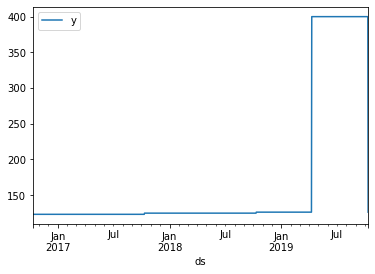

In [438]:
# gca stands for 'get current axis'
prophet_train_df.plot(kind='line', x='ds', y='y', ax=pyplot.gca())
pyplot.show()

In [439]:
# define the model
model = Prophet()

In [440]:
# fit the model
model.fit(prophet_train_df)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [441]:
# Make an In-Sample Forecast

In [442]:
# Vamos a hacer un In-Sample Forecast de las observaciones de las q tenemos datos desde el 2016-10-13 hasta el 2019-10-11

In [443]:
future_in_sample_df=prophet_train_df.copy()
future_in_sample_df

,ds,y
0,2016-10-13,123.1
1,2016-10-14,123.1
2,2016-10-15,123.1
3,2016-10-16,123.1
4,2016-10-17,123.1
...,...,...
1089,2019-10-07,400.0
1090,2019-10-08,400.0
1091,2019-10-09,400.0
1092,2019-10-10,400.0


In [444]:
future_in_sample_df=future_in_sample_df.drop(['y'], axis = 1)
future_in_sample_df

,ds
0,2016-10-13
1,2016-10-14
2,2016-10-15
3,2016-10-16
4,2016-10-17
...,...
1089,2019-10-07
1090,2019-10-08
1091,2019-10-09
1092,2019-10-10


In [445]:
# esta instruccion en realidad no haria falta pero la ponemos por metodologia
future_in_sample_df.reset_index(drop=True, inplace=True)
future_in_sample_df

,ds
0,2016-10-13
1,2016-10-14
2,2016-10-15
3,2016-10-16
4,2016-10-17
...,...
1089,2019-10-07
1090,2019-10-08
1091,2019-10-09
1092,2019-10-10


In [446]:
# use the model to make a forecast
forecast_df = model.predict(future_in_sample_df)

In [447]:
# summarize the forecast
print(forecast_df[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

             ds        yhat  yhat_lower  yhat_upper
0    2016-10-13  127.794263   88.394897  169.185274
1    2016-10-14  126.578590   83.755935  165.985588
2    2016-10-15  129.161737   90.491081  165.392521
3    2016-10-16  129.688340   87.412387  167.744537
4    2016-10-17  130.183512   89.698592  169.479194
...         ...         ...         ...         ...
1089 2019-10-07  438.347388  395.033356  477.155355
1090 2019-10-08  439.752657  399.882299  479.929277
1091 2019-10-09  443.039355  401.418173  481.994117
1092 2019-10-10  444.632692  403.880631  486.032635
1093 2019-10-11  444.584316  405.830317  482.952179

[1094 rows x 4 columns]


In [448]:
"""
Prophet also provides a built-in tool for visualizing the prediction in the context of the training dataset.

This can be achieved by calling the plot() function on the model and passing it a result DataFrame.
It will create a plot of the training dataset and overlay the prediction with the upper and lower bounds for the forecast dates.
"""

'\nProphet also provides a built-in tool for visualizing the prediction in the context of the training dataset.\n\nThis can be achieved by calling the plot() function on the model and passing it a result DataFrame.\nIt will create a plot of the training dataset and overlay the prediction with the upper and lower bounds for the forecast dates.\n'

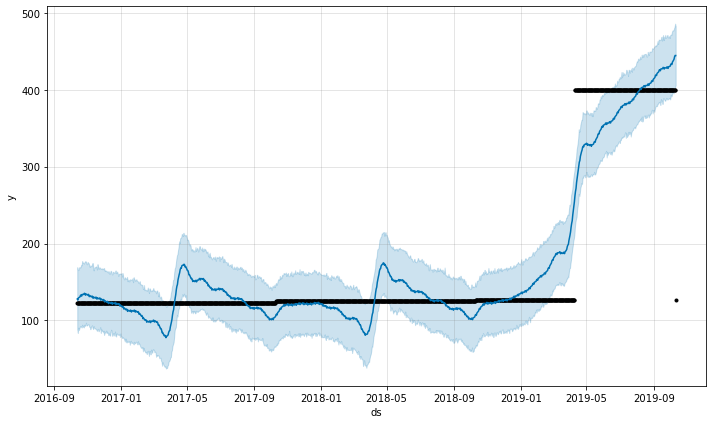

In [449]:
# plot forecast
model.plot(forecast_df)
pyplot.show()

In [451]:
"""
Vemos que la prediccion que hace prophet sobre los datos q ya ha visto es plausible pero menos aproximada que repitiendo
el ultimo año tres veces para atras
"""

'\nVemos que la prediccion que hace prophet sobre los datos q ya ha visto es plausible pero menos aproximada que repitiendo\nel ultimo año tres veces para atras\n'

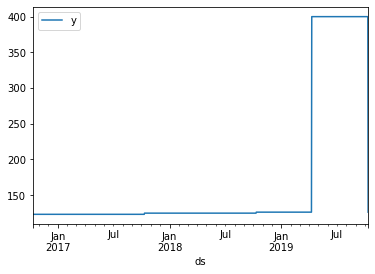

In [452]:
# gca stands for 'get current axis'
prophet_train_df.plot(kind='line', x='ds', y='y', ax=pyplot.gca())
pyplot.show()

In [454]:
# CALCULAMOS CON FACEBOOK PROPHET LA SERIE TEMPORAL DEL IMPORTE DE LOS RECIBOS DEL SEGURO DEL COCHE
# CON LOS DATOS DE LOS RECIBOS DE LOS 3 ULTIMOS AÑOS REPETIDOS HACIA ATRAS

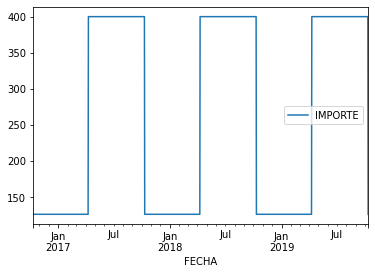

In [455]:
transacciones_78_3years_importe_df.plot()
pyplot.show()

In [456]:
prophet_train_df = transacciones_78_3years_importe_df.copy()
prophet_train_df

,IMPORTE
FECHA,
2016-10-12,126.13
2016-10-13,126.13
2016-10-14,126.13
2016-10-15,126.13
2016-10-16,126.13
...,...
2019-10-07,400.00
2019-10-08,400.00
2019-10-09,400.00


In [457]:
# Time Series Forecasting With Prophet in Python
# https://machinelearningmastery.com/time-series-forecasting-with-prophet-in-python/

In [458]:
# Fit Prophet Model

In [459]:
prophet_train_df.reset_index(inplace=True)
prophet_train_df

,FECHA,IMPORTE
0,2016-10-12,126.13
1,2016-10-13,126.13
2,2016-10-14,126.13
3,2016-10-15,126.13
4,2016-10-16,126.13
...,...,...
1090,2019-10-07,400.00
1091,2019-10-08,400.00
1092,2019-10-09,400.00
1093,2019-10-10,400.00


In [460]:
# prepare expected column names
prophet_train_df.columns = ['ds', 'y']
prophet_train_df

,ds,y
0,2016-10-12,126.13
1,2016-10-13,126.13
2,2016-10-14,126.13
3,2016-10-15,126.13
4,2016-10-16,126.13
...,...,...
1090,2019-10-07,400.00
1091,2019-10-08,400.00
1092,2019-10-09,400.00
1093,2019-10-10,400.00


In [461]:
prophet_train_df.dtypes

ds    datetime64[ns]
y            float64
dtype: object

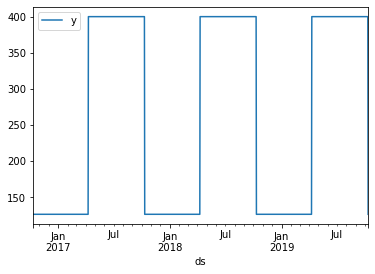

In [462]:
# gca stands for 'get current axis'
prophet_train_df.plot(kind='line', x='ds', y='y', ax=pyplot.gca())
pyplot.show()

In [463]:
# define the model
model = Prophet()

In [464]:
# fit the model
model.fit(prophet_train_df)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [465]:
# Make an In-Sample Forecast

In [466]:
# Vamos a hacer un In-Sample Forecast de las observaciones de las q tenemos datos desde el 2016-10-12 hasta el 2019-10-11

In [467]:
future_in_sample_df=prophet_train_df.copy()
future_in_sample_df

,ds,y
0,2016-10-12,126.13
1,2016-10-13,126.13
2,2016-10-14,126.13
3,2016-10-15,126.13
4,2016-10-16,126.13
...,...,...
1090,2019-10-07,400.00
1091,2019-10-08,400.00
1092,2019-10-09,400.00
1093,2019-10-10,400.00


In [468]:
future_in_sample_df=future_in_sample_df.drop(['y'], axis = 1)
future_in_sample_df

,ds
0,2016-10-12
1,2016-10-13
2,2016-10-14
3,2016-10-15
4,2016-10-16
...,...
1090,2019-10-07
1091,2019-10-08
1092,2019-10-09
1093,2019-10-10


In [469]:
# esta instruccion en realidad no haria falta pero la ponemos por metodologia
future_in_sample_df.reset_index(drop=True, inplace=True)
future_in_sample_df

,ds
0,2016-10-12
1,2016-10-13
2,2016-10-14
3,2016-10-15
4,2016-10-16
...,...
1090,2019-10-07
1091,2019-10-08
1092,2019-10-09
1093,2019-10-10


In [470]:
# use the model to make a forecast
forecast_df = model.predict(future_in_sample_df)

In [471]:
# summarize the forecast
print(forecast_df[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

             ds        yhat  yhat_lower  yhat_upper
0    2016-10-12  234.122021  199.111330  268.383845
1    2016-10-13  217.867811  183.128465  253.653589
2    2016-10-14  201.993551  168.047113  236.883930
3    2016-10-15  189.156819  154.999308  222.687716
4    2016-10-16  176.087160  141.212605  210.863226
...         ...         ...         ...         ...
1090 2019-10-07  322.835965  289.850062  360.411200
1091 2019-10-08  310.565140  277.396323  344.544985
1092 2019-10-09  295.410549  259.648837  332.827037
1093 2019-10-10  278.997933  246.380436  313.235804
1094 2019-10-11  262.425637  226.467492  298.293011

[1095 rows x 4 columns]


In [472]:
"""
Prophet also provides a built-in tool for visualizing the prediction in the context of the training dataset.

This can be achieved by calling the plot() function on the model and passing it a result DataFrame.
It will create a plot of the training dataset and overlay the prediction with the upper and lower bounds for the forecast dates.
"""

'\nProphet also provides a built-in tool for visualizing the prediction in the context of the training dataset.\n\nThis can be achieved by calling the plot() function on the model and passing it a result DataFrame.\nIt will create a plot of the training dataset and overlay the prediction with the upper and lower bounds for the forecast dates.\n'

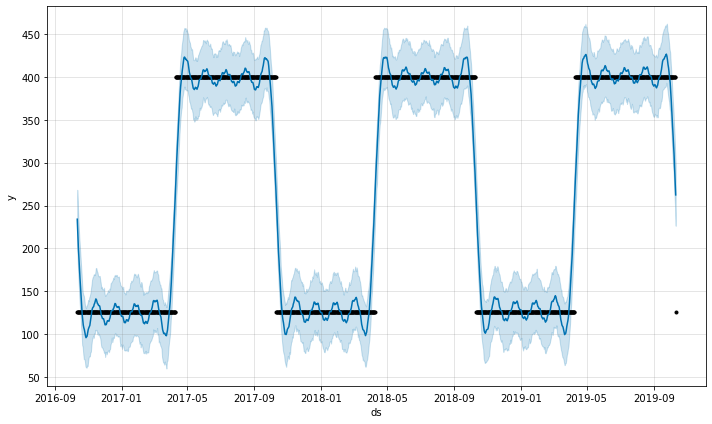

In [473]:
# plot forecast
model.plot(forecast_df)
pyplot.show()

In [476]:
"""
Ahora vemos que la prediccion de prophet es mucho más realista.
Lo que pasa es que prophet tarde un poco en adaptarse a los cambios repentinos de valor que es lo que conseguimos
rellenando los huecos con el ultimo valor valido.
Además que nosotros siempre vamos a pedir la prediccion a prophet justo en los cambios de valor que es justo cuando más error 
comete.

UNA SOLUCION PUEDE SER PEDIRLE A PROPHET UNA PREDICCION 15 DIAS DESPUES A LA FECHA ESTIMADA DEL PROXIMO RECIBO YA QUE LOS
RECIBOS SON MENSUALES
"""

'\nAhora vemos que la prediccion de prophet es mucho más realista.\nLo que pasa es que prophet tarde un poco en adaptarse a los cambios repentinos de valor que es lo que conseguimos\nrellenando los huecos con el ultimo valor valido.\nAdemás que nosotros siempre vamos a pedir la prediccion a prophet justo en los cambios de valor que es justo cuando más error \ncomete.\n\nUNA SOLUCION PUEDE SER PEDIRLE A PROPHET UNA PREDICCION 15 DIAS DESPUES A LA FECHA ESTIMADA DEL PROXIMO RECIBO YA QUE LOS\nRECIBOS SON MENSUALES\n'

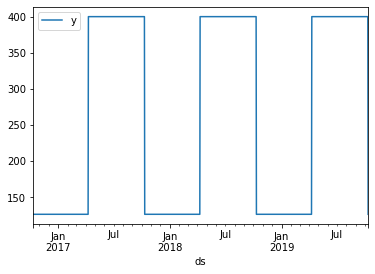

In [474]:
# gca stands for 'get current axis'
prophet_train_df.plot(kind='line', x='ds', y='y', ax=pyplot.gca())
pyplot.show()

In [482]:
# Vamos a pedirle a prohet que haga estimaciones sobre fechas para las que no tiene importe hasta la fecha del ultimo
# recibo estimado en el dataframe de prediccion de fechas de pago.

In [494]:
future_out_sample = transacciones_78_4years_dia_df.copy()
future_out_sample

,FECHA
0,2017-04-10
1,2017-10-11
2,2018-04-10
3,2018-10-11
4,2019-04-10
5,2019-10-11
6,2020-04-09
7,2020-10-10


In [495]:
idx = date_range(start=future_out_sample.FECHA.min(), end=future_out_sample.FECHA.max())
idx

DatetimeIndex(['2017-04-10', '2017-04-11', '2017-04-12', '2017-04-13',
               '2017-04-14', '2017-04-15', '2017-04-16', '2017-04-17',
               '2017-04-18', '2017-04-19',
               ...
               '2020-10-01', '2020-10-02', '2020-10-03', '2020-10-04',
               '2020-10-05', '2020-10-06', '2020-10-07', '2020-10-08',
               '2020-10-09', '2020-10-10'],
              dtype='datetime64[ns]', length=1280, freq='D')

In [496]:
future_out_sample.set_index('FECHA', drop=False, inplace=True)
future_out_sample

,FECHA
FECHA,
2017-04-10,2017-04-10
2017-10-11,2017-10-11
2018-04-10,2018-04-10
2018-10-11,2018-10-11
2019-04-10,2019-04-10
2019-10-11,2019-10-11
2020-04-09,2020-04-09
2020-10-10,2020-10-10


In [497]:
future_out_sample.index = DatetimeIndex(future_out_sample.index)
future_out_sample

,FECHA
FECHA,
2017-04-10,2017-04-10
2017-10-11,2017-10-11
2018-04-10,2018-04-10
2018-10-11,2018-10-11
2019-04-10,2019-04-10
2019-10-11,2019-10-11
2020-04-09,2020-04-09
2020-10-10,2020-10-10


In [498]:
future_out_sample.dtypes

FECHA    datetime64[ns]
dtype: object

In [500]:
type(future_out_sample.index)

pandas.core.indexes.datetimes.DatetimeIndex

In [501]:
type(future_out_sample.FECHA)

pandas.core.series.Series

In [507]:
future_out_sample['FECHA']

FECHA
2017-04-10   2017-04-10
2017-10-11   2017-10-11
2018-04-10   2018-04-10
2018-10-11   2018-10-11
2019-04-10   2019-04-10
2019-10-11   2019-10-11
2020-04-09   2020-04-09
2020-10-10   2020-10-10
Name: FECHA, dtype: datetime64[ns]

In [510]:
future_out_sample = future_out_sample.reindex(idx)
future_out_sample

,FECHA
2017-04-10,2017-04-10
2017-04-11,NaT
2017-04-12,NaT
2017-04-13,NaT
2017-04-14,NaT
...,...
2020-10-06,NaT
2020-10-07,NaT
2020-10-08,NaT
2020-10-09,NaT


In [514]:
future_out_sample['FECHA_INDEX'] = future_out_sample.index
future_out_sample

,FECHA,FECHA_INDEX
2017-04-10,2017-04-10,2017-04-10
2017-04-11,NaT,2017-04-11
2017-04-12,NaT,2017-04-12
2017-04-13,NaT,2017-04-13
2017-04-14,NaT,2017-04-14
...,...,...
2020-10-06,NaT,2020-10-06
2020-10-07,NaT,2020-10-07
2020-10-08,NaT,2020-10-08
2020-10-09,NaT,2020-10-09


In [518]:
future_out_sample.reset_index(drop=True, inplace=True)
future_out_sample

,FECHA,FECHA_INDEX
0,2017-04-10,2017-04-10
1,NaT,2017-04-11
2,NaT,2017-04-12
3,NaT,2017-04-13
4,NaT,2017-04-14
...,...,...
1275,NaT,2020-10-06
1276,NaT,2020-10-07
1277,NaT,2020-10-08
1278,NaT,2020-10-09


In [520]:
future_out_sample.drop(columns='FECHA', inplace=True)
future_out_sample

,FECHA_INDEX
0,2017-04-10
1,2017-04-11
2,2017-04-12
3,2017-04-13
4,2017-04-14
...,...
1275,2020-10-06
1276,2020-10-07
1277,2020-10-08
1278,2020-10-09


In [521]:
future_out_sample.columns = ['ds']
future_out_sample

,ds
0,2017-04-10
1,2017-04-11
2,2017-04-12
3,2017-04-13
4,2017-04-14
...,...
1275,2020-10-06
1276,2020-10-07
1277,2020-10-08
1278,2020-10-09


In [523]:
future_out_sample.dtypes

ds    datetime64[ns]
dtype: object

In [524]:
future_out_sample['ds']= to_datetime(future_out_sample['ds'])

In [525]:
future_out_sample.dtypes

ds    datetime64[ns]
dtype: object

In [526]:
# use the model to make a forecast
forecast_df = model.predict(future_out_sample)

In [527]:
# summarize the forecast
print(forecast_df[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

             ds        yhat  yhat_lower  yhat_upper
0    2017-04-10  274.504818  238.274678  310.619902
1    2017-04-11  291.075554  254.585616  325.145359
2    2017-04-12  304.910216  269.618637  342.285191
3    2017-04-13  317.360318  285.134189  353.323433
4    2017-04-14  329.252142  293.528142  363.949847
...         ...         ...         ...         ...
1275 2020-10-06  329.496627  295.928534  364.838434
1276 2020-10-07  314.908358  280.690174  346.549409
1277 2020-10-08  298.893395  262.974873  336.569891
1278 2020-10-09  282.542577  246.026830  314.202393
1279 2020-10-10  268.519063  234.241578  301.208048

[1280 rows x 4 columns]


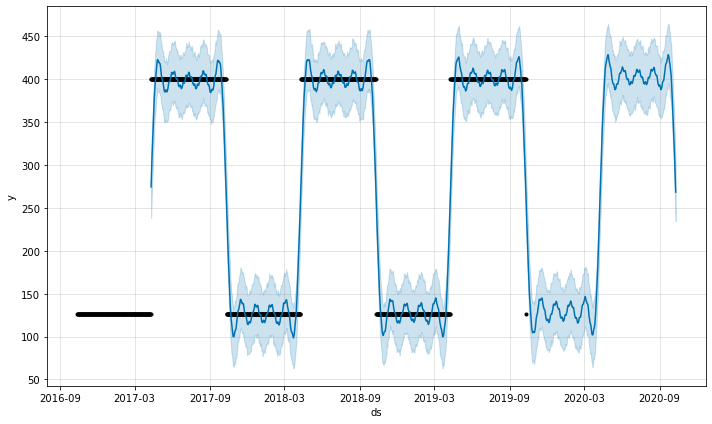

In [528]:
# plot forecast
model.plot(forecast_df)
pyplot.show()

In [529]:
"""
Vemos que la predicción con prophet sigue perfectamente los datos y la estacionalidad de la serie cuando esta tenia datos
que era lo que esperábamos que hiciera.
"""

'\nVemos que la predicción con prophet sigue perfectamente los datos y la estacionalidad de la serie cuando esta tenia datos\nque era lo que esperábamos que hiciera.\n'

In [533]:
"""
(1.1 2.1) A continuacion vamos a implementar el algoritmo final de estimación de la próxima fecha de cobro y el importe
aproximado de la fecha del recibo pidiendole a prophet la estimacion del importe 15 dias despues.

Hacer la predicción de esta manera tendrá una limitación: ¿que pasa si te pasan 2 recibos de seguro del coche en un mismo mes
separados menos de 15 dias?

(1.2 2.2) También repetiremos esta misma operación pero haciendo la estimación del importe del recibo mediante la serie temporal
calculada mediante la cuenta de la vieja y pidiendole la estimación del importe justo el día en que te pasan el recibo.
"""

'\n(1.1 2.1) A continuacion vamos a implementar el algoritmo final de estimación de la próxima fecha de cobro y el importe\naproximado de la fecha del recibo pidiendole a prophet la estimacion del importe 15 dias despues.\n\nHacer la predicción de esta manera tendrá una limitación: ¿que pasa si te pasan 2 recibos de seguro del coche en un mismo mes\nseparados menos de 15 dias?\n\n(1.2 2.2) También repetiremos esta misma operación pero haciendo la estimación del importe del recibo mediante la serie temporal\ncalculada mediante la cuenta de la vieja y pidiendole la estimación del importe justo el día en que te pasan el recibo.\n'

In [535]:
"""
2016-10-12 126.13 eur - 1a transaccion seguro coche
2019-10-11 126.10 eur - ultima transaccion seguro coche

2020-07-24 - ultima transaccion

Vamos a necesitar comprobar con prophet si hubo recibos en el ultimo año para determinar si habra recibos en el siguiente año
(para ello debemos guardar en un dataframe las fechas y los importes de los recibos de esa categoria)

Por ello haremos dos peticiones de próximo recibo:
(1.1 1.2)- calculada en la fecha de la ultima transaccion y teniendo en cuenta los recibos del ultimo año
(2.1 2.2)- 15 dias despues del pago del ultimo recibo para ver cuando es el siguiente

En ambos casos SOLO daremos aviso del próximo recibo en el caso de que lo pasen el mes siguiente al de la petición
(Imitando el caso del BBVA en el que el dia 20 de cada mes te avisan de los recibos que te van a pasar el mes siguiente).
"""

'\n2016-10-12 126.13 eur - 1a transaccion seguro coche\n2019-10-11 126.10 eur - ultima transaccion seguro coche\n\n2020-07-24 - ultima transaccion\n\nVamos a necesitar comprobar con prophet si hubo recibos en el ultimo año para determinar si habra recibos en el siguiente año\n(para ello debemos guardar en un dataframe las fechas y los importes de los recibos de esa categoria)\n\nPor ello haremos dos peticiones de próximo recibo:\n(1.1 1.2)- calculada en la fecha de la ultima transaccion y teniendo en cuenta los recibos del ultimo año\n(2.1 2.2)- 15 dias despues del pago del ultimo recibo para ver cuando es el siguiente\n\nEn ambos casos SOLO daremos aviso del próximo recibo en el caso de que lo pasen el mes siguiente al de la petición\n(Imitando el caso del BBVA en el que el dia 20 de cada mes te avisan de los recibos que te van a pasar el mes siguiente).\n'

In [536]:
"""
Las 4 pruebas descritas anteriormente ya las haces en un note book nuevo para tenerlo todo más ordenado
"""

'\nLas 4 pruebas descritas anteriormente ya las haces en un note book nuevo para tenerlo todo más ordenado\n'